# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX

Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool'

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, '

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
configs length  1100
end of file: run.py


In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 11, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16,

addliq - Sq delta S 4544.466729894215
POOL ADD LIQUIDITY Timestep ===  10 delta W  4343.7905455307255
addliq - Sq delta Sq 4645.345525036919 
addliq - Sq delta Sq4746.414501448033addliq - Sq delta Saddliq - Sq delta Sq 
 4923.027334292863addliq - Sq delta S 4645.345525036919 4746.414501448033
POOL ADD LIQUIDITY Timestep ===  10 delta W  4541.831758523695
4560.833826069851

addliq - Sq delta S 4923.027334292864
POOL ADD LIQUIDITY Timestep ===  10 delta W  4713.826165766882
POOL ADD LIQUIDITY Timestep ===  10
 delta W  addliq - Sq delta S4443.73295437929 4560.833826069851

addliq - Sq delta Sq 4561.837157985945
addliq - Sq delta S 4561.837157985945
POOL ADD LIQUIDITY Timestep ===  10 POOL ADD LIQUIDITY Timestep ===  10addliq - Sq delta Sq delta W delta W  4932.162687062516
addliq - Sq delta S 4932.162687062515
POOL ADD LIQUIDITY Timestep ===  10   4367.487420427292delta W 
addliq - Sq delta Sq4366.325755151811 
4550.175868912998 4717.71242137968

addliq - Sq delta S 4550.175868912998
POO

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3466.812511453743 delta S  4712
POOL REMOVE LIQUIDITY share fraction of pool = 0.1912213296039927
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30602964576668834
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30602964576668834
154712.0addliq - Sq delta Sqaddliq - Sq delta Sq 4492.228834727157
addliq - Sq delta S 4492.228834727157
POOL ADD LIQUIDITY Timestep ===  10 delta W  4309.196207385938

addliq - Sq delta Sqaddliq - Sq delta Sq  4726.454857572333
addliq - Sq delta S 4726.454857572333
POOL ADD LIQUIDITY Timestep ===  105014.4825834738185
addliq - Sq delta S 5014.482583473819
POOL ADD LIQUIDITY Timestep ===  10 delta W  4803.528178524282
 4647.180402183581
addliq - Sq delta S 4647.18040218358
 delta W  4520.294662968964
POOL ADD LIQUIDITY Timestep === 154721.0
POOL REMOVE LIQUIDITY Timestep ===  90  delta W 10 delta W  4445.91804270924
154710.0 3458.69205776846 delta S  4721
POOL REMOVE LIQUIDITY share fraction of pool = 0.190

154756.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Saddliq - Sq delta Sq 4833.706405984383
addliq - Sq delta S 4833.706405984383
  4829.138136188072
POOL ADD LIQUIDITY Timestep ===  10 delta W  4626.51715290801
POOL ADD LIQUIDITY Timestep ===  90 delta W  3500.0610416043796 delta S  4756
POOL REMOVE LIQUIDITY share fraction of pool = 0.1915689042186027
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30374955644936685
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30374955644936685
154756.0
10 delta W  4623.080479819581
addliq - Sq delta Sq 4650.776470008844
addliq - Sq delta S 4650.776470008845
POOL ADD LIQUIDITY Timestep ===  10 delta W  4449.9703772219345
addliq - Sq delta Sq154767.0
 4734.936385838649154631.0
addliq - Sq delta S 4734.93638583865
POOL ADD LIQUIDITY Timestep ===  10 delta W  4534.296491017226

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3500.7181818663835 delta S  4767
POOL REMOVE LIQUIDITY share fraction of poo

154763.0154809.0
POOL REMOVE LIQUIDITY Timestep ===  90 90
POOL REMOVE LIQUIDITY Timestep === delta W   
154666.0
POOL REMOVE LIQUIDITY Timestep === 3499.017670956977addliq - Sq delta Sq  90 delta W 90    delta S  4764
POOL REMOVE LIQUIDITY share fraction of pool = 0.19255292959623338
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3116533494984016
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3116533494984016
154764.0delta W 154758.0delta W  
3417.501634377583
3527.962002445792 delta S  4809
POOL REMOVE LIQUIDITY share fraction of pool = 0.19360411643766237
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3230755245014759
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3230755245014759
154809.0 4748.522855513099
addliq - Sq delta S3478.0995733291024
POOL REMOVE LIQUIDITY Timestep ===    delta S  90 delta W  3481.3457688413855 delta S  4758
POOL REMOVE LIQUIDITY share fraction of pool = 0.19171508305899065
POOL REMOVE LIQUIDITY share fraction of reserve = 0.314128365135386

 90 delta W  3526.148513385882 delta S  4807
POOL REMOVE LIQUIDITY share fraction of pool = 0.19358767743724764
POOL REMOVE LIQUIDITY share fraction of reserve = 0.313899545432339
POOL REMOVE LIQUIDITY weight fraction of pool = 0.313899545432339
154807.010 delta W  4537.5765568200995

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  4637.887933552107
addliq - Sq delta S 4637.887933552106
POOL ADD LIQUIDITY Timestep ===  10 delta W  4434.0970197426095
 90 delta W 154765.0 
3470.85758497423POOL REMOVE LIQUIDITY Timestep ===  delta S  4714
POOL REMOVE LIQUIDITY share fraction of pool = 0.19051909003651388
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30265850966006946
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30265850966006946
154714.0
 addliq - Sq delta Sq 4639.570447756027590 delta W  3523.761782652477 delta S  4765
POOL REMOVE LIQUIDITY share fraction of pool = 0.19193521156739335
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2979973901137384
154670.0
POOL RE

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.18854969272830757
 90 delta W  3462.8077933811446 delta S  4715
POOL REMOVE LIQUIDITY share fraction of pool = 0.1905902172189911
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31601605164253393
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31601605164253393
154715.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3201256406197708
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3201256406197708addliq - Sq delta Sq
 4829.548789725651154631.0

addliq - Sq delta Saddliq - Sq delta Sq  4644.948214469281
addliq - Sq delta S 4644.948214469281
POOL ADD LIQUIDITY Timestep ===  10 delta W  4439.988868153476
4829.548789725651
POOL ADD LIQUIDITY Timestep ===  10 delta W  4622.113630123193
154669.0
POOL REMOVE LIQUIDITY Timestep ===  154762.090 delta W  3436.333656403107 delta S  4669
POOL REMOVE LIQUIDITY share fraction of pool = 0.18945059082164295
POOL REMOVE LIQUIDITY share fraction of reserve = 

addliq - Sq delta Sq 154762.04925.910417124982
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 4925.910417124981
POOL ADD LIQUIDITY Timestep ===  10   delta W 90154634.0
90 4713.671985422699
154758.0 delta W  3463.918740458651 delta S  4719
POOL REMOVE LIQUIDITY share fraction of pool = 0.1914069655195705
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3081243432217254
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3081243432217254
154719.0
154853.0
 
POOL REMOVE LIQUIDITY Timestep === delta W  POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === 3497.285025434877 delta S  4762
POOL REMOVE LIQUIDITY share fraction of pool = 0.19249567546451793
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32214661162487673
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32214661162487673
154762.0 
90  90 delta W 90 delta W  3397.522494310279 delta S  4634
POOL REMOVE LIQUIDITY share fraction of pool = 0.1886151627192554
POOL REM

4572.038419741404 3414.3906682636643addliq - Sq delta S 4834.592200393344
POOL ADD LIQUIDITY Timestep ===  10 delta W  4628.702582543091
delta W   
addliq - Sq delta S 4572.038419741404
POOL ADD LIQUIDITY Timestep ===  10 delta W  4379.831756936813
3496.63316948028663482.0451793783845  delta S delta S delta S   addliq - Sq delta Sq4767  delta W 
4650.1540418703854667
POOL REMOVE LIQUIDITY share fraction of pool = 0.1893945615436685
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3204371861842059
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3204371861842059
154667.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.1926306809840627 
addliq - Sq delta S
4756POOL REMOVE LIQUIDITY share fraction of reserve = 0.3073764287119593
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3073764287119593
  4650.154041870386
POOL ADD LIQUIDITY Timestep ===  10 delta W  4450.065899167603

3482.0108239134865154767.0 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19232706282970097
POOL REMOVE L


  4744.534423512324
addliq - Sq delta S 4744.534423512324
POOL ADD LIQUIDITY Timestep ===  10 delta W 4640.428830222409 
addliq - Sq delta S 4640.428830222409
POOL ADD LIQUIDITY Timestep ===  10 delta W  4438.5656848106255
4534.897030631601
addliq - Sq delta Sq 4648.411301093036
addliq - Sq delta S 4648.411301093036
POOL ADD LIQUIDITY Timestep ===  10 delta W  4449.802867555592
154714.0154638.0
POOL REMOVE LIQUIDITY Timestep === 
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3452.78670088410990  delta W  delta S 3400.9261166005545 delta S  4638 addliq - Sq delta Sq 
4556.531651855712
addliq - Sq delta S 4556.531651855711
POOL ADD LIQUIDITY Timestep ===  10 delta W 154757.04714
POOL REMOVE LIQUIDITY share fraction of pool = 0.19125654574359385
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31771600379664866
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31771600379664866
 POOL REMOVE LIQUIDITY share fraction of pool = 0.1887338930818348
4360.836057813142
POOL REMOVE LIQUIDIT

90 delta W addliq - Sq delta Sq 4828.619731401292
154763.0 addliq - Sq delta S 4828.619731401291
POOL ADD LIQUIDITY Timestep ===  10 delta W  4616.597569435957
3491.3872541292885
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3494.67042746086 delta S  4763
POOL REMOVE LIQUIDITY share fraction of pool = 0.19182487082679622
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3095133773488739
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3095133773488739
154763.0 addliq - Sq delta Sqdelta S  
4632.737047543769
 addliq - Sq delta S4763
POOL REMOVE LIQUIDITY share fraction of pool = 0.19181669553707495
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31813629978196367
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31813629978196367
154763.0
 4632.737047543769
POOL ADD LIQUIDITY Timestep ===  10 delta W  4432.055657022316
addliq - Sq delta Sq 154808.0
4749.192576548169
addliq - Sq delta S 4749.192576548169
POOL ADD LIQUIDITY Timestep ===  10 delta W  4541.720821366696
POOL REMOVE 

154807.0
addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  addliq - Sq delta Sq  3523.693174594966 delta S  4807
POOL REMOVE LIQUIDITY share fraction of pool = 0.1935864792554681
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31694797256057244
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31694797256057244
154807.04550.351830957628
addliq - Sq delta S 4550.351830957629
POOL ADD LIQUIDITY Timestep ===  10 delta W  4353.232842871095
4644.8426652336775

addliq - Sq delta S 4644.8426652336775
POOL ADD LIQUIDITY Timestep ===  10 delta W  4450.092554655196
154710.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3447.6998950713883 delta S  4710
POOL REMOVE LIQUIDITY share fraction of pool = 0.19115756982881182
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3127338177209818
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3127338177209818
154710.0
154665.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90 4548.757515806875
addliq - Sq delta S 4548.757

154805.0POOL REMOVE LIQUIDITY share fraction of pool = 0.1886221979691762


POOL REMOVE LIQUIDITY share fraction of reserve = 0.3171641960822197
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3171641960822197
154635.0
addliq - Sq delta Sq154719.0addliq - Sq delta Sqaddliq - Sq delta Sq
 4636.9393610946845
addliq - Sq delta S 4636.939361094684
POOL ADD LIQUIDITY Timestep ===  10 delta W  4437.909538858999
 4640.495717986453
addliq - Sq delta S 4640.495717986454
POOL ADD LIQUIDITY Timestep ===  10 delta W  4436.830311783534
POOL REMOVE LIQUIDITY Timestep ===  90 4742.726523751081 delta W  3458.1857511152357 delta S  4719
POOL REMOVE LIQUIDITY share fraction of pool = 0.19142206879262993
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31761111570061873
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31761111570061873
154719.0
154721.0addliq - Sq delta Saddliq - Sq delta Sq
  
4831.598123295904POOL REMOVE LIQUIDITY Timestep === 
4742.726523751081addliq - Sq delta Sq  90addliq - Sq


addliq - Sq delta S 4829.18200298205
POOL ADD LIQUIDITY Timestep ===  10 delta W  4626.388800209404
POOL REMOVE LIQUIDITY share fraction of pool = 0.19145377763163143
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31333006548059783
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31333006548059783
154720.0
154713.0
154759.0POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3460.725382098626 delta S  4713
POOL REMOVE LIQUIDITY share fraction of pool = 0.19059010558580552
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3040300873417091
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3040300873417091
154713.0 90
 delta W  3490.0092183174297 addliq - Sq delta Sq 4736.353495932968
addliq - Sq delta S 4736.353495932967
POOL ADD LIQUIDITY Timestep ===  10 delta W  4530.807083776944
delta S 154806.0154851.0
POOL REMOVE LIQUIDITY Timestep ===  4759
POOL REMOVE LIQUIDITY share fraction of pool = 0.19240525611035966
POOL REMOVE LIQUIDITY share fractio

154672.0 addliq - Sq delta S 4932.5983776715375154664.0

 154718.0
delta S  4768
POOL REMOVE LIQUIDITY share fraction of pool = 0.19265825394977304
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31729589371234657
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31729589371234657POOL REMOVE LIQUIDITY Timestep === 
4472.8251222627
addliq - Sq delta SPOOL ADD LIQUIDITY Timestep === 
  
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.305747619180477554472.8251222627005POOL REMOVE LIQUIDITY Timestep === 154768.0 90
1090 delta W  3450.709412587151 delta S  4718
POOL REMOVE LIQUIDITY share fraction of pool = 0.19066563966737937
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3110977162415518

POOL REMOVE LIQUIDITY weight fraction of pool = 0.3110977162415518
154718.0
 POOL ADD LIQUIDITY Timestep === delta W POOL REMOVE LIQUIDITY weight fraction of pool = 0.30574761918047755 delta W  3416.626417176134 delta S  4664
POOL REMOVE LIQUIDITY share fraction of pool = 0.189299227818506

POOL REMOVE LIQUIDITY Timestep ===  90 
 5014.2071089043275
addliq - Sq delta S 5014.2071089043275
POOL ADD LIQUIDITY Timestep ===  10 delta W  4798.25995168901
delta W  delta W  3492.697455656518 delta S  4718
POOL REMOVE LIQUIDITY share fraction of pool = 0.19136080373327313
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2979279859908079
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2979279859908079
 3525.843019502512 delta S  4807
POOL REMOVE LIQUIDITY share fraction of pool = 0.19285514852254765
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31151380761078473
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31151380761078473
154807.0154718.0

addliq - Sq delta Sq 4642.594794998431
addliq - Sq delta S 4642.594794998432
POOL ADD LIQUIDITY Timestep ===  10154676.0addliq - Sq delta Sqaddliq - Sq delta Sq 4832.331480407335

 addliq - Sq delta S addliq - Sq delta Sq 4474.457222005858
addliq - Sq delta S 4474.457222005859
POOL ADD LIQUIDITY Timestep ===  10 delta W  4287.33

154762.0addliq - Sq delta Sq 4836.207545758353
addliq - Sq delta S 4836.207545758354
POOL ADD LIQUIDITY Timestep ===  10 delta W  4628.272848555025

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3491.3531132728435 delta S  4762
POOL REMOVE LIQUIDITY share fraction of pool = 0.19173100130659668154758.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3508.6940263387305 delta S  4758
POOL REMOVE LIQUIDITY share fraction of pool = 0.19163540906406826
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3040005838405812
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3040005838405812
154758.0

POOL REMOVE LIQUIDITY share fraction of reserve = 0.31529817249360564
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31529817249360564
154762.0
addliq - Sq delta Sq 4660.842013309047
addliq - Sq delta S 4660.842013309046
POOL ADD LIQUIDITY Timestep ===  10 delta W  4461.958958724037
154810.0154719.0154709.0
POOL REMOVE LIQUIDITY Timestep ===  
POOL REMOVE LIQUIDITY Timestep === 
154811.090POOL R

154719.090POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3451.4119608638075 delta S  4711
POOL REMOVE LIQUIDITY share fraction of pool = 0.19118238303453527
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3156903171161579
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3156903171161579
154711.0
 
delta W delta W   3458.35370305345853457.577242445513 delta S  4718
POOL REMOVE LIQUIDITY share fraction of pool = 0.1907116219032822
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31806399146886605
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31806399146886605
154718.0
 delta S  4709
POOL REMOVE LIQUIDITY share fraction of pool = 0.1904527288145142
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30532516846194596
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30532516846194596
154709.0
154756.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W addliq - Sq delta Sq 4639.656164543756 
addliq - Sq delta S3495.9094478481597 delta S   addliq - Sq delta Sq4756
POOL REMOVE LIQUI

 POOL REMOVE LIQUIDITY share fraction of reserve = 0.3209804901147891
 
4916.9159220951415delta S POOL REMOVE LIQUIDITY weight fraction of pool = 0.32098049011478914651.421432338431
 
154763.0POOL ADD LIQUIDITY Timestep === 4814
3396.626726329472  
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19378872157613675
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30371629698452196
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30371629698452196
154814.0 90delta S 154719.0 addliq - Sq delta Sq4628
4651.42143233843
10  
POOL REMOVE LIQUIDITY share fraction of pool = 0.188383902641854
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30173288511828045
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30173288511828045
154628.0delta W  delta W 
4737.039462171746  3500.983383958847
4706.7154585400285 154808.0

POOL REMOVE LIQUIDITY Timestep ===  delta S  4763
POOL REMOVE LIQUIDITY share fraction of pool = 0.19252032026150687
POO

 delta W  3517.699921983311 delta S  4759
POOL REMOVE LIQUIDITY share fraction of pool = 0.19173988808512069
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30136244683369845
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30136244683369845
154759.0
154807.0
addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq  4834.2497386122
addliq - Sq delta S 4834.2497386122
4733.044877896654POOL ADD LIQUIDITY Timestep ===  10 delta W  4626.557969105092

 154718.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta S 90 delta W  3474.3344331868657 delta S  4718154854.04733.044877896654
addliq - Sq delta Sq4821.281175726867 
POOL REMOVE LIQUIDITY Timestep === 4733.912789718381
POOL ADD LIQUIDITY Timestep === 
 
addliq - Sq delta S addliq - Sq delta S 904733.912789718381
10POOL ADD LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY share fraction of pool = 0.19068175018657754154634.0
154723.0
POOL REMOVE LIQUIDITY Timestep === 4821.281175726867
  delta W  POOL REMOVE LIQUIDITY Timestep ===

POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90  POOL REMOVE LIQUIDITY Timestep ===   4815
POOL REMOVE LIQUIDITY share fraction of pool = 0.19386360313179654
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31756174981219215
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31756174981219215
154815.0
4729.906194487606 delta W 
addliq - Sq delta S 4729.906194487606
POOL ADD LIQUIDITY Timestep ===  10 delta W  4522.914546289366
 909010   delta W delta W  delta W  3463.3688783991815 4528.38325860975
3483.6618089790427 3533.5821808578908addliq - Sq delta Sq delta S  delta S  4653.7381078436214760
POOL REMOVE LIQUIDITY share fraction of pool = 0.19168098910843936
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3179535769675359
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3179535769675359
154760.0  delta S  4806
POOL REMOVE LIQUIDITY share fraction of pool = 0.19355153856691856
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3121612775855469
POOL REMOVE LIQUIDITY w

154714.0addliq - Sq delta Sq 4651.065348209776
addliq - Sq delta S 4651.065348209776

POOL ADD LIQUIDITY Timestep ===  10 delta W  4453.8671078550315
addliq - Sq delta Sqaddliq - Sq delta Sq  4643.4619250027244542.160820259484

addliq - Sq delta S 4542.160820259483
POOL ADD LIQUIDITY Timestep ===  10 delta W  4343.786848618654
addliq - Sq delta S 4643.461925002724
POOL ADD LIQUIDITY Timestep ===  10 delta W  4447.023041169066
154716.0154719.0
POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  3454.2830446906864 delta S  4719
POOL REMOVE LIQUIDITY share fraction of pool = 0.19143188877809314
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3137004095390238
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3137004095390238
154719.0POOL REMOVE LIQUIDITY Timestep ===  90
 154660.0delta W  3459.9223602254397 delta S  4716
POOL REMOVE LIQUIDITY share fraction of pool = 0.19132612753163392
POOL REMOVE LIQUIDITY share fraction of reserve = 0.313462842111214
POOL REMOVE LIQUIDITY weight fracti

 90POOL ADD LIQUIDITY Timestep ===  10  10 delta W  154717.03509.1287001784544 
delta S 154685.0 
 delta W  4369.086174616242
4765delta W POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  3474.5996165001525 delta S  4717
POOL REMOVE LIQUIDITY share fraction of pool = 0.1906438562334211
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30630302996230285
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30630302996230285
154717.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.19256366157602156POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3449.6743825095805  4538.752986324316

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3042429756278931
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3042429756278931
154765.0delta S  4685

POOL REMOVE LIQUIDITY share fraction of pool = 0.18995670721341792
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3062012990200431
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3062012990200431
154685.0
addliq - Sq delta Sq 4912.535721998905
addl

delta S  4715
POOL REMOVE LIQUIDITY share fraction of pool = 0.19061792841304948
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3112940229019846
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3112940229019846
154715.0
154855.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3575.675347262077 delta S  4855
POOL REMOVE LIQUIDITY share fraction of pool = 0.19405175195749602
POOL REMOVE LIQUIDITY share fraction of reserve = 0.309099942509046
POOL REMOVE LIQUIDITY weight fraction of pool = 0.309099942509046
154855.0
addliq - Sq delta Sqaddliq - Sq delta Sq  4812.547162132115
4735.925326637271
addliq - Sq delta S addliq - Sq delta S addliq - Sq delta Sq 4730.512000376953
addliq - Sq delta S 4730.512000376954
POOL ADD LIQUIDITY Timestep ===  10 delta W  4525.395303457384
4735.925326637274812.547162132114
POOL ADD LIQUIDITY Timestep ===  10 delta W  4599.326770208979

POOL ADD LIQUIDITY Timestep ===  10 delta W  4526.408839061749
154707.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W 

154714.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.19150301543861556
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3313071139602604
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3313071139602604
154722.0
addliq - Sq delta Sq 4655.612341868253
addliq - Sq delta S 4655.612341868253
POOL ADD LIQUIDITY Timestep ===  10 delta W  4451.138446523502
154761.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3491.0048121694076 delta S  4761
POOL REMOVE LIQUIDITY share fraction of pool = 0.19174256542292484
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3216785766797565
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3216785766797565
154761.0
addliq - Sq delta Sq 4747.041633717424
addliq - Sq delta S 4747.041633717423
POOL ADD LIQUIDITY Timestep ===  10 delta W  4545.119477779895
154806.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3527.9566879244157 delta S  4806154678.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3440.6062420142734 delta S  4678
POOL REMOVE LIQUID

addliq - Sq delta Sq4566.321349828918 4561.28680596537
addliq - Sq delta S 4566.321349828918
POOL ADD LIQUIDITY Timestep ===  10 delta W  4370.917129459077

154629.0addliq - Sq delta S
 POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq 4645.043856348291
addliq - Sq delta S 4645.043856348291
POOL ADD LIQUIDITY Timestep ===  10 delta W  4446.019699307525
904561.286805965371addliq - Sq delta Sq 
 4825.522334072724
addliq - Sq delta S 4825.522334072724
POOL ADD LIQUIDITY Timestep === delta W POOL ADD LIQUIDITY Timestep ===   3389.092734052864710 delta W  4618.316628100147
  10delta S   delta W  4361.8304222991555
4629
POOL REMOVE LIQUIDITY share fraction of pool = 0.188489831091131
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3082012228471645
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3082012228471645
154629.0
154898.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3592.855797250708 delta S  4898
POOL REMOVE LIQUIDITY share fraction of pool = 0.19578768864183677
POOL 

154759.0154713.0154629.0

POOL REMOVE LIQUIDITY Timestep ===  154761.0
90
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3499.5584192281267 delta S  4759
POOL REMOVE LIQUIDITY share fraction of pool = 0.19166803115584316POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3388.6550892724867 delta S  4629
POOL REMOVE LIQUIDITY share fraction of pool = 0.18849706723038132
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31430047935554095
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31430047935554095
154629.0
 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30642174770325115 delta W  3499.4414650802405 delta S  4761
POOL REMOVE LIQUIDITY share fraction of pool = 0.19167994797623616
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3048559657746218
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3048559657746218
154761.0
90
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30642174770325115
154759.0 
addliq - Sq delta Sqdelta W   4731.0910945

90   delta W  3528.0706836481504 delta S  4805
POOL REMOVE LIQUIDITY share fraction of pool = 0.193523863022509
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3114335813243763
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3114335813243763
154805.03459.29705455636 delta S  4717
POOL REMOVE LIQUIDITY share fraction of pool = 0.19136467946438454
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31599689380988927
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31599689380988927
154717.0
3453.7227531543094 
154760.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 90delta S   4482.995274051914 delta W 
4711 
addliq - Sq delta S3491.9655724605973 addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of pool = 0.19051968635976219 delta S  4760
POOL REMOVE LIQUIDITY share fraction of pool = 0.1916988840009678
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3122666399749662
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3122666399749662154758.0
addliq - Sq delta Sq

addliq - Sq delta S154684.0 4826.595573371028
POOL ADD LIQUIDITY Timestep ===  10 delta W  4620.76912512721

addliq - Sq delta Sq 4651.069567188543
addliq - Sq delta S 4651.069567188543
POOL ADD LIQUIDITY Timestep ===  10 delta W  4454.3614873000815
154671.0
POOL REMOVE LIQUIDITY Timestep ===  90addliq - Sq delta Sq 4818.045061269786
addliq - Sq delta S 4818.045061269786
POOL ADD LIQUIDITY Timestep ===  10  154713.0
delta W  3427.917650683124 delta S  4671
POOL REMOVE LIQUIDITY share fraction of pool = 0.18947817377547402
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30554210251691344
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30554210251691344
154671.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3452.553816055973 delta W  4609.627317082695
delta S  154761.04713
POOL REMOVE LIQUIDITY share fraction of pool = 0.19122607664084706
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3242708594505878

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY weight fraction 

90 4734.054153996924delta W  4642.3897049039523427.8211259520334733.1592901872655
addliq - Sq delta S 4733.1592901872655
POOL ADD LIQUIDITY Timestep ===  10 delta W  4532.005455765793
delta W  

POOL ADD LIQUIDITY Timestep ===  154719.010 delta W  4529.960111366306
 
delta S 3432.32559057661 delta S  4670
POOL REMOVE LIQUIDITY share fraction of pool = 0.19015025286256504
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3306824552636502
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3306824552636502
154670.0POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3459.979785469895 delta S 
  4675
4719
POOL REMOVE LIQUIDITY share fraction of pool = 0.19073210054592163
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3035736875307599
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3035736875307599
154719.0POOL REMOVE LIQUIDITY share fraction of pool = 0.1896537939307916
POOL REMOVE LIQUIDITY share fraction of reserve = 0.310720223148161
 10 delta W  4438.

addliq - Sq delta Sq 4726.504735425839
addliq - Sq delta S 4726.504735425839
POOL ADD LIQUIDITY Timestep ===  10 delta W  4525.053957423367
addliq - Sq delta Sq 4746.1704603642
addliq - Sq delta S addliq - Sq delta Sq 4920.624054719275
addliq - Sq delta S 4920.624054719275
POOL ADD LIQUIDITY Timestep ===  10 delta W  4708.968404181662
154660.0
POOL REMOVE LIQUIDITY Timestep === 4746.1704603642
 90POOL ADD LIQUIDITY Timestep ===   10 delta W  3408.631269402784154669.0 
delta W  4546.372461784305
POOL REMOVE LIQUIDITY Timestep === 154810.0delta S  4660
POOL REMOVE LIQUIDITY share fraction of pool = 0.18919226094545172
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30969403770606485

POOL REMOVE LIQUIDITY weight fraction of pool = 0.30969403770606485
154660.0
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W 90 delta W  3418.472214554915 delta S  4669
POOL REMOVE LIQUIDITY share fraction of pool = 0.1894419372722404
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31356024036026814


addliq - Sq delta Sq4614.021809720169 
154673.04642.31087724899

POOL REMOVE LIQUIDITY Timestep === 154765.0
addliq - Sq delta S  POOL REMOVE LIQUIDITY Timestep === 90 4642.31087724899 154808.0delta W 90

 delta W  3495.1623701103213 delta S  4765
POOL REMOVE LIQUIDITY share fraction of pool = 0.19185498118408564
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3114648849460519
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3114648849460519
154765.0POOL ADD LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY Timestep === 10  
903432.949036446465 154803.0 
 delta S delta W delta W  3547.224361583846 delta S  4808
POOL REMOVE LIQUIDITY share fraction of pool = 0.1936287401158181
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30862229065659463
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30862229065659463
154808.0
POOL REMOVE LIQUIDITY Timestep ===    90154760.0 4439.8902911976784673
POOL REMOVE LIQUIDITY Timestep === 

 90 delta W  3496.5925084329915 delta S  4760
POOL REMOVE L

154723.0delta W  154685.0addliq - Sq delta S90
POOL REMOVE LIQUIDITY Timestep === 3530.2259897624117addliq - Sq delta Sq     
addliq - Sq delta Sqdelta W delta S  4764 90 4828.801057633969
addliq - Sq delta S 4828.801057633969
3481.7161358555386 delta S  4725
POOL REMOVE LIQUIDITY share fraction of pool = 0.1916031427238396
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31051680657919645
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31051680657919645
154725.0
4734.683433956632
POOL ADD LIQUIDITY Timestep ===  10 delta W  4526.258443241378
 POOL ADD LIQUIDITY Timestep ===  
addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of pool = 0.19255212227921756 delta W  5024.105935865141
addliq - Sq delta S 5024.105935865141
POOL ADD LIQUIDITY Timestep ===  10 delta W  4809.375982468475
10 4803

3448.2517305520705 POOL REMOVE LIQUIDITY share fraction of pool = 0.19345232812032884addliq - Sq delta Sq POOL REMOVE LIQUIDITY share fraction of reserve = 0.30897370722738565
POOL REMOVE

POOL REMOVE LIQUIDITY Timestep ===  delta S 90  addliq - Sq delta Sq4715 addliq - Sq delta Sqaddliq - Sq delta Sq
delta W  4742.097484026168 POOL REMOVE LIQUIDITY share fraction of pool = 0.19065298771133599
3508.308012226959 addliq - Sq delta S 
4751.108155896445 delta S 4561.7745371352944742.097484026168POOL REMOVE LIQUIDITY share fraction of reserve = 0.30952261343767995

POOL REMOVE LIQUIDITY weight fraction of pool = 0.30952261343767995

154715.0 
POOL ADD LIQUIDITY Timestep === addliq - Sq delta S 
 4751.10815589644410 delta W  4536.691916727063
addliq - Sq delta S154617.0
POOL REMOVE LIQUIDITY Timestep === 
  4768904561.774537135294 POOL ADD LIQUIDITY Timestep ===  addliq - Sq delta Sqdelta W 

10 delta W   POOL REMOVE LIQUIDITY share fraction of pool = 0.19269716931460087POOL ADD LIQUIDITY Timestep ===  
 4744.9395779212274554.720530292605addliq - Sq delta Sq
addliq - Sq delta S 4744.939577921227
POOL ADD LIQUIDITY Timestep ===  10 delta W  4541.996565406972

 4730.288884280476

addliq - Sq delta Sq154669.0154756.0
POOL REMOVE LIQUIDITY Timestep === 
 90 154720.0
4745.04128204374
addliq - Sq delta S 4745.0412820437405
POOL ADD LIQUIDITY Timestep ===  10 delta W  4542.499907727796
154854.0POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  addliq - Sq delta Sq90POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3583.4672186022826 delta S  4854
POOL REMOVE LIQUIDITY share fraction of pool = 0.19472976782167853
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3052001850480529
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3052001850480529
154854.0154761.0 
POOL REMOVE LIQUIDITY Timestep ===  
 3433.205464209744 delta S  4669
POOL REMOVE LIQUIDITY share fraction of pool = 0.18942313694885207
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30006156566910513
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30006156566910513
154669.0
 4642.318987502526
addliq - Sq delta S 4642.318987502527
POOL ADD LIQUIDITY Timestep ===  10 de


POOL REMOVE LIQUIDITY share fraction of reserve = 0.30926323721561655
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30926323721561655
154680.0POOL REMOVE LIQUIDITY share fraction of reserve = 0.3078991178930019
delta S  delta W  3462.5792295308106 delta S  4714
POOL REMOVE LIQUIDITY share fraction of pool = 0.1905889621406221
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31098485434851125
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31098485434851125
154714.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3078991178930019 POOL REMOVE LIQUIDITY share fraction of reserve = 0.30220758257132574
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30220758257132574
154673.0addliq - Sq delta Sq
4808
POOL REMOVE LIQUIDITY share fraction of pool = 0.19361854633645095
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3071169150353312
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3071169150353312
154808.0

154759.0
 154850.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq de

3573.304785943625 addliq - Sq delta Sqaddliq - Sq delta Sq delta S  154669.0 4857
POOL REMOVE LIQUIDITY share fraction of pool = 0.19484730619212218
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3096231944834943
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3096231944834943
154857.0 90 4475.367617729219

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3426.5848208756465 delta S  46694725.508961338483delta W 

154716.0
 POOL REMOVE LIQUIDITY share fraction of pool = 0.19012008642855538
addliq - Sq delta Saddliq - Sq delta S 4475.367617729219
POOL ADD LIQUIDITY Timestep ===  10 delta W  4287.586791731557
POOL REMOVE LIQUIDITY Timestep === 3458.0238123088807 delta S  4718
POOL REMOVE LIQUIDITY share fraction of pool = 0.1914080917733204
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32602037046027094
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32602037046027094
154718.0 154709.0
addliq - Sq delta Sq 4748.270204970909
addliq - Sq delta S 4748.27020497091
POOL ADD LIQUI

10addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep ===   addliq - Sq delta Sq  4650.8609794268623446.892728526906  delta W  4621.248489970374
4653.12616706040310
addliq - Sq delta S 4653.1261670604035
POOL ADD LIQUIDITY Timestep ===  10 delta W  4452.1875044615745
addliq - Sq delta Sq delta S  
 4828.594432619486addliq - Sq delta Sdelta W 4713

 4650.860979426862
POOL ADD LIQUIDITY Timestep ===  10 delta W  4453.9755493933335
POOL REMOVE LIQUIDITY share fraction of pool = 0.19048048762738362addliq - Sq delta S 4828.594432619486
POOL ADD LIQUIDITY Timestep ===  10 delta W  4622.755153951423
 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31516172412649357
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31516172412649357
154713.0154804.0

4446.369002025866
154762.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3532.3246727826945POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3498.164402553248 delta S  4762
POOL REMOVE LIQUIDITY share fraction of pool = 0.19179845845369892
POOL R

POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.18842187545693342POOL REMOVE LIQUIDITY Timestep ===  10 delta W  4614.778769969966
 
 
addliq - Sq delta Sq90POOL REMOVE LIQUIDITY share fraction of reserve = 0.3107166612363521POOL REMOVE LIQUIDITY Timestep === 154762.0
  4836.367159044672
addliq - Sq delta S 4836.367159044673
POOL ADD LIQUIDITY Timestep ===  10 delta W   POOL REMOVE LIQUIDITY weight fraction of pool = 0.3107166612363521
154629.0
delta W 4626.195632950975
POOL REMOVE LIQUIDITY Timestep === 
904735.40530914135
POOL ADD LIQUIDITY Timestep ===  10 delta W  4525.655315681017
   90delta W 3419.2582536200857 delta S  4671
POOL REMOVE LIQUIDITY share fraction of pool = 0.19020530922918036
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32617172091186963
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32617172091186963
154671.0  delta W 3391.9053647609417 delta S  4626
POOL REMOVE LIQUIDITY share fraction of pool = 0.18836365939424368
POOL 

delta W POOL REMOVE LIQUIDITY Timestep ===  90154720.0delta W POOL REMOVE LIQUIDITY share fraction of pool = 0.193501459078622 3425.922758003392 delta S  4667
POOL REMOVE LIQUIDITY share fraction of pool = 0.18941372485232616
POOL REMOVE LIQUIDITY share fraction of reserve = 0.309864244719936
POOL REMOVE LIQUIDITY weight fraction of pool = 0.309864244719936
154667.0 4431.110095441879
 

POOL REMOVE LIQUIDITY Timestep ===  delta W 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30445940462225335 
90 delta W  3488.4616010789773 delta S  4720
POOL REMOVE LIQUIDITY share fraction of pool = 0.19146814698776862
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30109786160629615
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30109786160629615
154720.090 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.304459404622253353494.6391792354725 addliq - Sq delta Sq 4746.048834971296
addliq - Sq delta S 4746.048834971297
POOL ADD LIQUIDITY Timestep ===  10 delta W  4545.399593292533

 delt

4836.1432884914675
addliq - Sq delta Saddliq - Sq delta Sq 4645.761259253762
addliq - Sq delta S 4645.761259253762
POOL ADD LIQUIDITY Timestep ===   POOL REMOVE LIQUIDITY Timestep === 10 4836.143288491468 delta W 
90  4442.594768498326
delta W  POOL ADD LIQUIDITY Timestep === 154581.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq  90 delta W  3359.5104085991725 delta S  4581
POOL REMOVE LIQUIDITY share fraction of pool = 0.18724222221260797
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3141309336610392
3508.0897035731273 10 delta W  4631.8940862737145
 delta S  4768
POOL REMOVE LIQUIDITY share fraction of pool = 0.19264654207114273
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30621466986515056
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30621466986515056
154768.0
addliq - Sq delta Sq154719.0
POOL REMOVE LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY weight fraction of pool = 0.3141309336610392 4923.51056465468
4470.52174994280990154581.0 

addliq - Sq delta 

addliq - Sq delta Sq  delta W delta S addliq - Sq delta Sq 154900.0 4741.723380577611
5116.406718707846
addliq - Sq delta S 5116.406718707846
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.365633130302

addliq - Sq delta S 4741.723380577612
POOL ADD LIQUIDITY Timestep ===  10 delta W  4538.456556297907
POOL REMOVE LIQUIDITY Timestep ===   addliq - Sq delta Sq4833.436122882314716  
3533.9946174733024563.024131529817
addliq - Sq delta S 4563.024131529818
POOL ADD LIQUIDITY Timestep ===  10 delta W  4373.482246538564

POOL REMOVE LIQUIDITY share fraction of pool = 0.1906017894024208
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3221633222322231
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3221633222322231
154716.090addliq - Sq delta S
  delta S  delta W 4833.43612288231  
POOL ADD LIQUIDITY Timestep ===  10 delta W  4627.496991988923
3610.828659736349 delta S  4900
POOL REMOVE LIQUIDITY share fraction of pool = 0.19585785417346085
POOL REMOVE LIQUIDITY share fraction of rese

addliq - Sq delta Sqaddliq - Sq delta Sq 4470.858703077135 4644.239259336783

addliq - Sq delta Saddliq - Sq delta S 4644.239259336783
POOL ADD LIQUIDITY Timestep ===  4470.858703077135
POOL ADD LIQUIDITY Timestep ===  10 delta W  4282.272110629508
 10 delta W  4447.0951444737175
154810.0154771.0
POOL REMOVE LIQUIDITY Timestep ===  
90 delta W 154674.0 3505.5558524029084 delta S  4771
POOL REMOVE LIQUIDITY share fraction of pool = 0.19275402762592006
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31782235062030556
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31782235062030556
154771.0
154628.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3409.8171123022944 delta S  4628
POOL REMOVE LIQUIDITY share fraction of pool = 0.18845574154155445
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29962978748443164
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29962978748443164
154628.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3539.2288092578897 delta S  4810
POOL REMOVE LI

   
delta W 
addliq - Sq delta S 4913.673032349133
POOL ADD LIQUIDITY Timestep ===  10 delta W  4700.342503808065
POOL ADD LIQUIDITY Timestep ===  delta S  delta W  3541.777368144861 delta S  4809
POOL REMOVE LIQUIDITY share fraction of pool = 0.19369609590502895
POOL REMOVE LIQUIDITY share fraction of reserve = 0.308666389686836
POOL REMOVE LIQUIDITY weight fraction of pool = 0.308666389686836
154809.0
10 4759
POOL REMOVE LIQUIDITY share fraction of pool = 0.19169200365707503
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3166670754938043
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3166670754938043
154759.0
addliq - Sq delta Sq 4538.901191255816
 5026.222590976284addliq - Sq delta Sqaddliq - Sq delta Sq
delta W  POOL REMOVE LIQUIDITY weight fraction of pool = 0.31776601855559616
154713.0
 4647.827694480632

addliq - Sq delta S 5026.222590976284
POOL ADD LIQUIDITY Timestep ===  10 delta W  4815.064026354077
 4734.111746510552
addliq - Sq delta S 4734.111746510553
4455.533658

POOL ADD LIQUIDITY Timestep ===  3421.075142402462 delta S  4675
POOL REMOVE LIQUIDITY share fraction of pool = 0.18963793485833877
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3144468859555719
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3144468859555719
154675.0
addliq - Sq delta Sq 4558.166421114687
addliq - Sq delta S 4742.985531013261 delta W  3426.214313444823 delta S  4676
POOL REMOVE LIQUIDITY share fraction of pool = 0.1896248418392398
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31150079868248326
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31150079868248326
154676.0
4558.166421114687154763.0POOL ADD LIQUIDITY Timestep ===  10

154676.0 10 delta W  4539.768876598569
POOL ADD LIQUIDITY Timestep ===  10 delta W  4364.847632340795
 POOL REMOVE LIQUIDITY Timestep === 
delta W  
 90 delta W  3493.6807216084167 delta S  4763
POOL REMOVE LIQUIDITY share fraction of pool = 0.19183743467005482
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3097710796197302

addliq - Sq delta Sq154635.0
POOL REMOVE LIQUIDITY Timestep ===   4646.311878130501
addliq - Sq delta S 4646.311878130501
POOL ADD LIQUIDITY Timestep ===  10 delta W  4445.453930018772
addliq - Sq delta Sq90  delta W 4555.784665132304
addliq - Sq delta S  3418.3888615270154555.784665132304
 delta S POOL ADD LIQUIDITY Timestep ===   10 delta W  4364.856811056074
4635
POOL REMOVE LIQUIDITY share fraction of pool = 0.18864903372093966
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30047733696788054
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30047733696788054
154635.0
154714.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3480.950513284344 delta S  4714
POOL REMOVE LIQUIDITY share fraction of pool = 0.1905618961777044
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2992428437534512
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2992428437534512
154714.0154710.0
POOL REMOVE LIQUIDITY Timestep === 
addliq - Sq delta Sq 5027.552570437383
addliq - Sq delta S 5027.552570437

154622.0
addliq - Sq delta Sq 4476.008767715573
addliq - Sq delta S 4476.0087677155725
POOL ADD LIQUIDITY Timestep ===  10 delta W  4287.030091452377
addliq - Sq delta Sq 4923.256902292401
addliq - Sq delta S 4923.256902292401
POOL ADD LIQUIDITY Timestep ===  10 delta W  4712.002414674431
154712.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq 4917.271054434131
addliq - Sq delta S 4917.271054434131
POOL ADD LIQUIDITY Timestep ===  10 delta W  4707.940518901435
90154764.0 delta W  3464.7132468664236 delta S  4712
POOL REMOVE LIQUIDITY share fraction of pool = 0.19047436727646552
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30876483280057254
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30876483280057254
154712.0

154756.0
addliq - Sq delta Sq 4731.493113080482
addliq - Sq delta S 4731.493113080481
POOL ADD LIQUIDITY Timestep ===  10POOL REMOVE LIQUIDITY Timestep ===  delta W  90 delta W  3540.297925003483 delta S  4756
POOL REMOVE LIQUIDITY share fraction of pool = 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3460.489746306841 delta S  4716
POOL REMOVE LIQUIDITY share fraction of pool = 0.1906260193139909
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3058925979113647
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3058925979113647
154716.0
addliq - Sq delta Sq 4655.020328472793
addliq - Sq delta S 4655.020328472793
POOL ADD LIQUIDITY Timestep ===  10 delta W  4455.192791179826
154720.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3461.47487147436 delta S  4720
POOL REMOVE LIQUIDITY share fraction of pool = 0.191441740348075
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3130893020664243
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3130893020664243
154720.0
addliq - Sq delta Sq addliq - Sq delta Sq 4913.899065444323
addliq - Sq delta S 4913.899065444324
POOL ADD LIQUIDITY Timestep ===  10 delta W  4698.822326426337
addliq - Sq delta Sq 4643.8971342652485
addliq - Sq delta S 4643.8971342652485
POOL ADD LIQUIDITY Timestep ===

POOL ADD LIQUIDITY Timestep ===  10 delta W  4624.064090296617154857.0

addliq - Sq delta Sq154755.0
POOL REMOVE LIQUIDITY Timestep ===  90 4644.921629666668
addliq - Sq delta S 4644.921629666668
POOL ADD LIQUIDITY Timestep ===  10 delta W  4440.446643163589
addliq - Sq delta Sq delta W   4642.680025762582
addliq - Sq delta S 4642.680025762582
POOL ADD LIQUIDITY Timestep ===  10 delta W  3490.775285463553 4442.497768412256
delta S  4755
POOL REMOVE LIQUIDITY share fraction of pool = 0.19226999567162725
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30947095302207417
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30947095302207417
154755.0154754.0addliq - Sq delta Sq 

POOL REMOVE LIQUIDITY Timestep === 4651.320207898029
 addliq - Sq delta S90  delta W  3508.4484956998604 delta S  4754
POOL REMOVE LIQUIDITY share fraction of pool = 0.19143213745029816
POOL REMOVE LIQUIDITY share fraction of reserve = 0.299313089306651
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29931308930

154591.0
154720.0addliq - Sq delta Sqaddliq - Sq delta Sq
 4650.14832198095
addliq - Sq delta S 4650.14832198095
POOL ADD LIQUIDITY Timestep ===  10 delta W  4448.602218437345
 4823.48916279763
addliq - Sq delta S 4823.489162797629
POOL ADD LIQUIDITY Timestep ===  10 delta W  4616.351800232611
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3480.917850151196 delta S  4720
POOL REMOVE LIQUIDITY share fraction of pool = 0.19075370623547147
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30154798728900273
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30154798728900273
154720.0
154714.0
addliq - Sq delta Sq 4835.5520586151815
addliq - Sq delta S 4835.5520586151815
POOL ADD LIQUIDITY Timestep ===  10 delta W POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3463.7215088105063 delta S  4714
POOL REMOVE LIQUIDITY share fraction of pool = 0.19057096888198058
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3066858033434259
POOL REMOVE LIQUIDITY weight fraction of pool = 0.306685803343

154726.0
addliq - Sq delta Sqaddliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  4644.294578961191 4832.219410373634
addliq - Sq delta S 4644.294578961191
POOL ADD LIQUIDITY Timestep ===  10 delta W  4441.178197164685
 
addliq - Sq delta S 4832.219410373634
POOL ADD LIQUIDITY Timestep ===  10 delta W  4619.305568628692
90 delta W  3493.6324967460337 delta S  4726
POOL REMOVE LIQUIDITY share fraction of pool = 0.190994986222454
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30214474703272776
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30214474703272776
154726.0
154724.0
POOL REMOVE LIQUIDITY Timestep ===  90154760.0 
delta W addliq - Sq delta Sq POOL REMOVE LIQUIDITY Timestep ===  3473.947093394779 4648.210629099392 
addliq - Sq delta S 4648.210629099391
POOL ADD LIQUIDITY Timestep ===  10 delta W  4450.229872636726
delta S 90 4724
POOL REMOVE LIQUIDITY share fraction of pool = 0.1915400932911381
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3061950407563222
POOL RE

154714.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  154762.0
POOL REMOVE LIQUIDITY Timestep === 3456.6525486339683 delta S  90 delta W  4714 3524.4053380342316 delta S  4762
POOL REMOVE LIQUIDITY share fraction of pool = 0.19247207045439646
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30039613654610897

POOL REMOVE LIQUIDITY weight fraction of pool = 0.30039613654610897POOL REMOVE LIQUIDITY share fraction of pool = 0.1912744049053798154708.0


POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.31743092620557883 90154762.0

POOL REMOVE LIQUIDITY weight fraction of pool = 0.31743092620557883
154714.0
 delta W  3459.6181662532094 delta S  4708
POOL REMOVE LIQUIDITY share fraction of pool = 0.19112758906648003
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30789649864885077
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30789649864885077
154708.0
154677.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3430.5562923422926 delta S  4677

9090154764.0
 delta W  3534.983219071426 delta S  4808
POOL REMOVE LIQUIDITY share fraction of pool = 0.19363188677555668
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31270736522841264
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31270736522841264

 154808.0
delta W  POOL REMOVE LIQUIDITY Timestep === 
3451.495569701848 delta S  4718
POOL REMOVE LIQUIDITY share fraction of pool = 0.19068029459351168
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3173932322222545
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3173932322222545
154718.0
 POOL REMOVE LIQUIDITY Timestep === 90  addliq - Sq delta Sq90delta W  4832.215606828729
addliq - Sq delta S 4832.215606828729
  3423.182045271214 delta S POOL ADD LIQUIDITY Timestep ===  10 delta W  4621.089589908201
 4663delta W 
POOL REMOVE LIQUIDITY share fraction of pool = 0.189219156200396 
3488.3807422078867POOL REMOVE LIQUIDITY share fraction of reserve = 0.3049814581284705 delta S  4764

POOL REMOVE LIQUIDITY weight fraction of

POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === 3504.599738377659  90154714.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3456.0727625940076 delta S  4714
POOL REMOVE LIQUIDITY share fraction of pool = 0.1912467860095218
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31123955423623056
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31123955423623056
154714.0154671.0 delta W  3546.7794303703895 delta S  4811
delta S  4760
POOL REMOVE LIQUIDITY share fraction of pool = 0.1917356565672386
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3054120477002874
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3054120477002874
154760.0  4905.0513862532125
addliq - Sq delta S 4905.0513862532125
POOL ADD LIQUIDITY Timestep ===  10
POOL REMOVE LIQUIDITY share fraction of pool = 0.19296455403167753
POOL REMOVE LIQUIDITY share fraction of reserve = 0.302187892796388
POOL REMOVE LIQUIDITY weight fraction of pool = 0.302187892796388
154811.0 90del

POOL REMOVE LIQUIDITY Timestep ===  90 154720.0delta W 
 POOL REMOVE LIQUIDITY Timestep === 3370.4473439493136 delta S  4594
POOL REMOVE LIQUIDITY share fraction of pool = 0.18761233494325863
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3149406109294832
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3149406109294832
154594.0 90
 154761.0
delta W  3461.5643736763614 delta S  4720
POOL REMOVE LIQUIDITY share fraction of pool = 0.19144723283837384POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3263793286553684 90 delta W  3496.1260091203158 delta S  4761
POOL REMOVE LIQUIDITY share fraction of pool = 0.19246489129763453
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3136251843439588
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3136251843439588
154761.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3263793286553684

154853.0154720.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3568.4140905562667 delta S  4853
POOL REMOVE L

addliq - Sq delta Sq 4745.165997854051
addliq - Sq delta Sq addliq - Sq delta S5117.442287472955 
4745.165997854051addliq - Sq delta S addliq - Sq delta Sq5117.442287472955154810.0

 
4739.393421371232POOL ADD LIQUIDITY Timestep ===  10 delta W  4537.731911203935
POOL REMOVE LIQUIDITY Timestep ===  POOL ADD LIQUIDITY Timestep === 154850.090 delta W   
10addliq - Sq delta S 4739.393421371233
 POOL ADD LIQUIDITY Timestep === 
3552.6661229388183 delta S  4810
POOL REMOVE LIQUIDITY share fraction of pool = 0.19295530779255732
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29988370288383137
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29988370288383137
154810.0
delta W  4901.351001784962
 10 delta W  4538.024838844189
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3571.3269585433036 delta S  4850
POOL REMOVE LIQUIDITY share fraction of pool = 0.19462644253918332
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30939190197641997
POOL REMOVE LIQUIDITY weight fraction of pool = 0

addliq - Sq delta Sq154628.0154717.0addliq - Sq delta Sq 4564.440381346934
addliq - Sq delta S 4564.4403813469335
POOL ADD LIQUIDITY Timestep ===  10 delta W  4369.124205645501
 addliq - Sq delta Sq 4920.196384154281
addliq - Sq delta S
4911.719284767024POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3399.9685428478974 delta S  

 4628
POOL REMOVE LIQUIDITY share fraction of pool = 0.18844526292895808
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3034175053061902
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3034175053061902
154628.0addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep === 
  4911.719284767024
POOL ADD LIQUIDITY Timestep ===  104920.196384154281
POOL ADD LIQUIDITY Timestep ===  10 delta W  4708.607914064037
90 addliq - Sq delta Sq 4750.307993332574
addliq - Sq delta S  4750.307993332574delta W 154807.0
POOL ADD LIQUIDITY Timestep ===  10 delta W  4547.669415010593
 3457.0589287372263 delta S  delta W  4706.1182640442685
4717

154753.0POOL REMOVE LIQUIDITY share f

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3428.1438758492714 delta S  4676
POOL REMOVE LIQUIDITY share fraction of pool = 0.18966137338995942
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3124325889995612
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3124325889995612
154676.0154763.0

POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 4638.622519016937
addliq - Sq delta S 4638.622519016936
POOL ADD LIQUIDITY Timestep ===  10addliq - Sq delta Sq 4735.453838441802
addliq - Sq delta S 4735.453838441802
POOL ADD LIQUIDITY Timestep ===  10 delta W  4534.275541791309
  154719.090delta W 
 delta W  3502.9761289204826 delta S  4763
POOL REMOVE LIQUIDITY share fraction of pool = 0.19183887774441571
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30649822911671293
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30649822911671293
154763.0POOL REMOVE LIQUIDITY Timestep ===  4438.221118319933 

90 delta W  3462.8399387671343 154762.0
POOL REMOVE LIQUIDITY Timestep === del

In [8]:
import pickle
filename = 'experiment' + '_block2_RforQ_sigma50_sweepA_' + '20210526' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1018,0,0,1,4,1
2,8,198026.00,101000.00,10000.00,197991.00,101018.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1029,0,0,1,4,2
3,12,196035.00,102029.00,10000.00,197991.00,101018.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1055,0,0,1,4,3
4,16,196035.00,102029.00,10000.00,195951.00,102073.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1053,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
111095,441083,147773.00,135480.00,10000.00,136947.00,146230.00,10000,100000.00,100000.00,10000000000.00,...,20024.22,m r_i_out r_i_in h q_i ...,1002422062140.21,i,1028,99,10,11,4,96
111096,441087,146664.00,136508.00,10000.00,136947.00,146230.00,10000,100000.00,100000.00,10000000000.00,...,20024.22,m r_i_out r_i_in h q_i ...,1002422062140.21,i,980,99,10,11,4,97
111097,441091,145622.00,137488.00,10000.00,136947.00,146230.00,10000,100000.00,100000.00,10000000000.00,...,20024.22,m r_i_out r_i_in h q_i ...,1002422062140.21,i,950,99,10,11,4,98
111098,441095,144626.00,138438.00,10000.00,136947.00,146230.00,10000,100000.00,100000.00,10000000000.00,...,20024.22,m r_i_out r_i_in h q_i ...,1002422062140.21,i,967,99,10,11,4,99
111099,441099,143626.00,139405.00,10000.00,136947.00,146230.00,10000,100000.00,100000.00,10000000000.00,...,20024.22,m r_i_out r_i_in h q_i ...,1002422062140.21,j,1058,99,10,11,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

111100

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

111100

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [16]:
experiments.run.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30007,437491,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
30004,437495,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1048,99,2,3,4,1
30003,437499,195999.00,102048.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1015,99,2,3,4,2
30002,437503,195999.00,102048.00,10000.00,197997.00,101015.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1009,99,2,3,4,3
30001,437507,194086.00,103057.00,10000.00,197997.00,101015.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,914,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30117,437875,147820.00,135455.00,10000.00,136737.00,146458.00,10000,100000.00,100000.00,10000000000.00,...,19975.65,m r_i_out r_i_in h q_i ...,997564661592.09,i,937,99,2,3,4,96
30115,437879,146808.00,136392.00,10000.00,136737.00,146458.00,10000,100000.00,100000.00,10000000000.00,...,19975.65,m r_i_out r_i_in h q_i ...,997564661592.09,i,884,99,2,3,4,97
30114,437883,145866.00,137276.00,10000.00,136737.00,146458.00,10000,100000.00,100000.00,10000000000.00,...,19975.65,m r_i_out r_i_in h q_i ...,997564661592.09,j,980,99,2,3,4,98
30008,437887,145866.00,137276.00,10000.00,135831.00,147438.00,10000,100000.00,100000.00,10000000000.00,...,19975.65,m r_i_out r_i_in h q_i ...,997564661592.09,i,1057,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 136675., 137682., ..., 180864., 181794., 139405.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

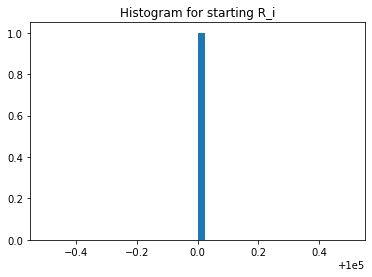

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 146491., 145423., ..., 234565., 239674., 143626.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14675., 14814., 14767., 14754., 14671., 14768., 14716.,
       14762., 14677., 14764., 14683., 14717., 14715., 14630., 14681.,
       14807., 14665., 14759., 14772., 14719., 14673., 14667., 14760.,
       14624., 14856., 14720., 14763., 14761., 14758., 14851., 14724.,
       14632., 14721., 14668., 14810., 14710., 14707., 14765., 14670.,
       14597., 14672., 14626., 14805., 14799., 14723., 14718., 14757.,
       14852., 14857., 14678., 14722., 14803., 14659., 14801., 14809.,
       14581., 14636., 14813., 14713., 14811., 14756., 14627., 14622.,
       14634., 14676., 14679., 14664., 14711., 14854., 14635., 14849.,
       14808., 14631., 14669., 14850., 14625., 14804., 14729., 14680.,
       14771., 14853., 14766., 14855., 14714., 14726., 14863., 14812.,
       14709., 14712., 14725., 14623., 14674., 14620., 14902., 14795.,
       14806., 14591., 14802., 14848., 14660., 14907., 14661., 14897.,
       14950., 14752., 14584., 14663., 14847., 14755., 14629., 14684.,
      

In [25]:
experiments.UNI_Qj.unique()

array([200000., 143940., 143030., ..., 164082., 144855., 145918.])

In [26]:
experiments.UNI_Rj.unique()

array([100000., 139099., 139987., ..., 126987., 131001., 133060.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

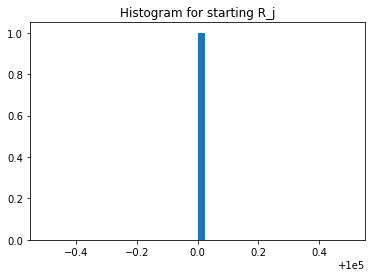

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


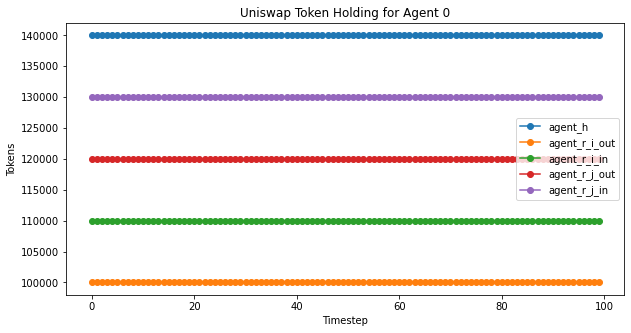

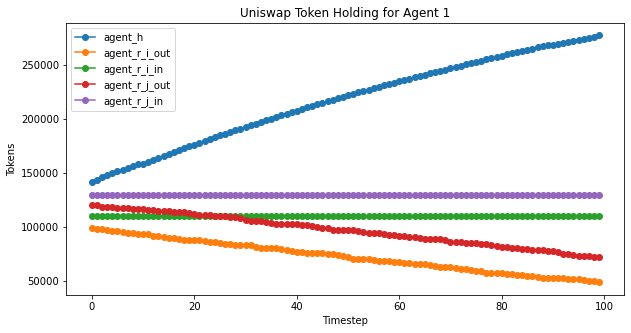

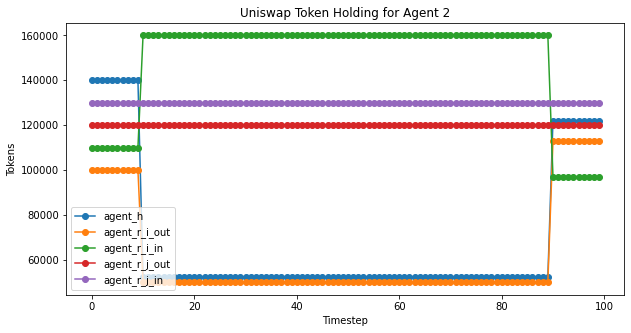

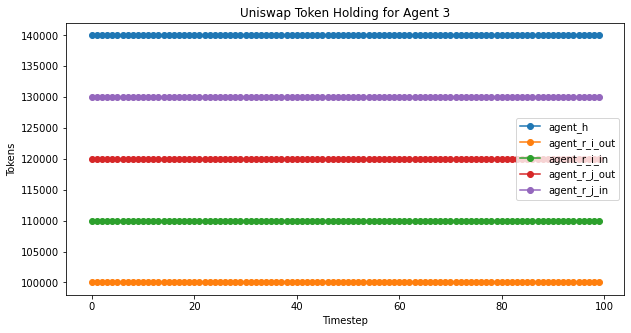

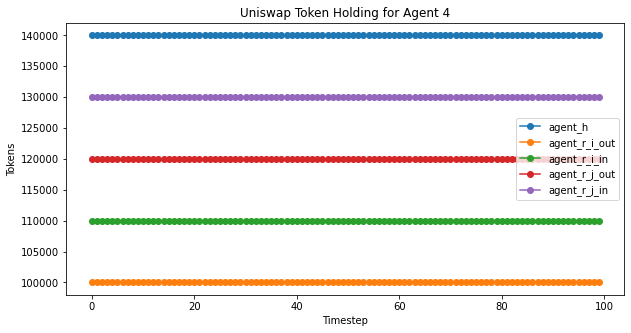

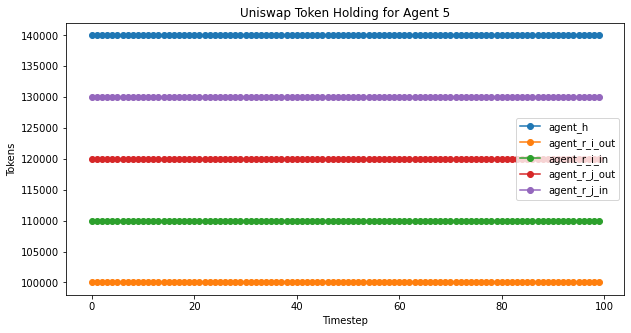

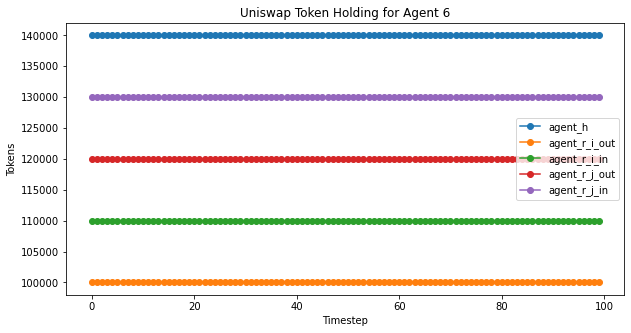

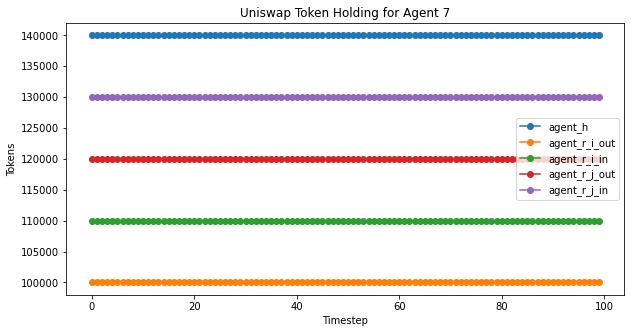

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


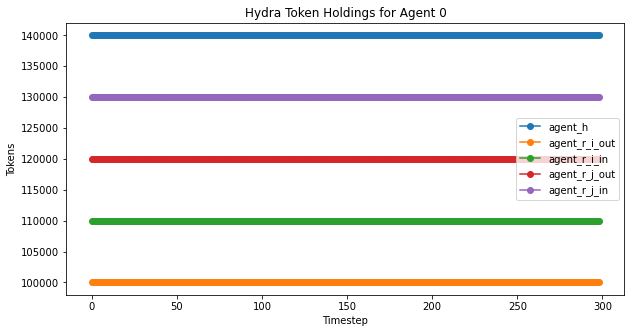

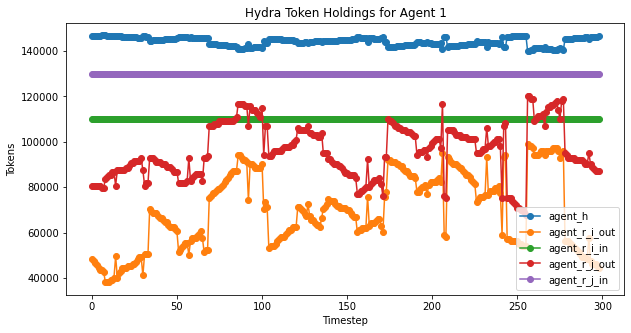

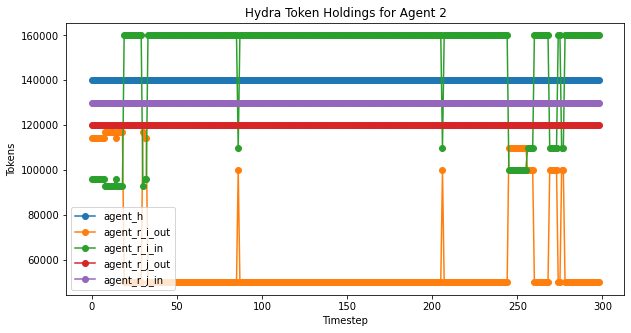

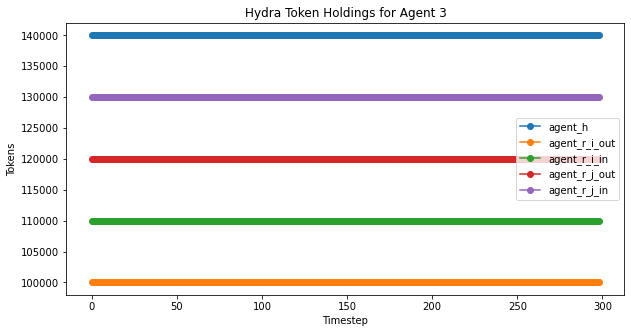

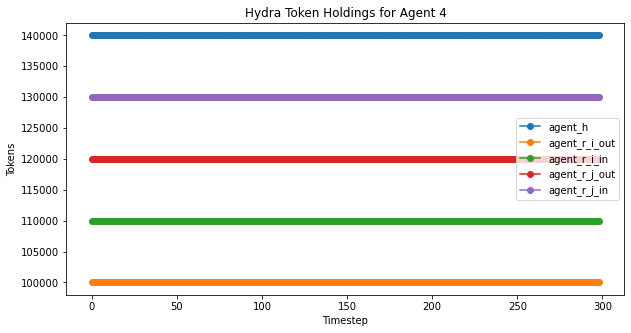

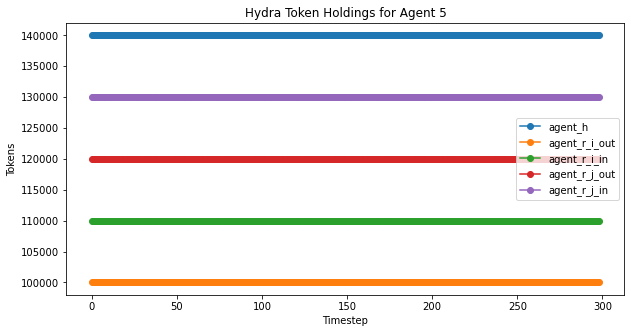

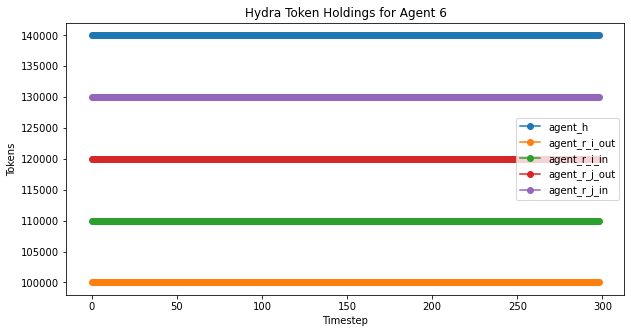

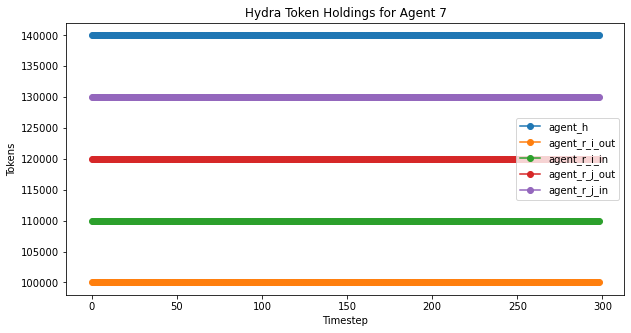

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

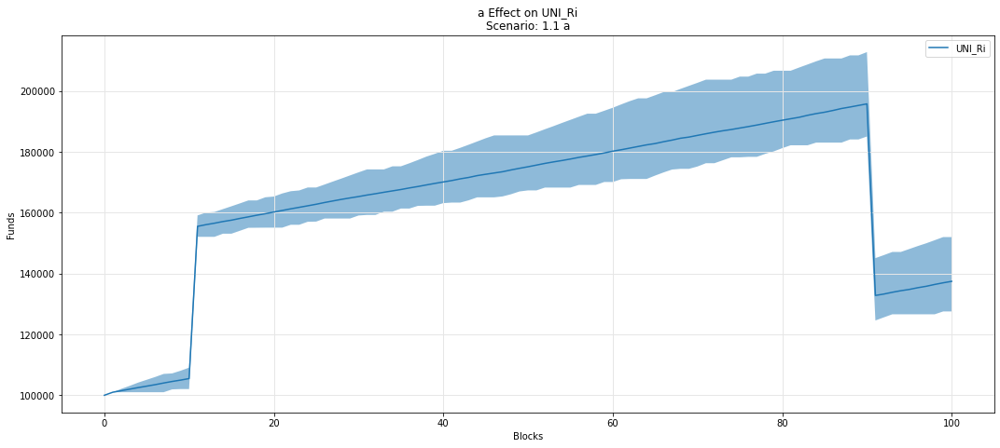

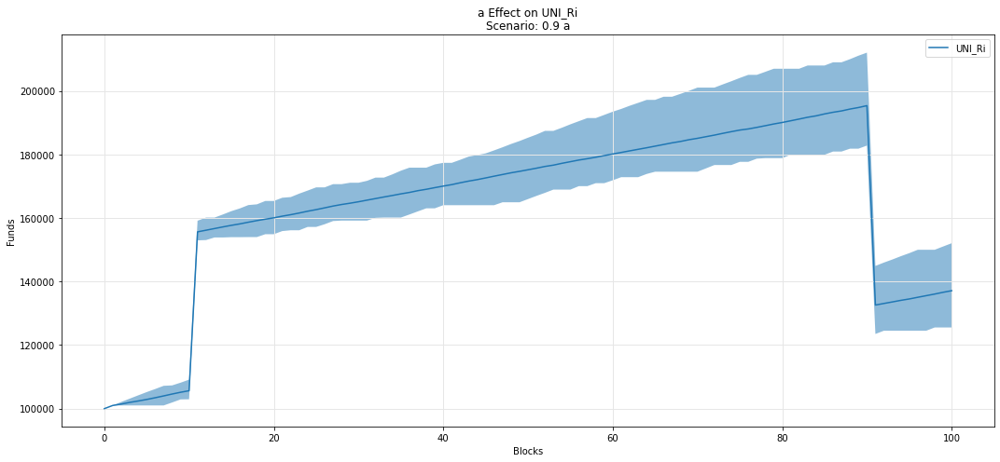

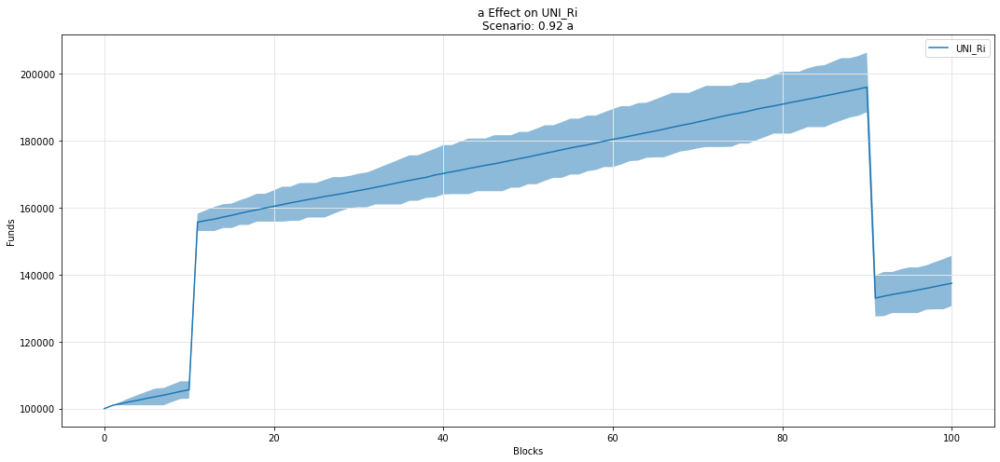

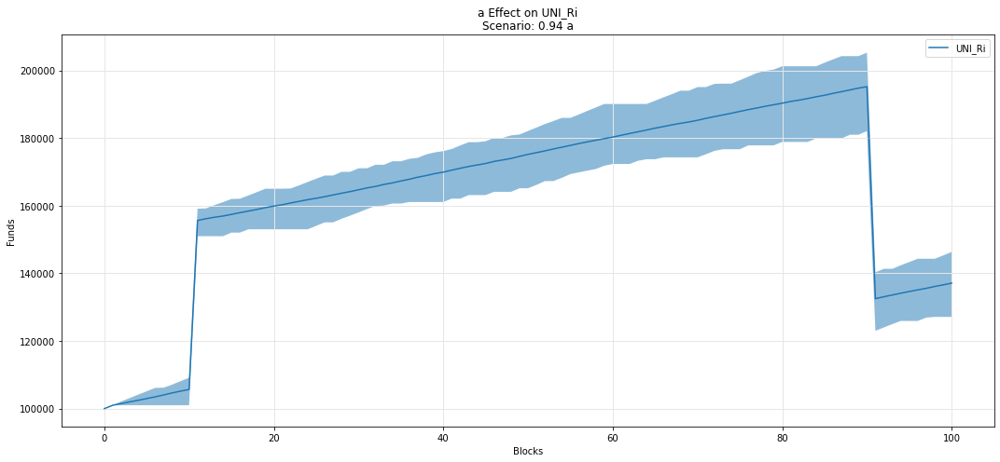

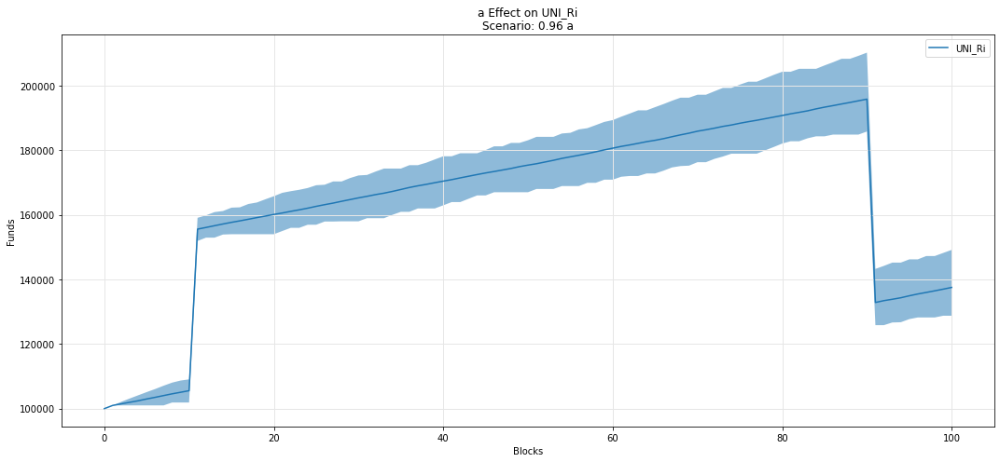

...

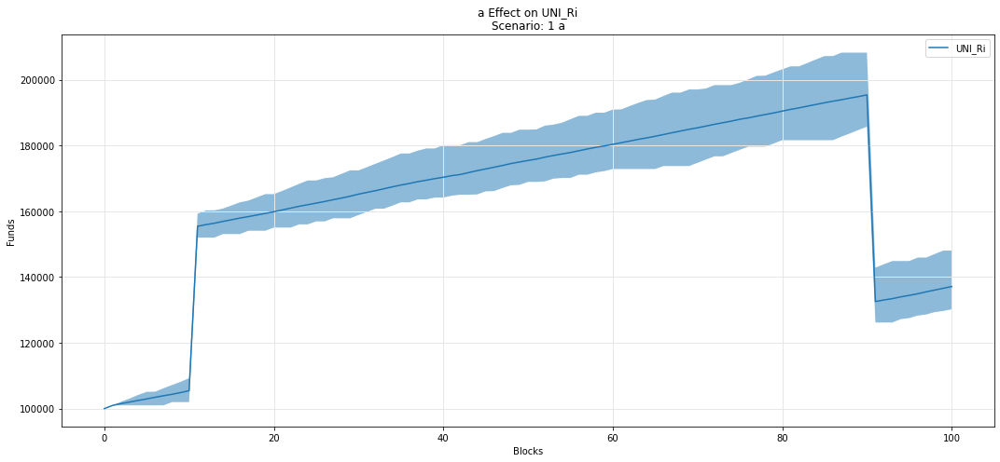

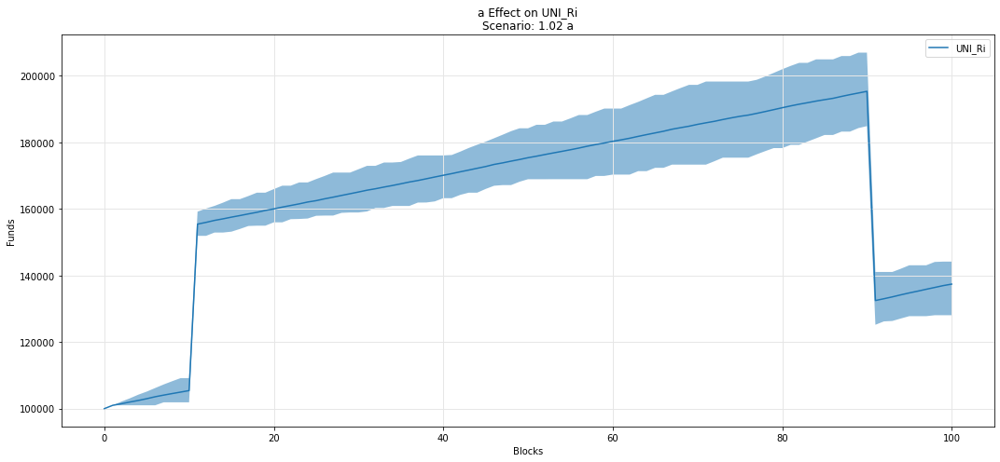

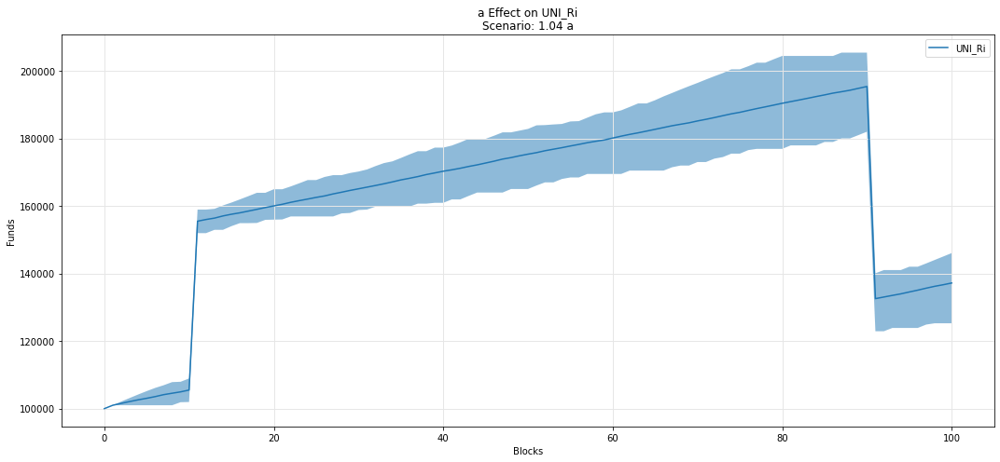

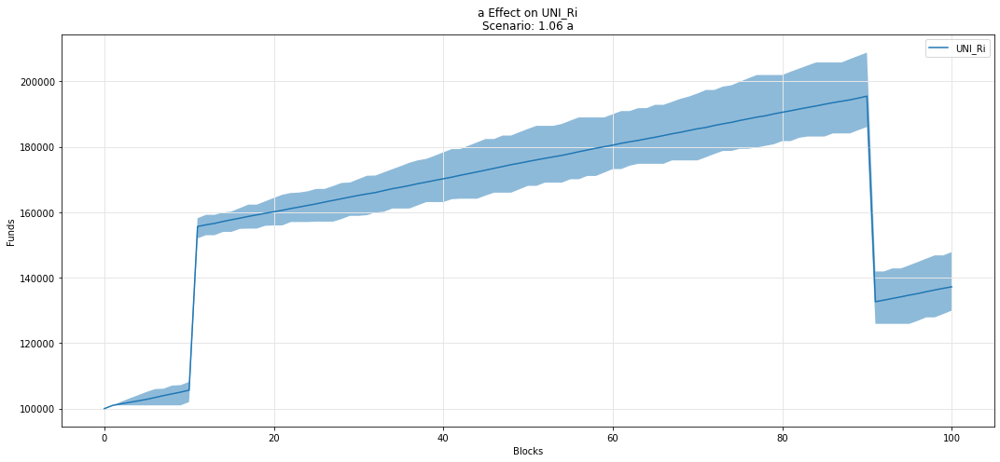

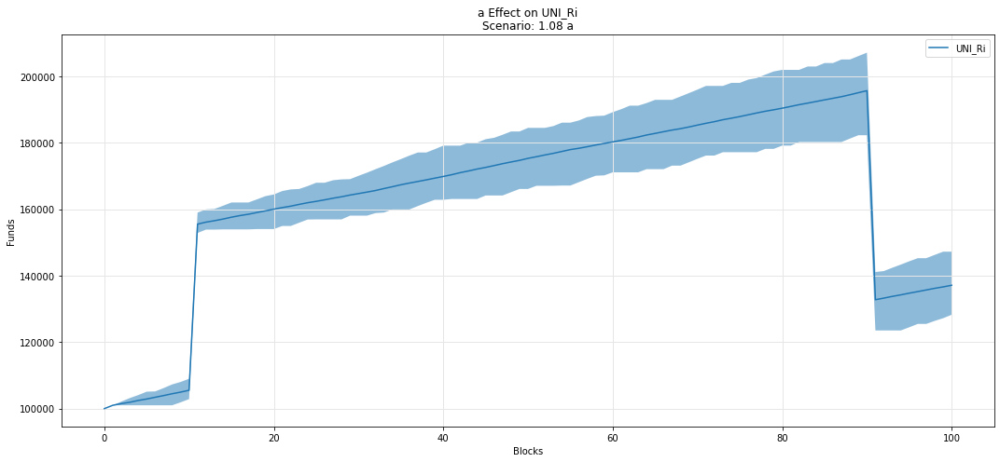

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

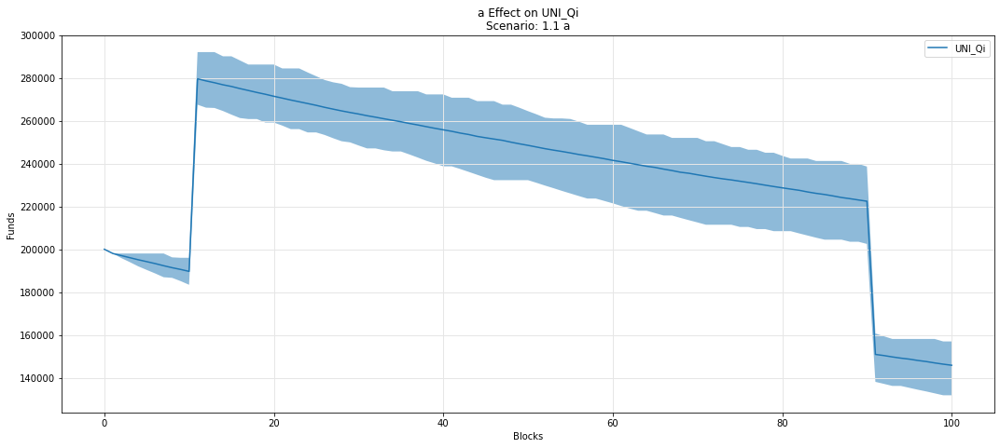

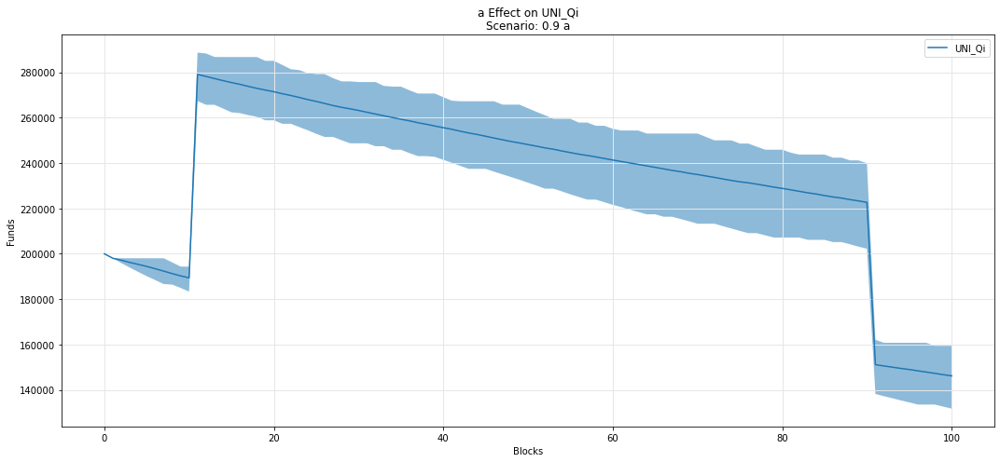

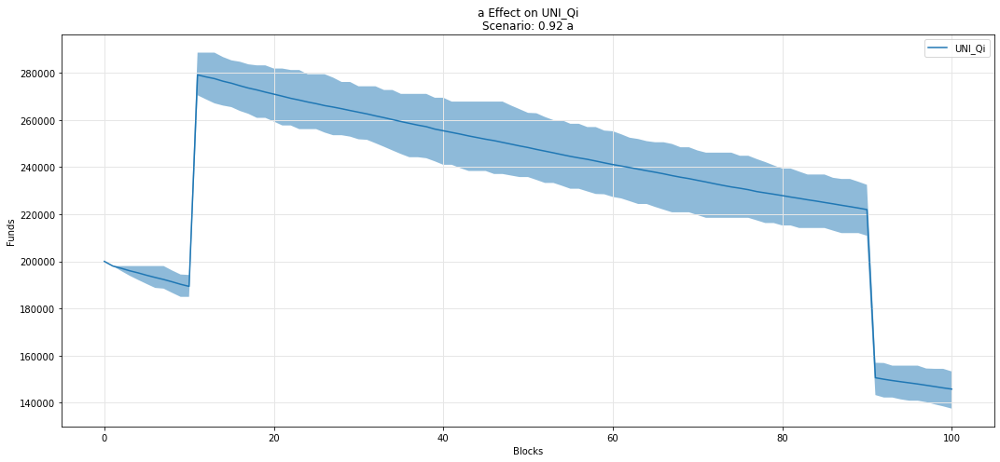

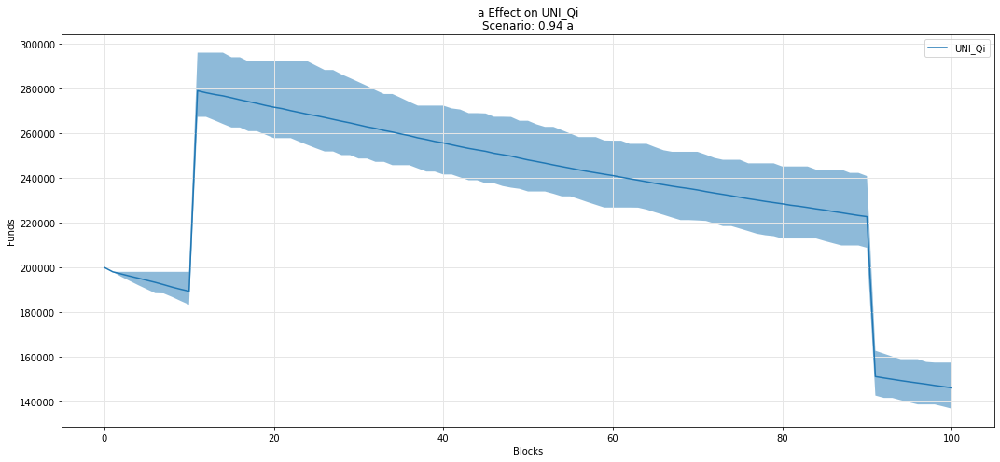

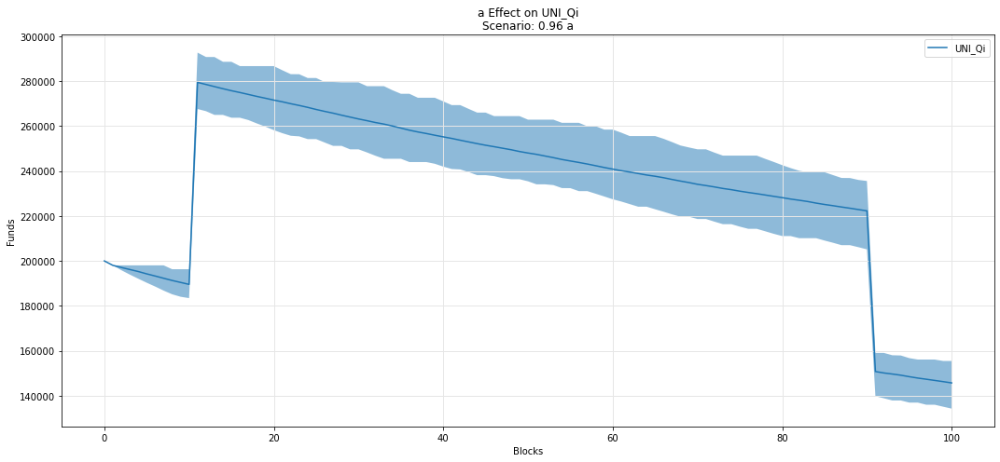

...

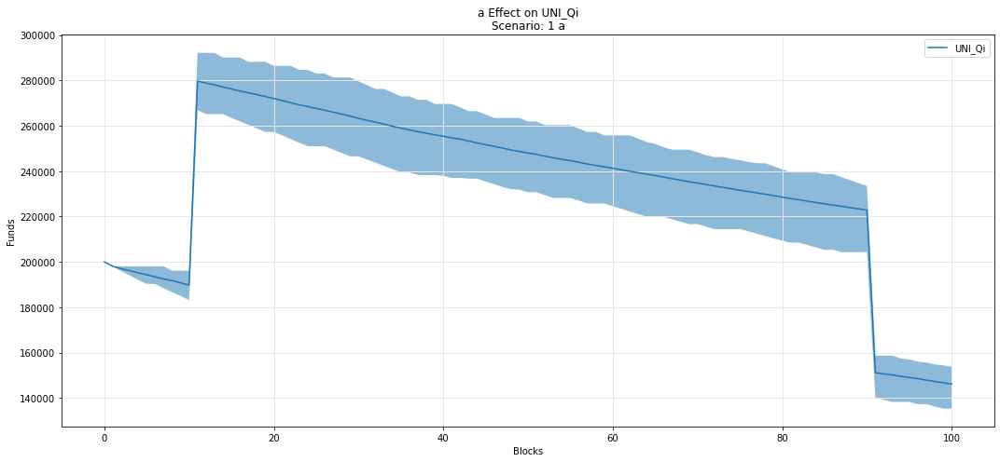

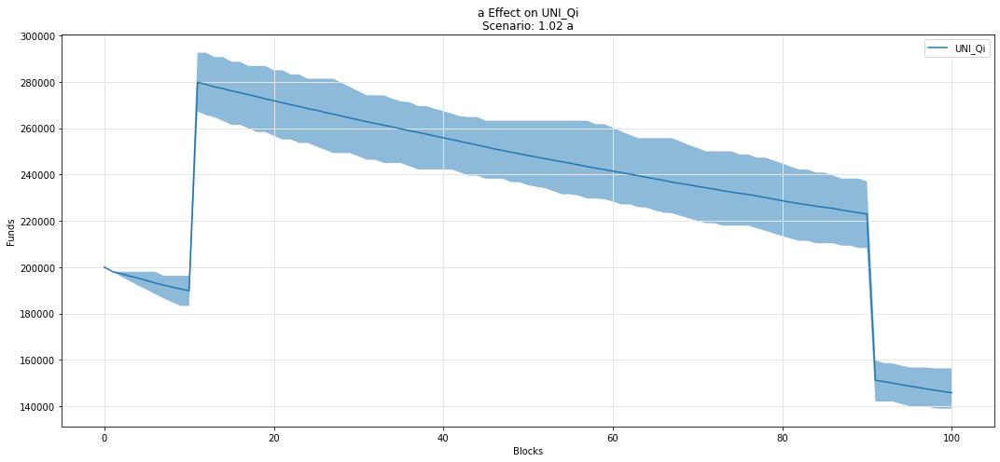

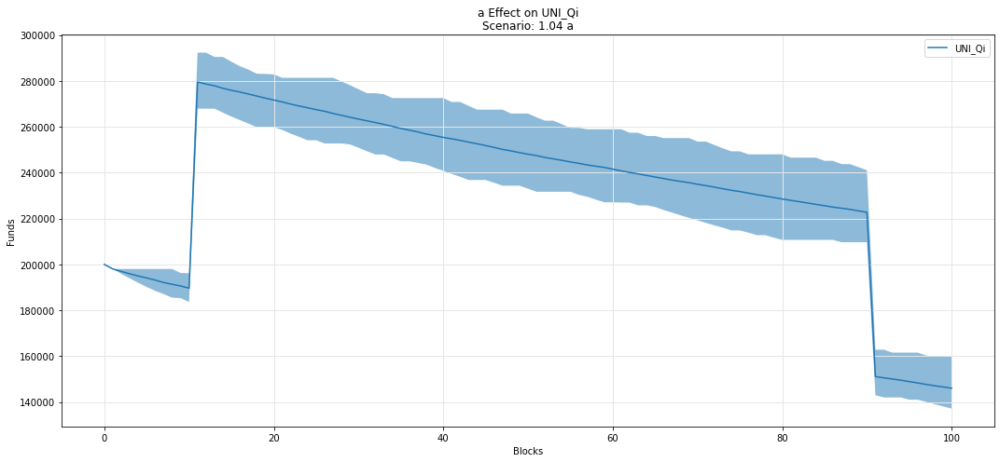

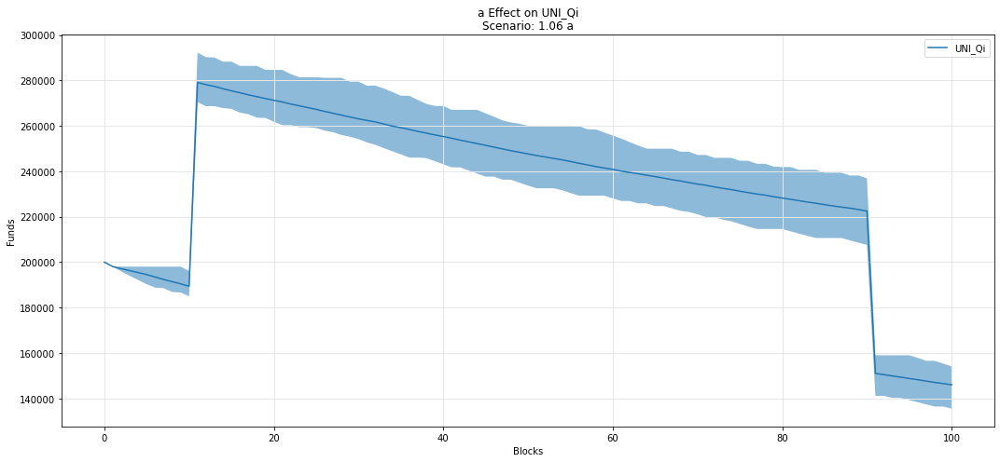

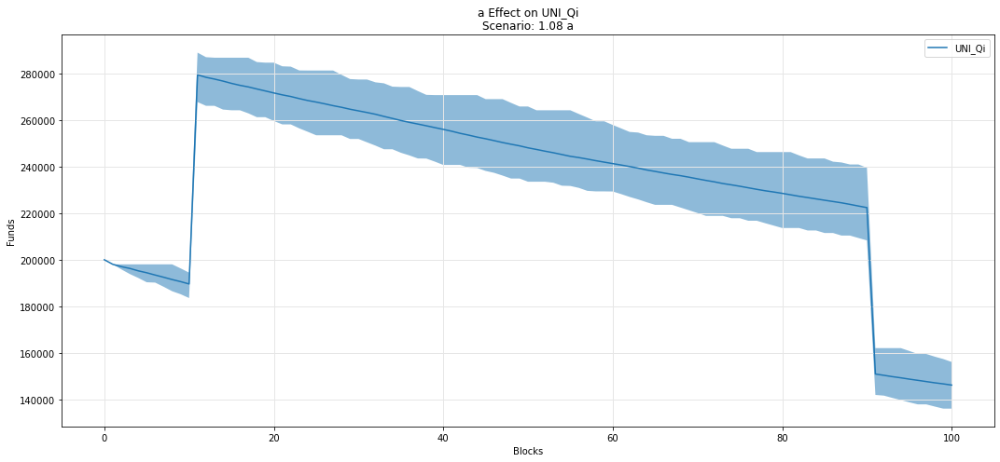

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

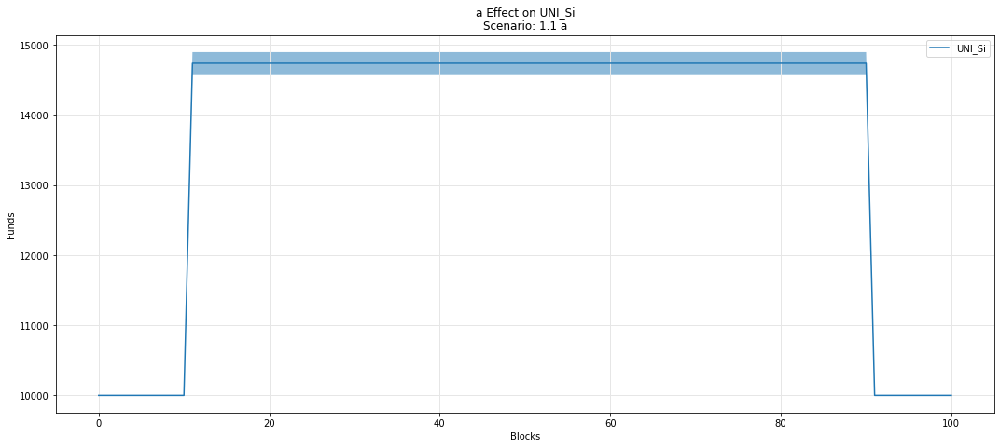

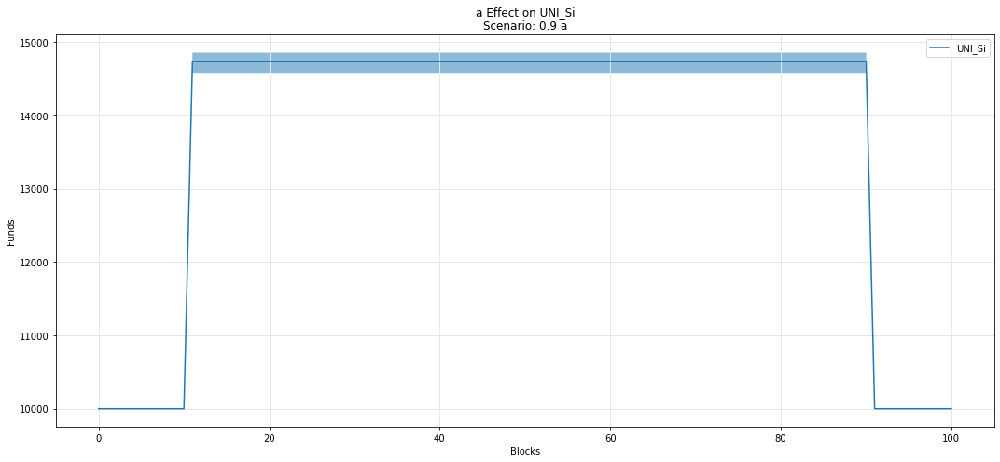

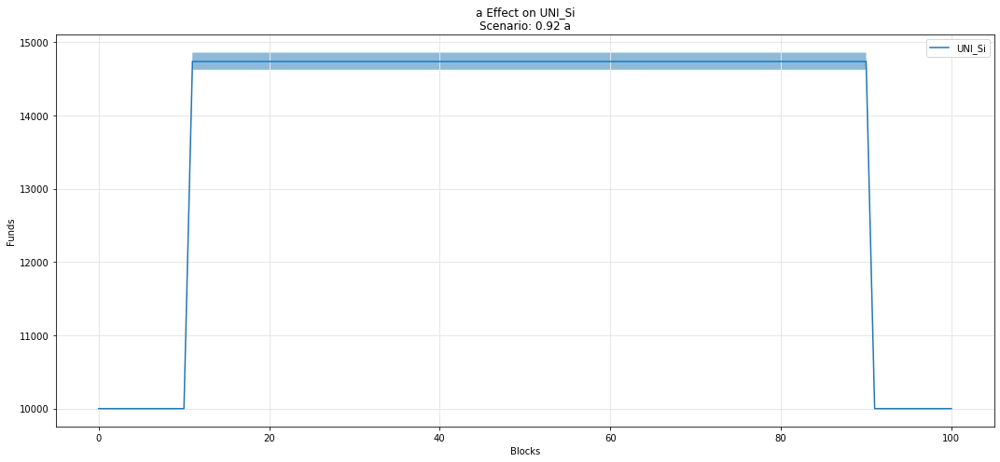

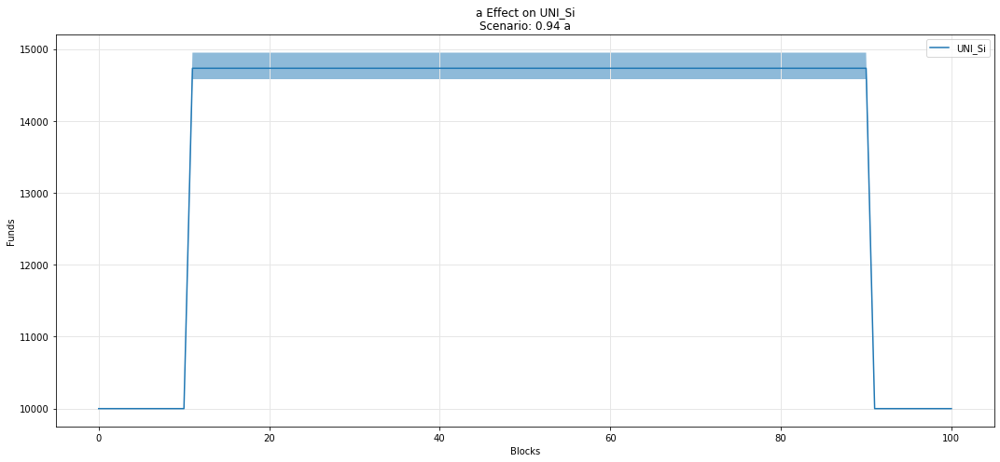

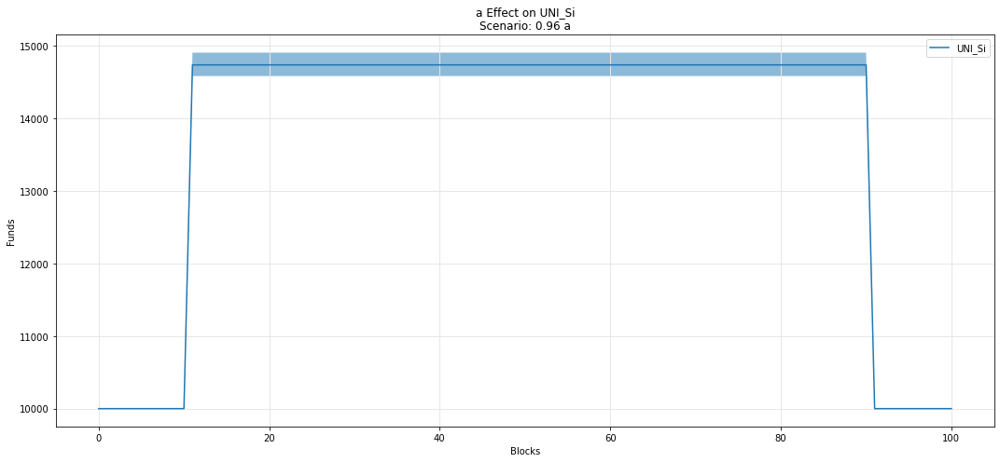

...

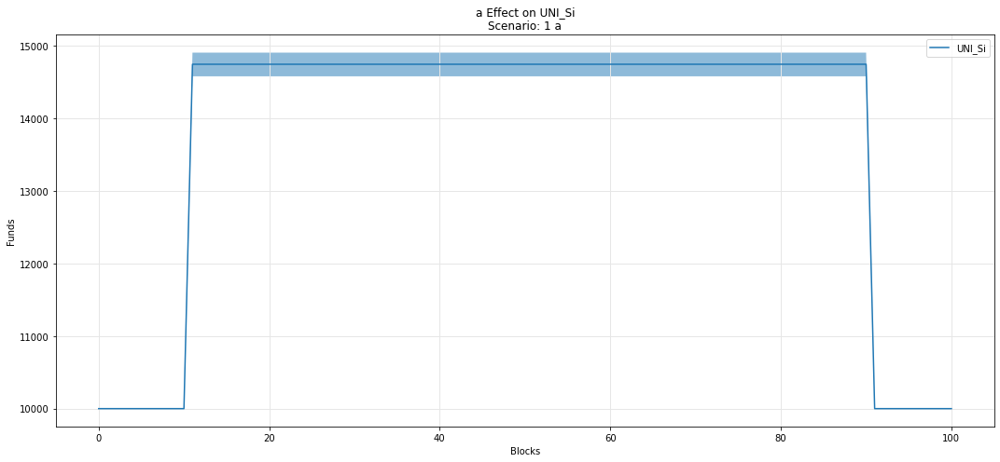

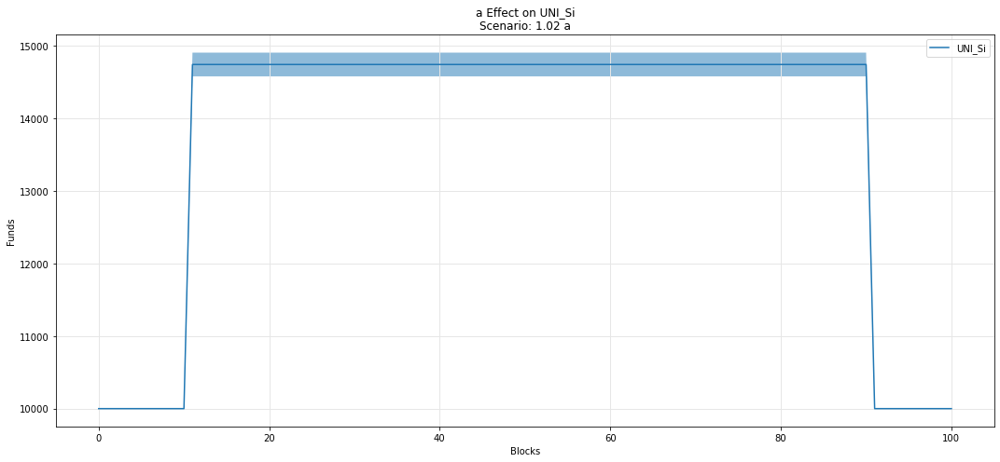

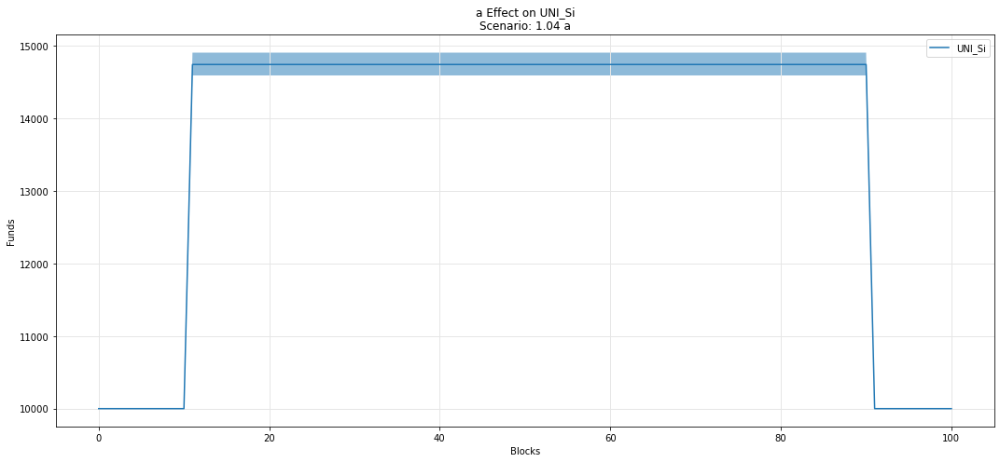

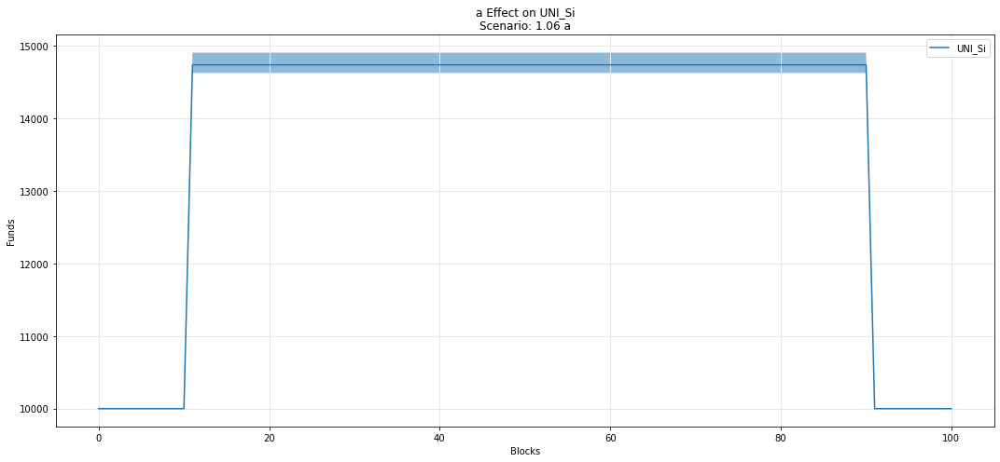

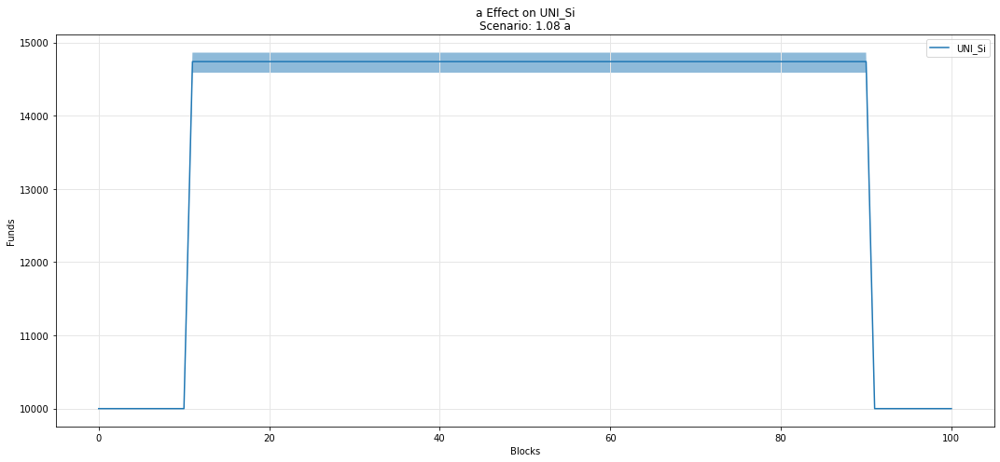

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

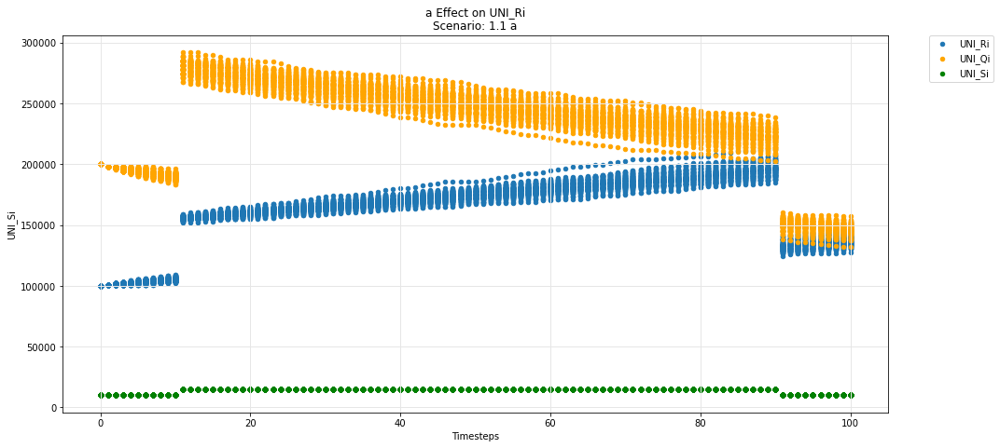

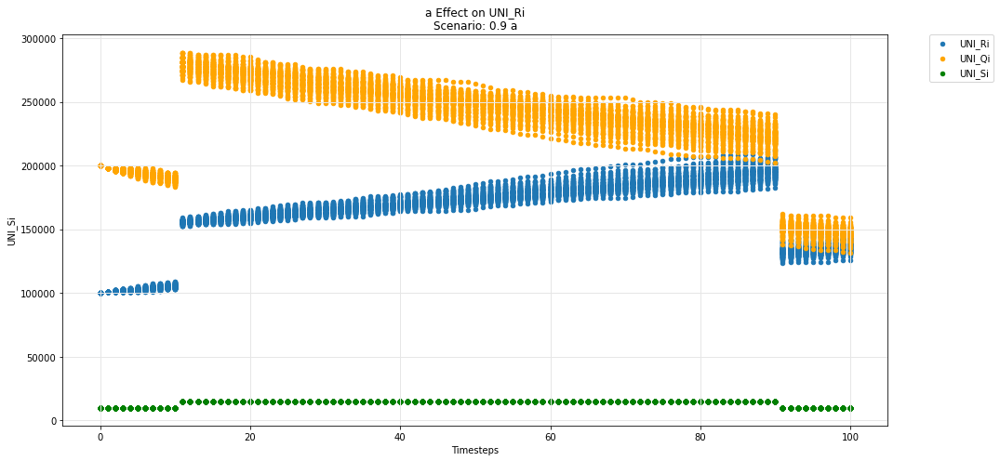

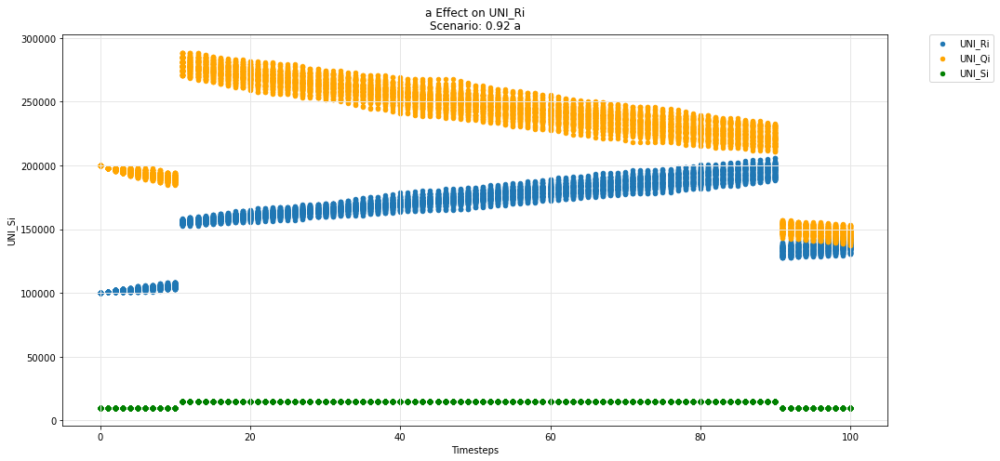

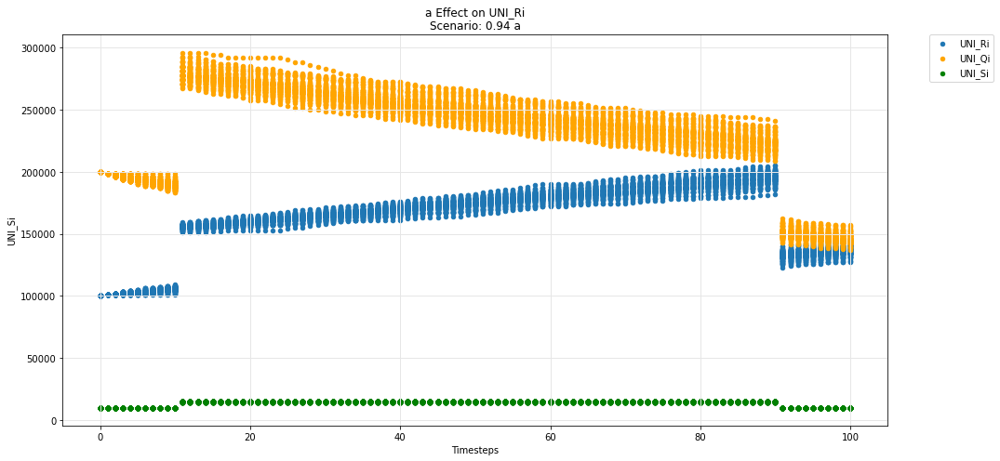

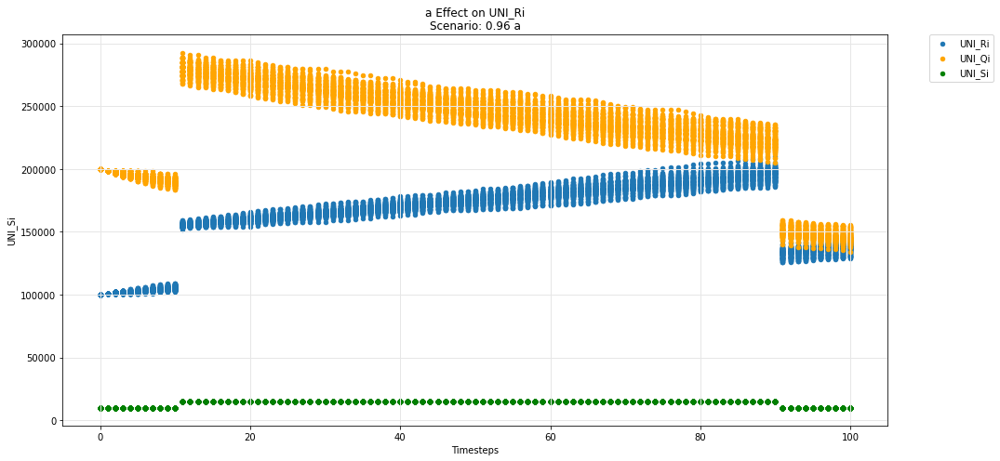

...

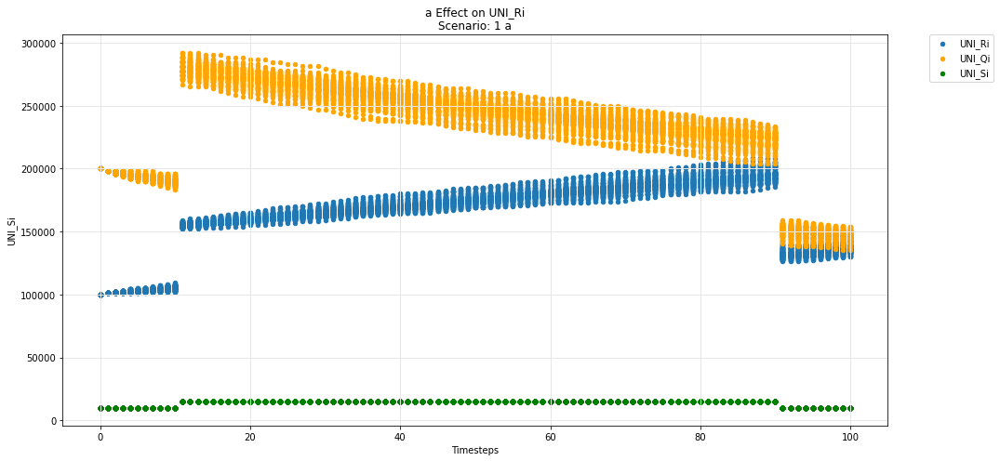

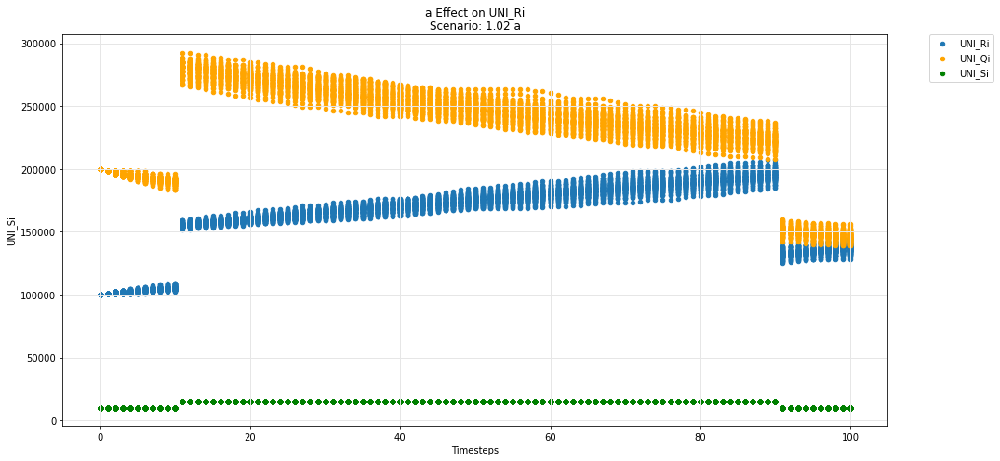

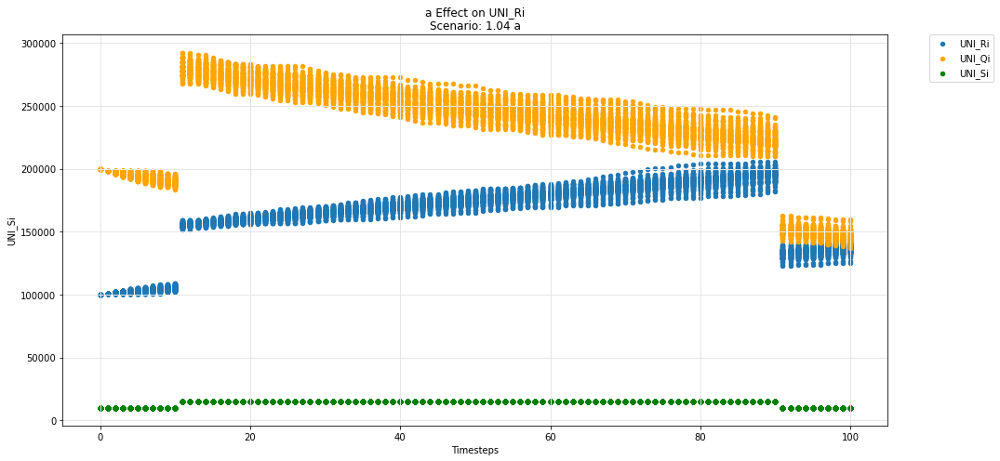

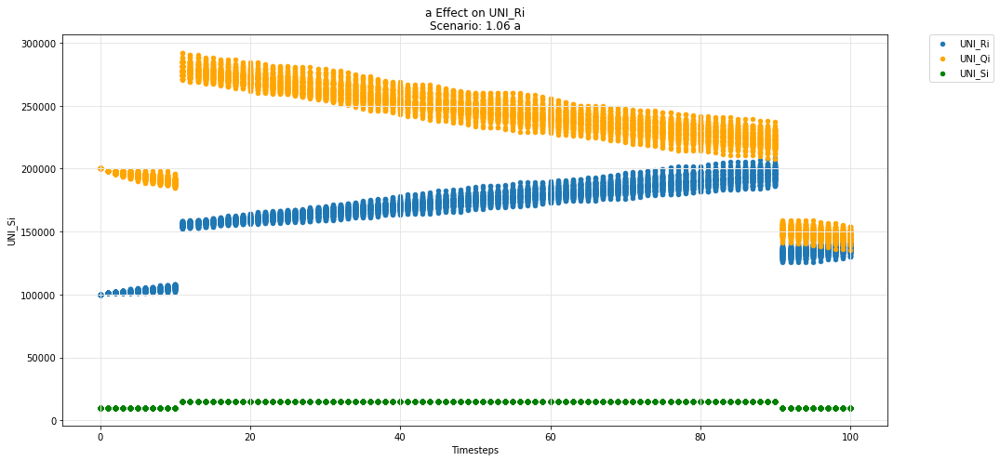

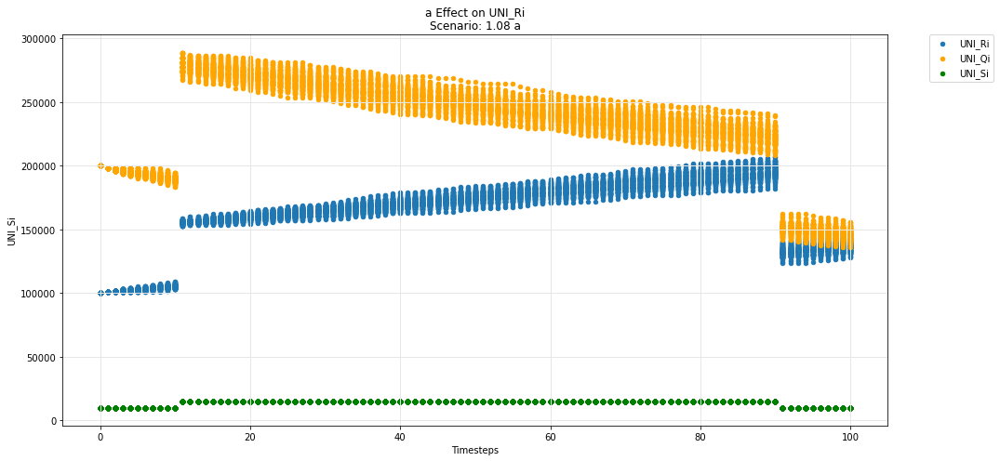

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

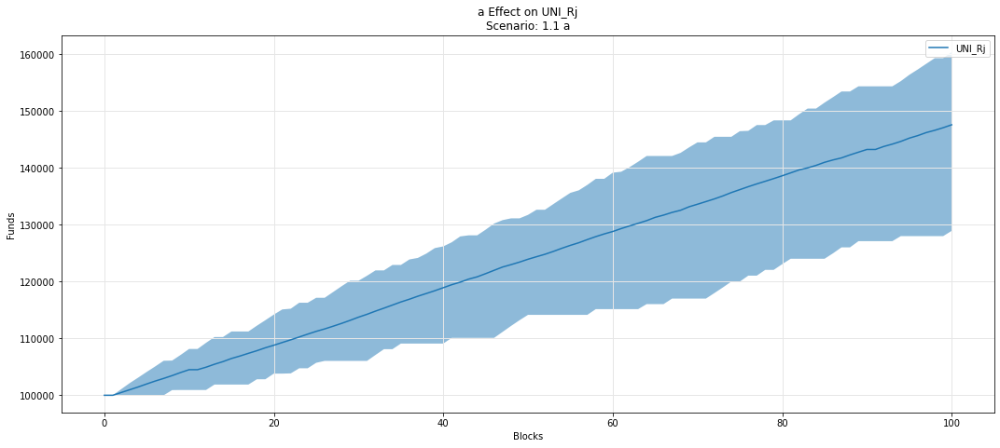

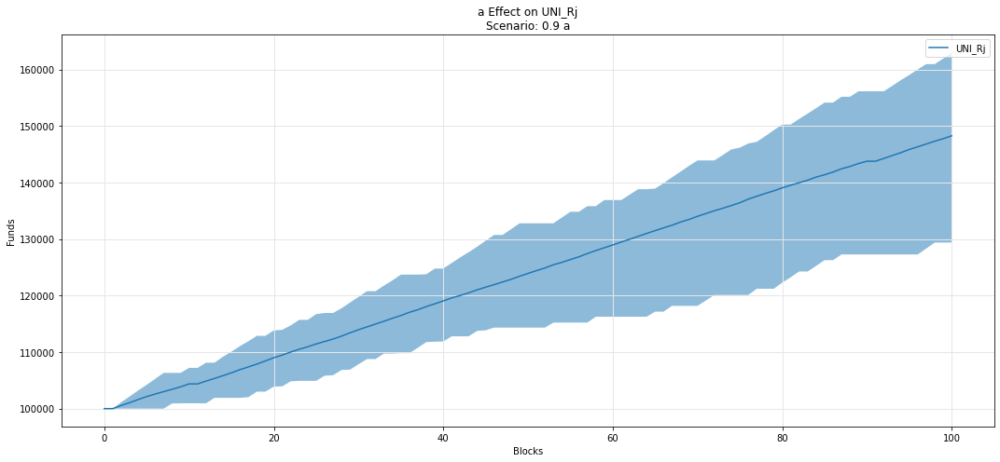

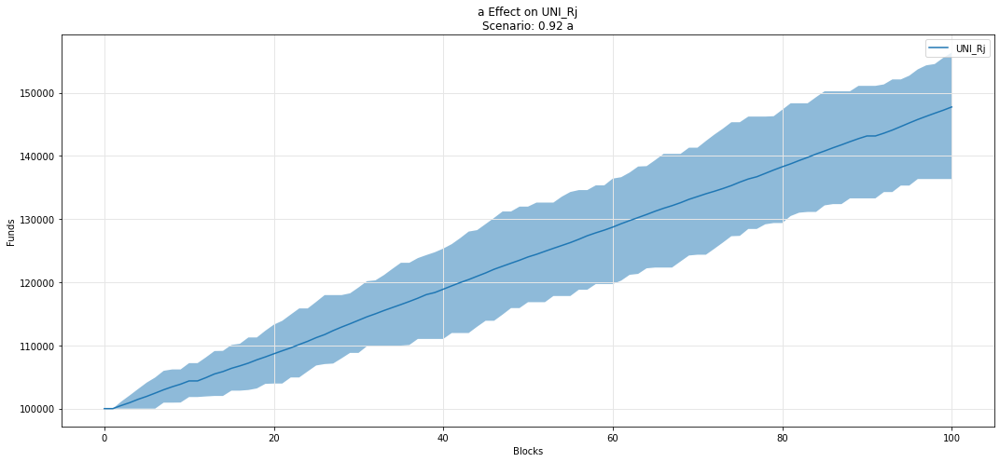

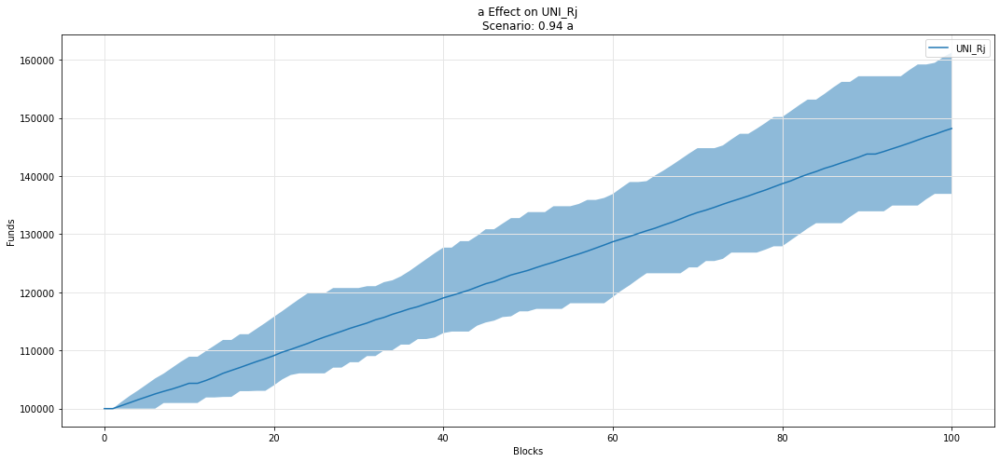

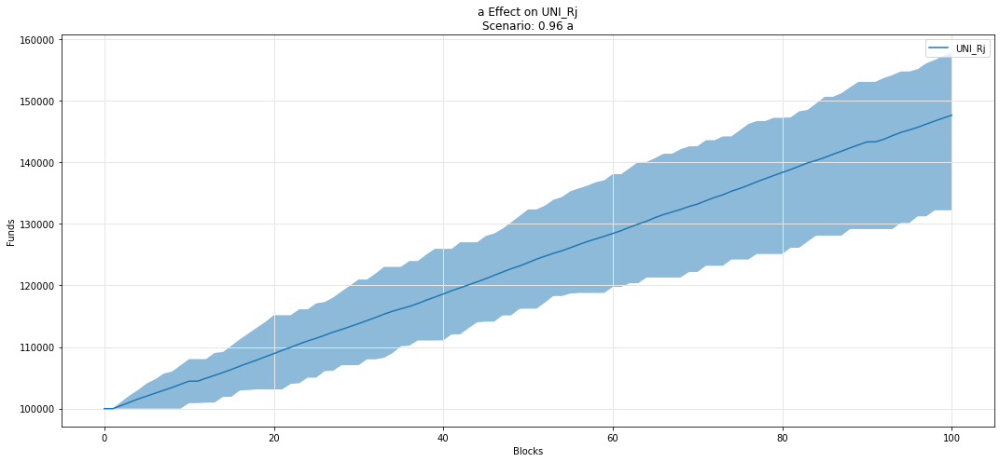

...

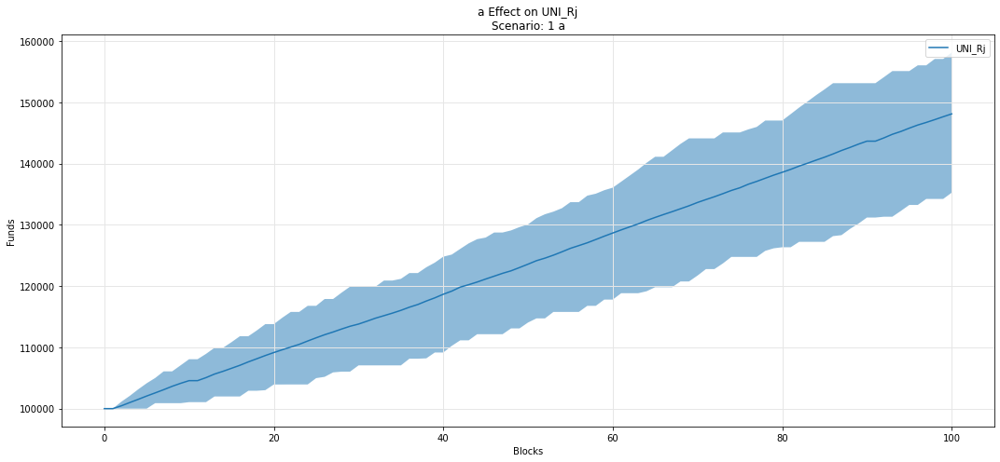

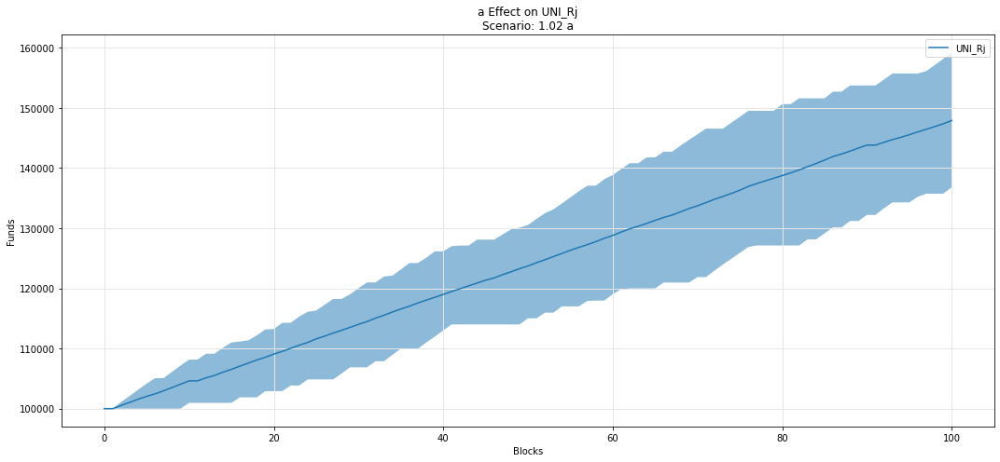

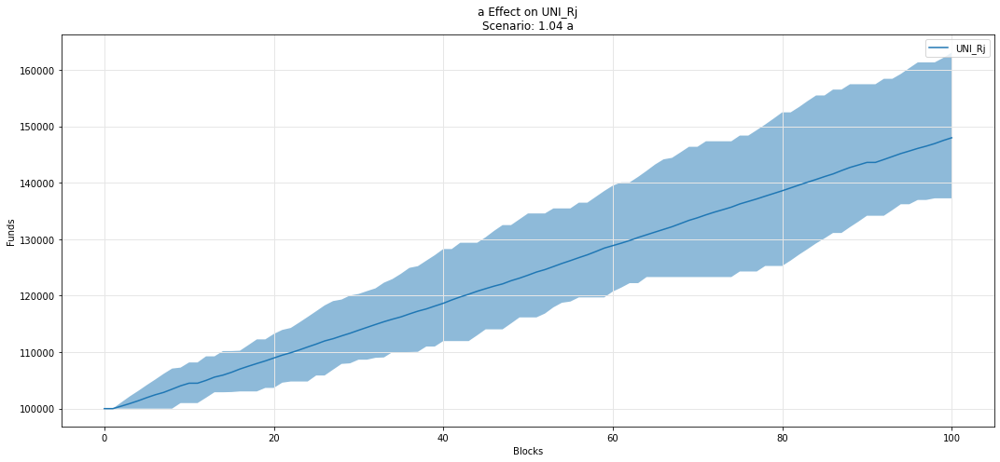

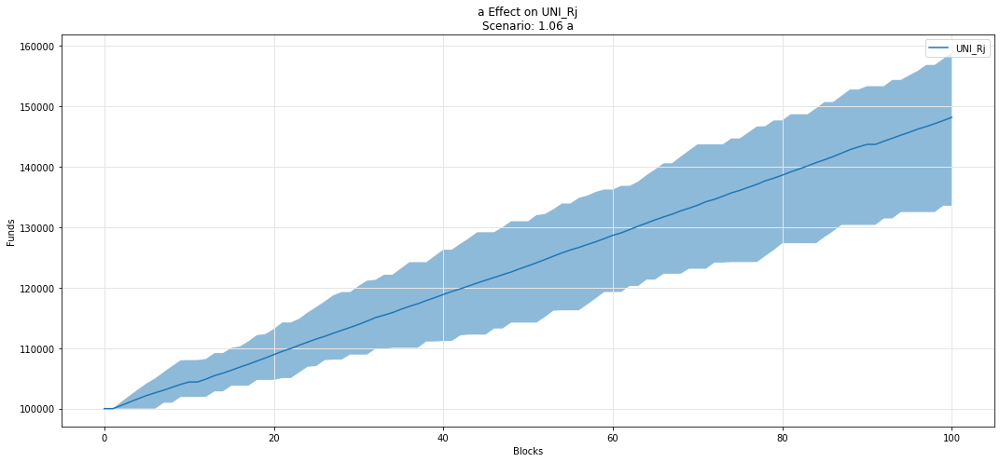

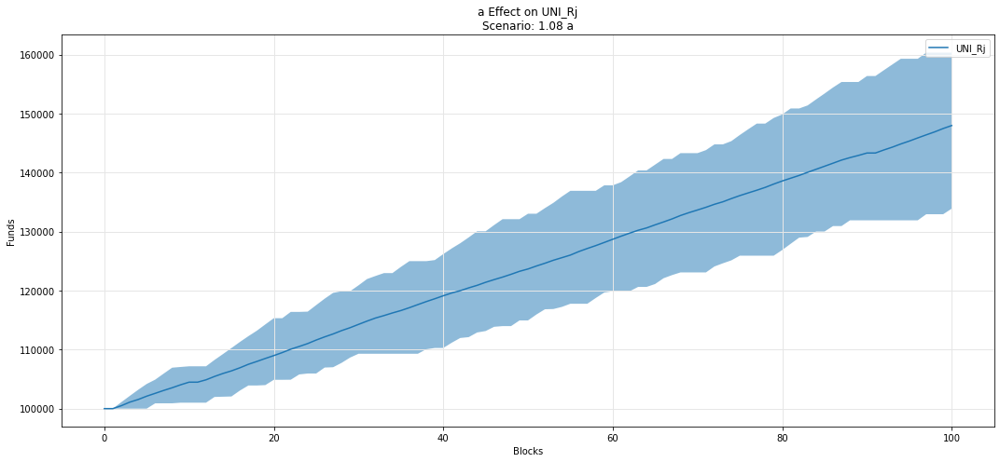

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

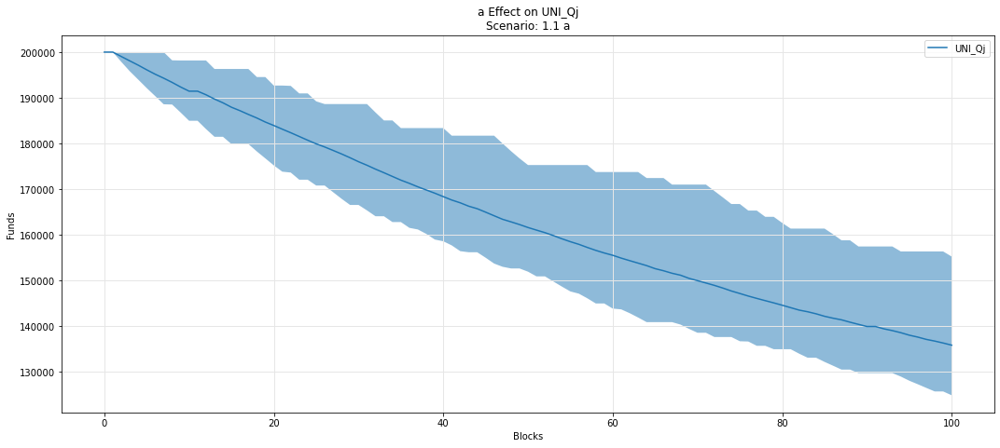

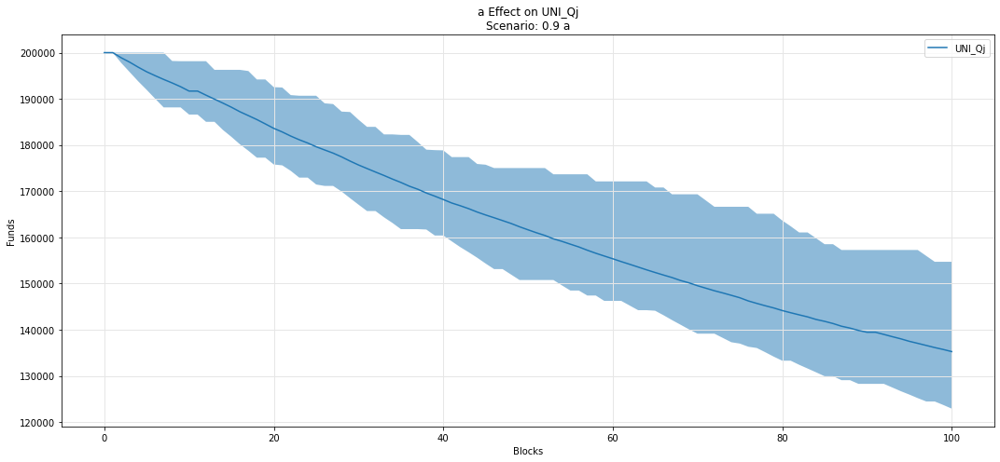

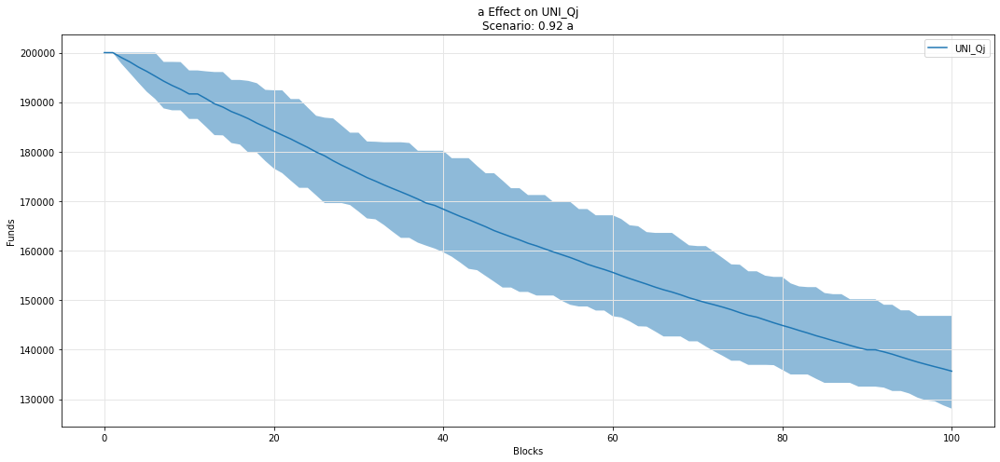

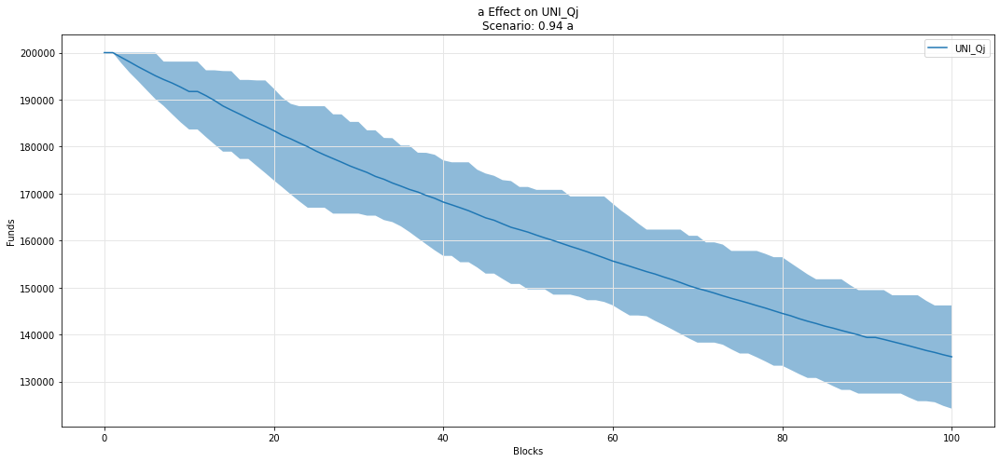

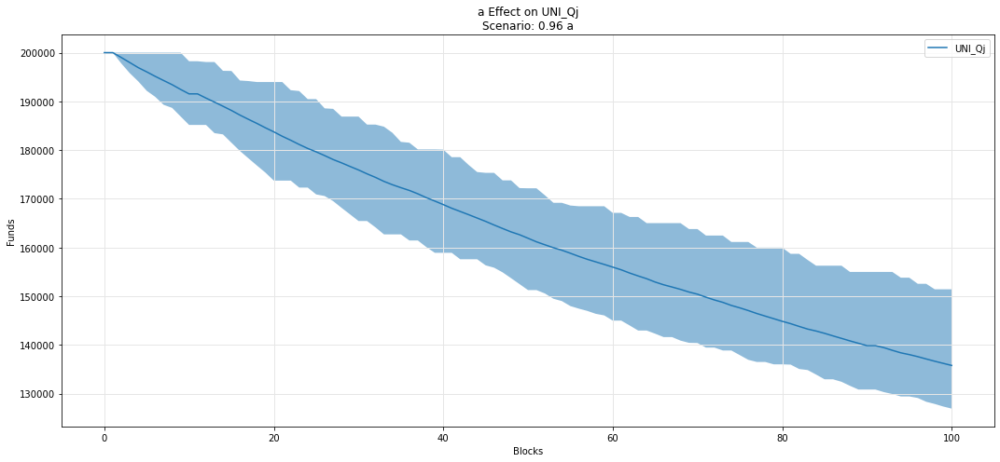

...

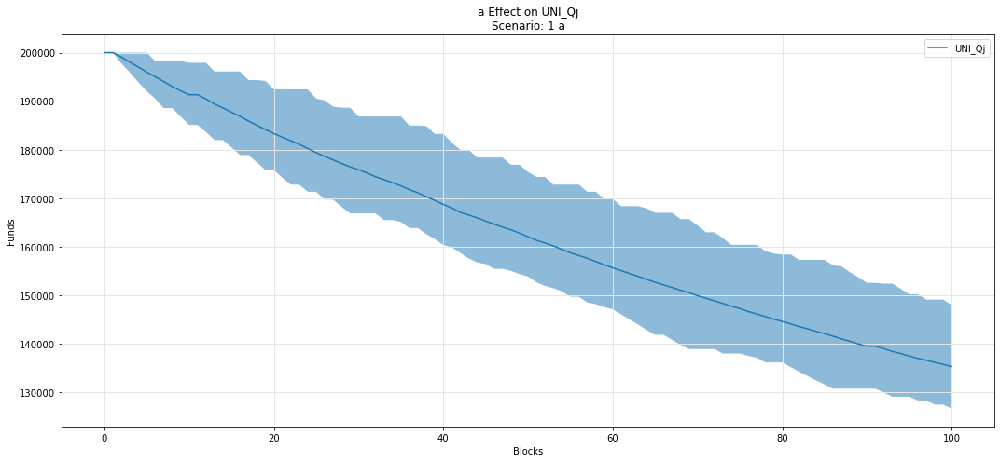

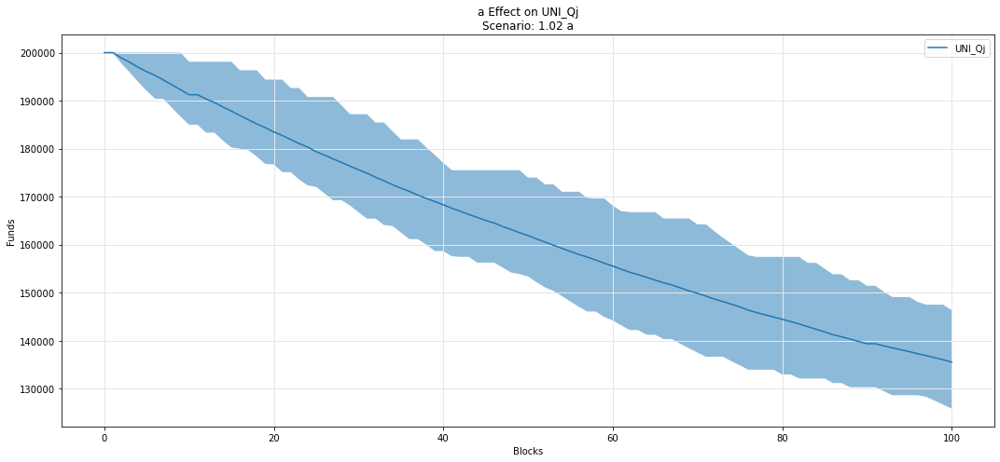

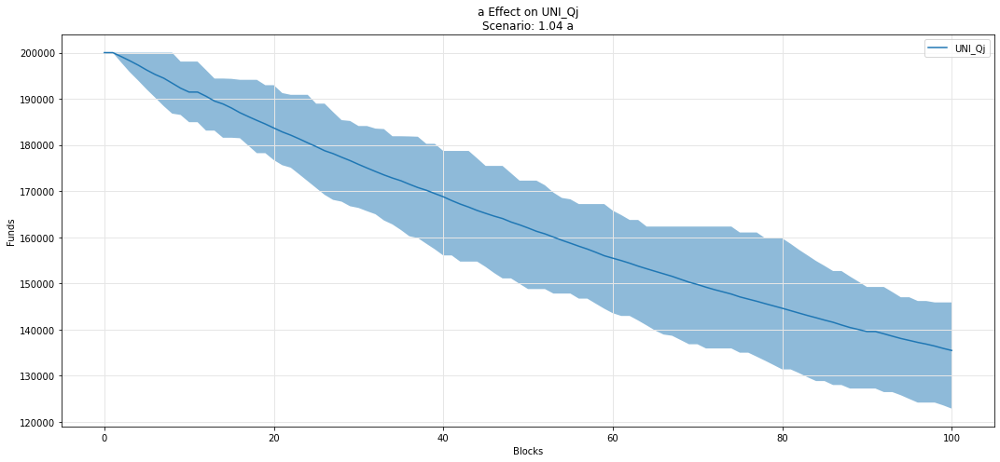

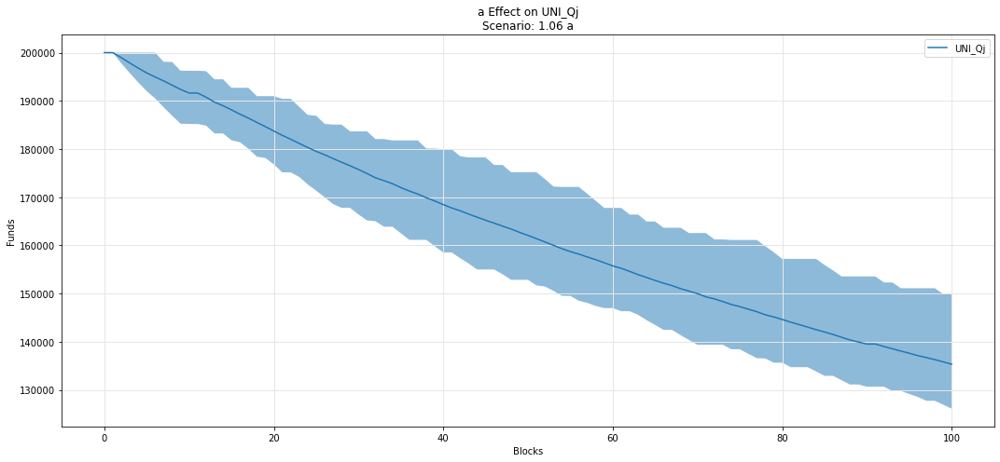

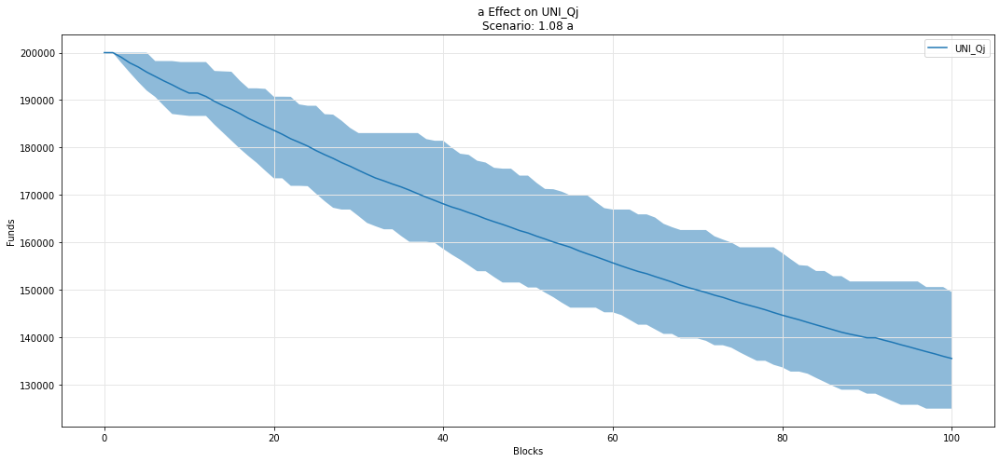

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

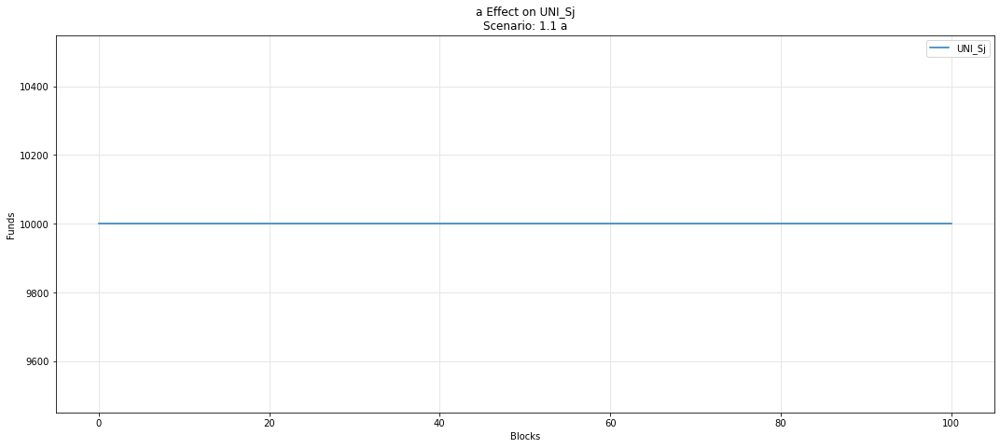

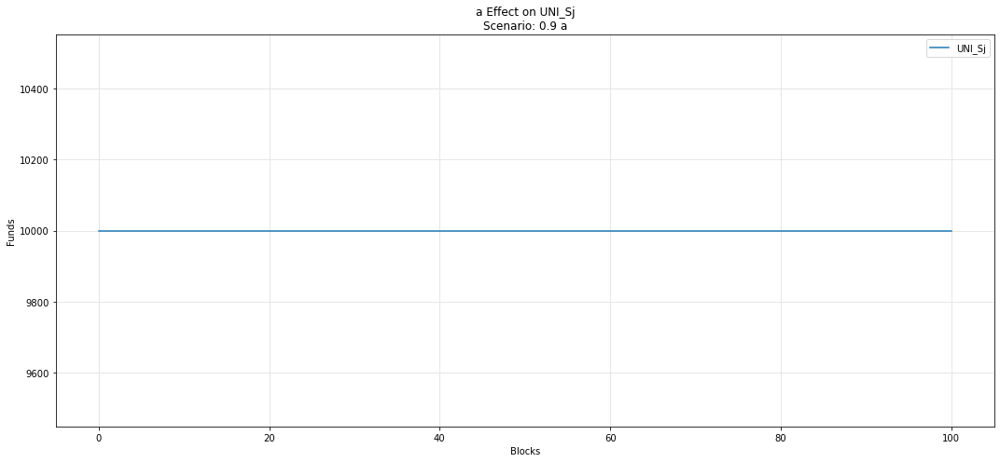

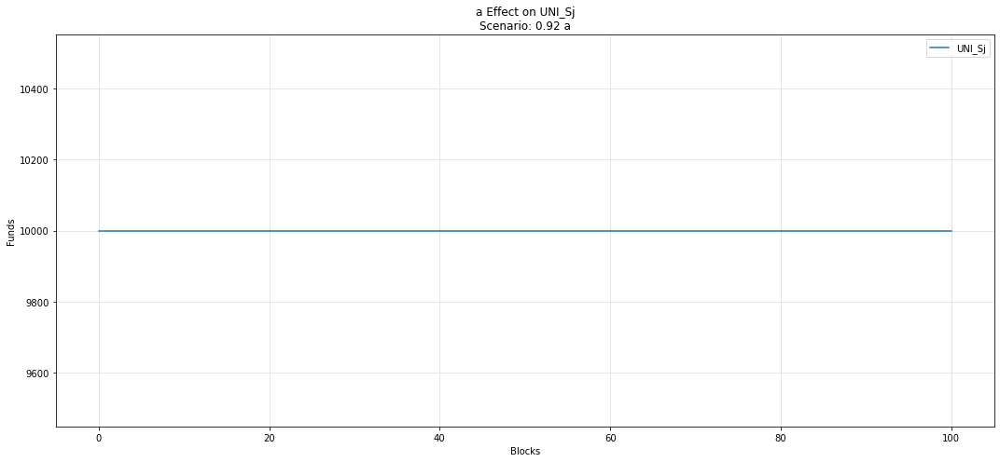

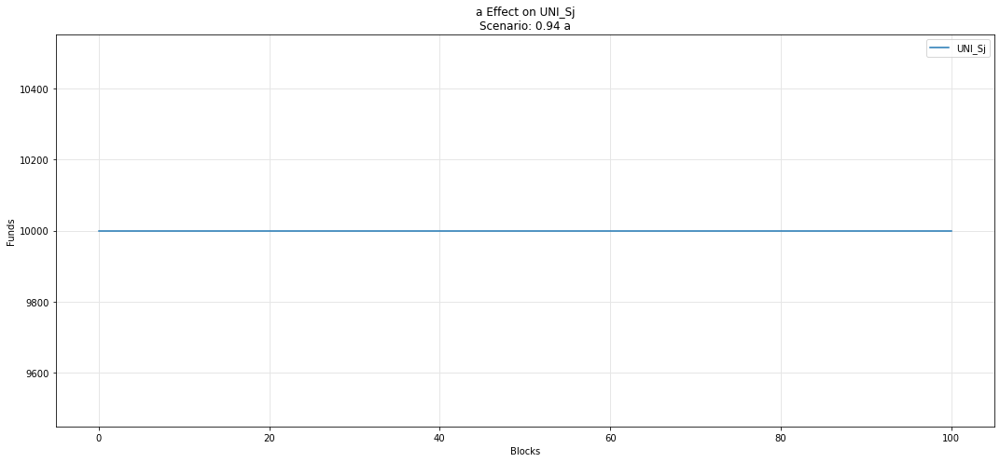

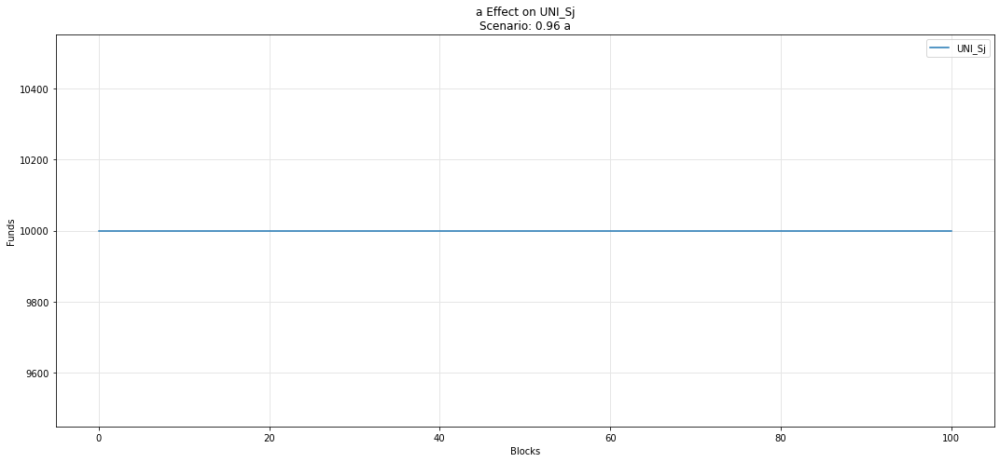

...

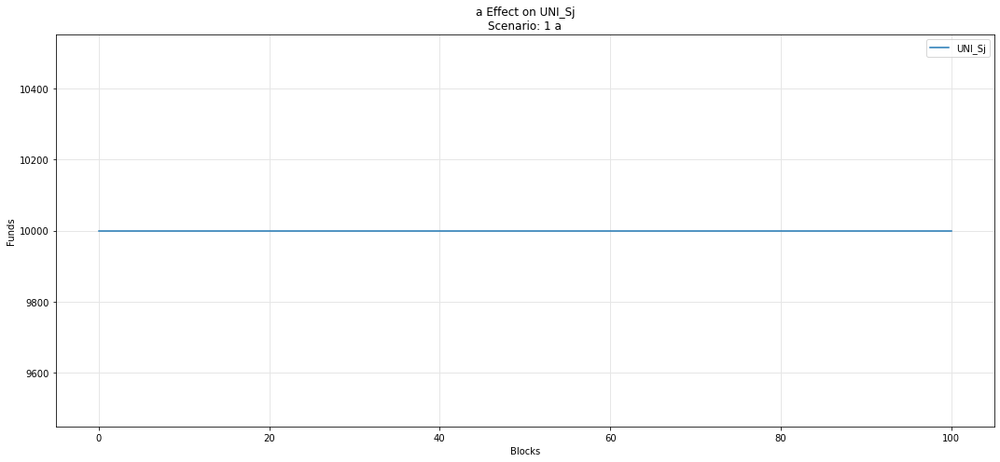

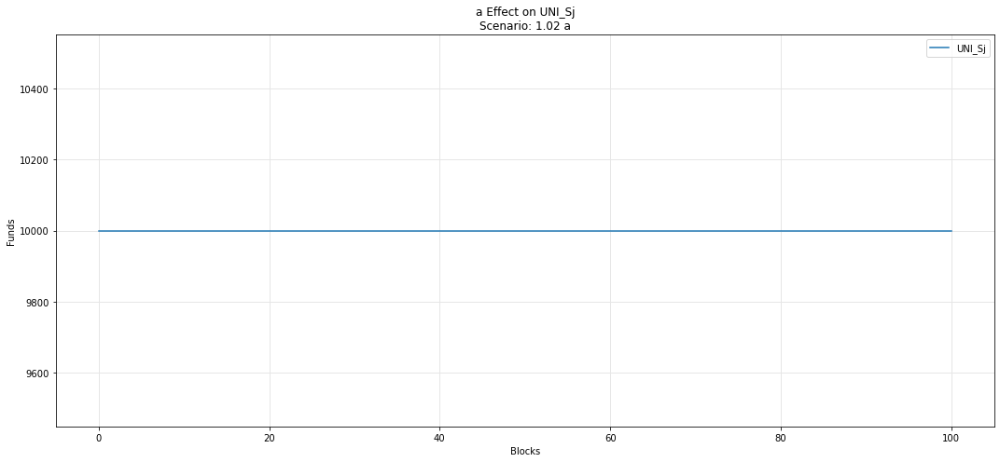

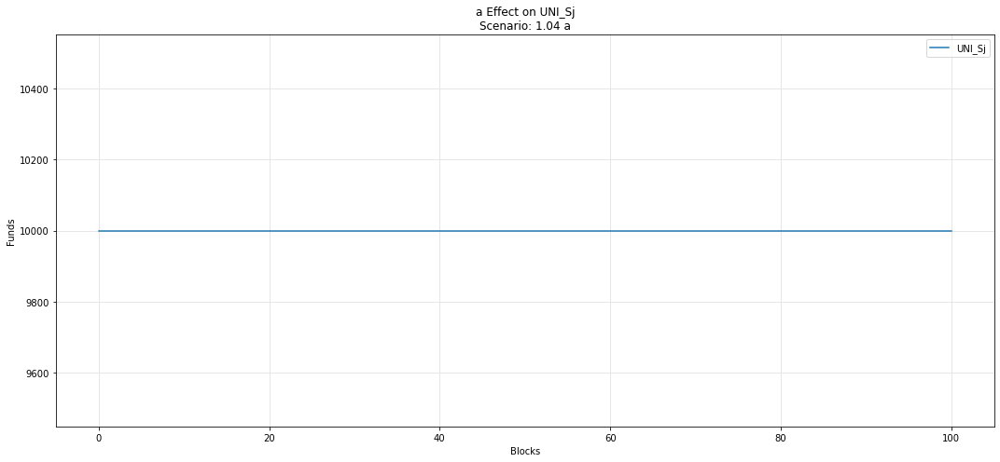

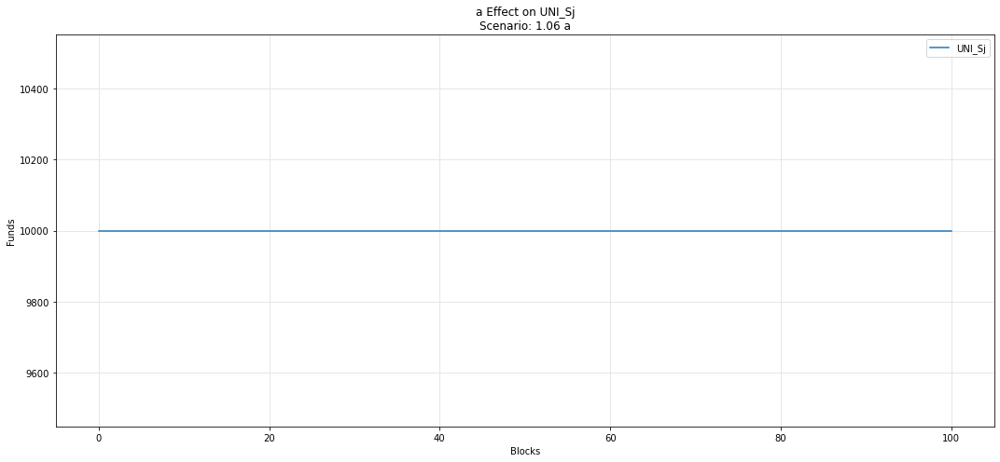

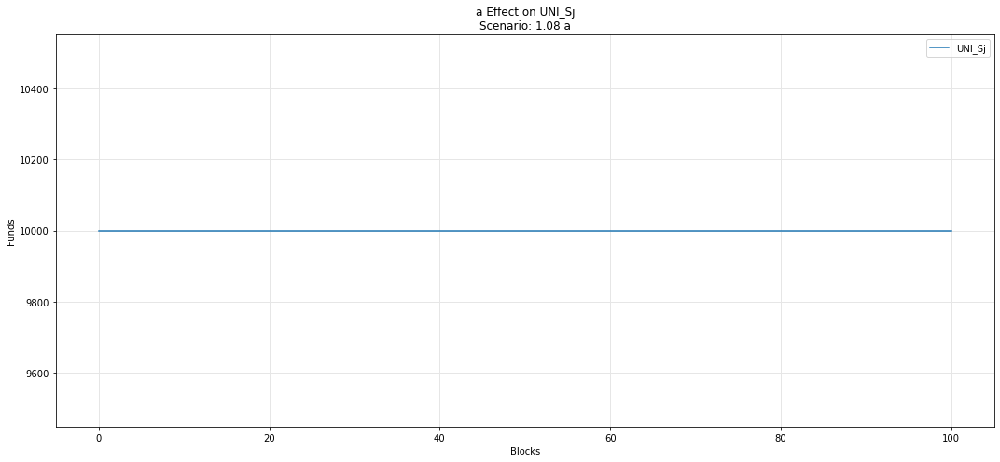

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

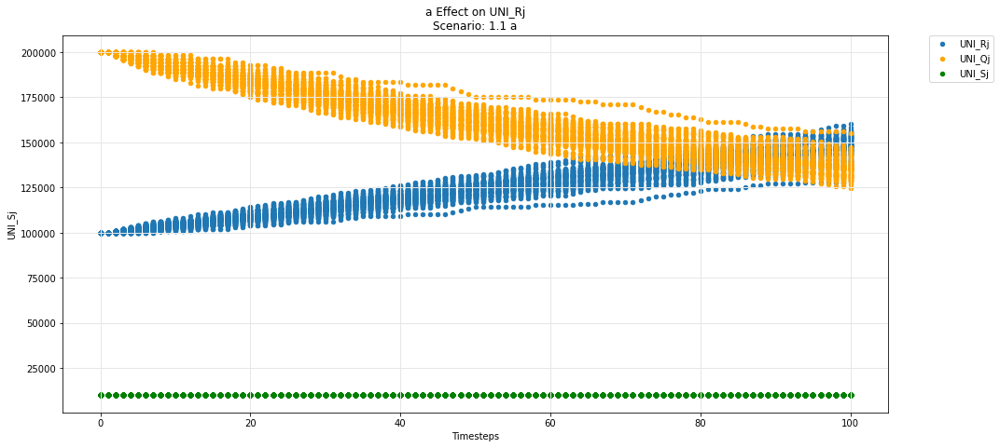

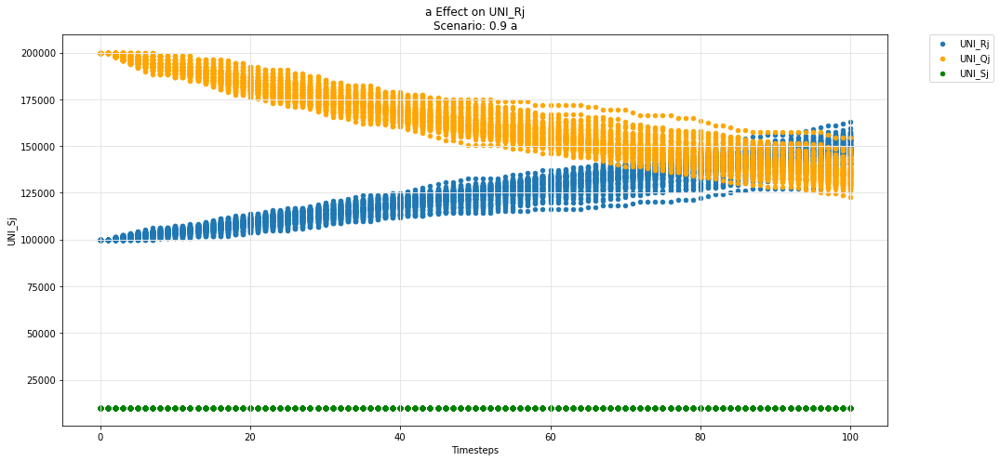

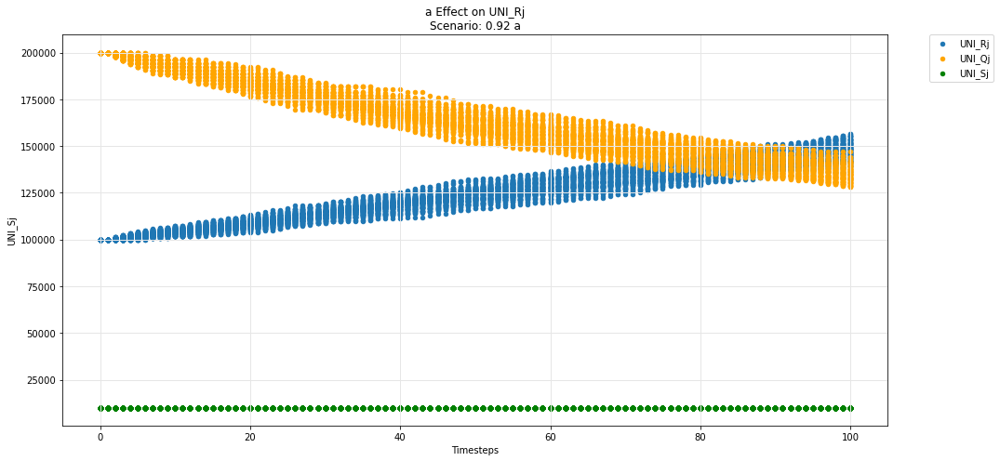

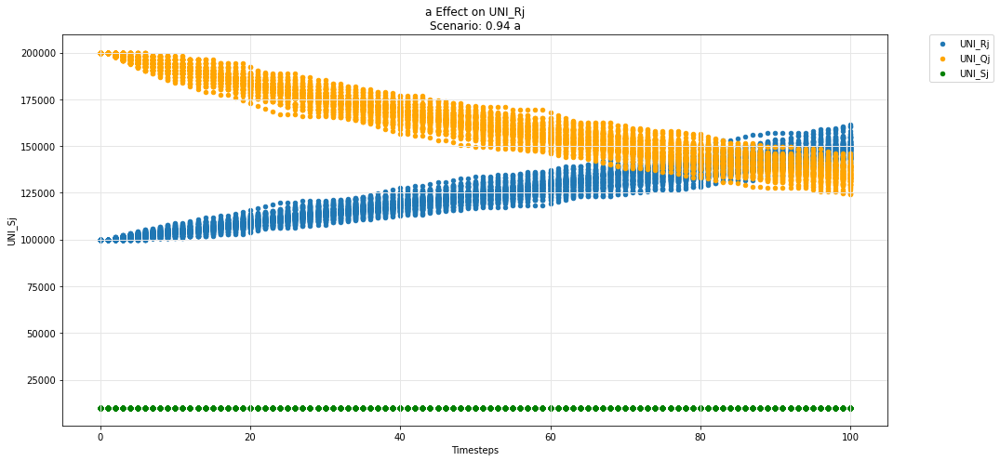

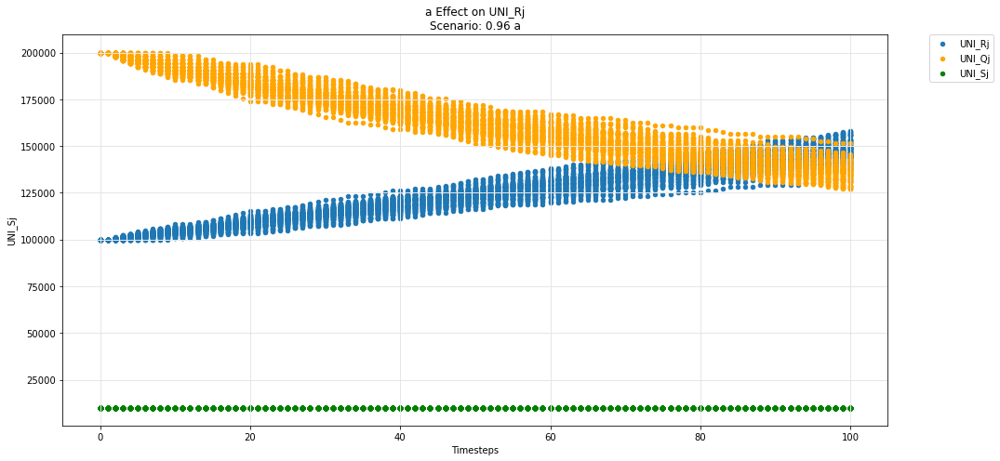

...

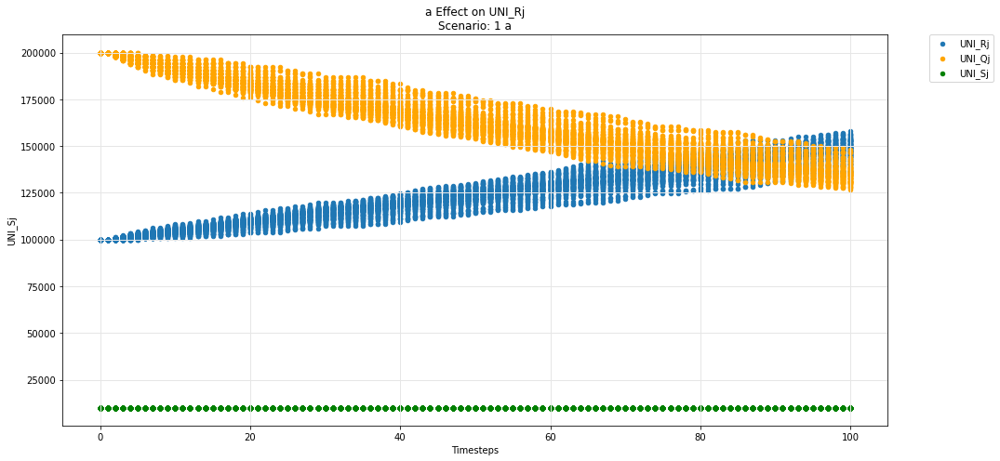

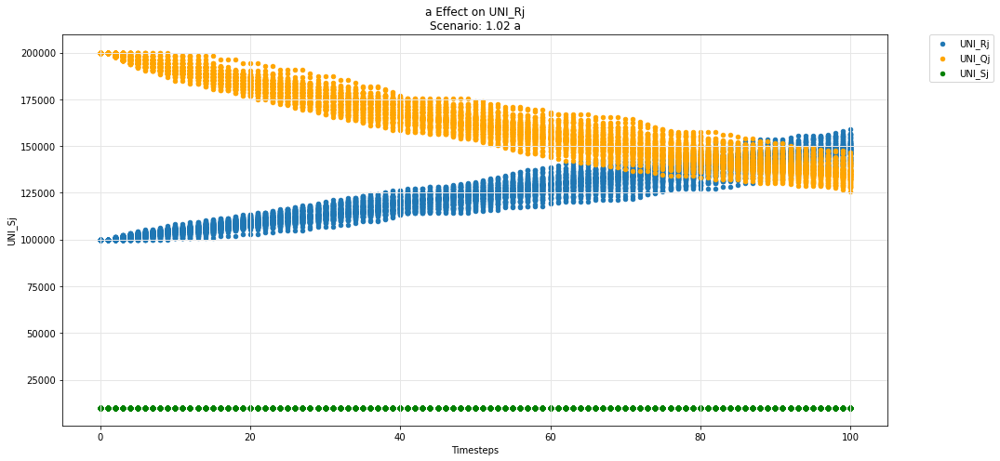

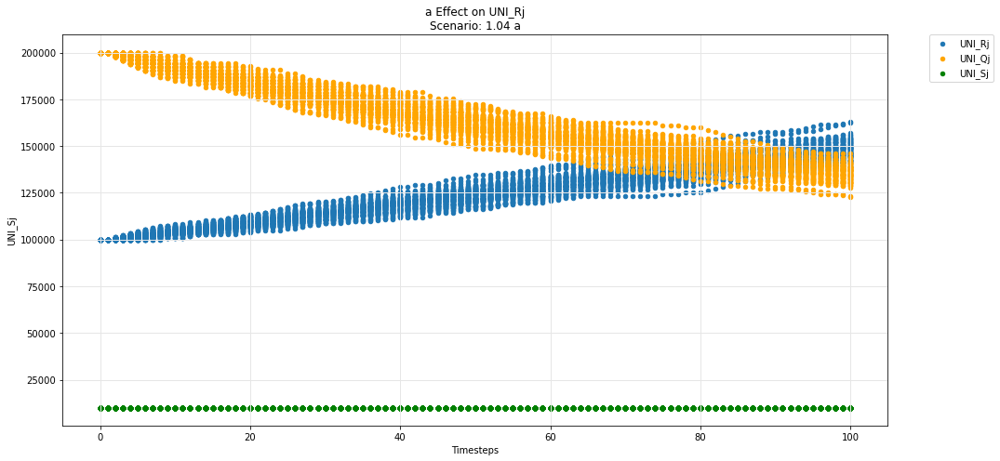

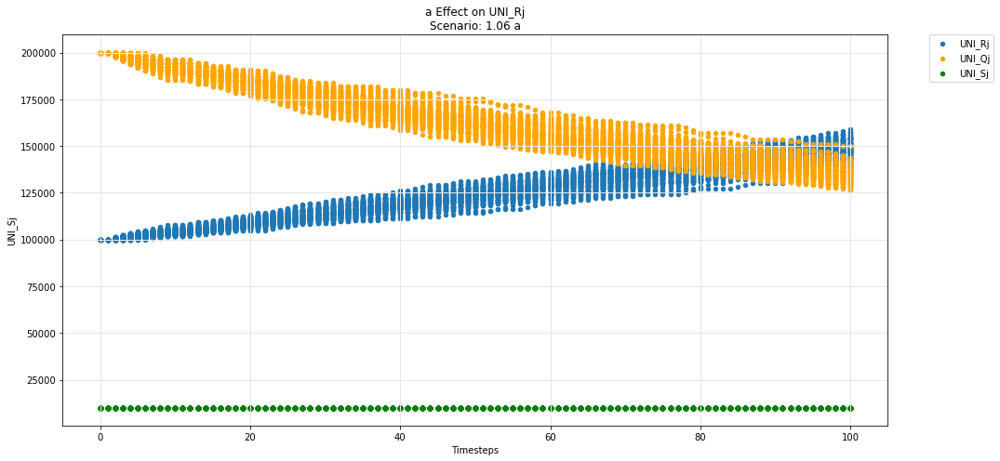

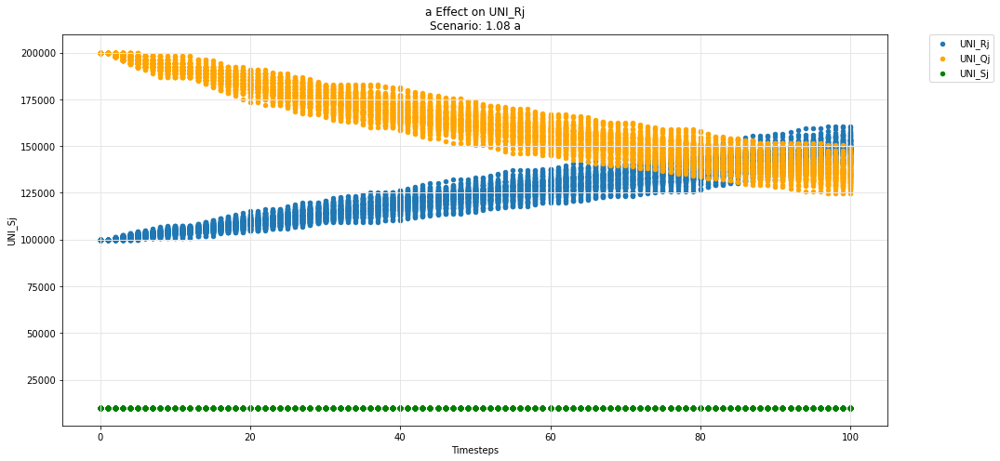

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

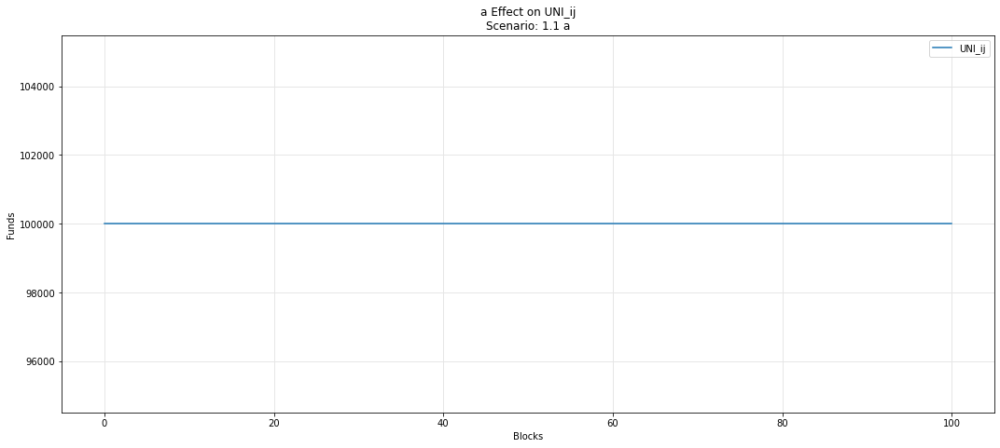

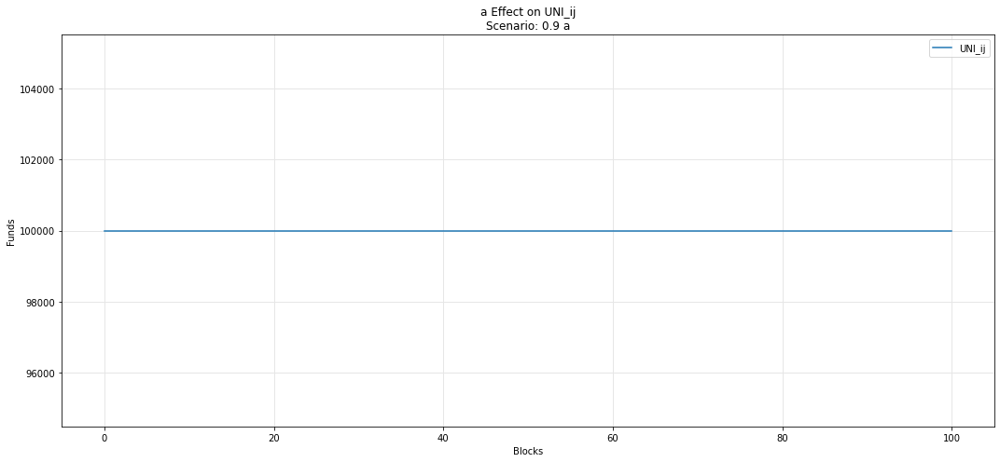

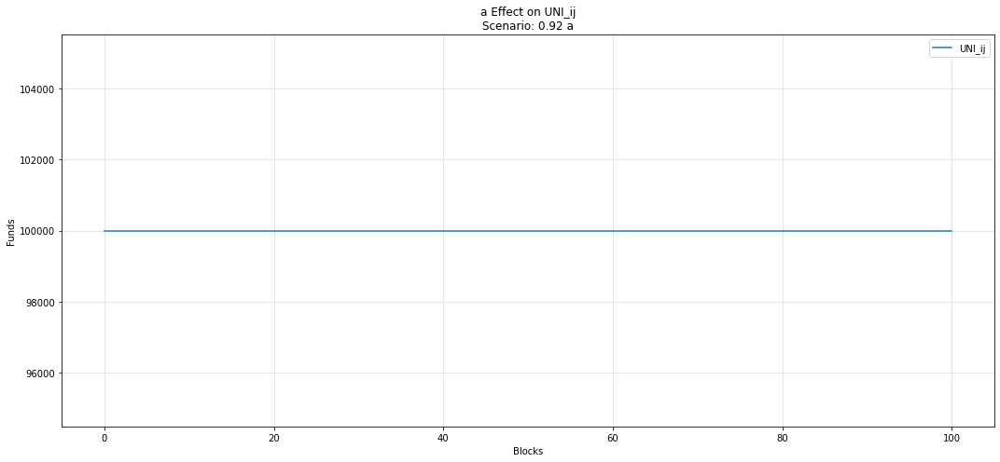

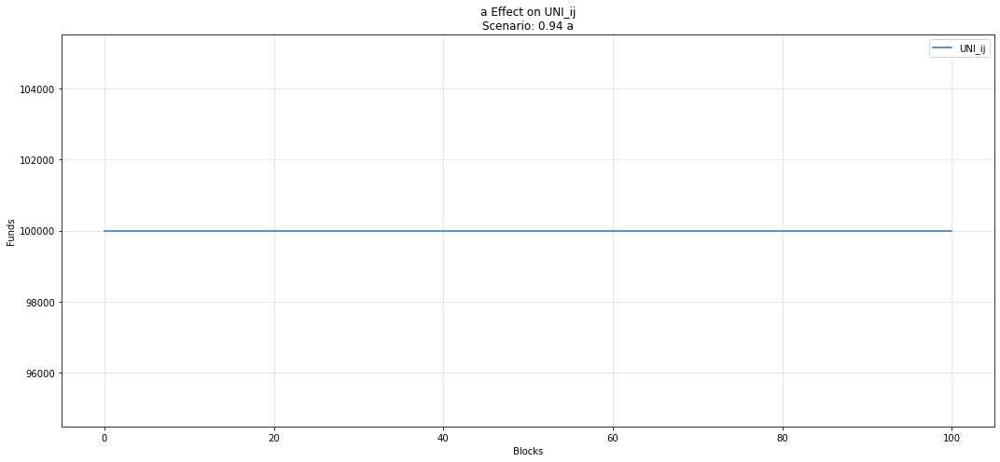

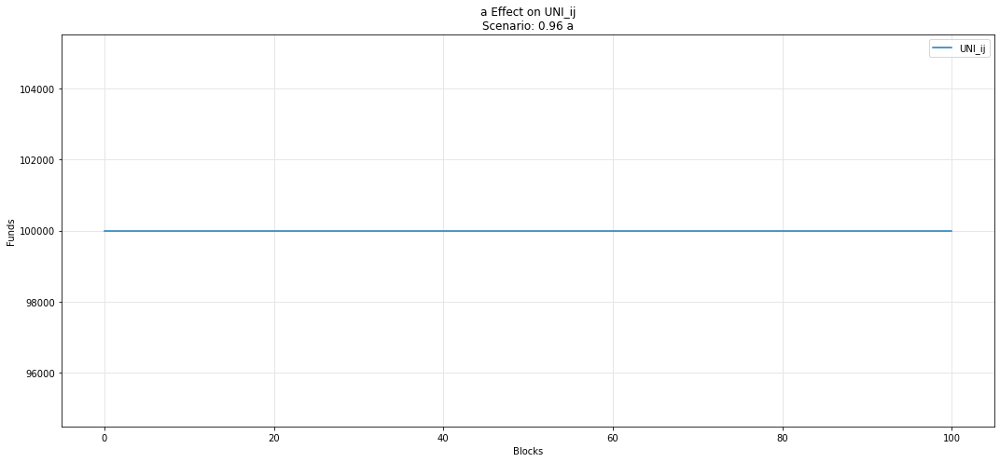

...

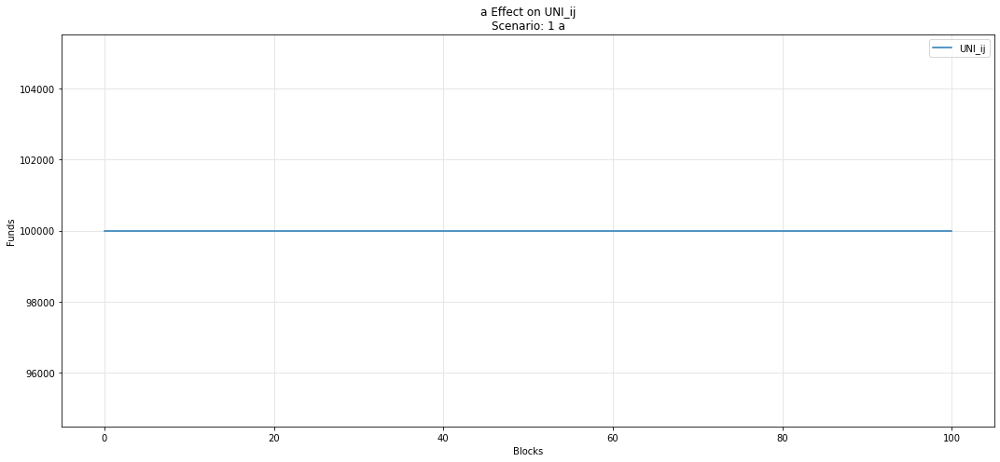

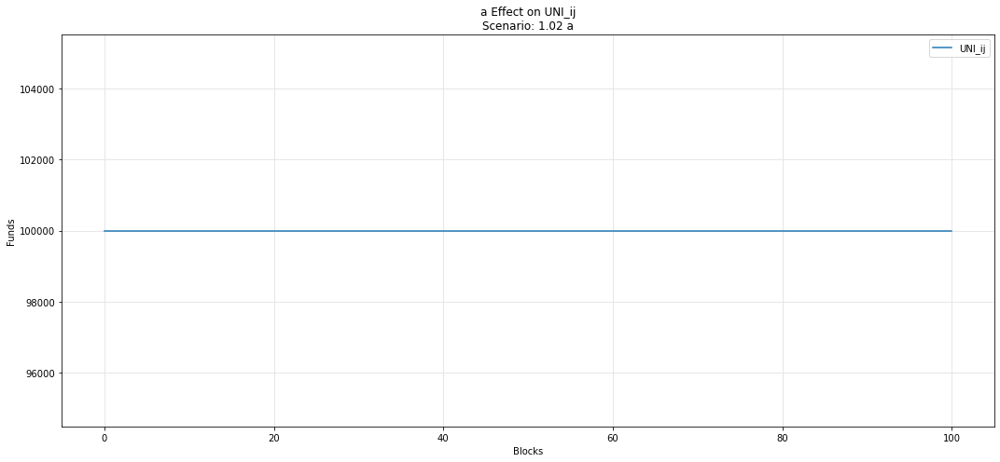

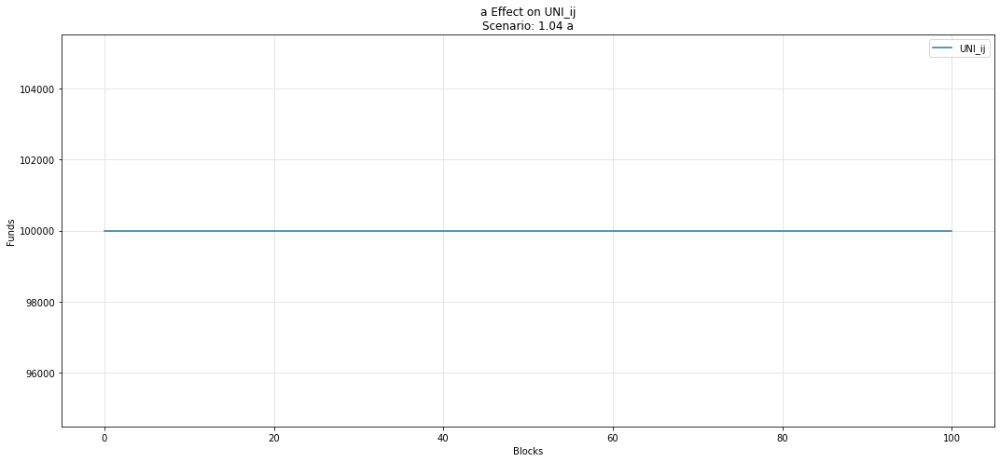

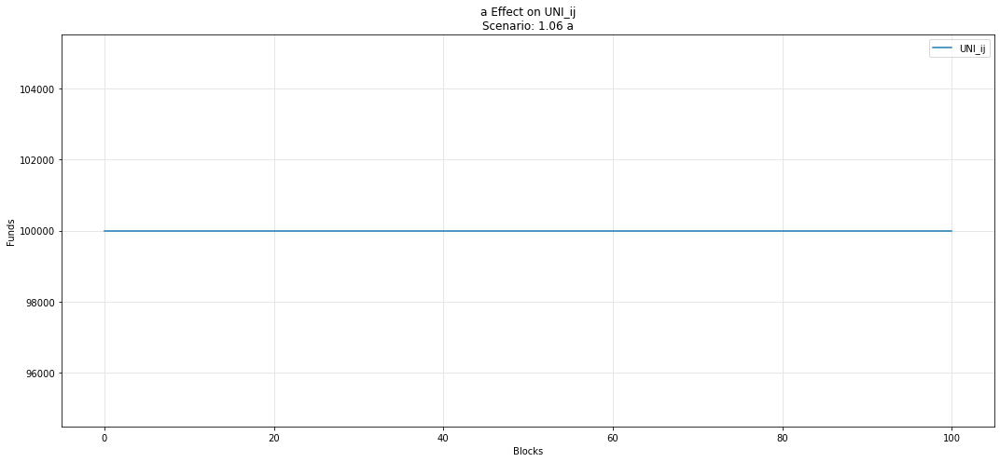

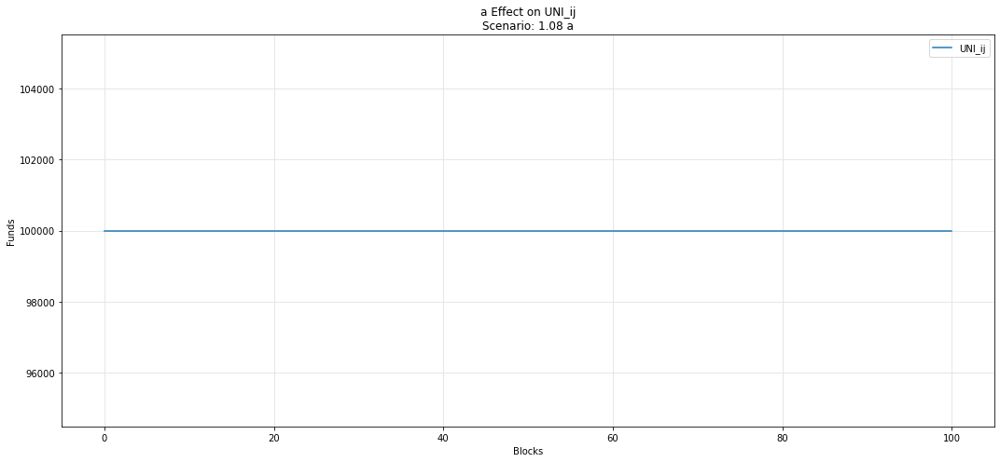

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

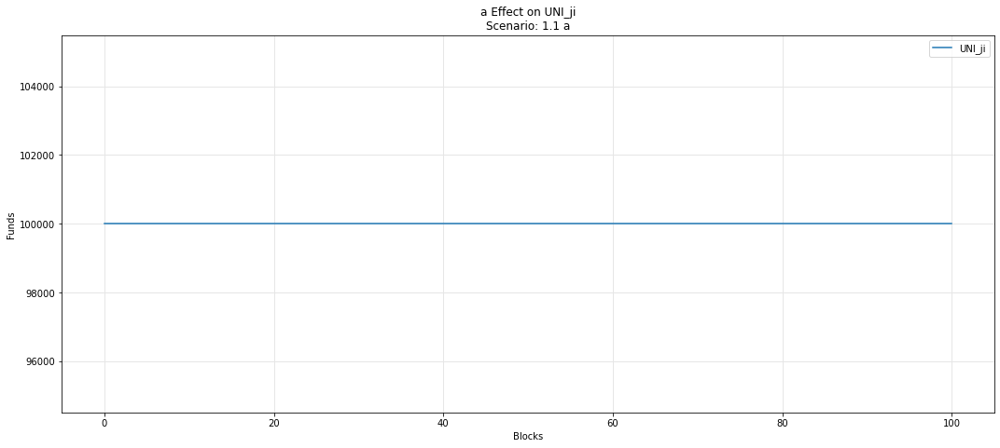

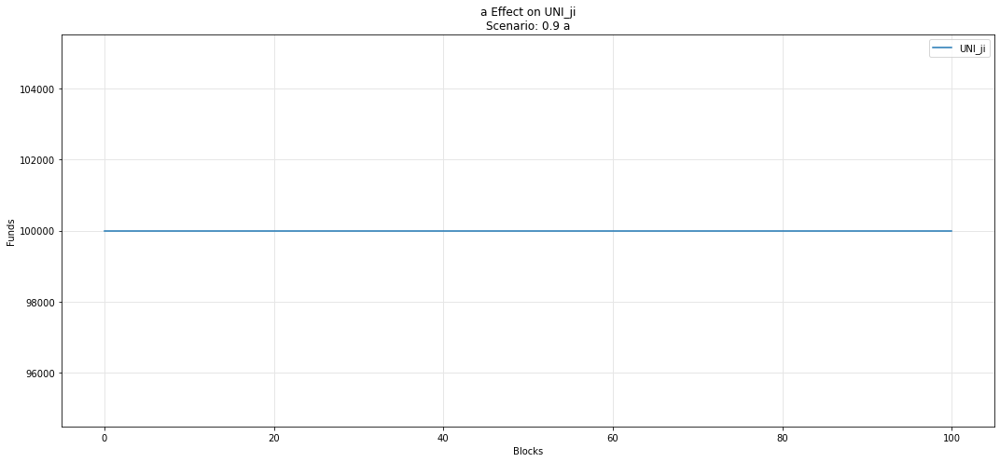

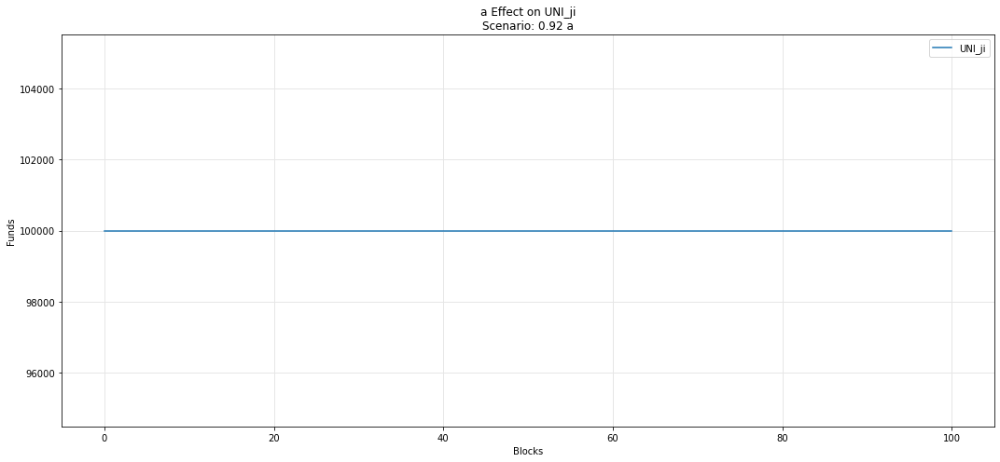

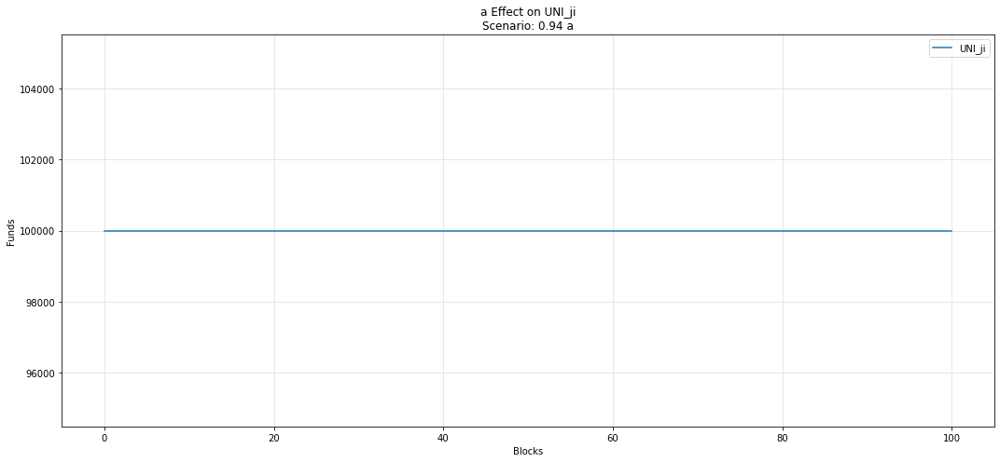

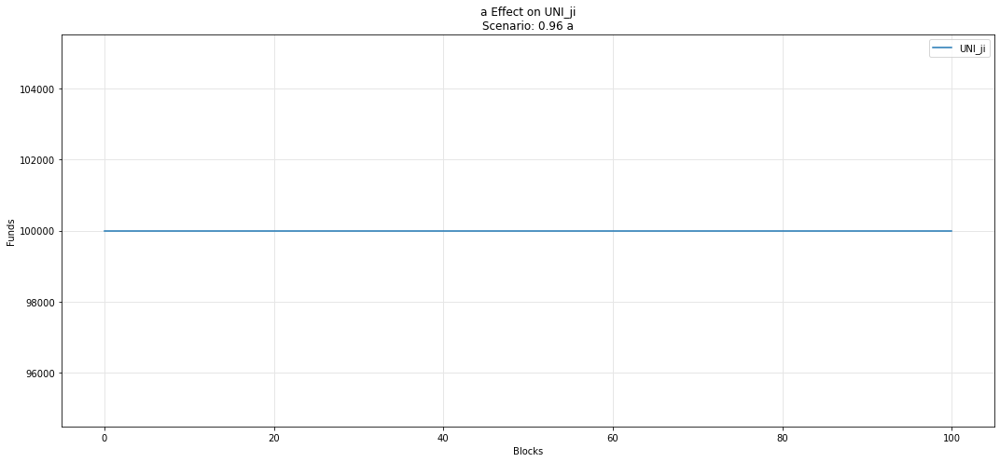

...

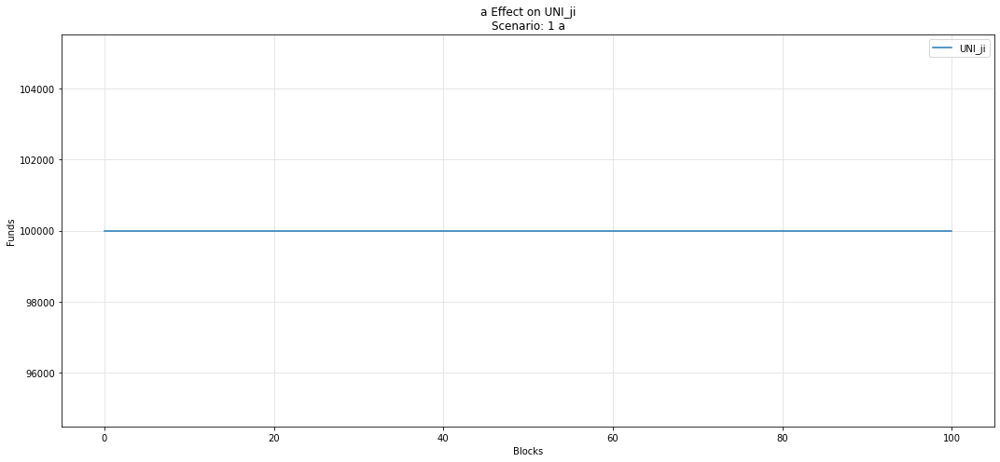

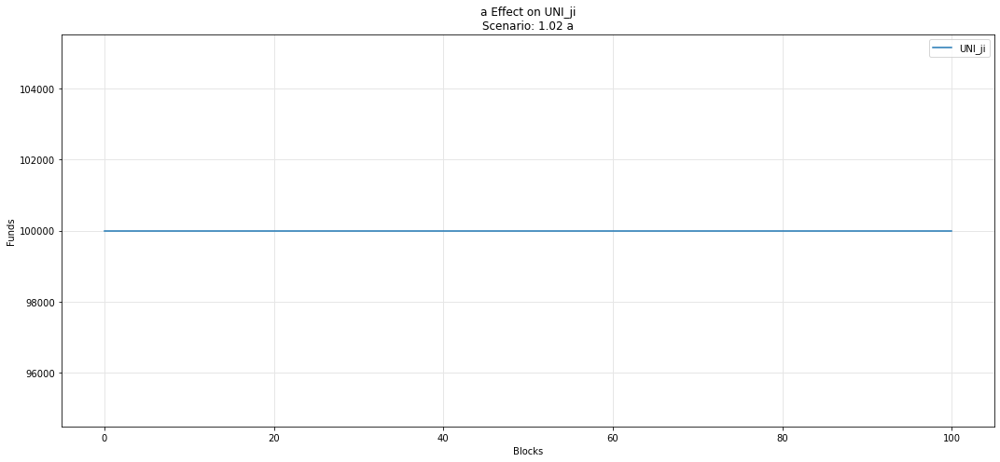

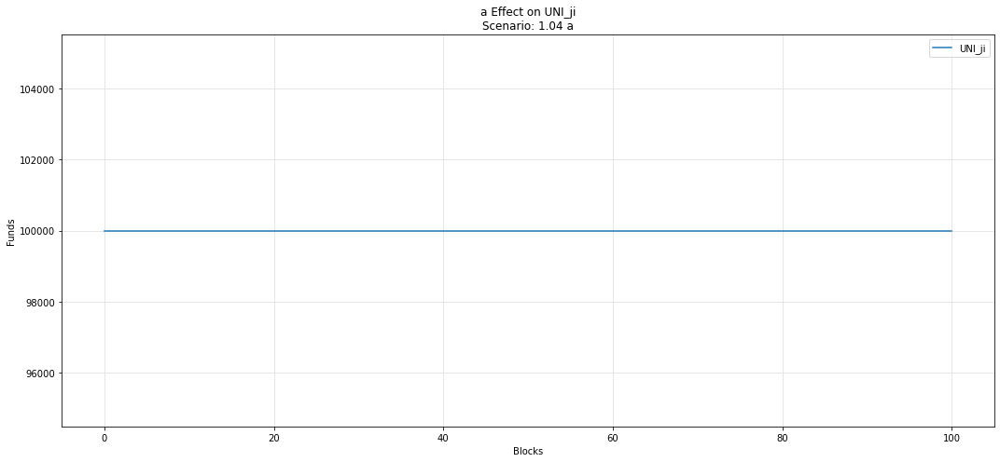

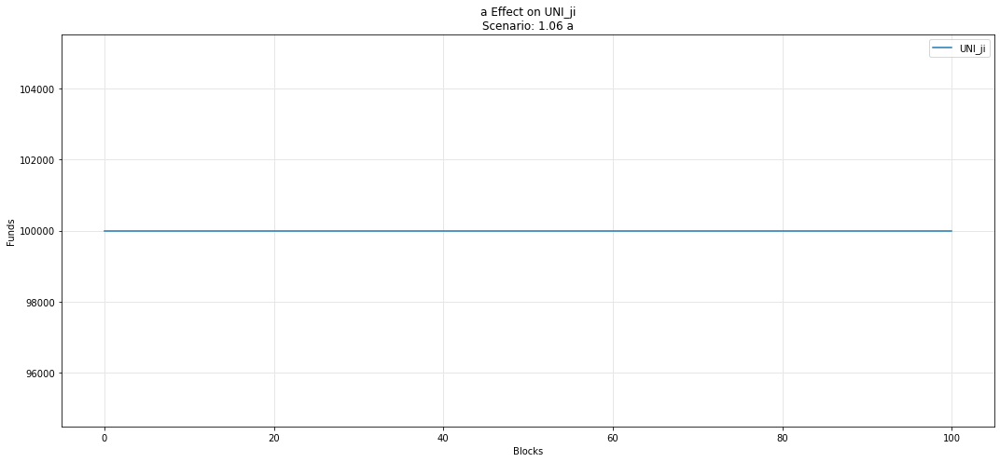

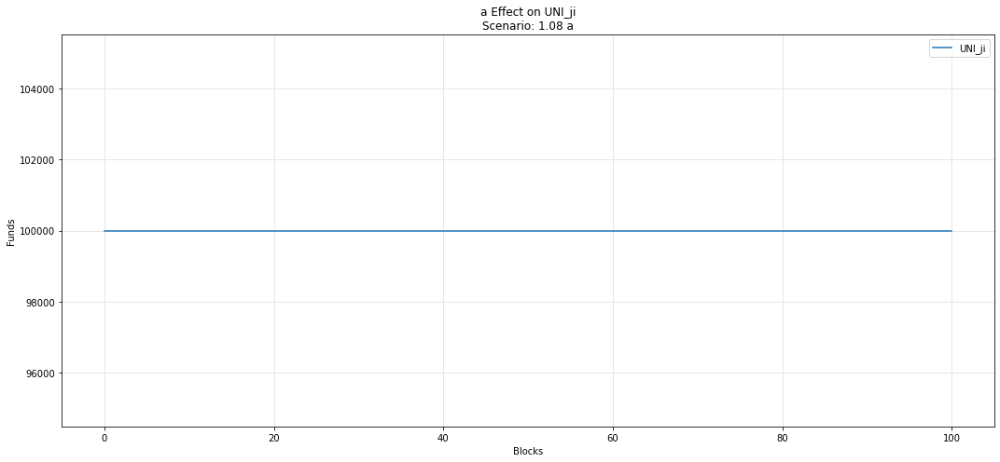

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

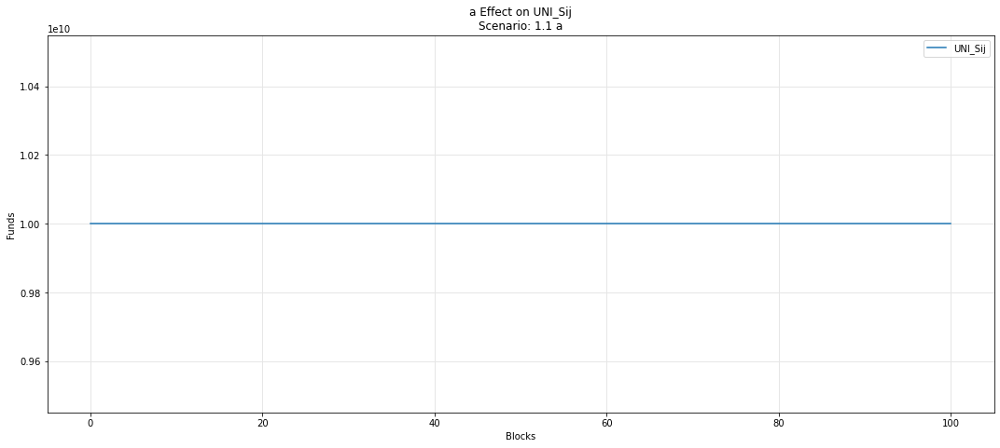

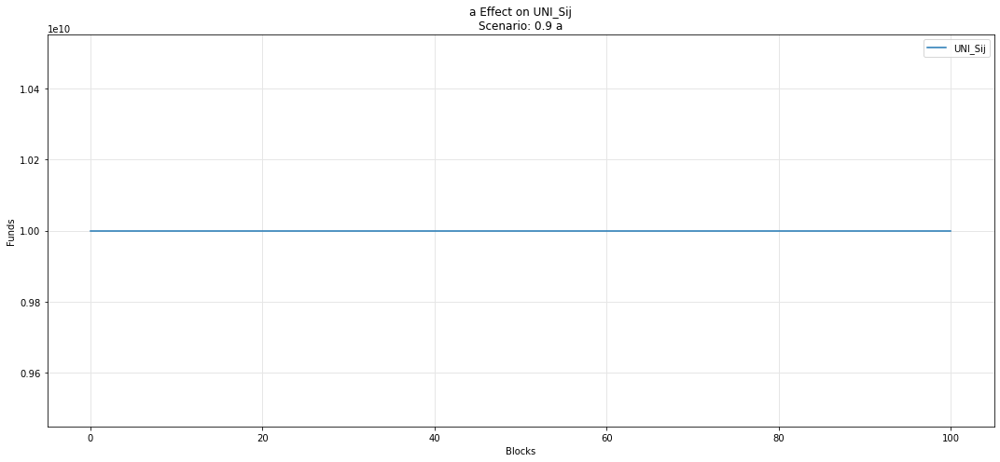

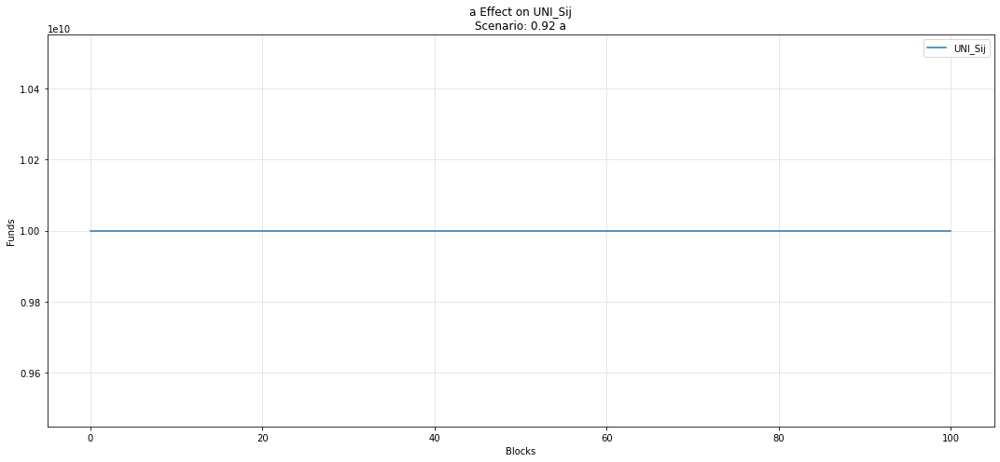

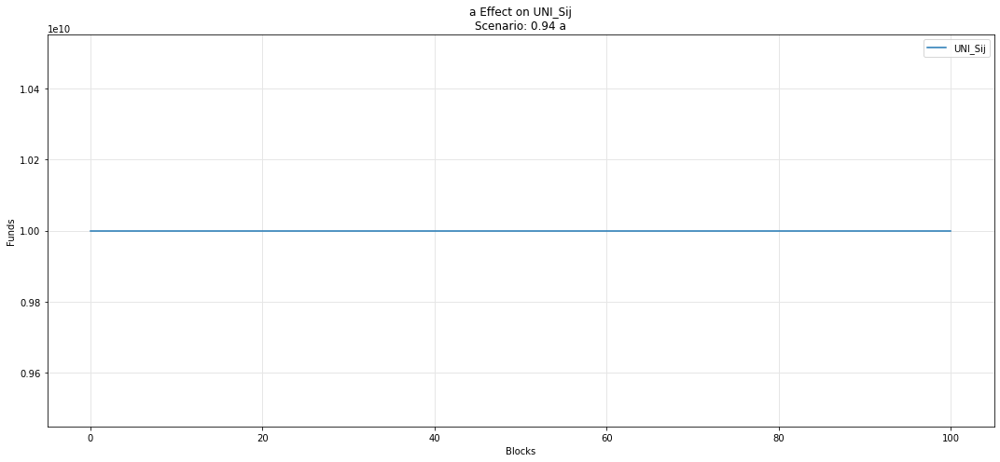

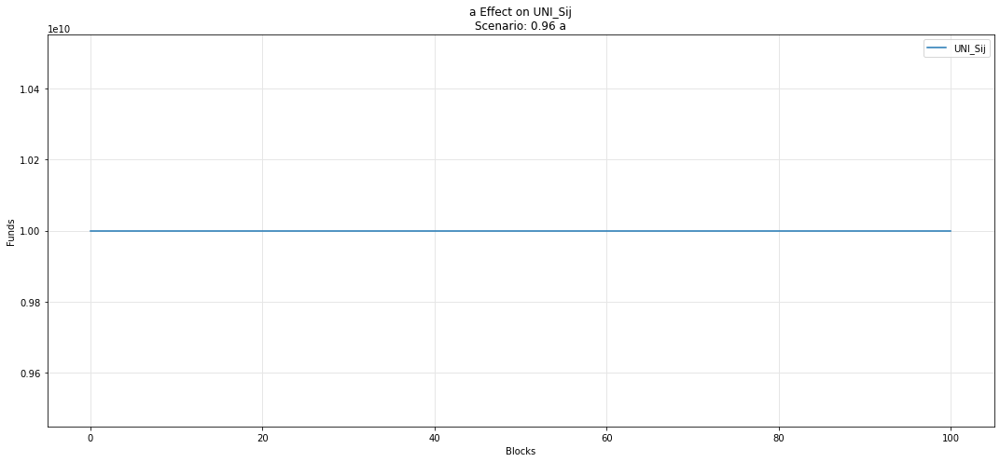

...

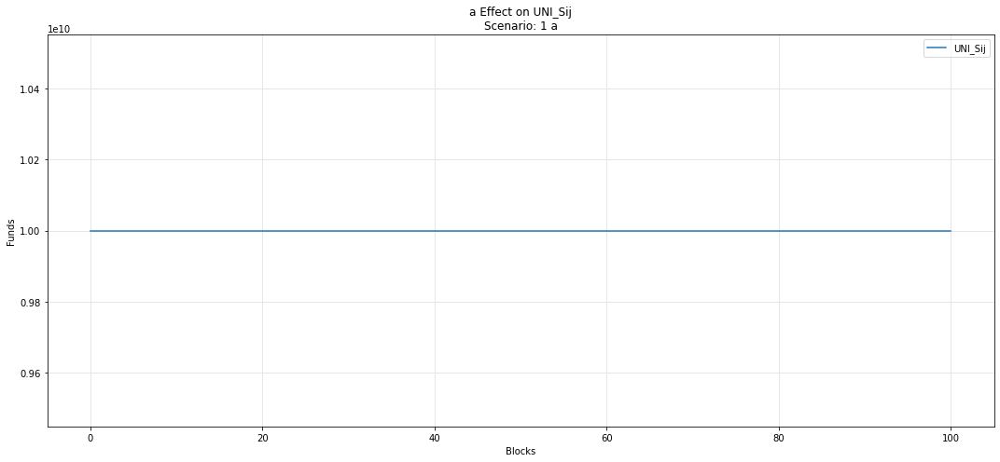

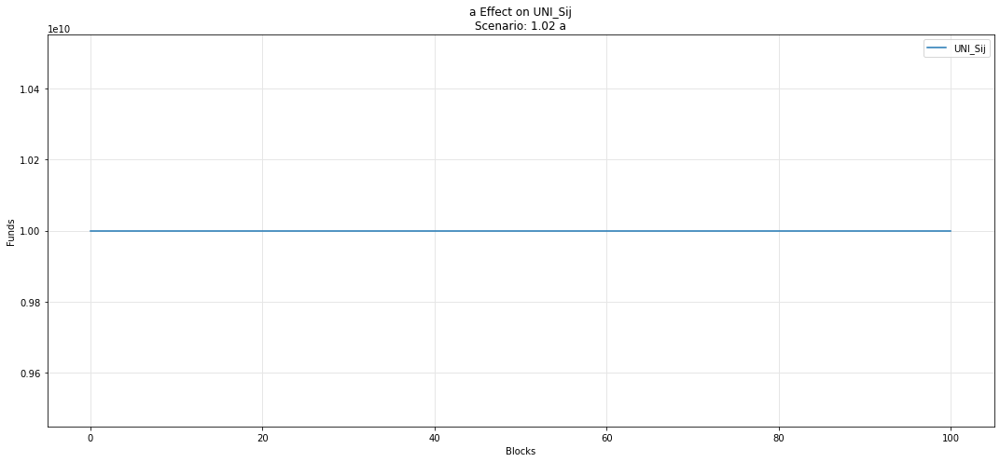

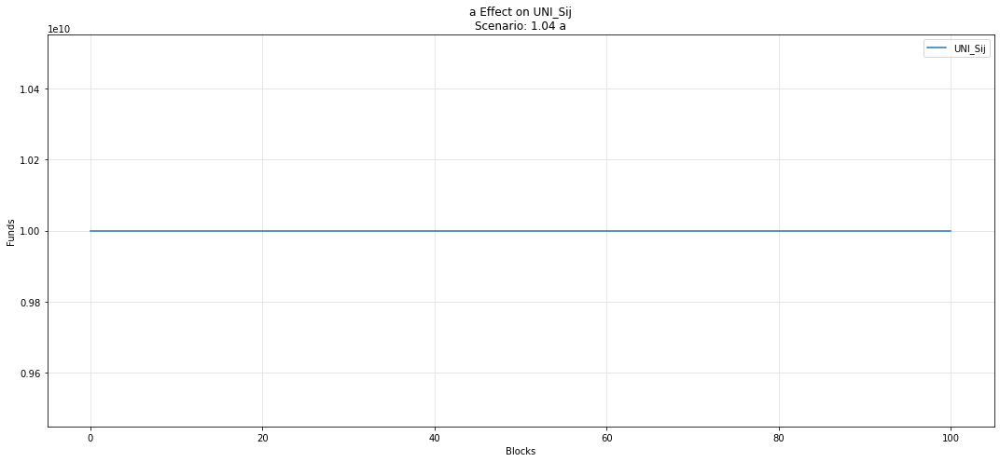

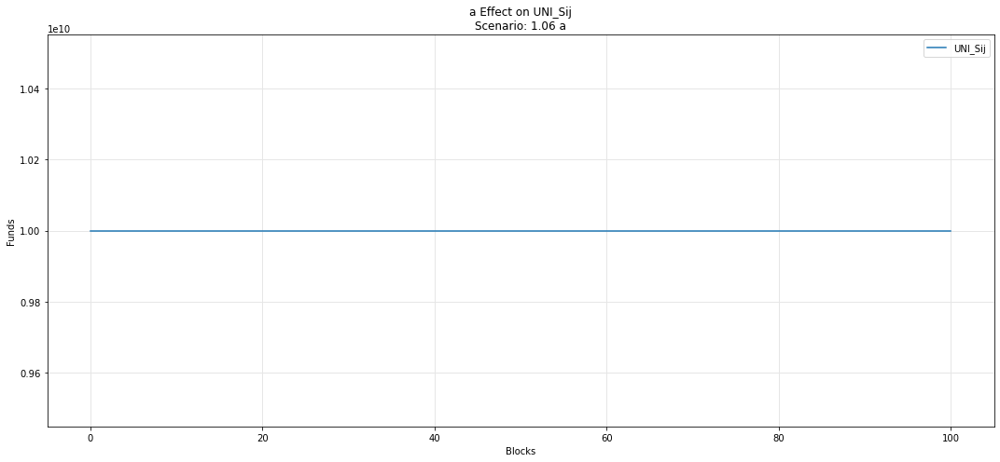

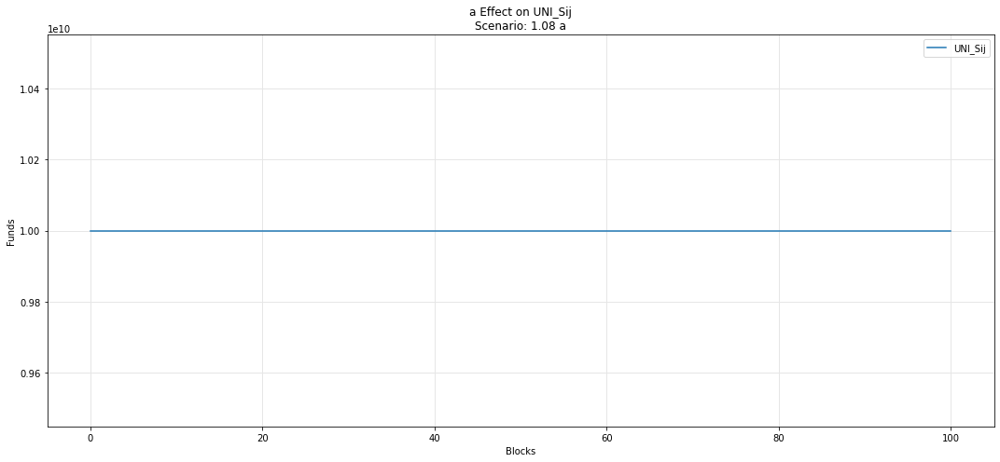

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

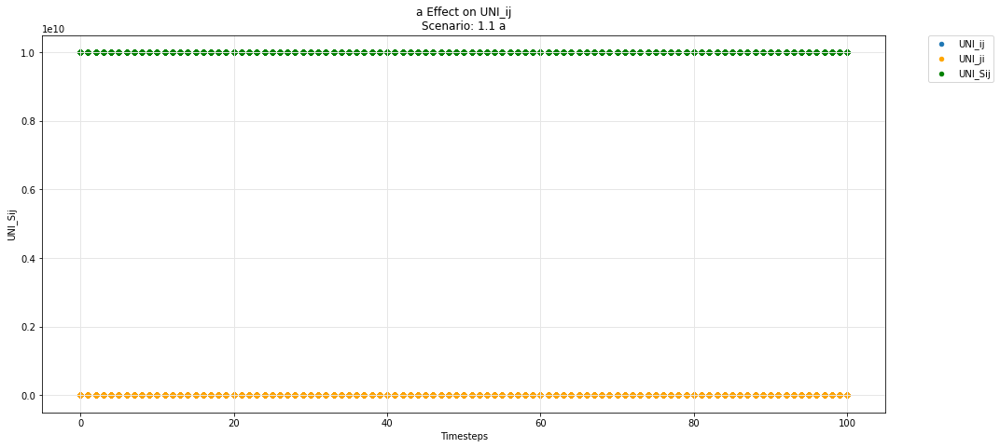

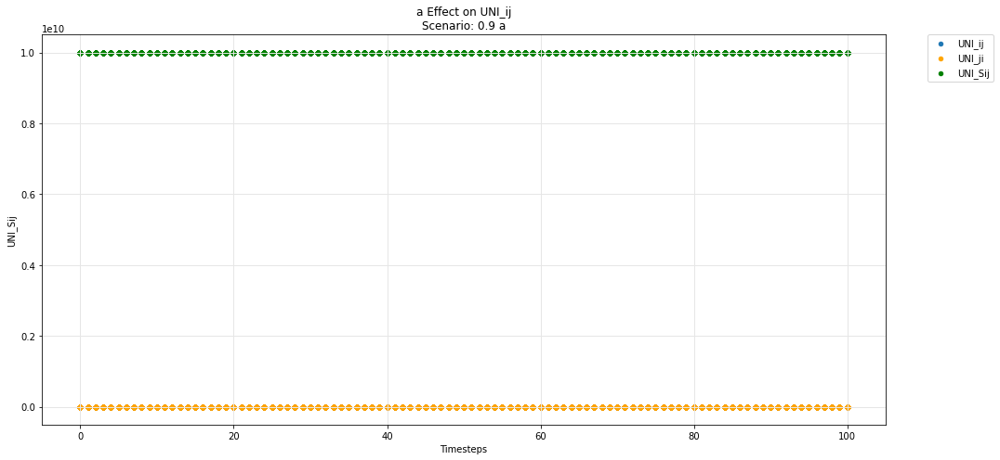

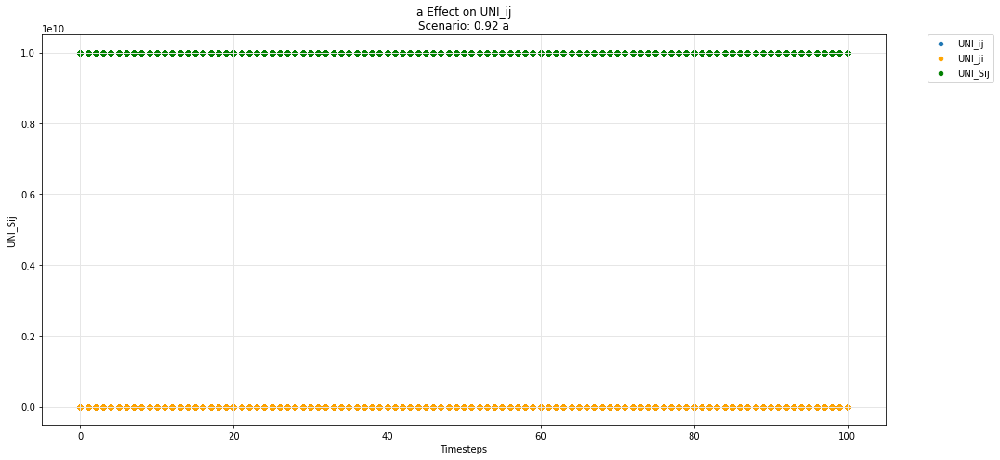

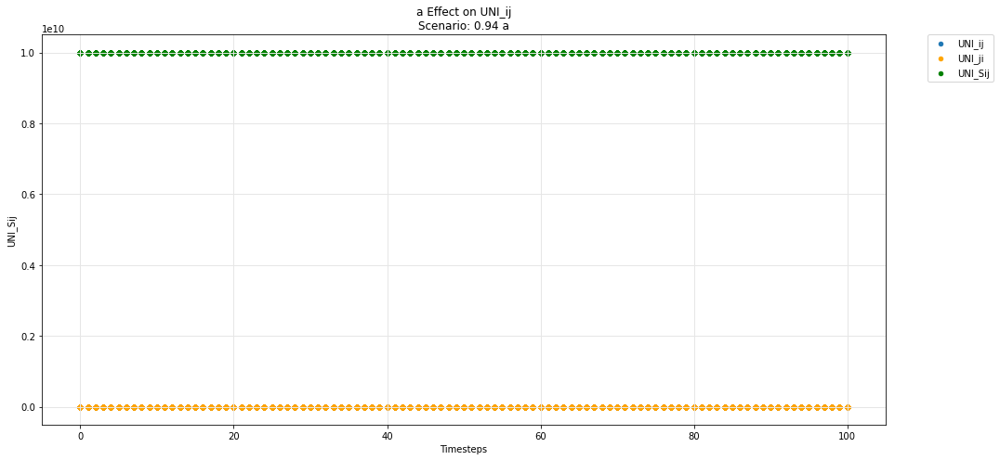

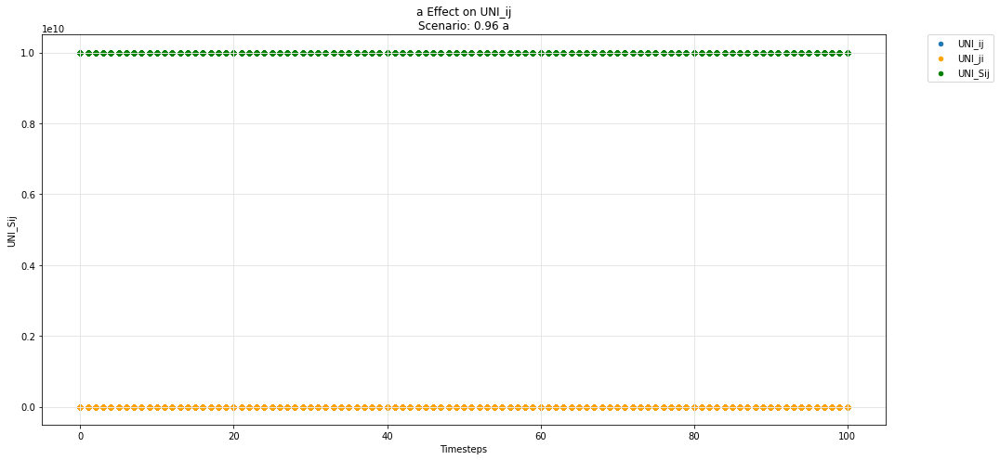

...

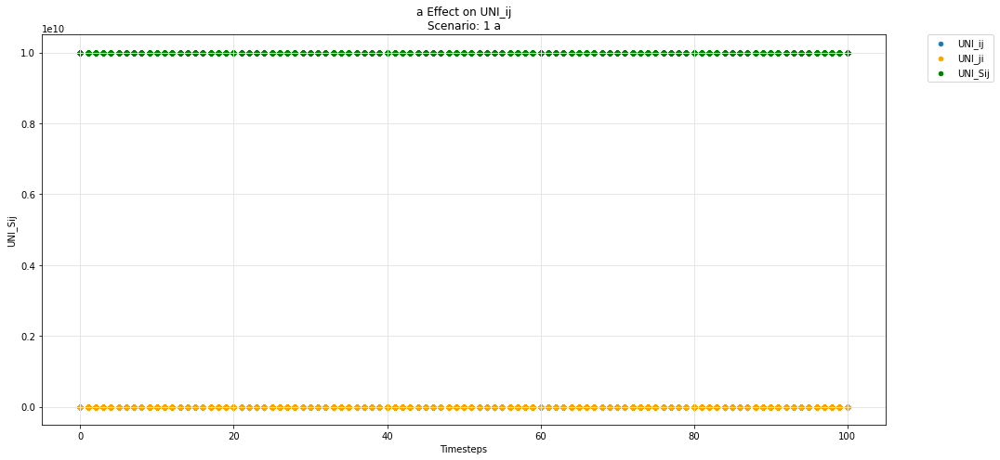

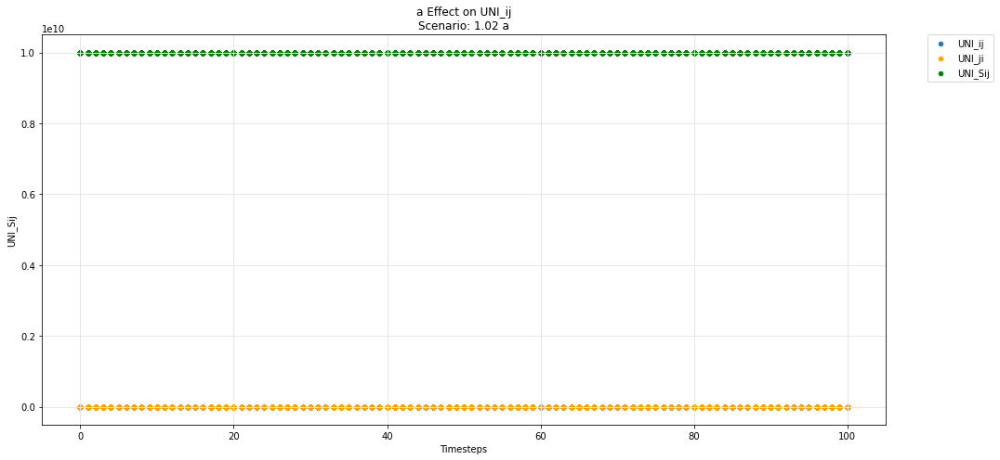

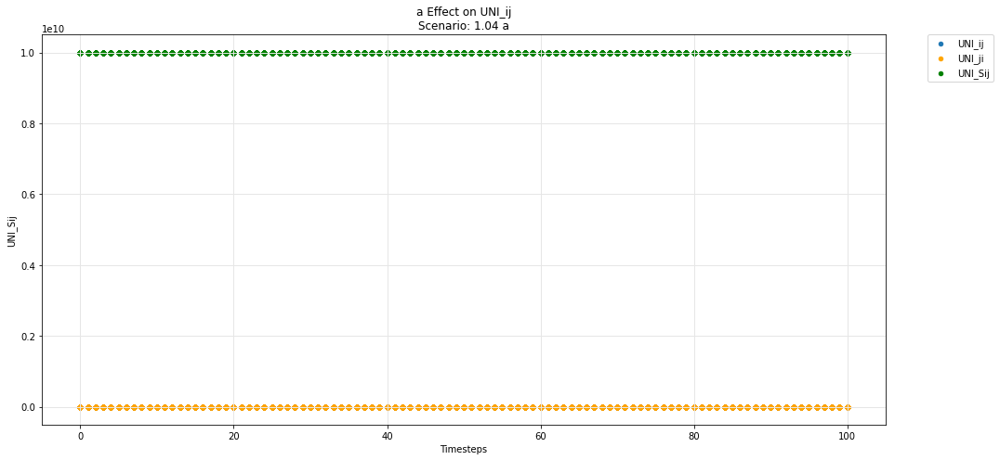

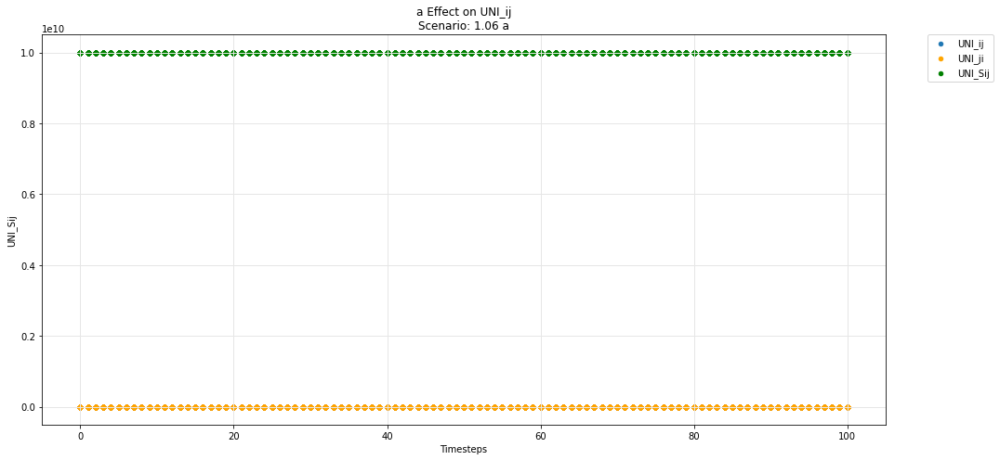

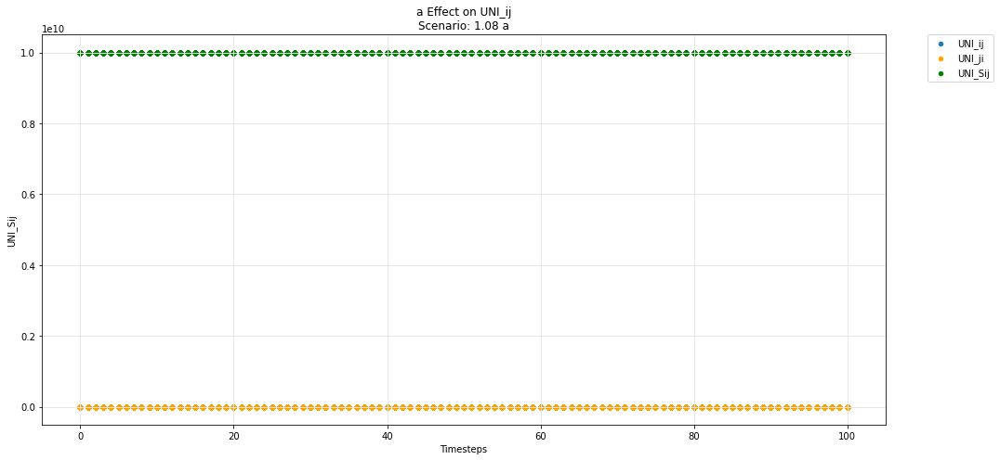

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

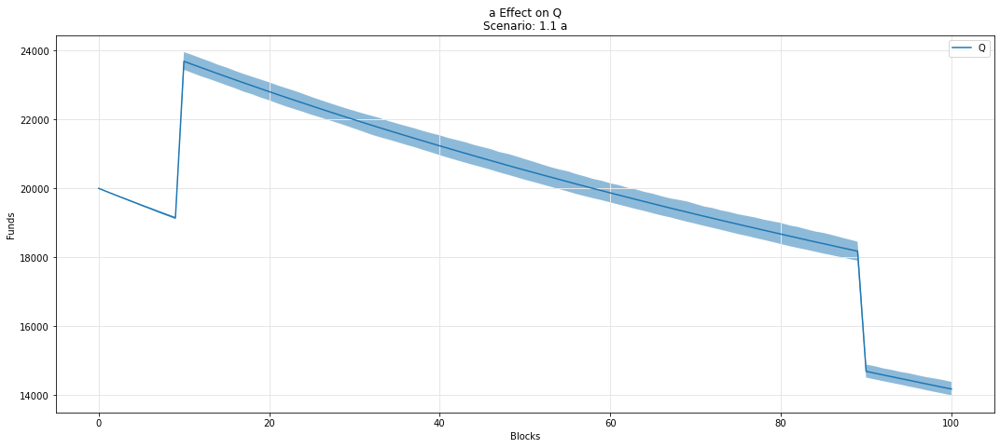

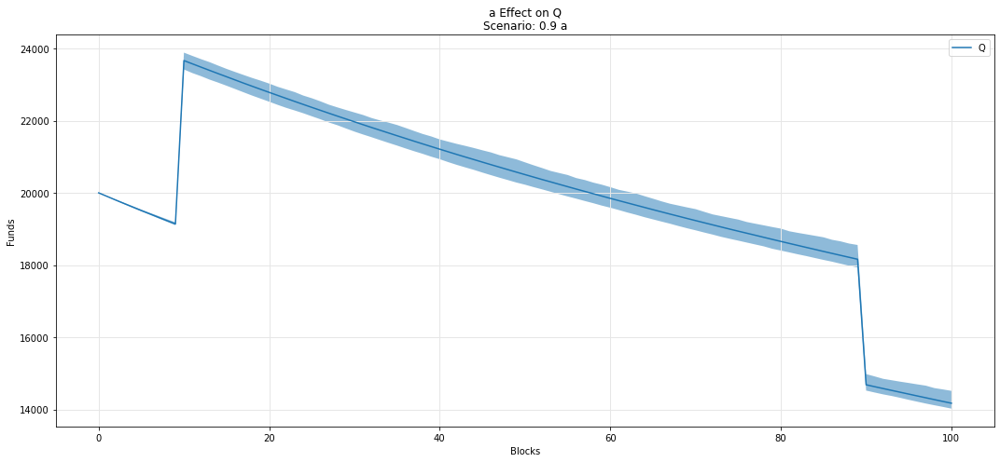

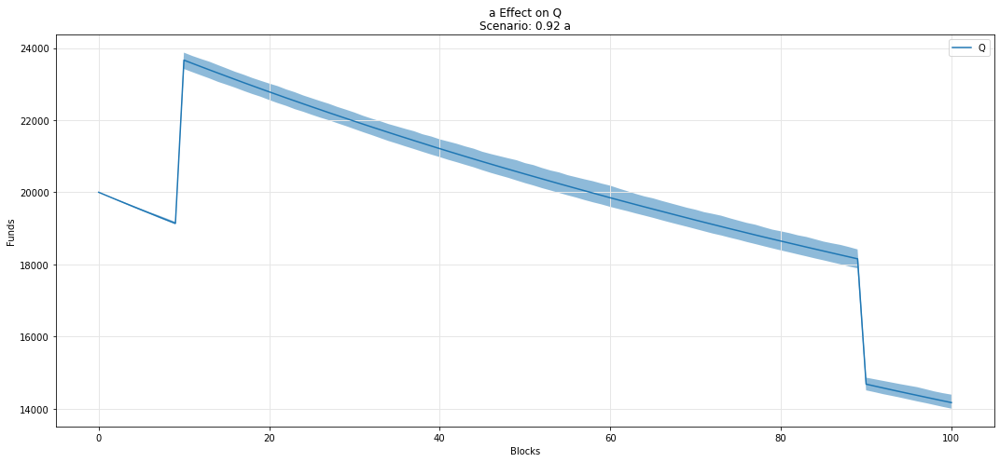

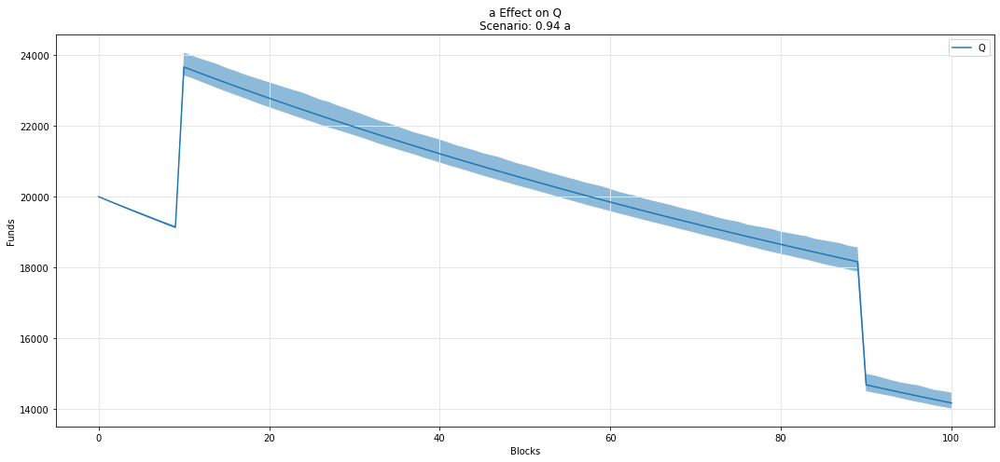

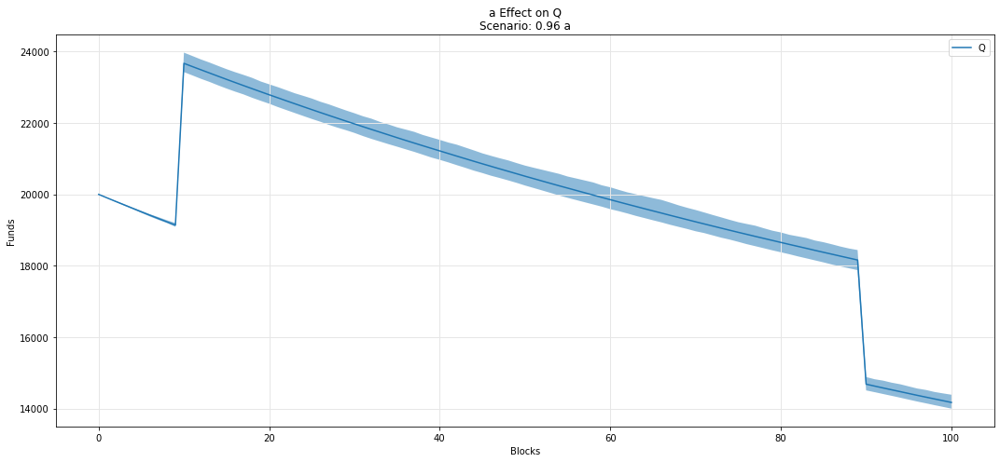

...

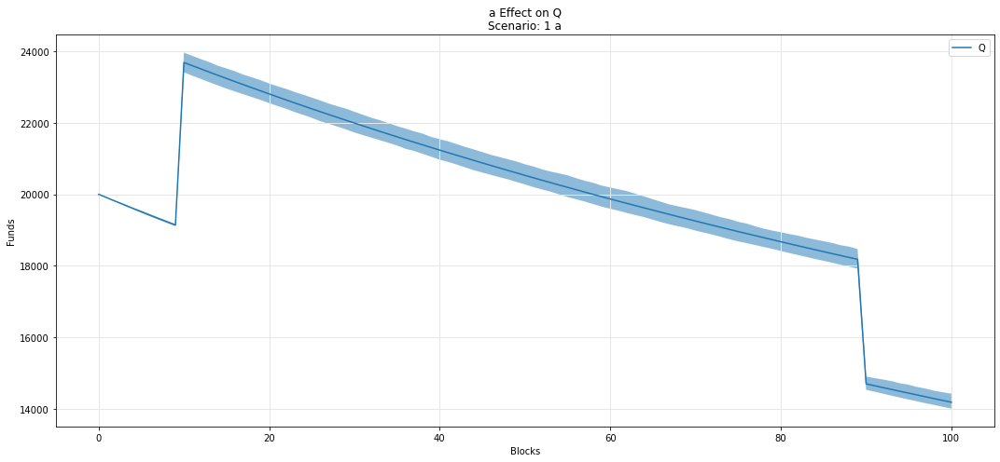

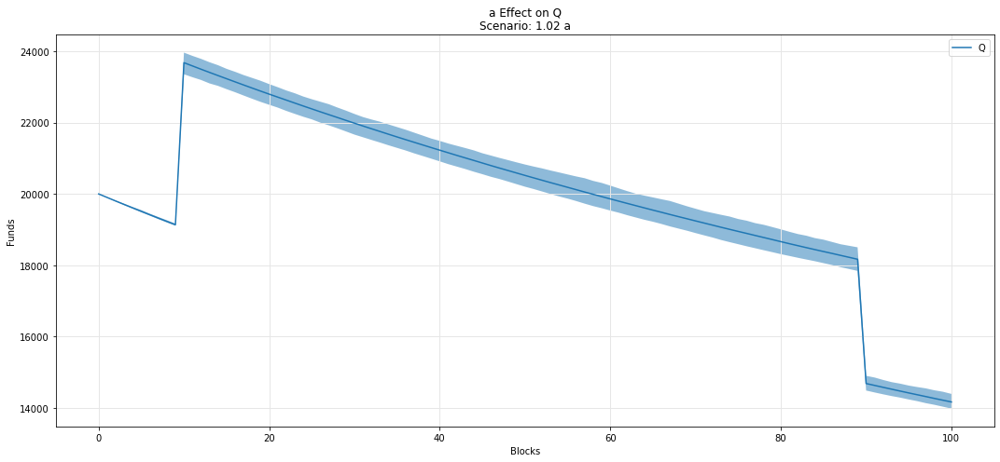

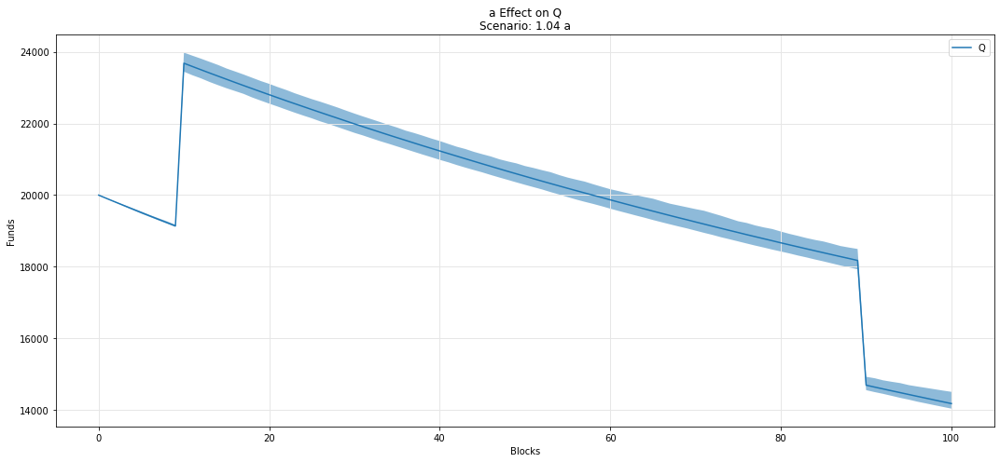

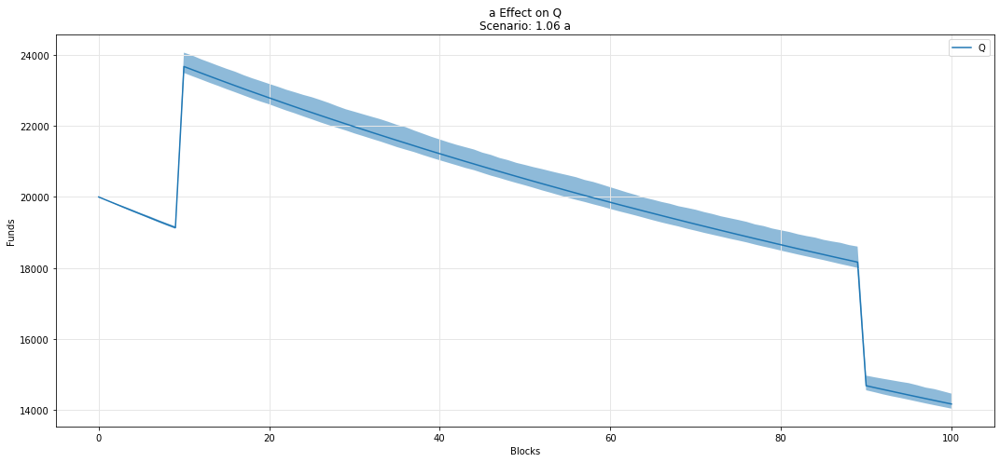

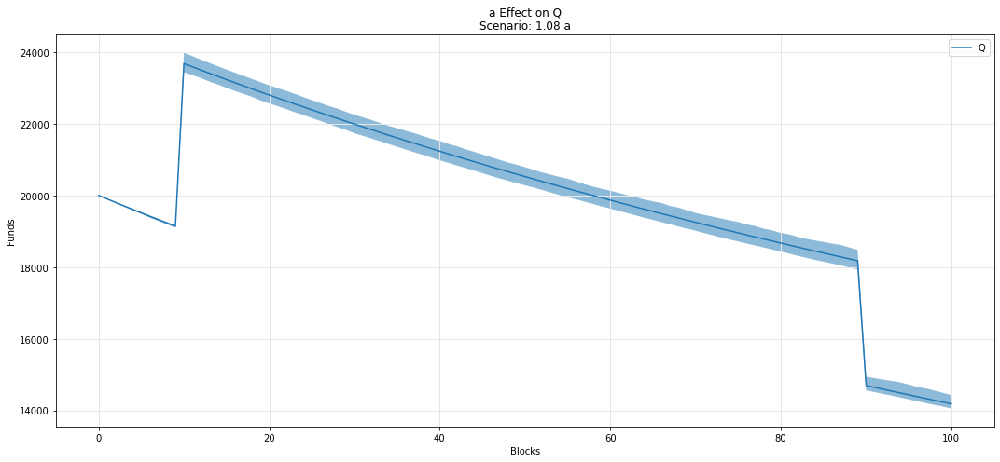

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

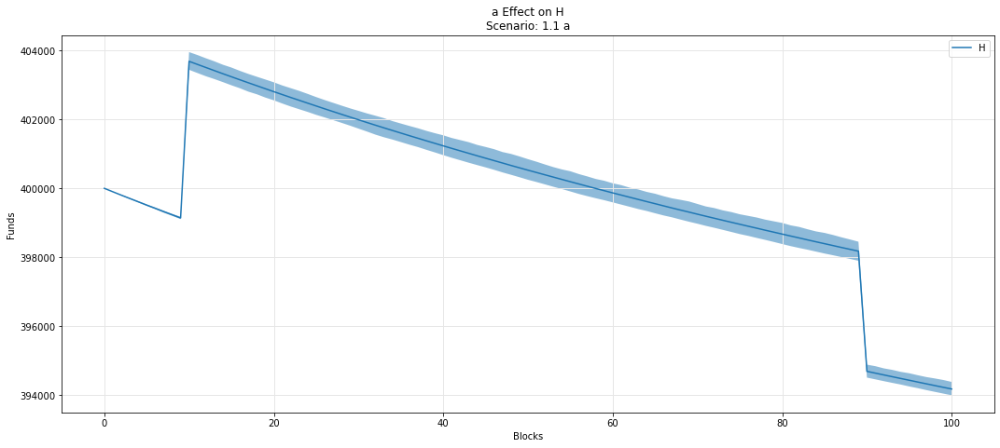

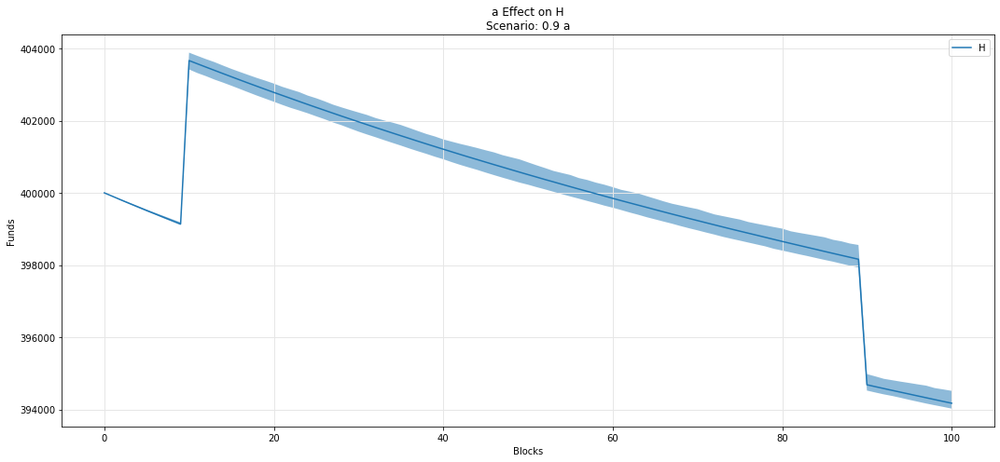

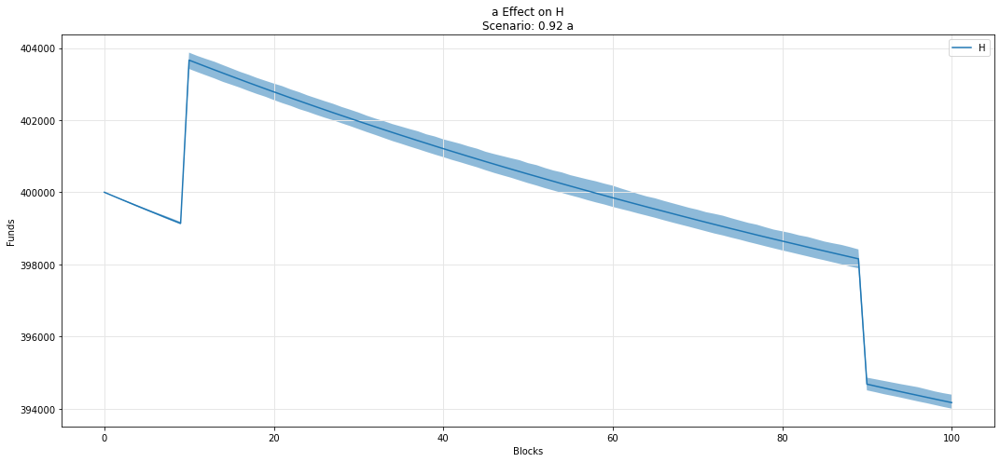

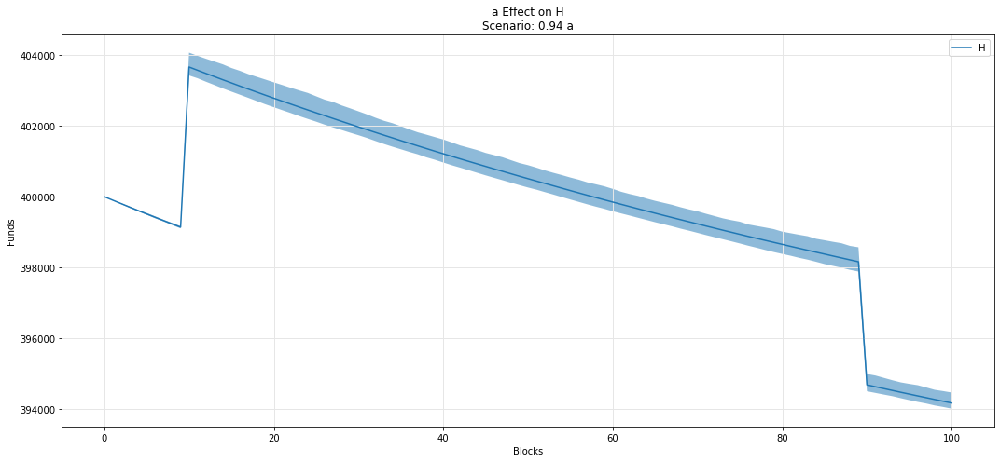

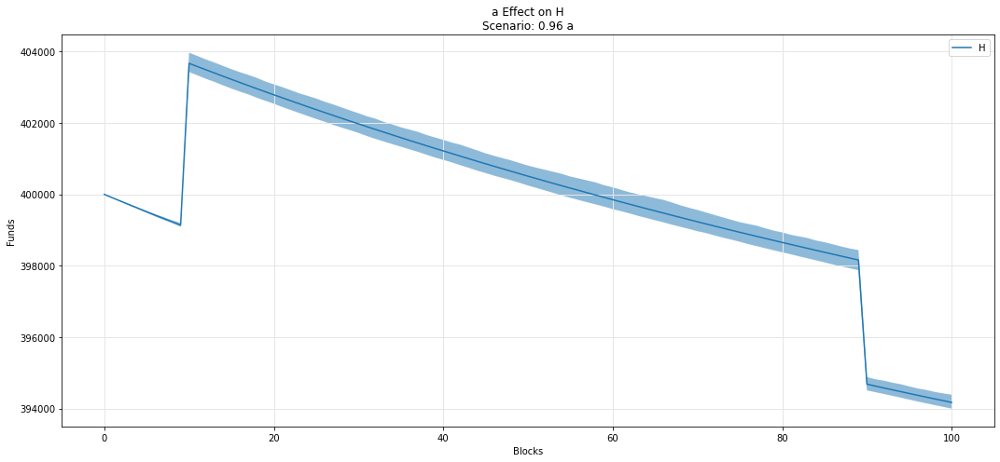

...

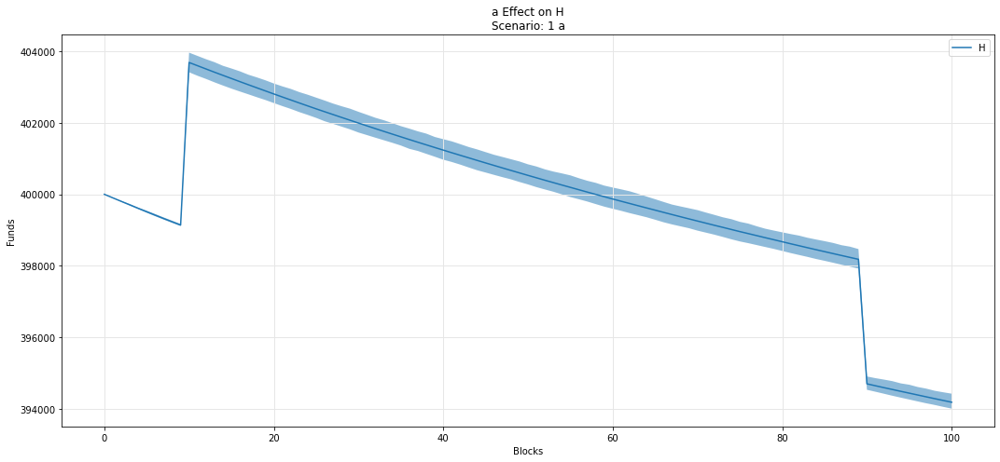

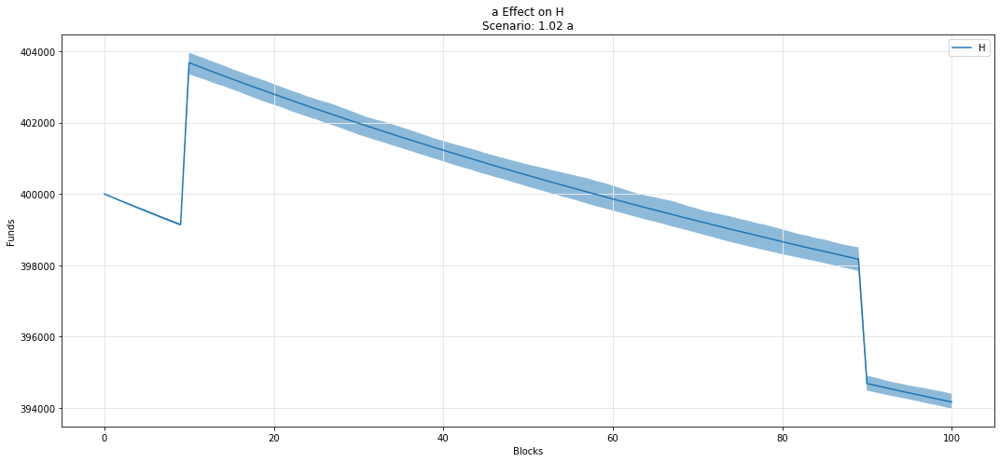

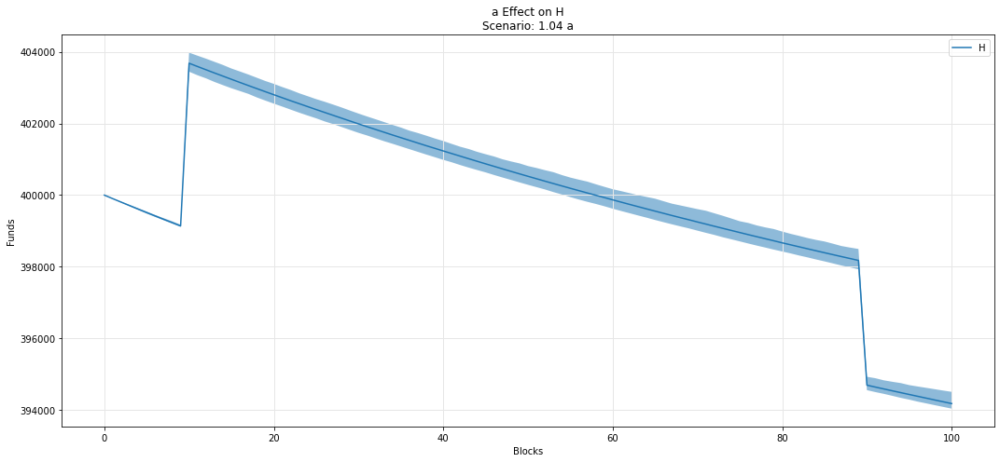

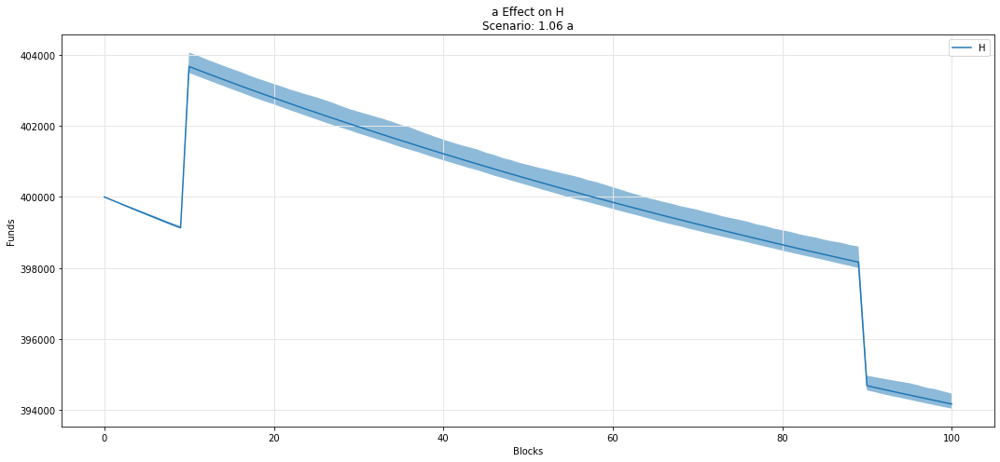

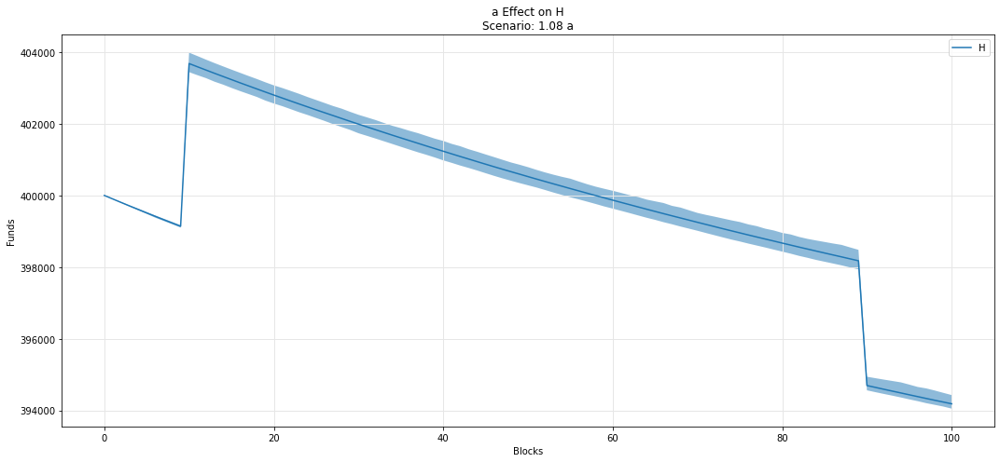

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

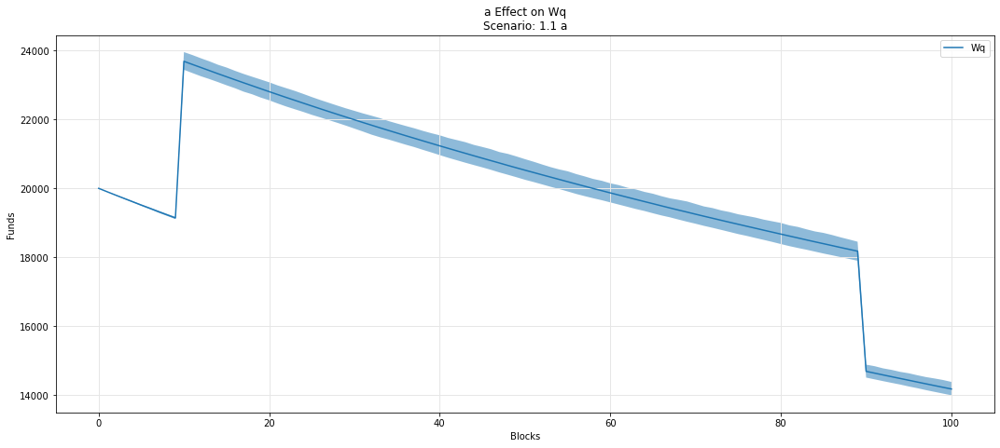

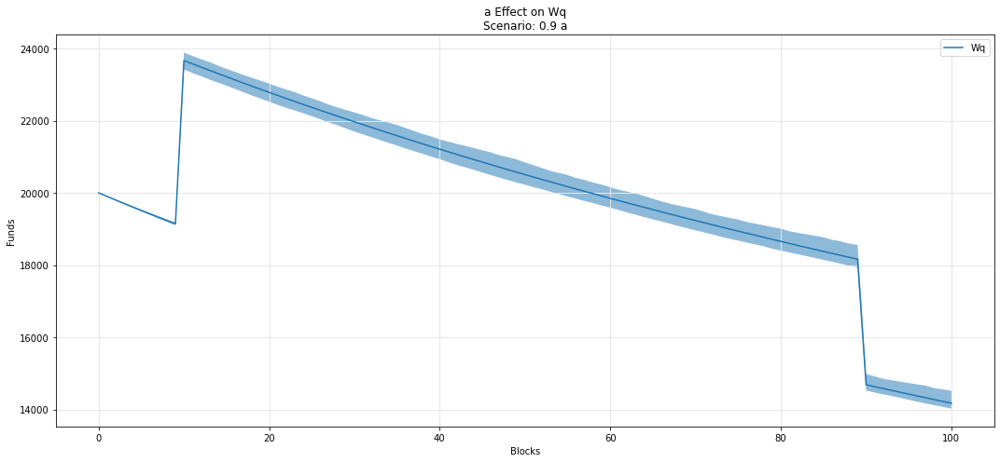

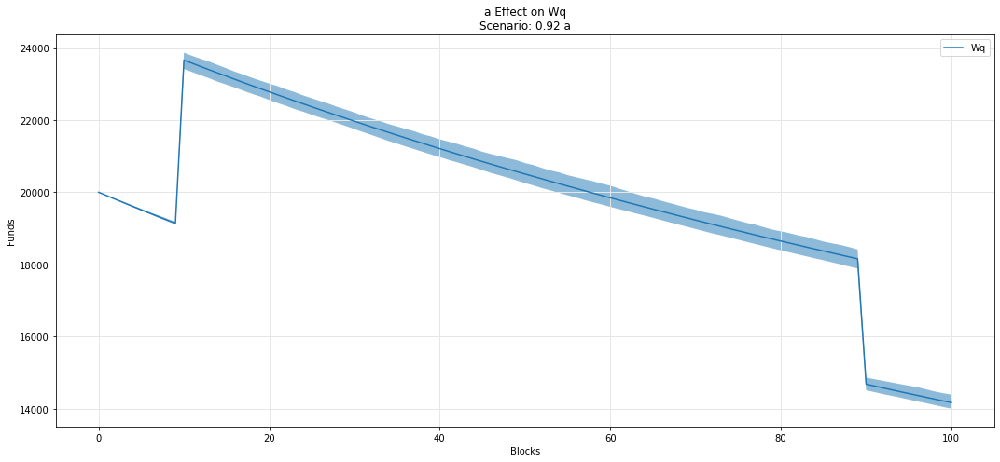

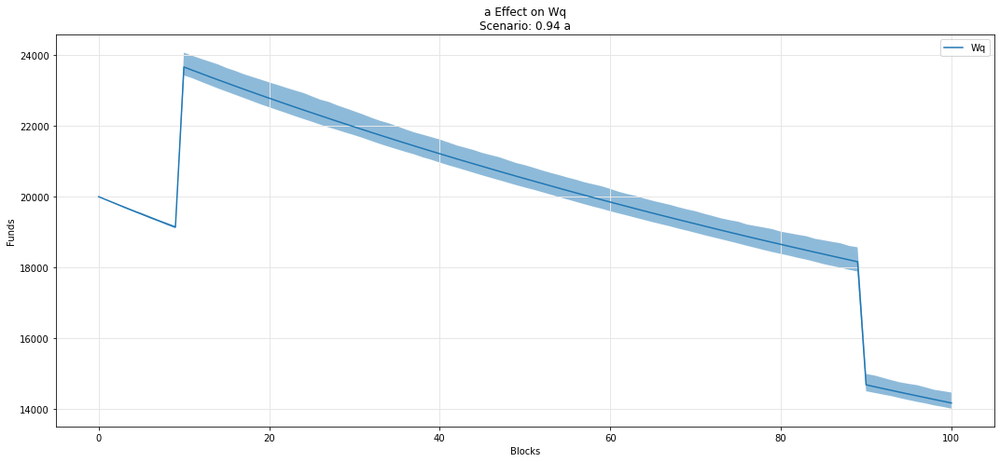

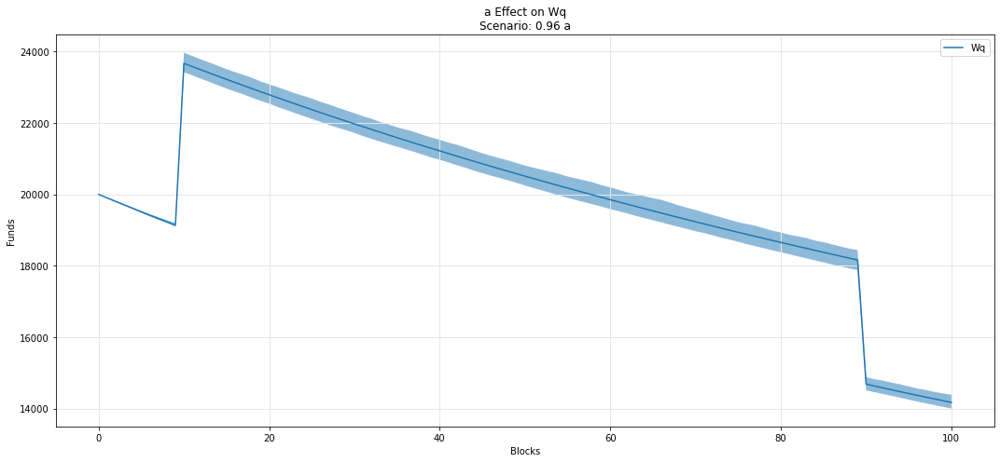

...

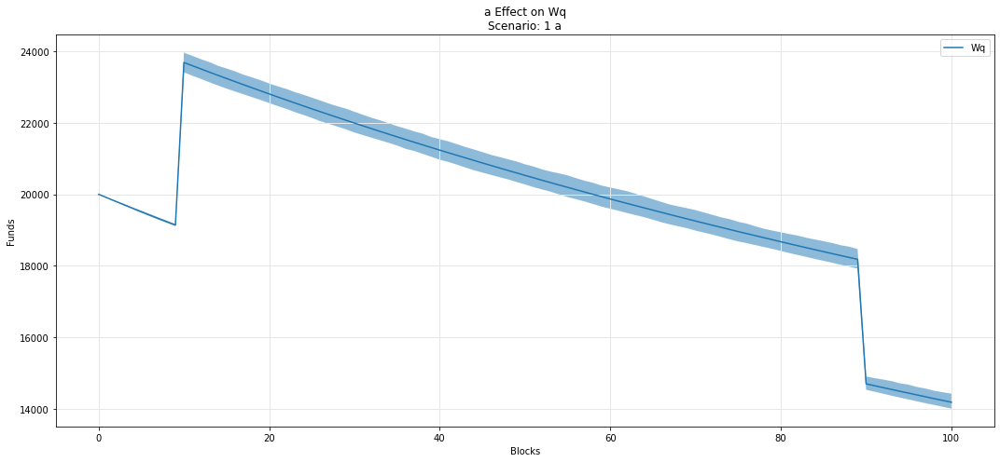

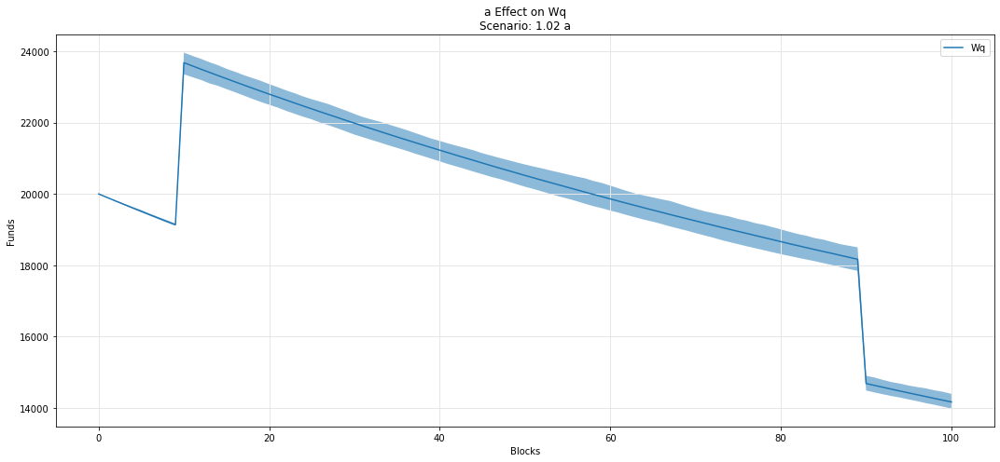

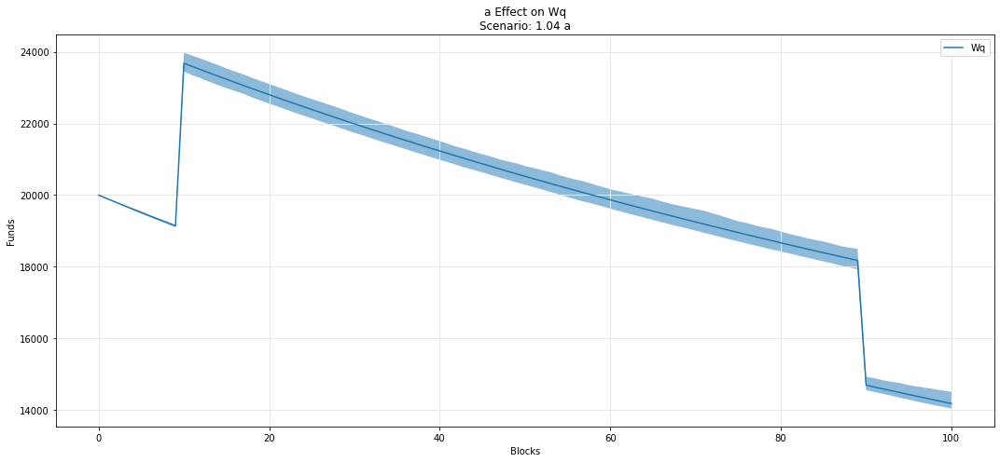

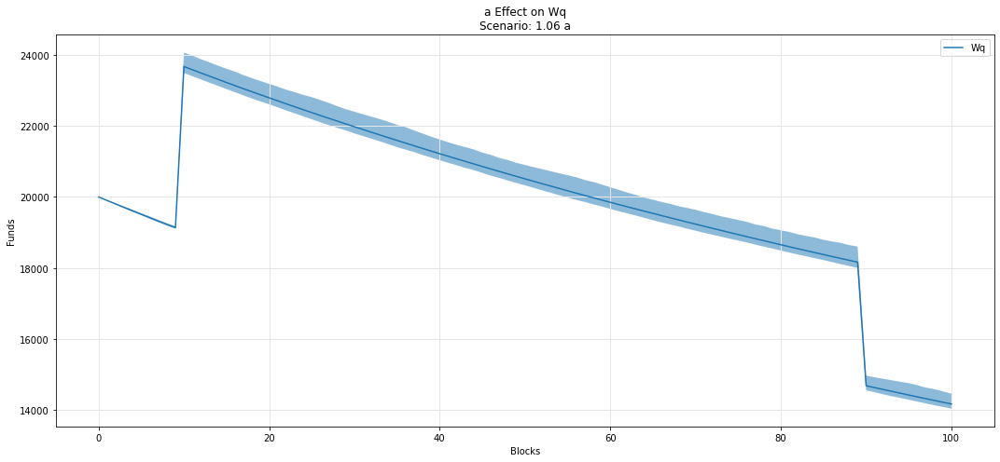

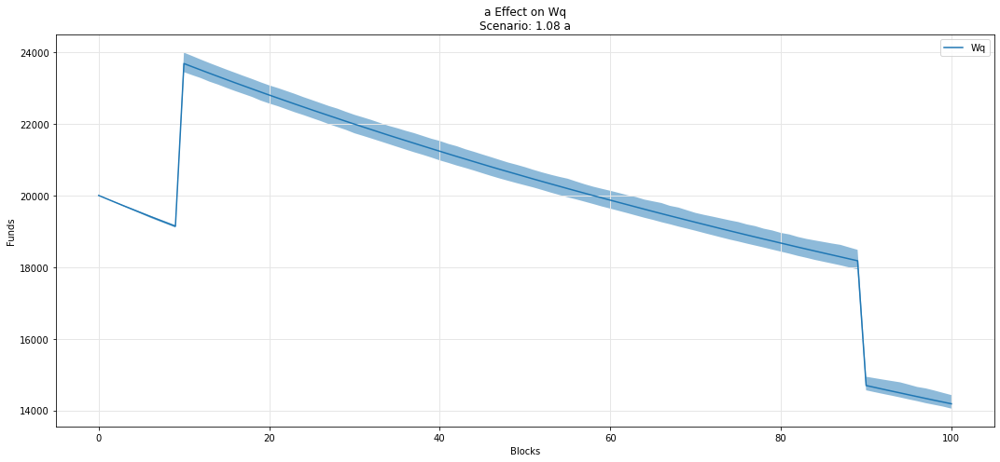

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

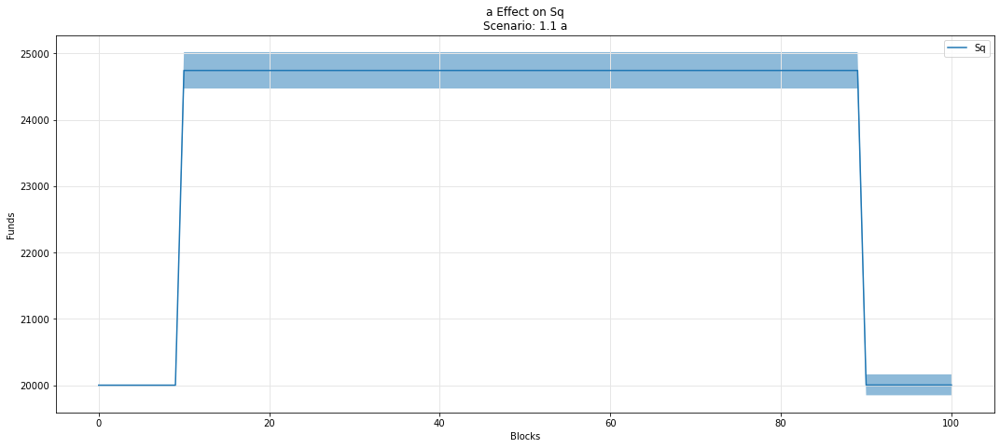

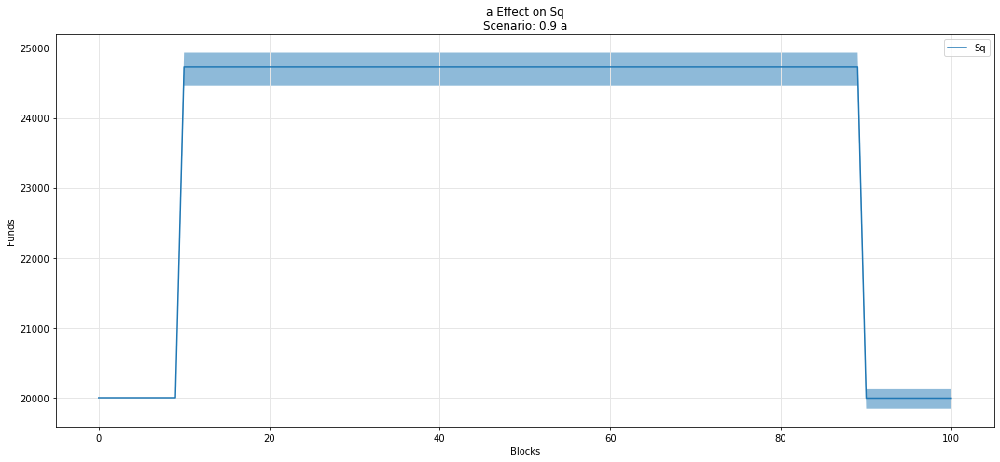

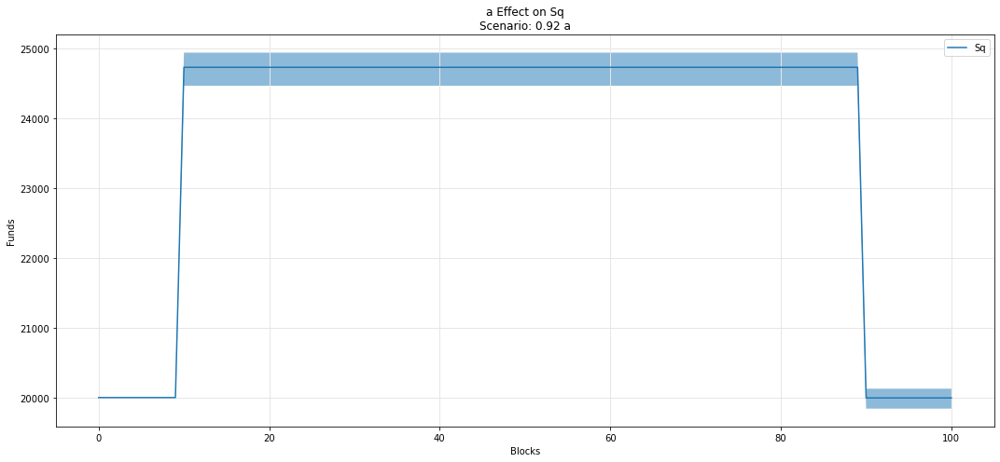

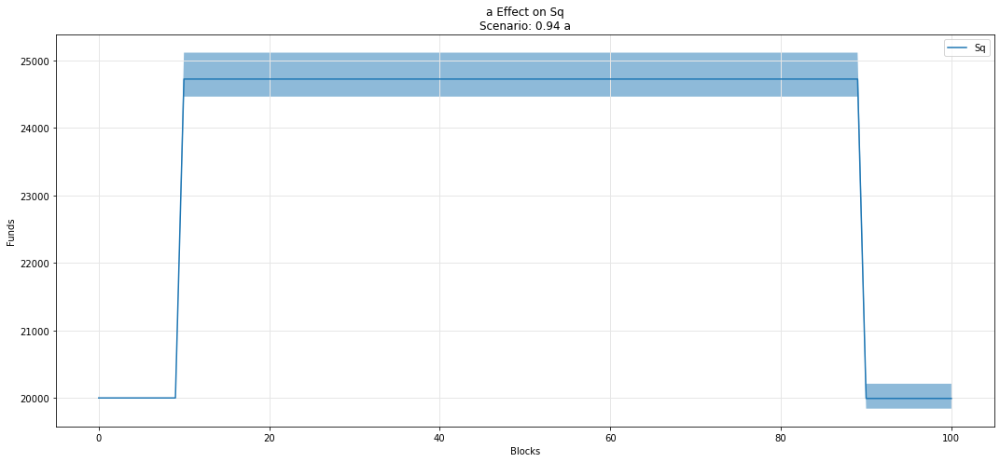

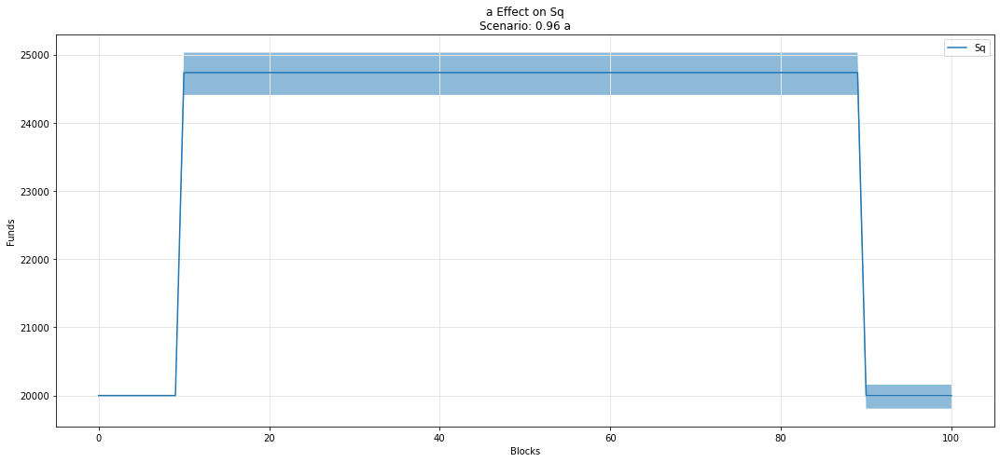

...

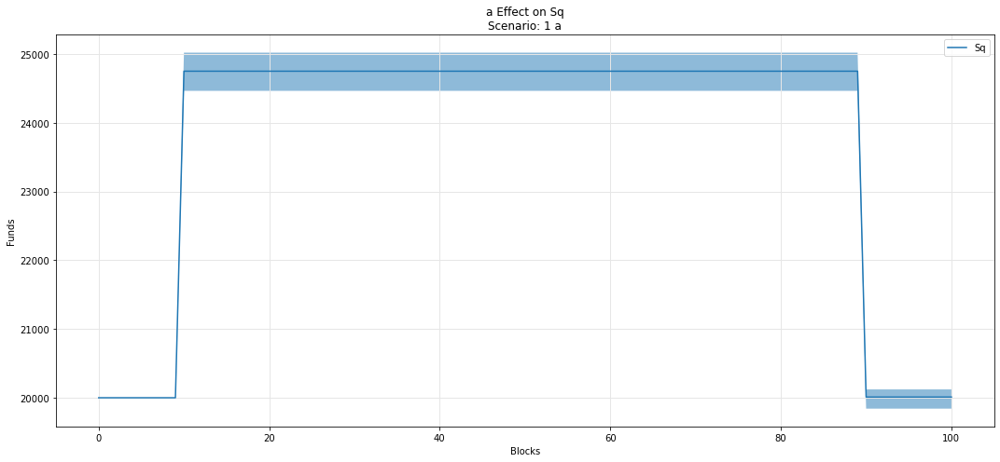

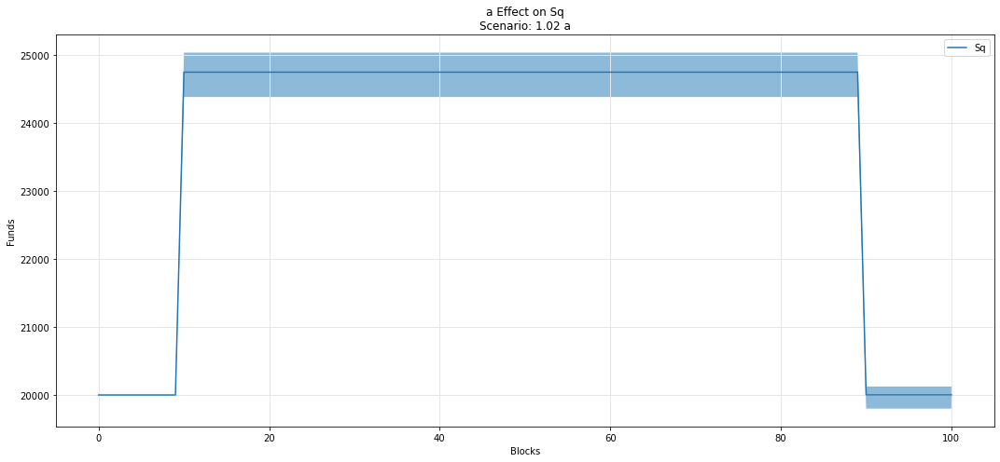

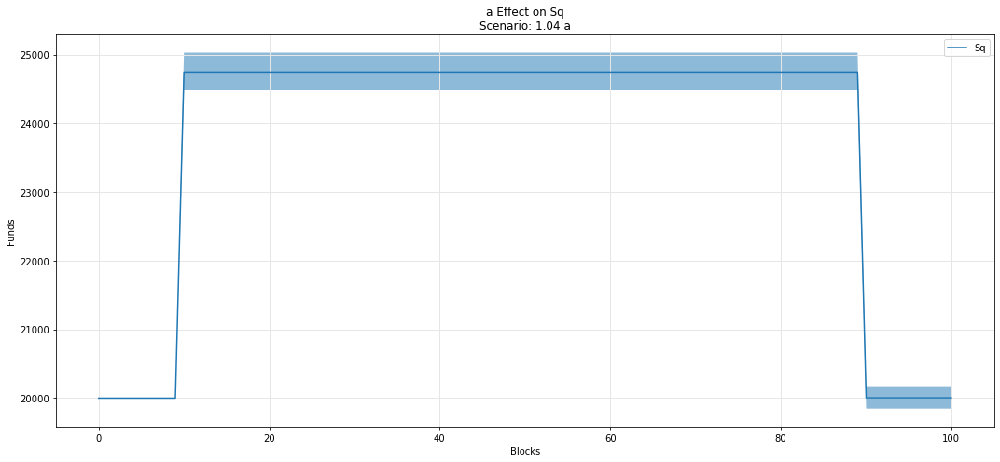

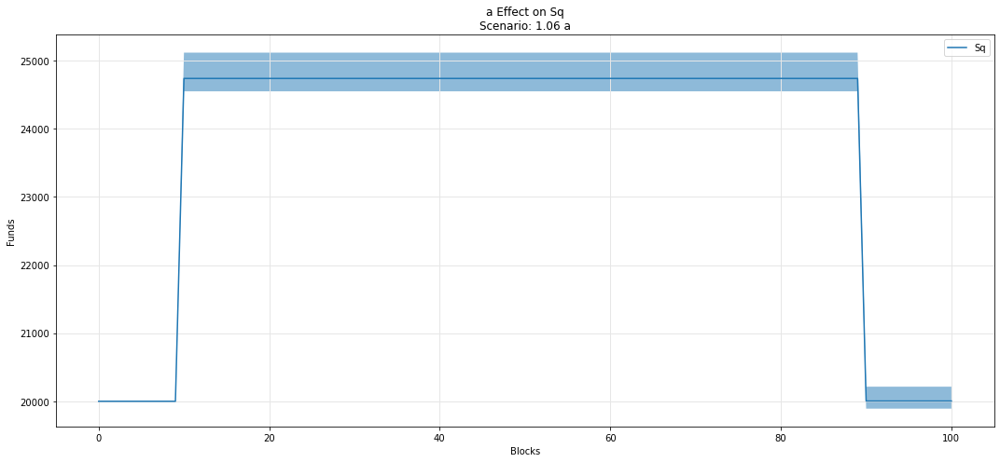

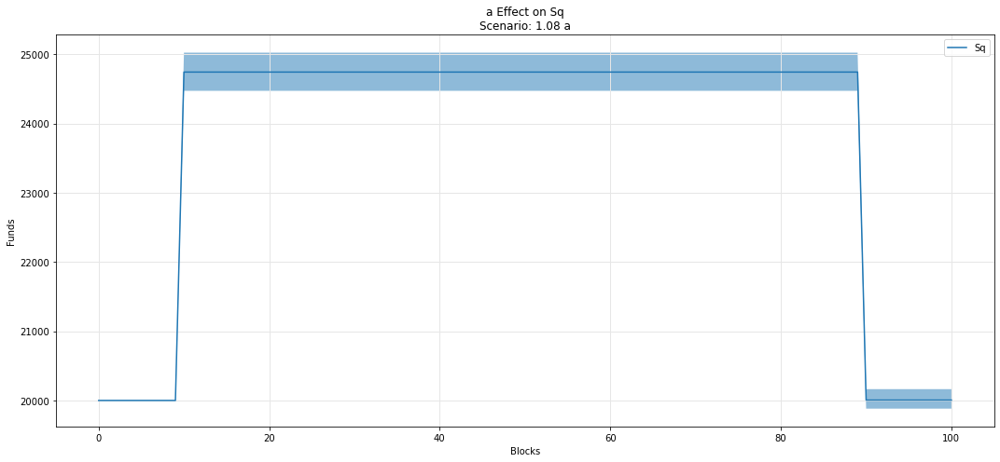

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

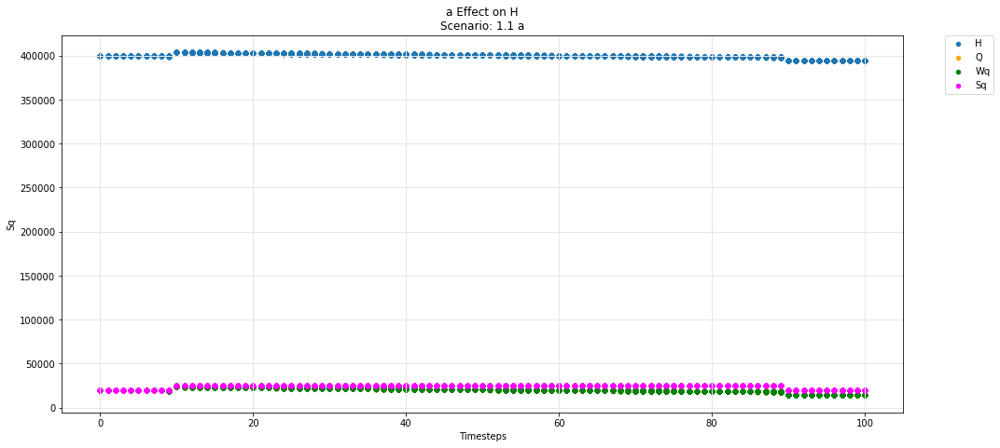

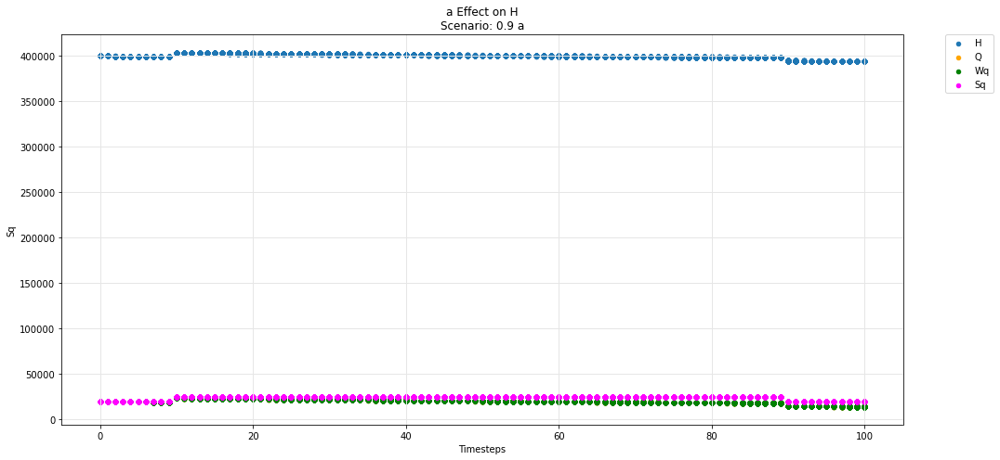

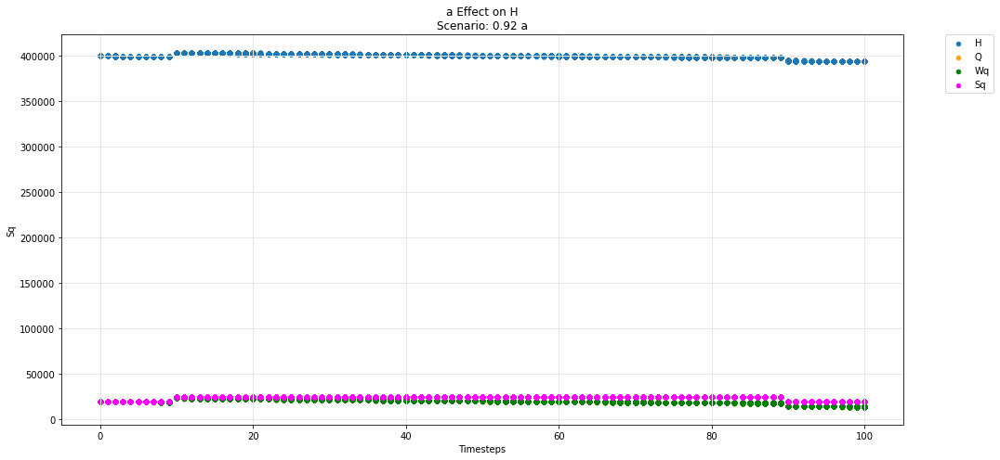

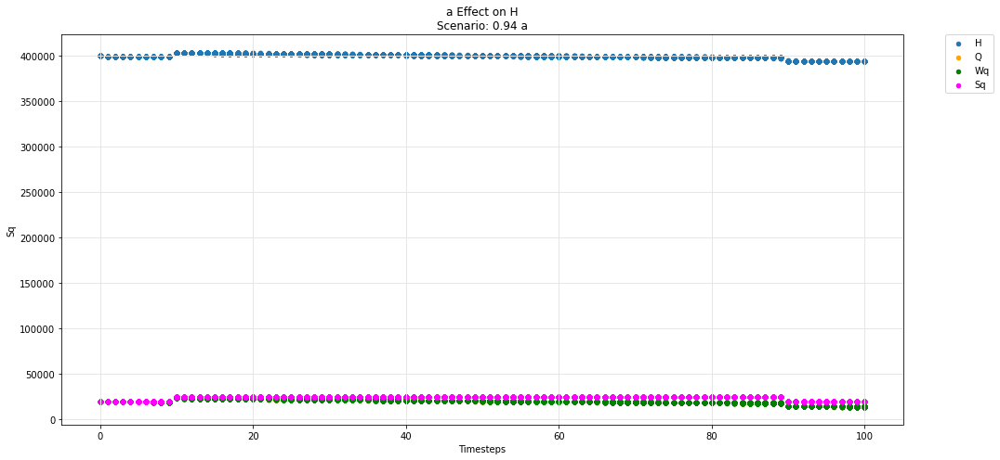

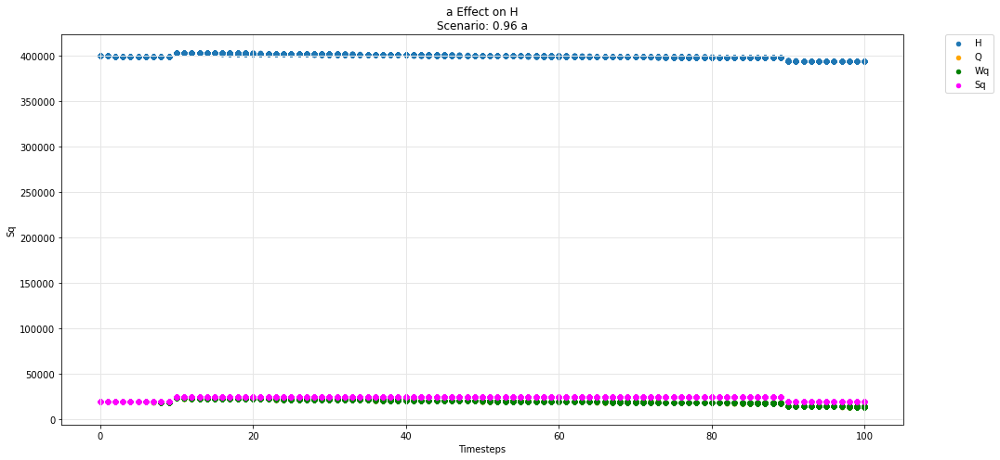

...

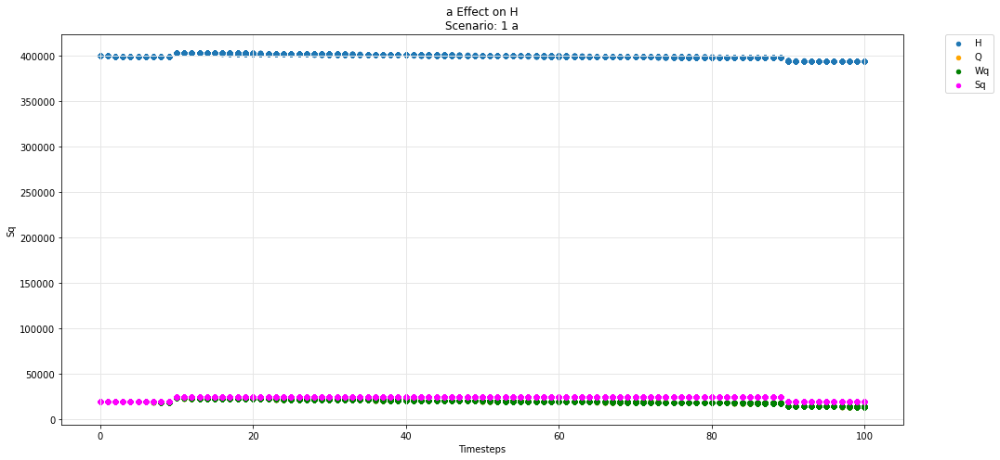

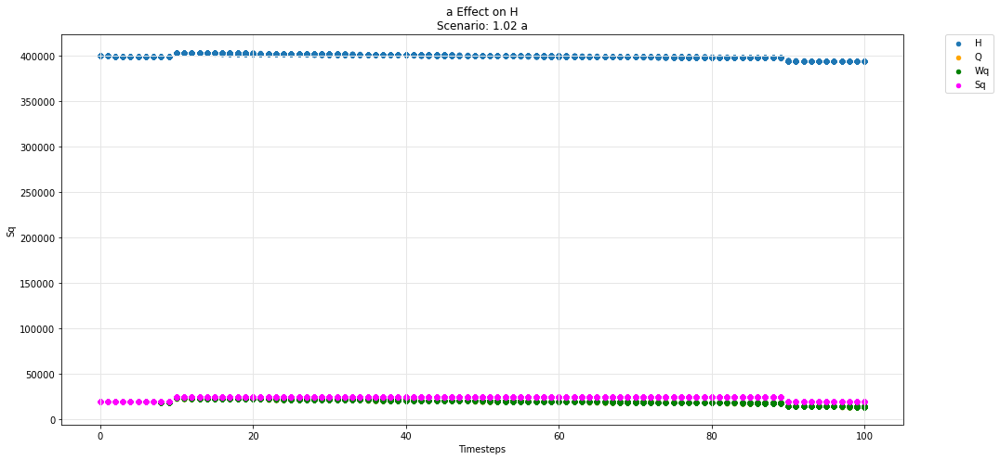

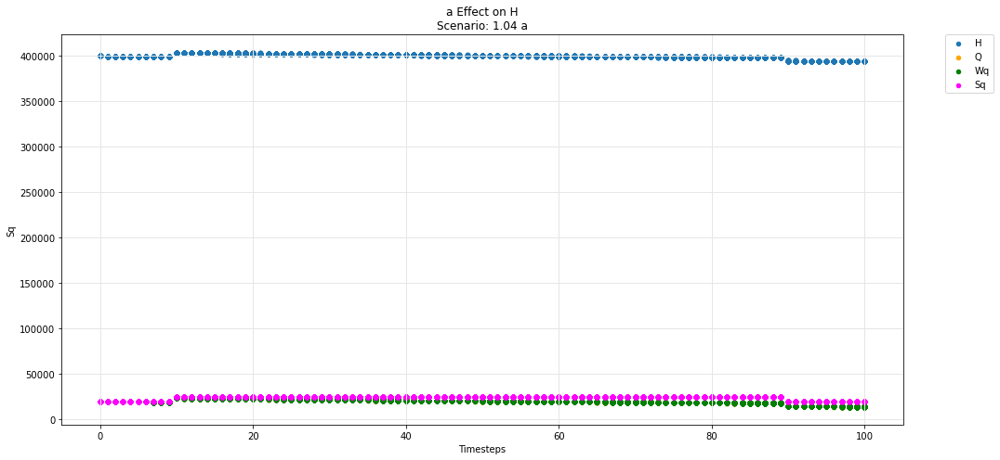

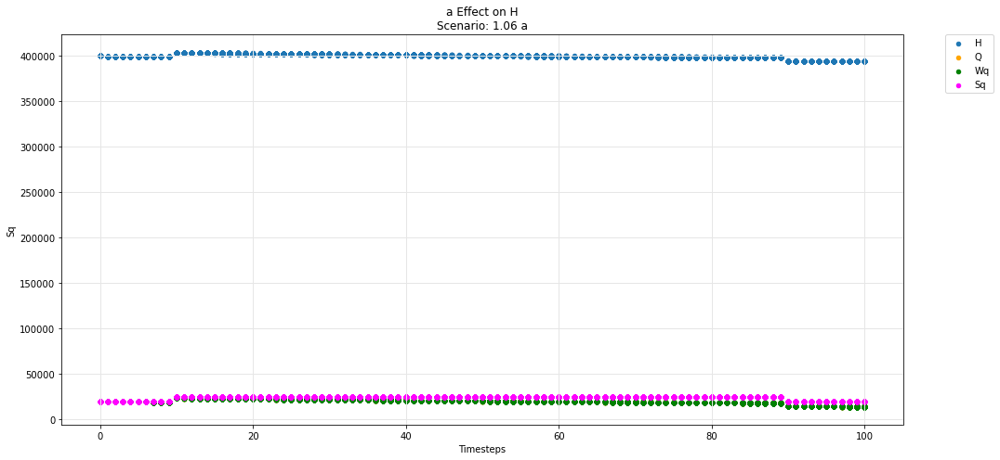

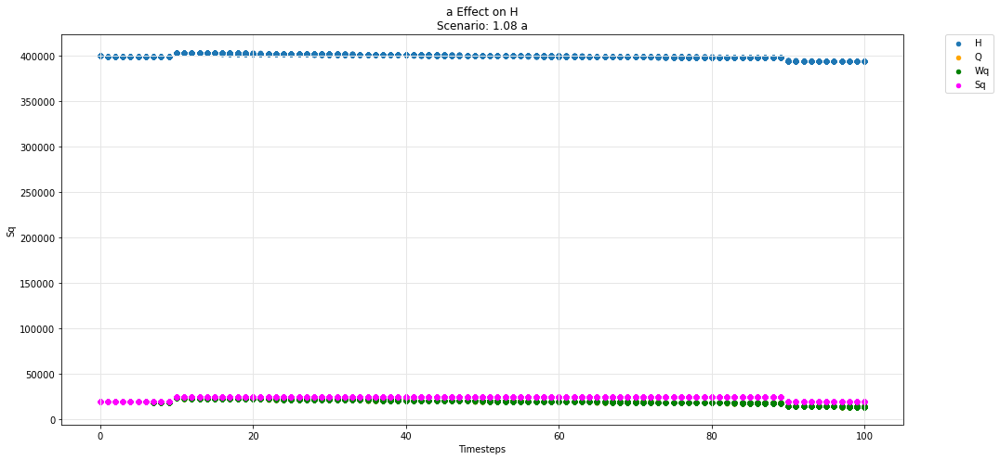

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

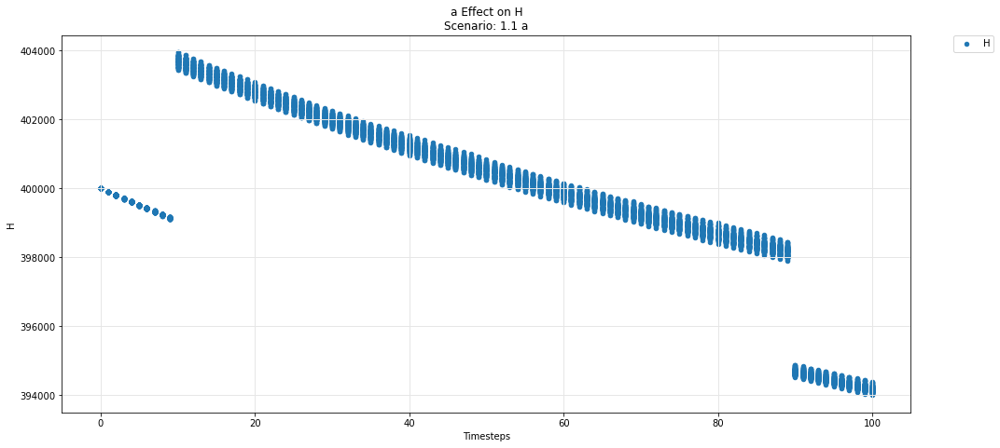

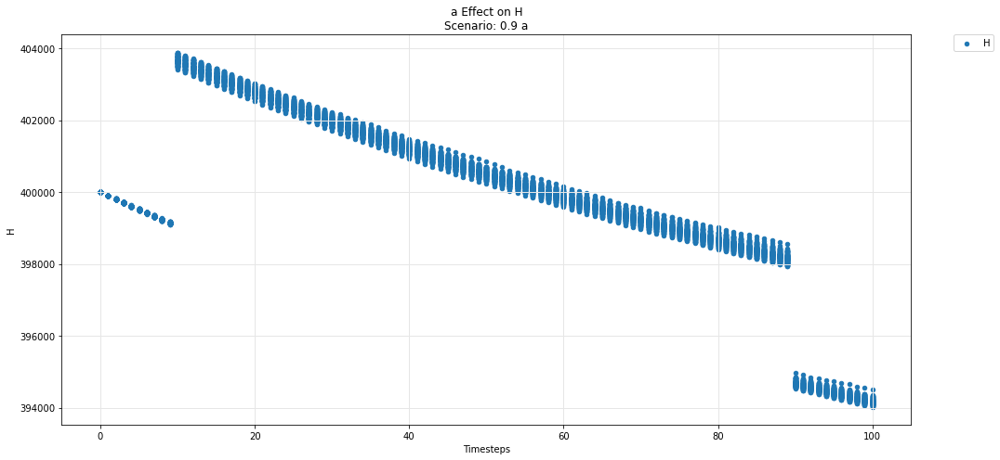

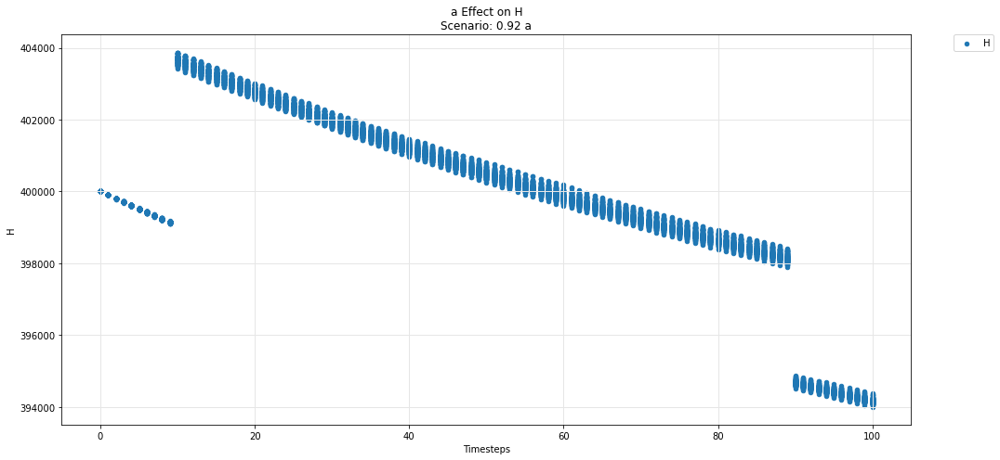

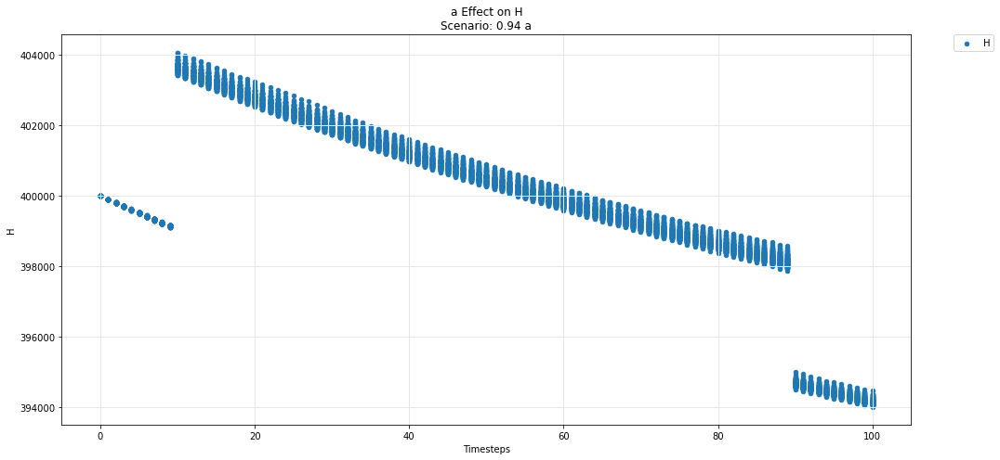

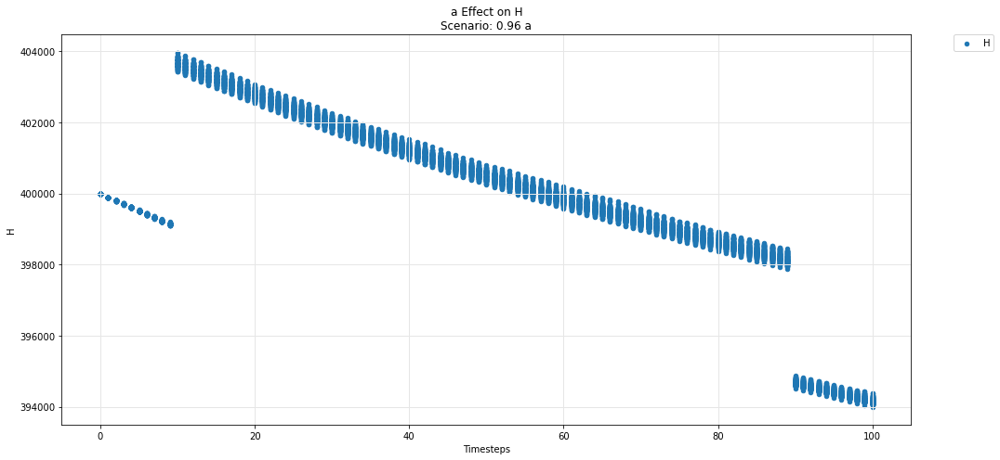

...

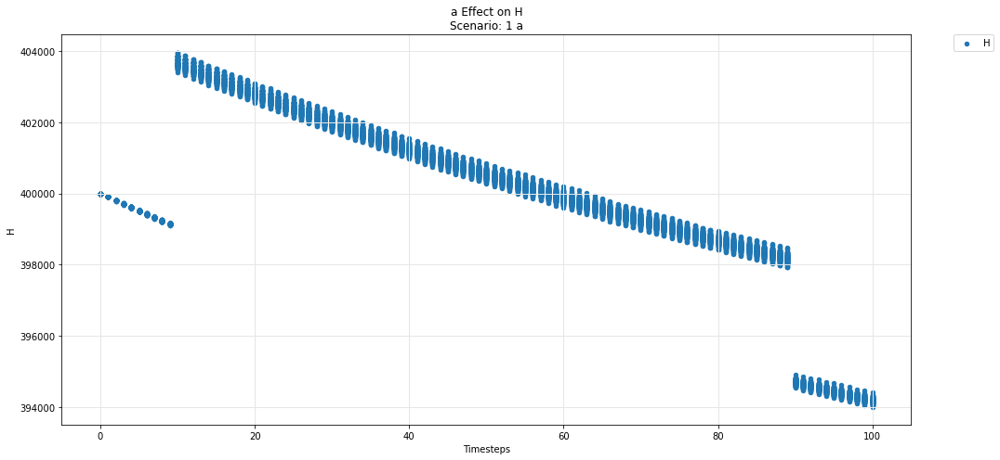

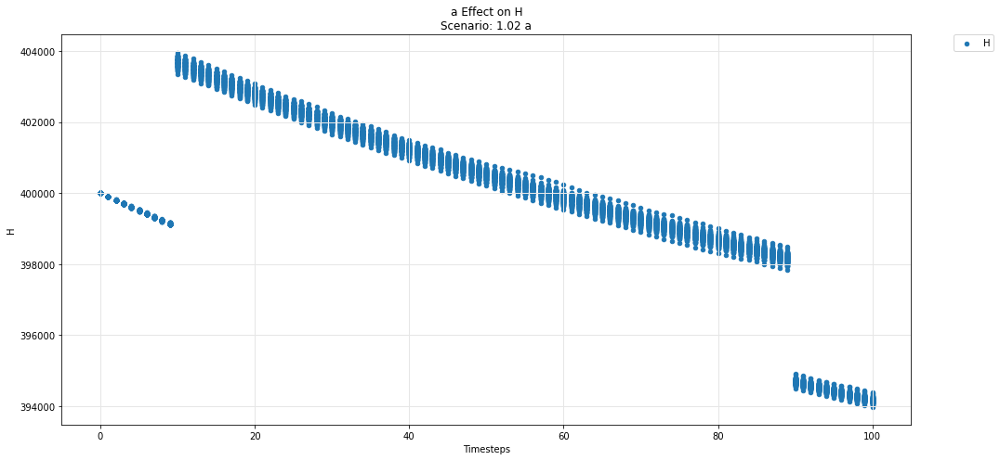

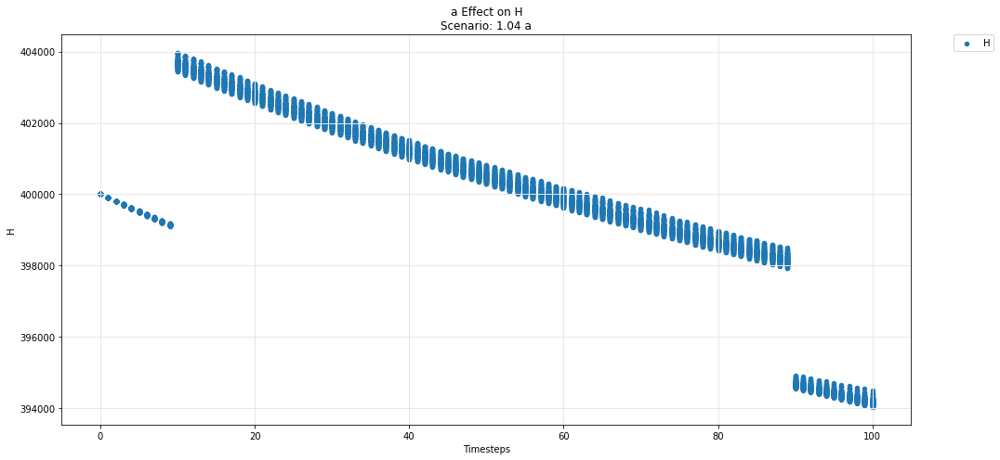

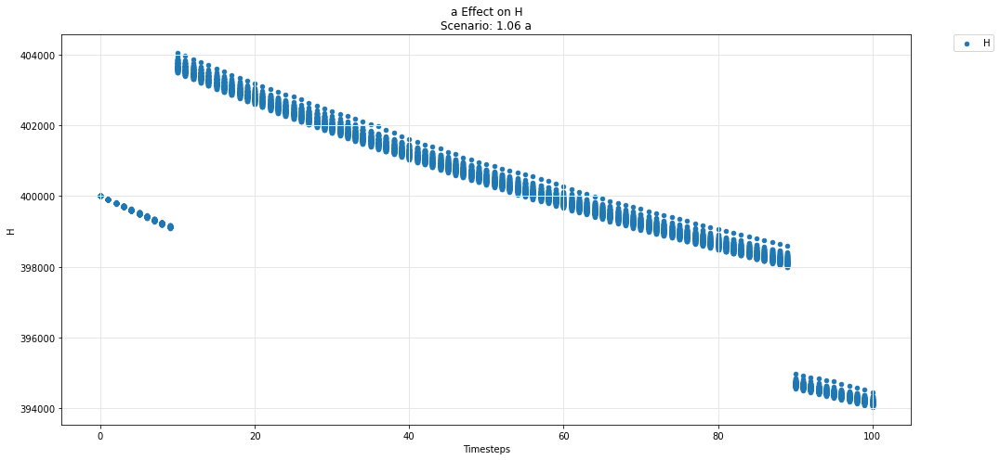

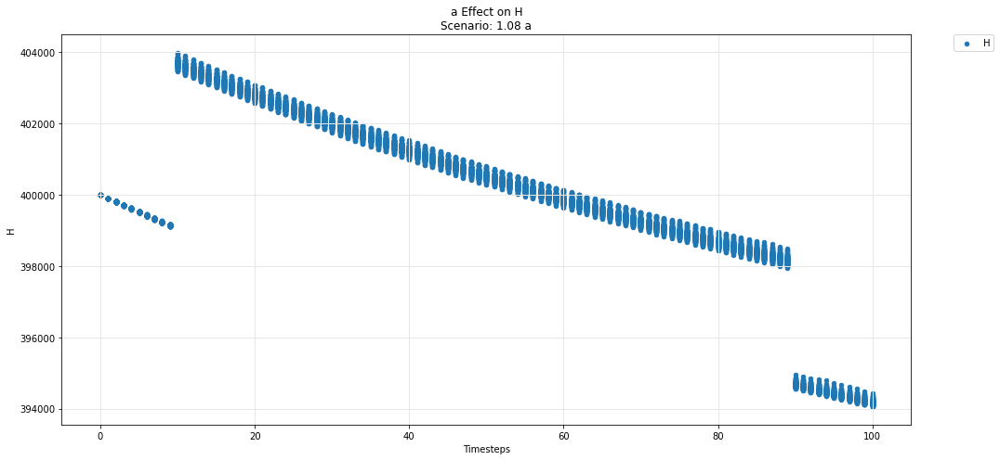

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

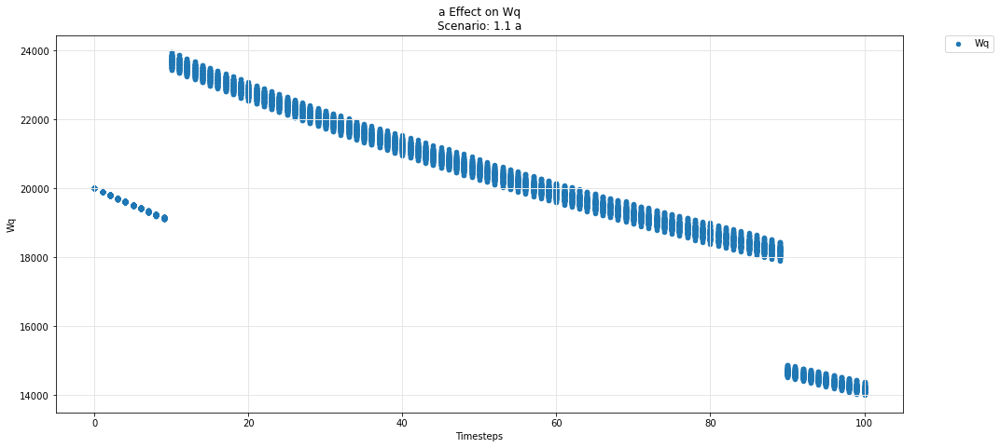

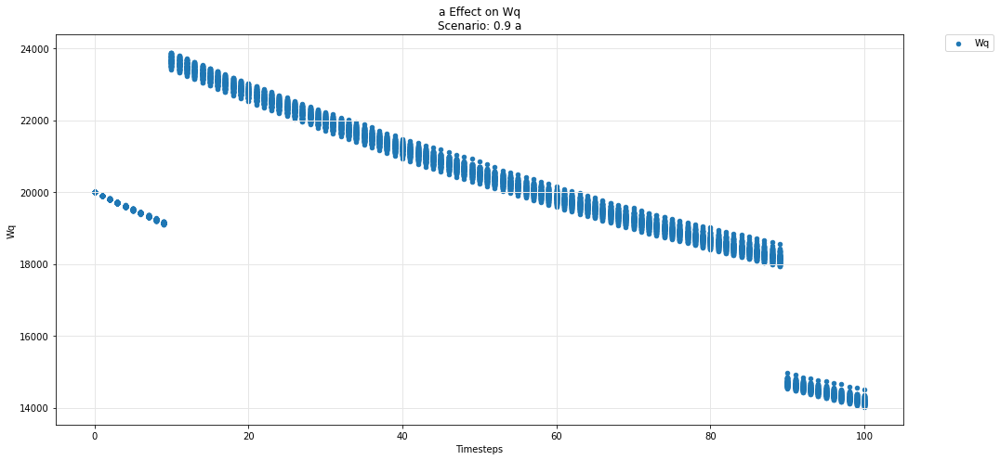

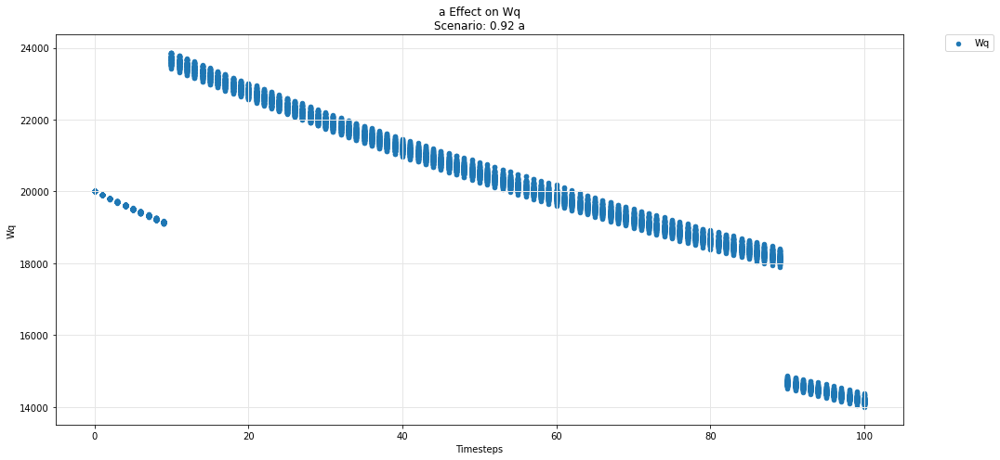

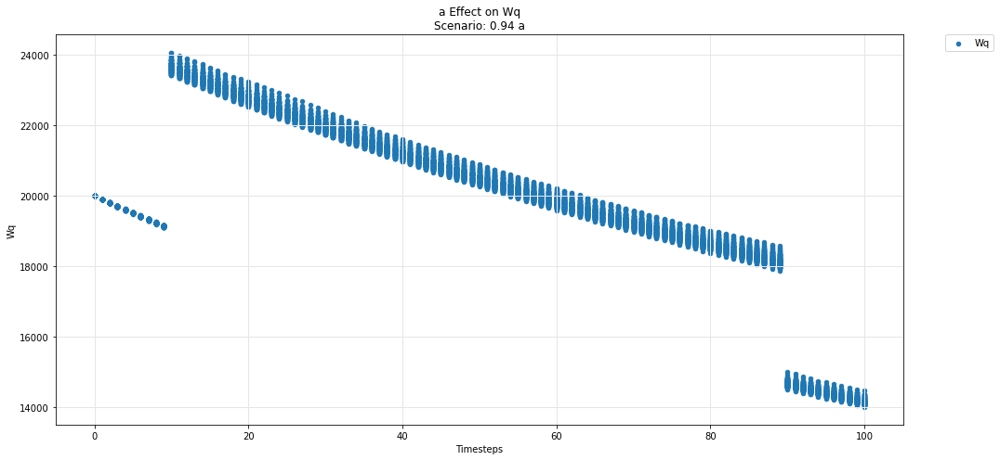

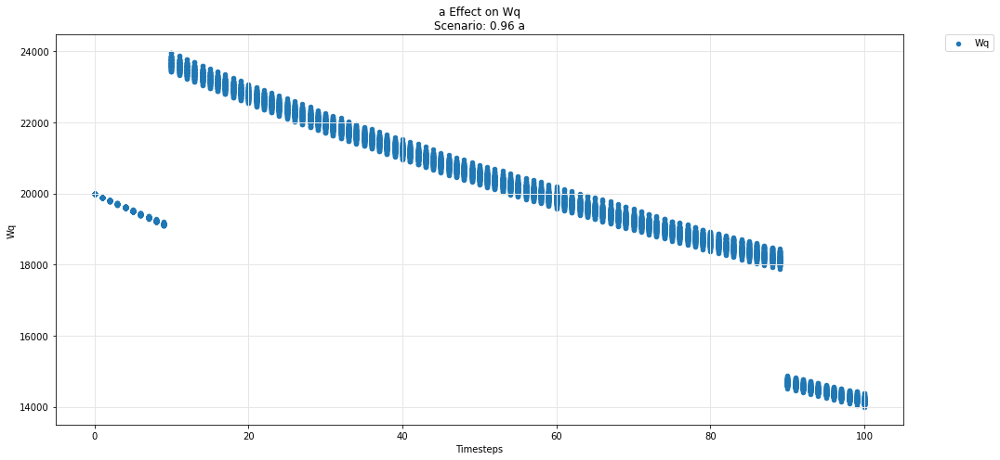

...

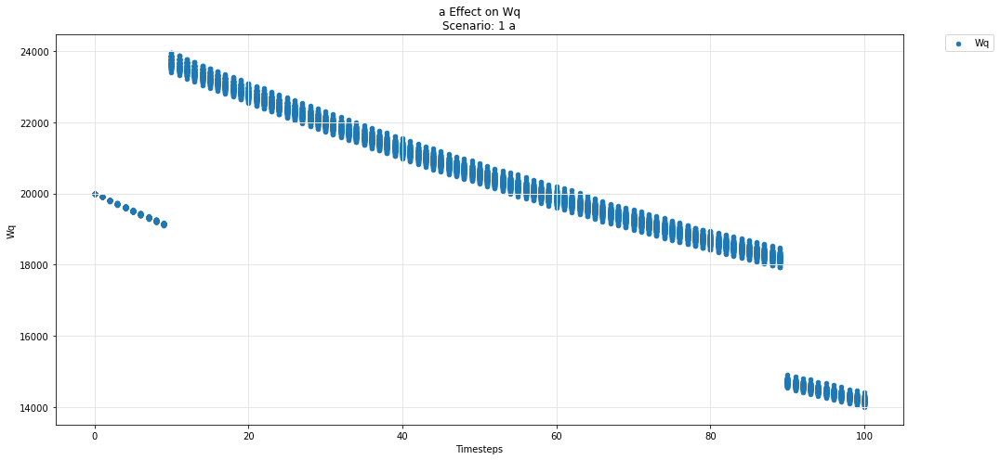

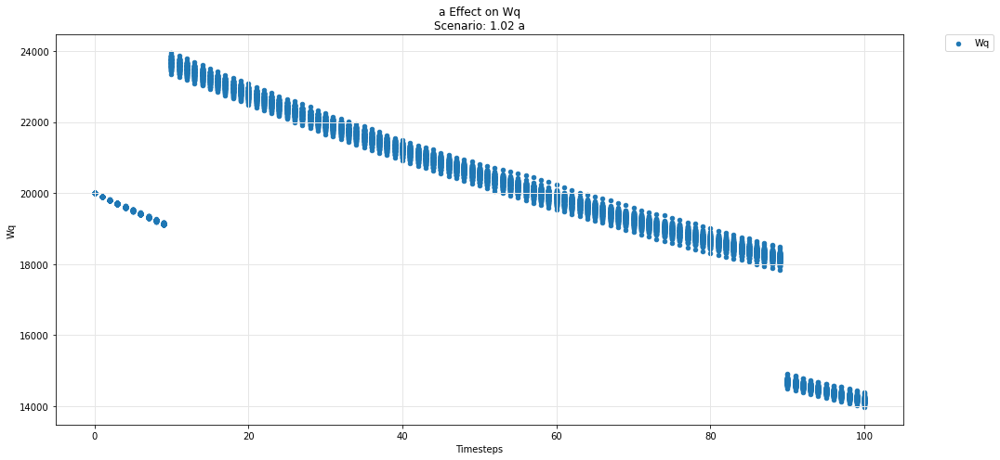

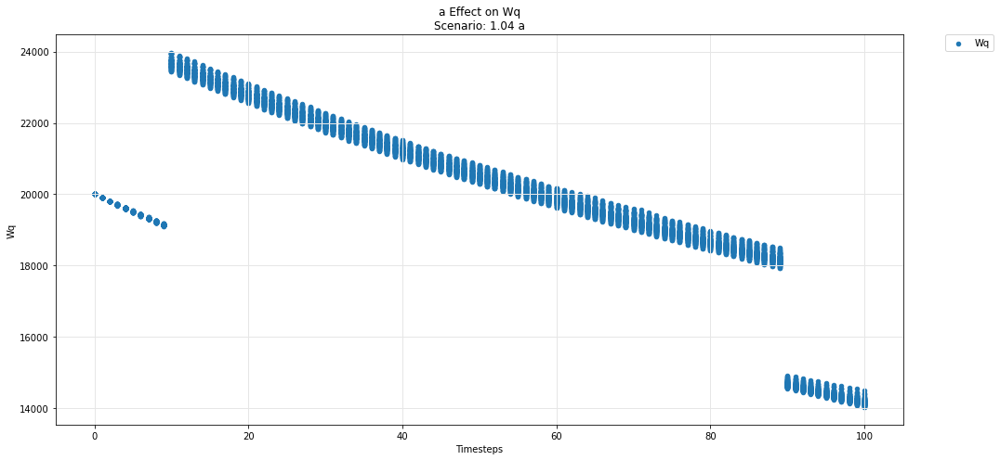

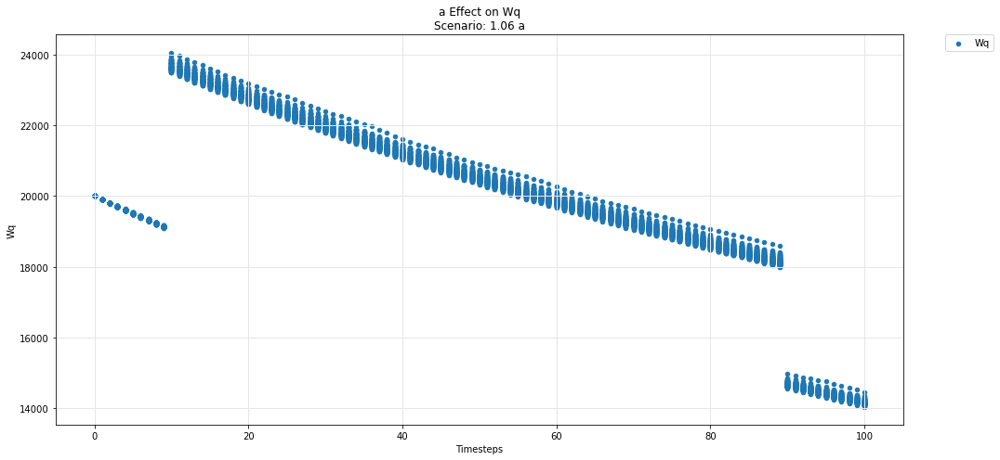

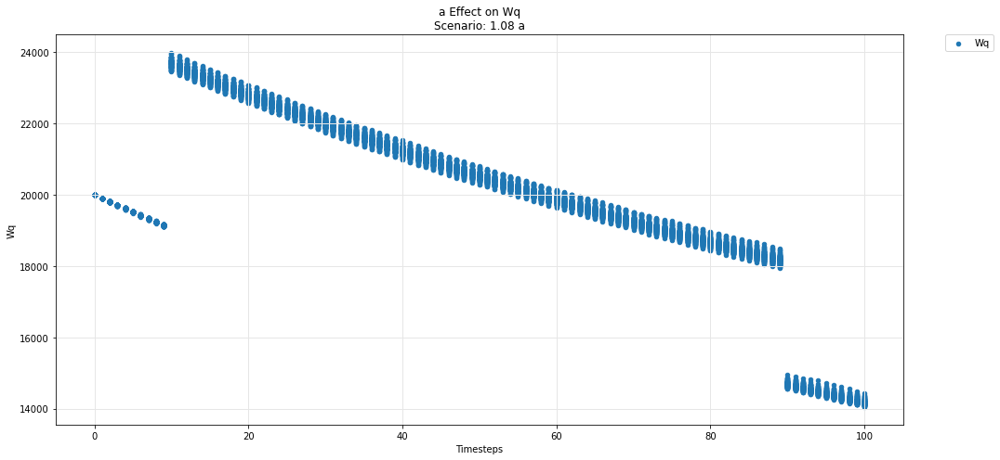

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

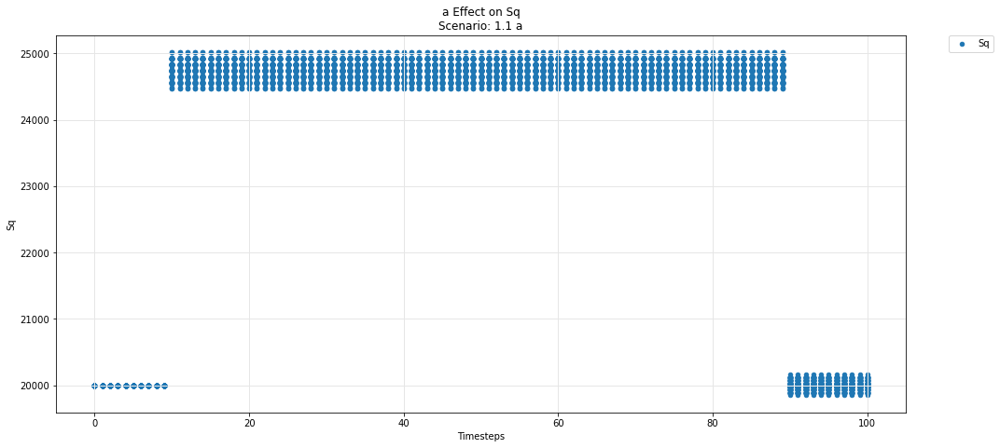

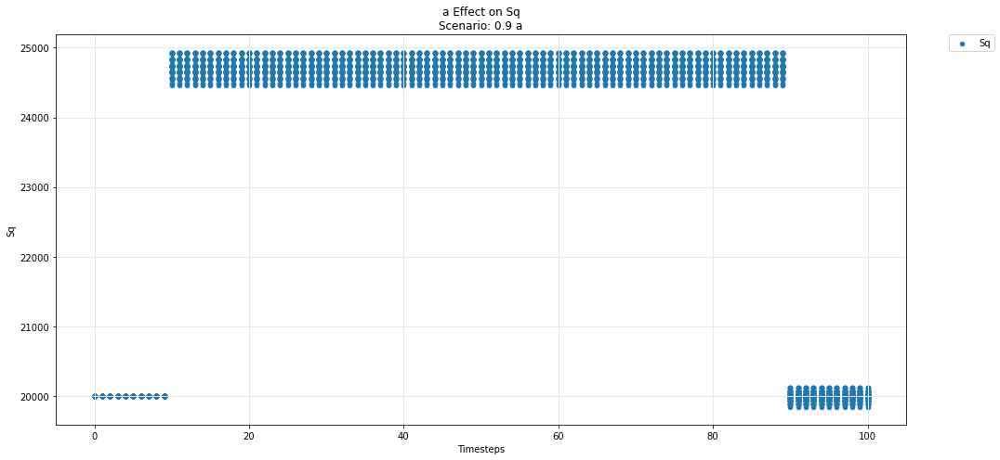

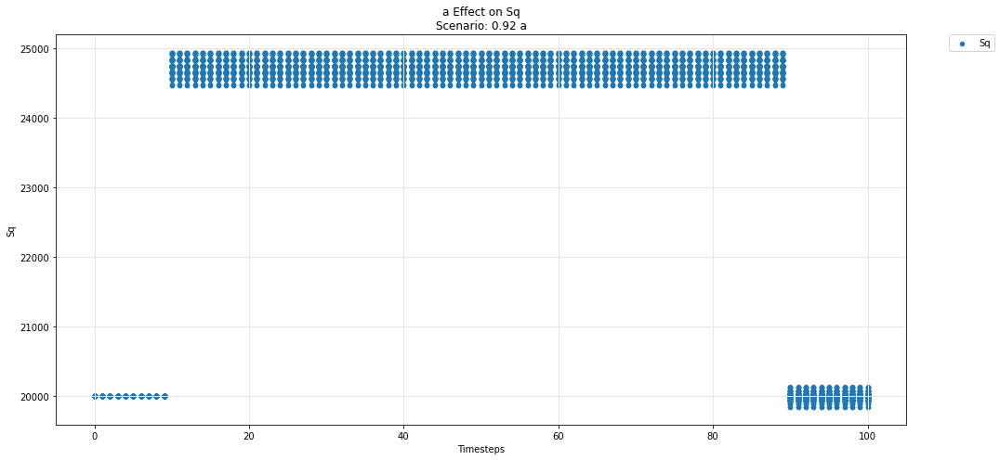

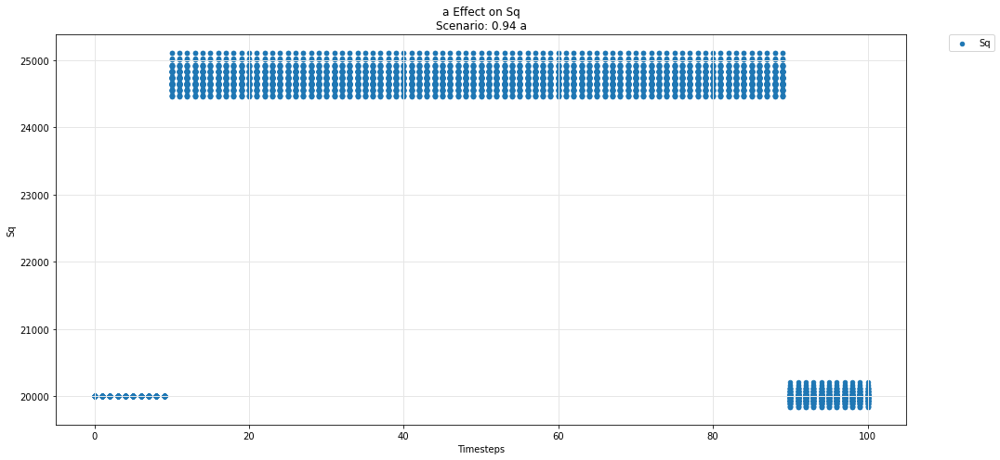

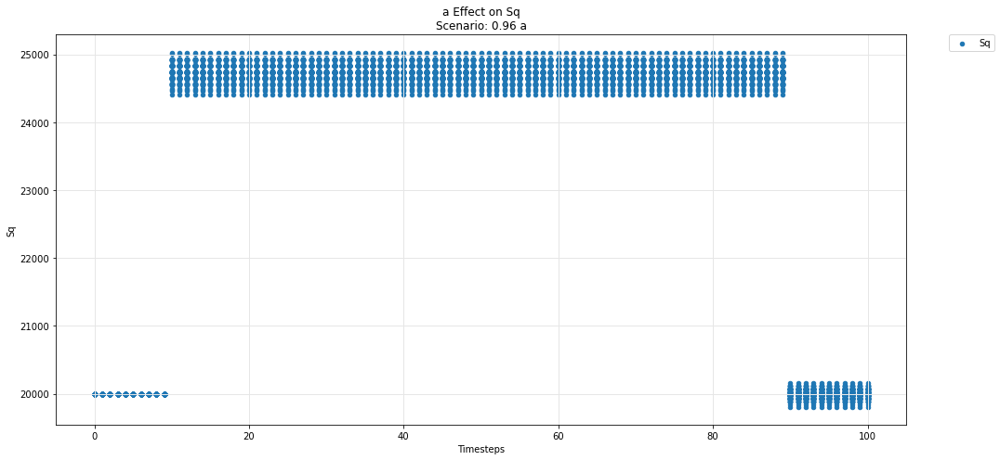

...

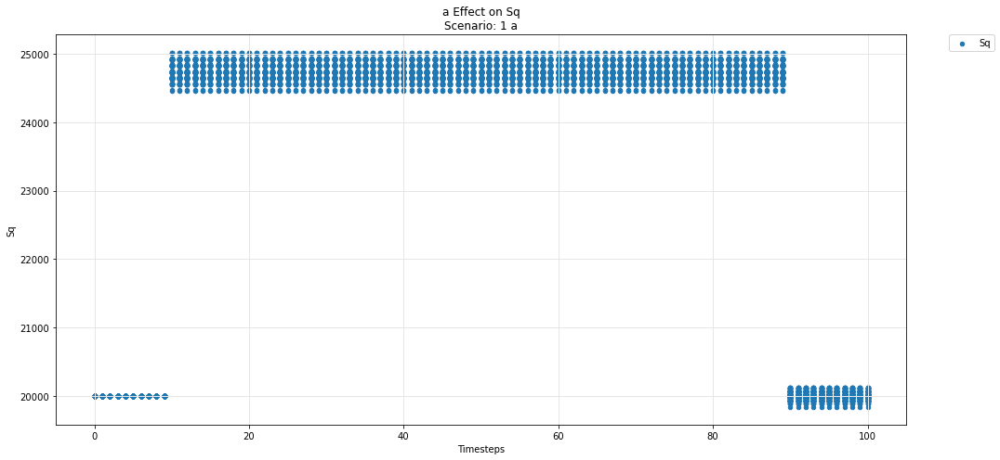

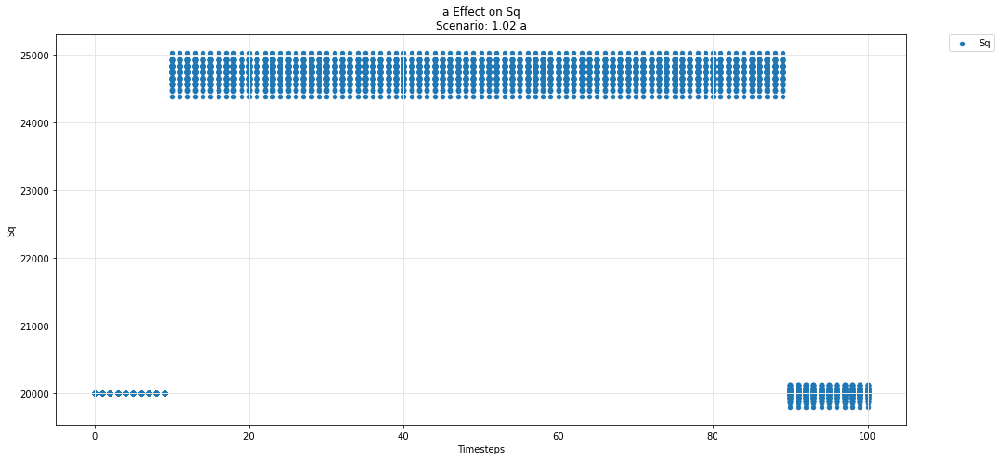

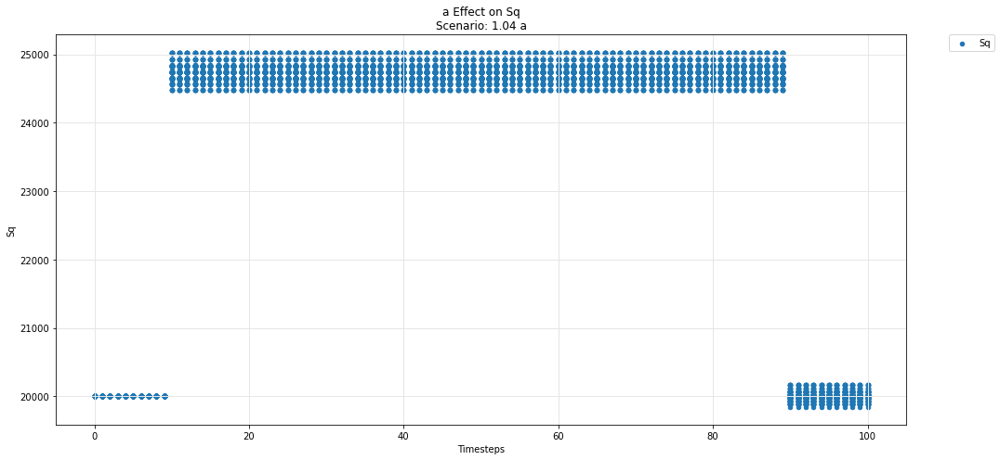

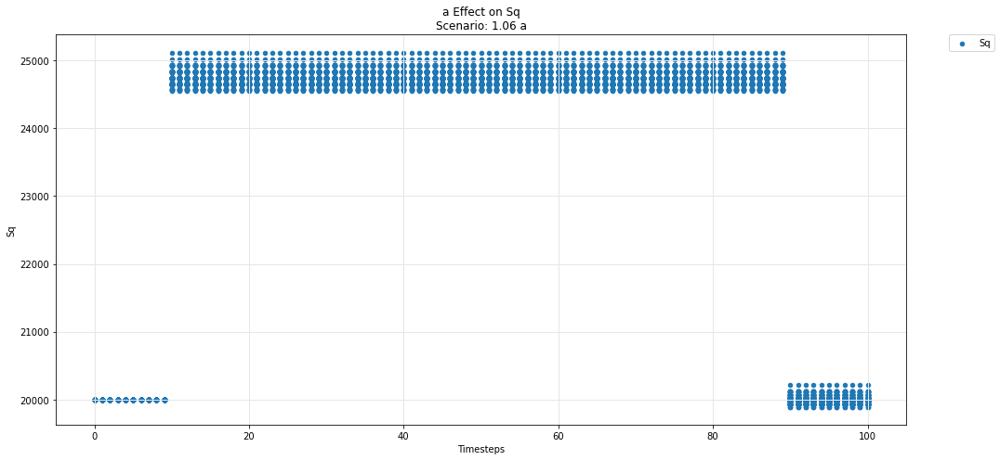

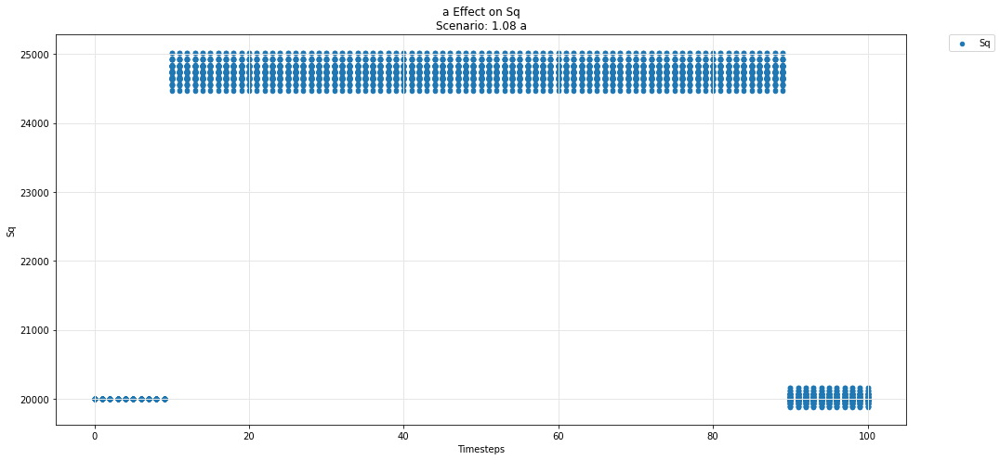

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

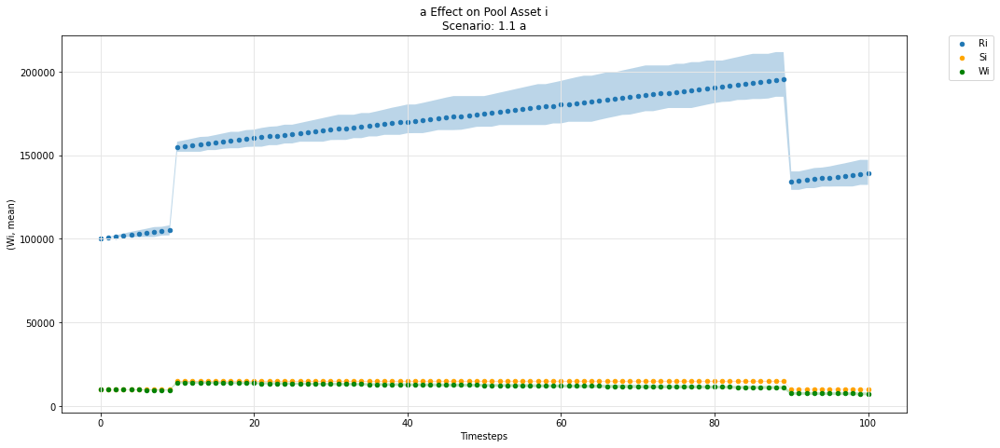

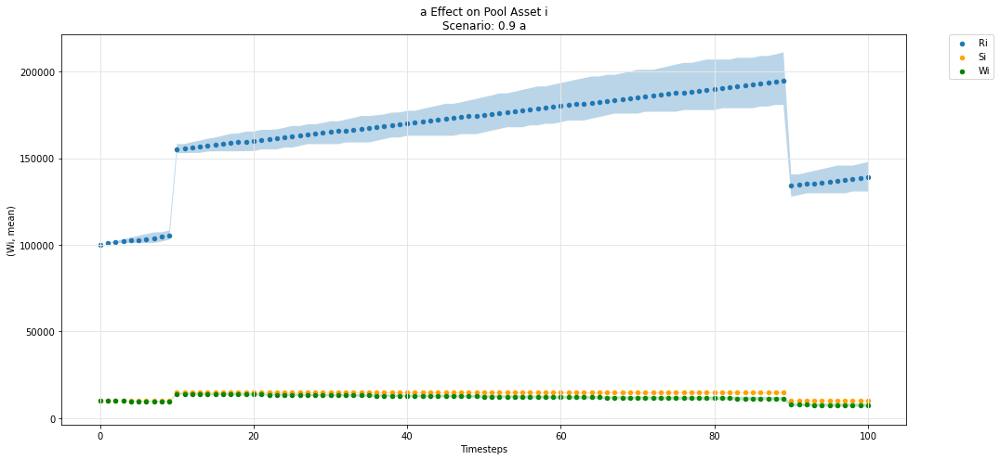

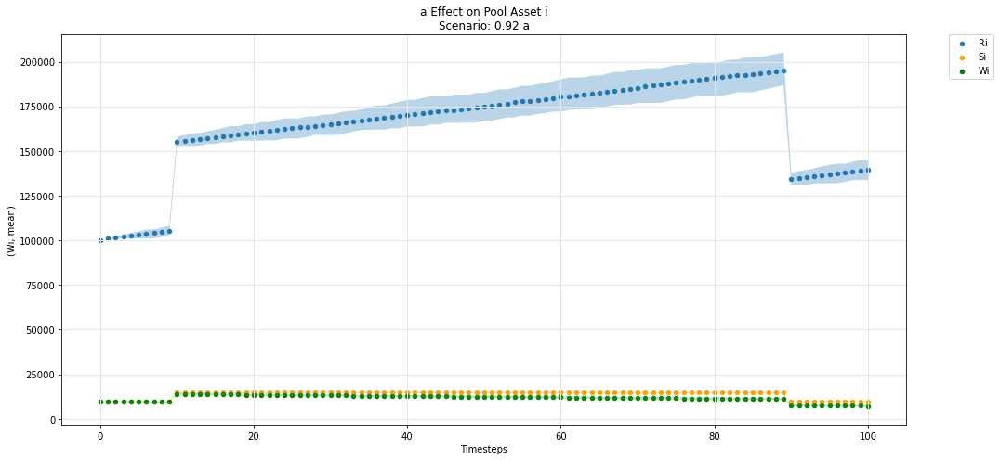

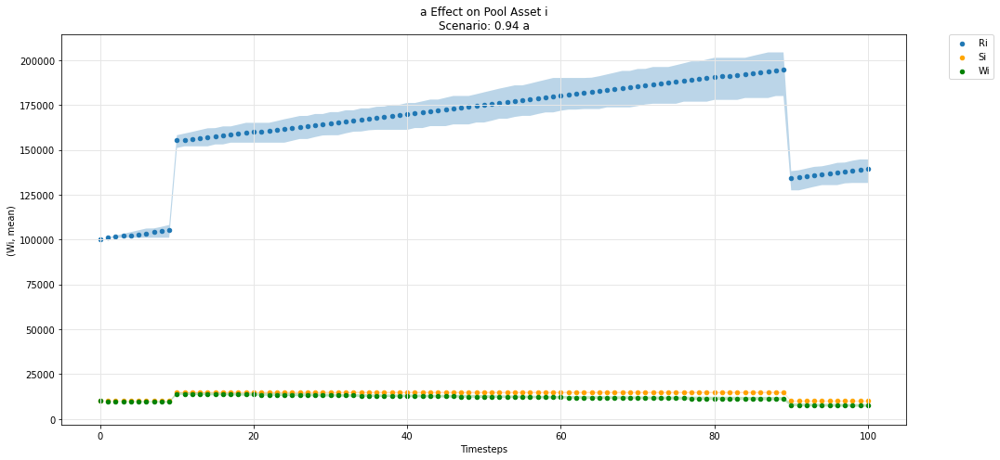

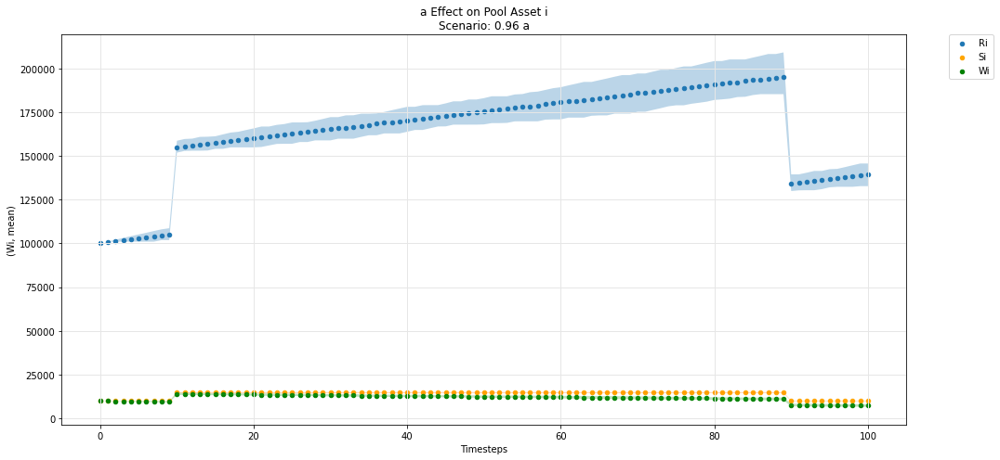

...

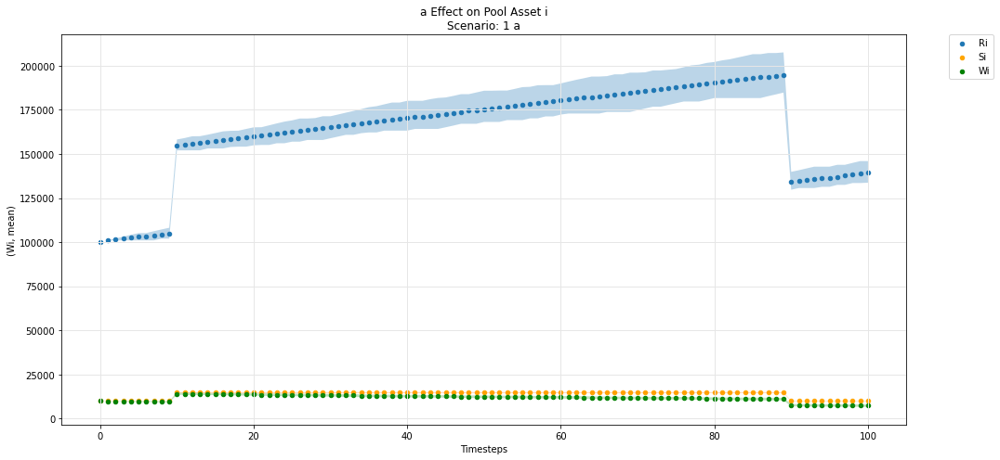

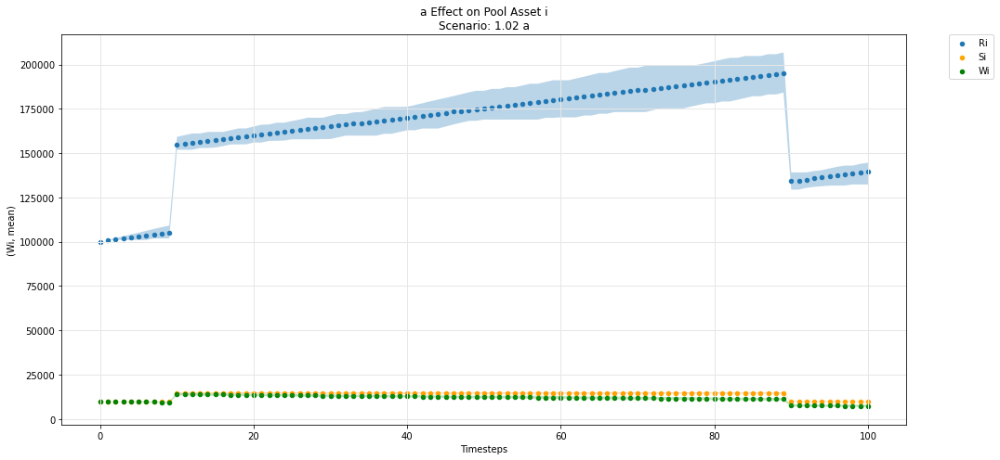

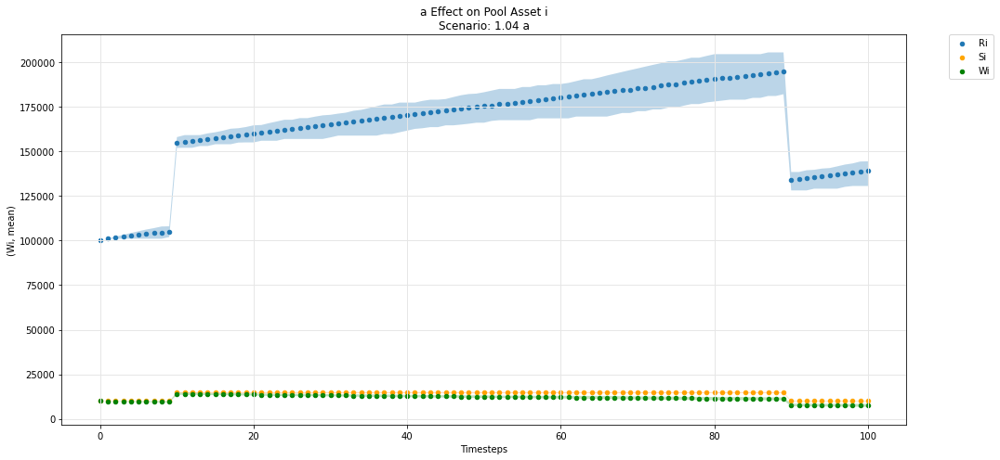

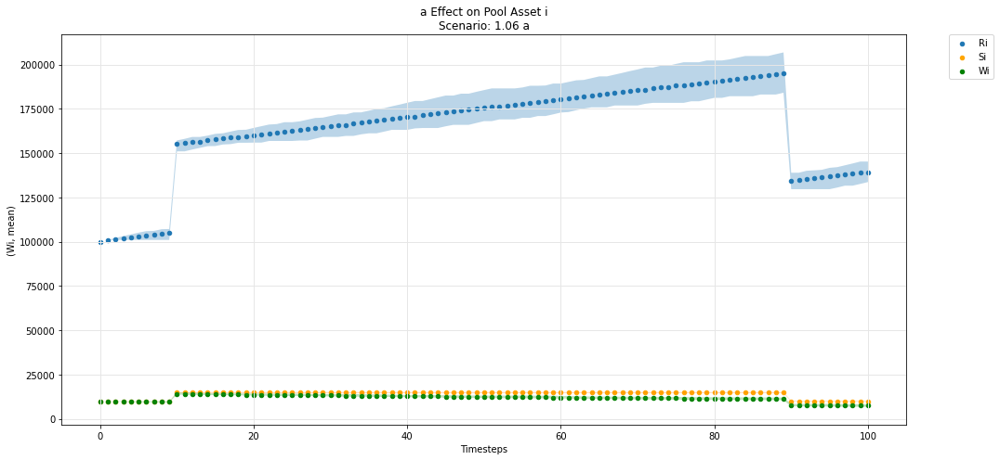

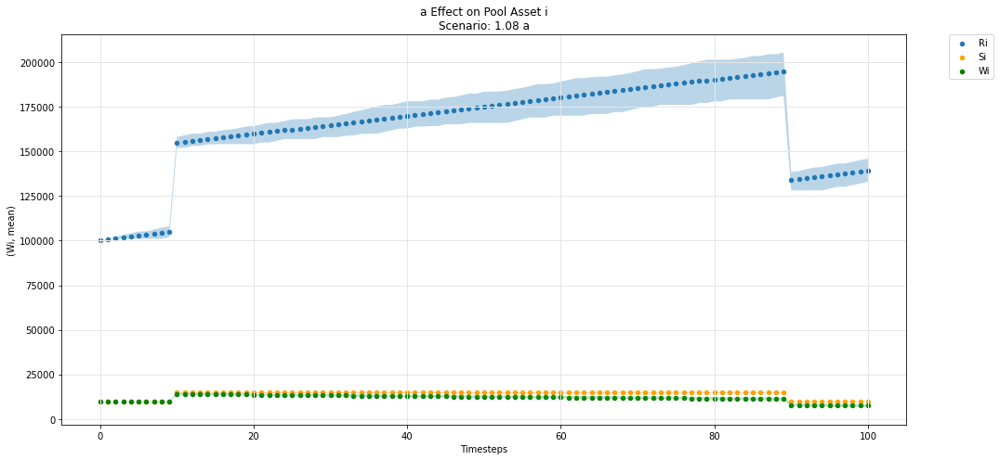

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

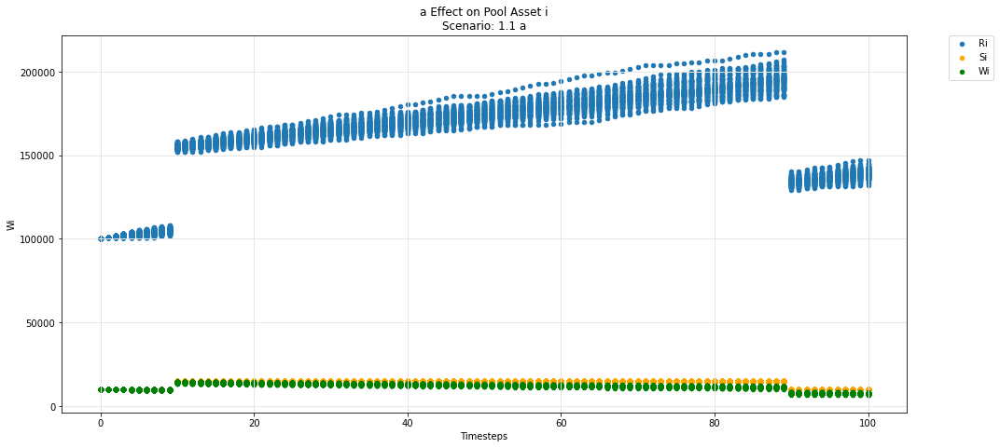

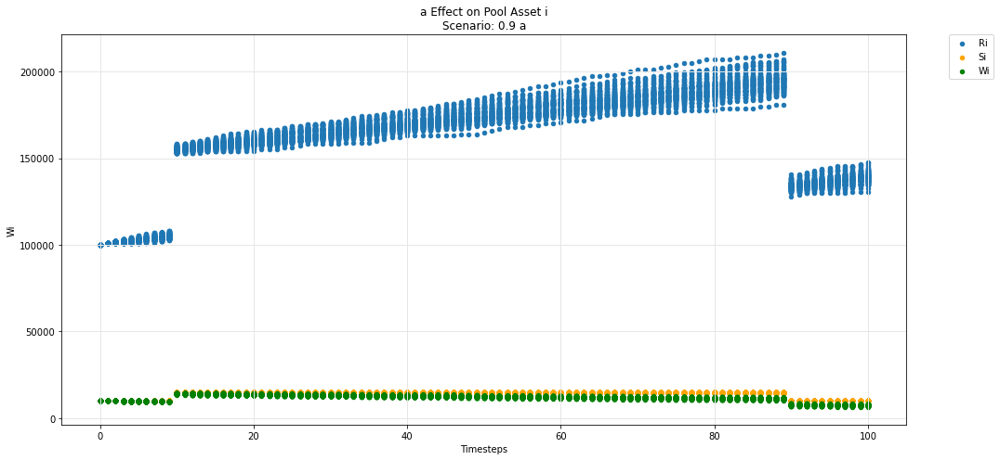

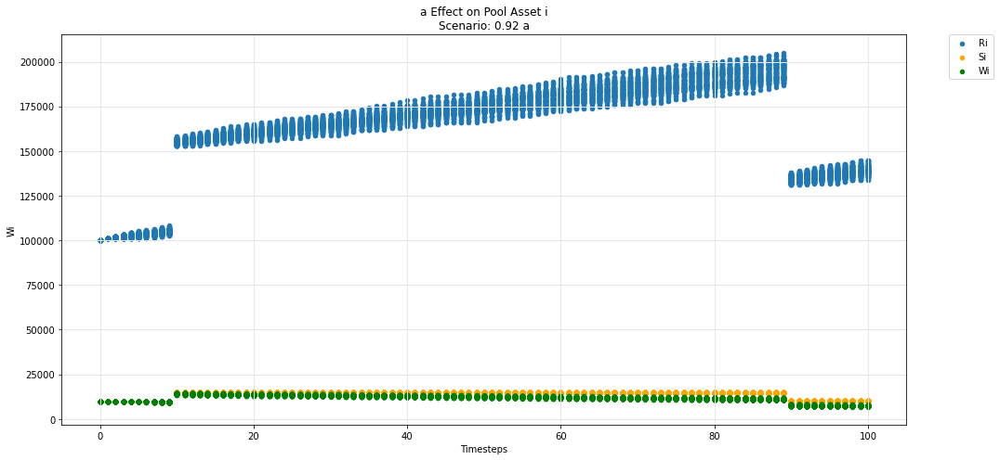

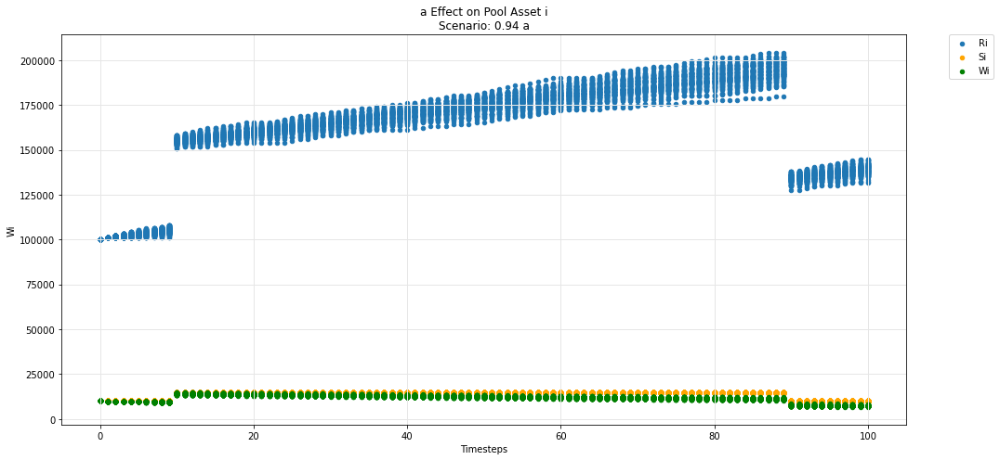

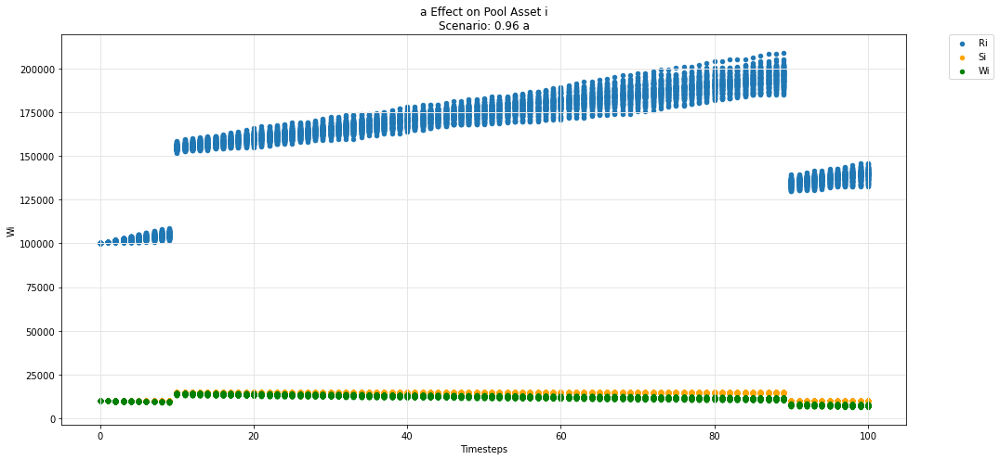

...

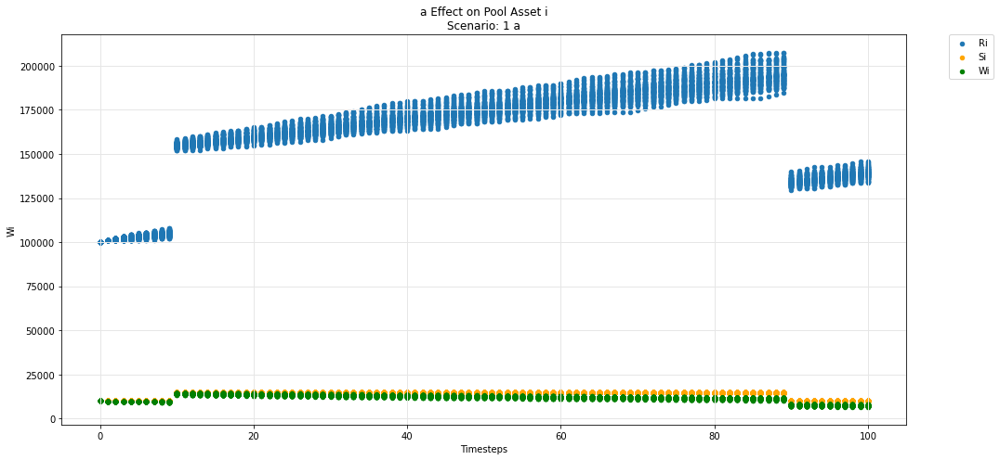

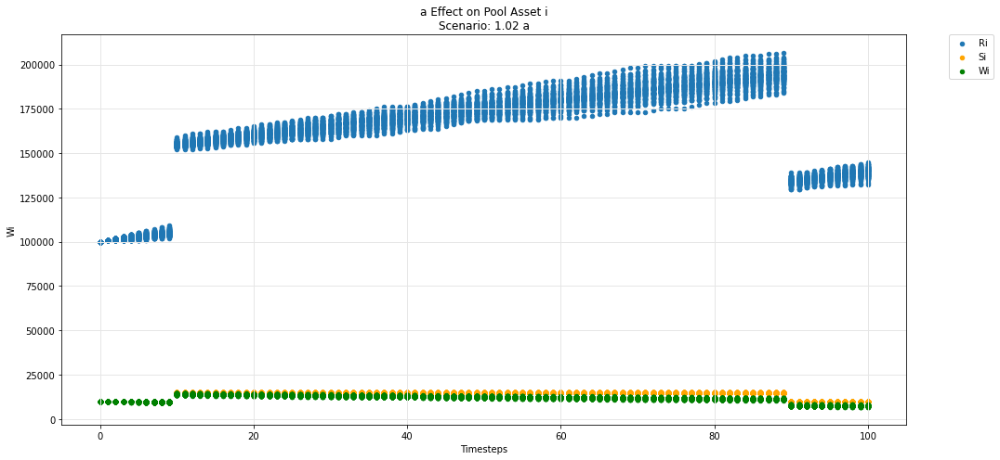

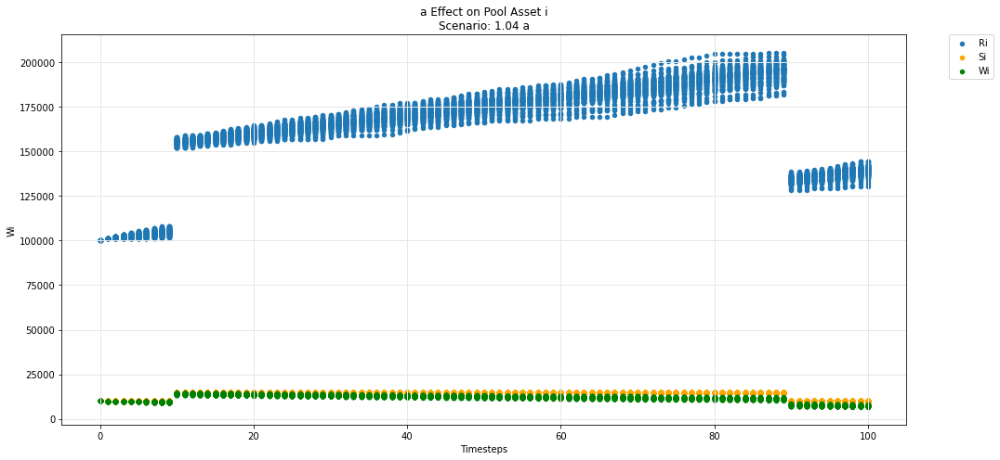

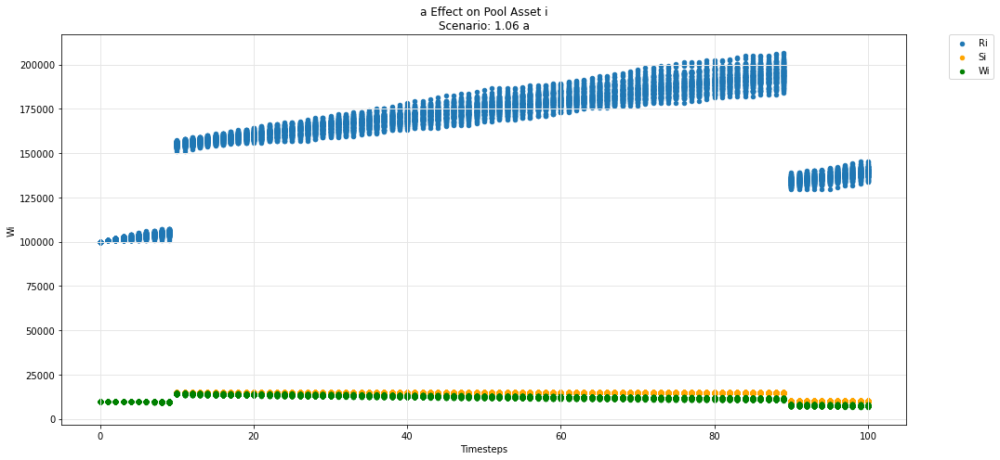

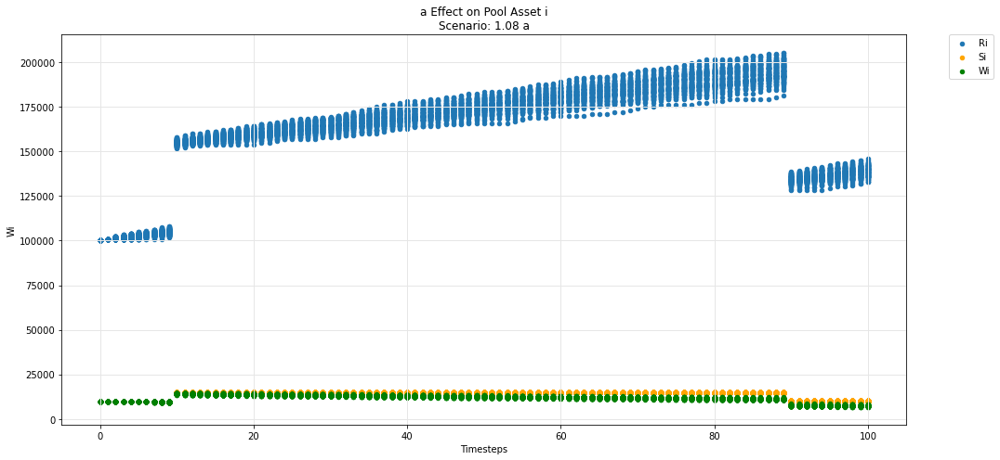

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

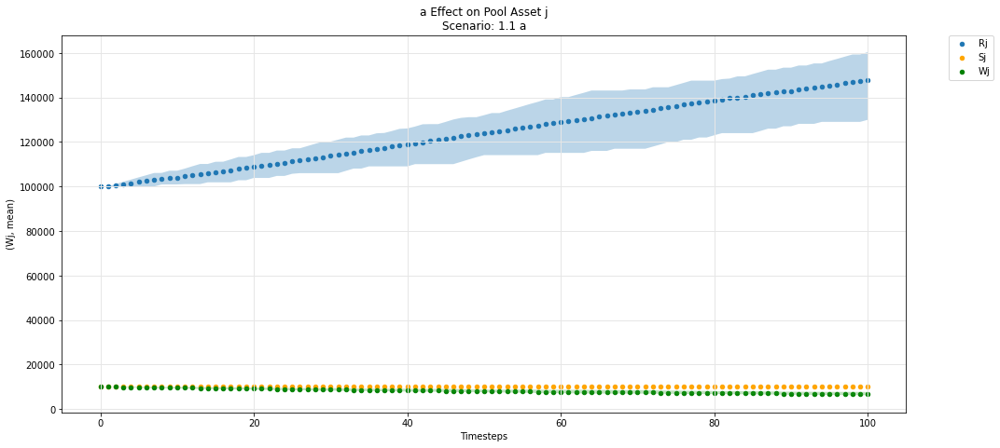

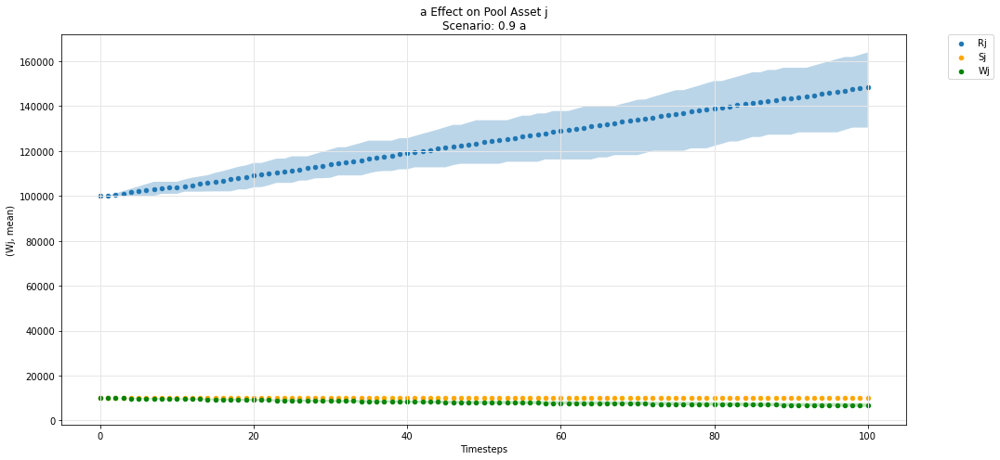

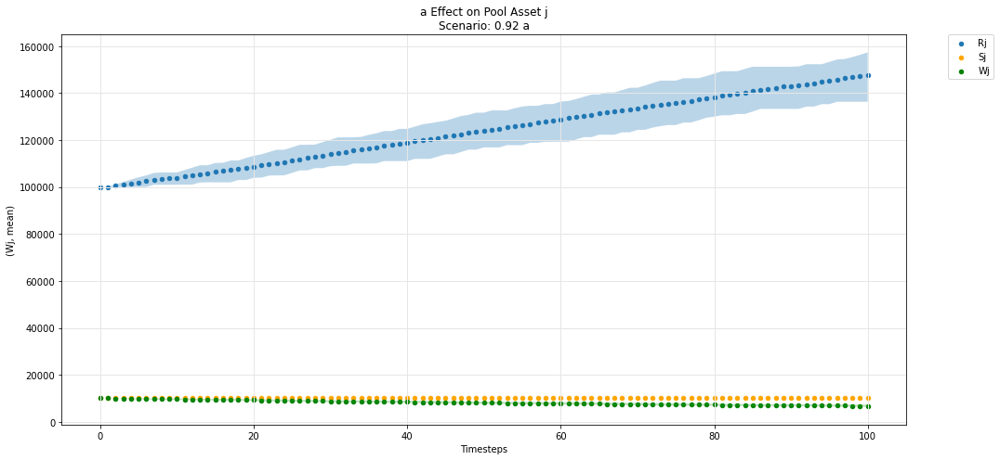

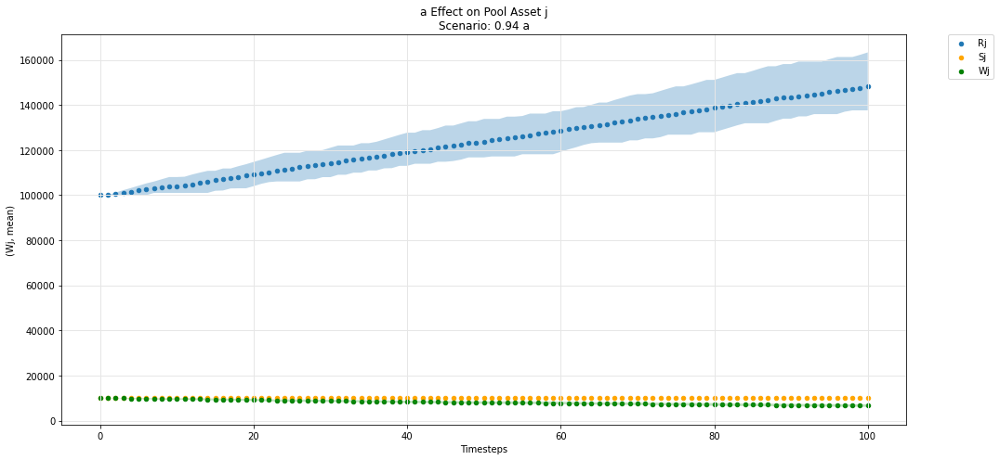

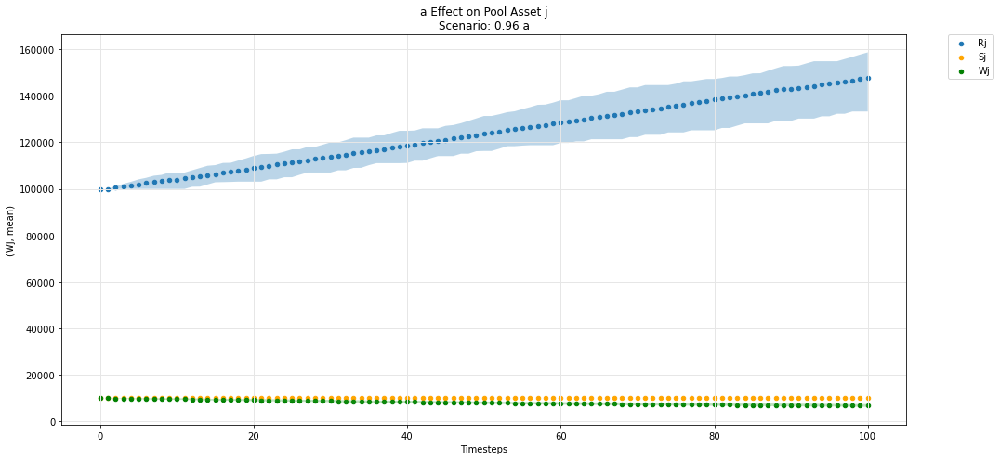

...

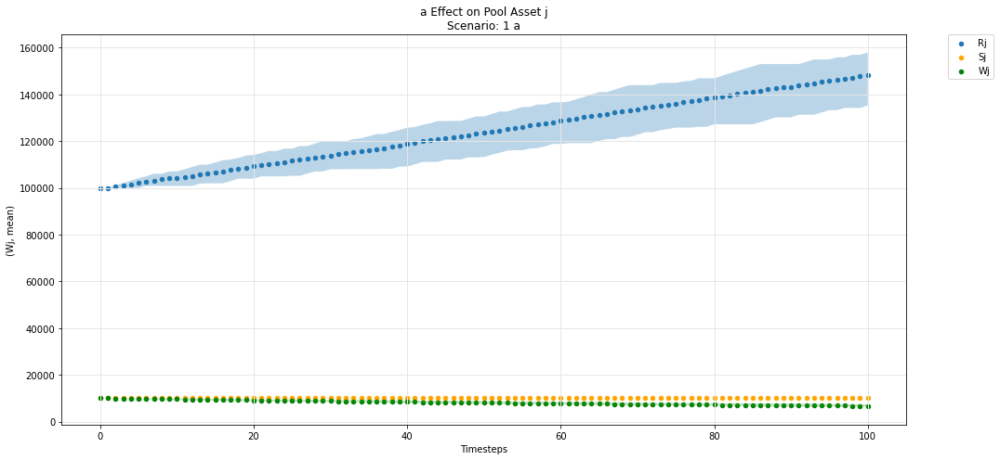

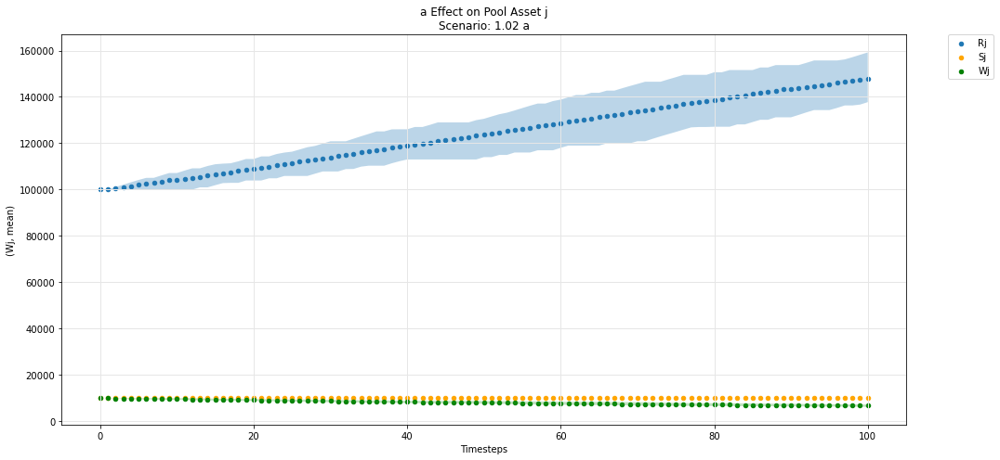

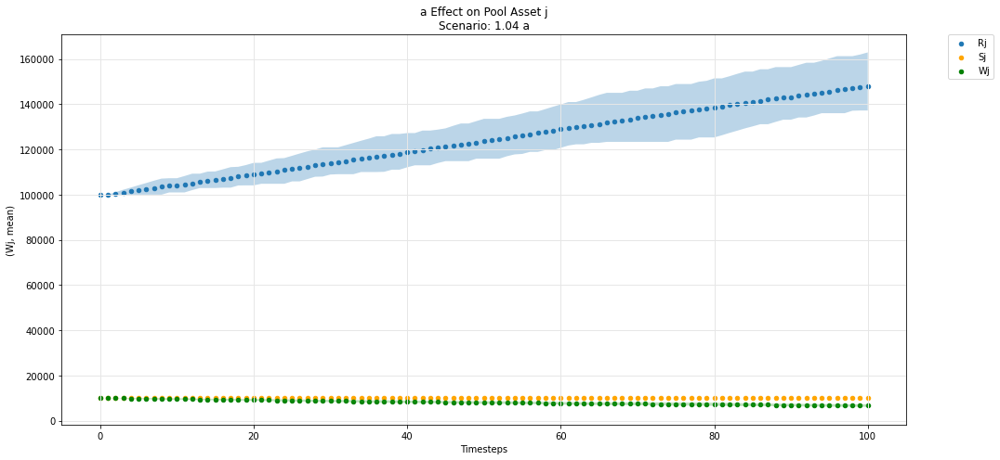

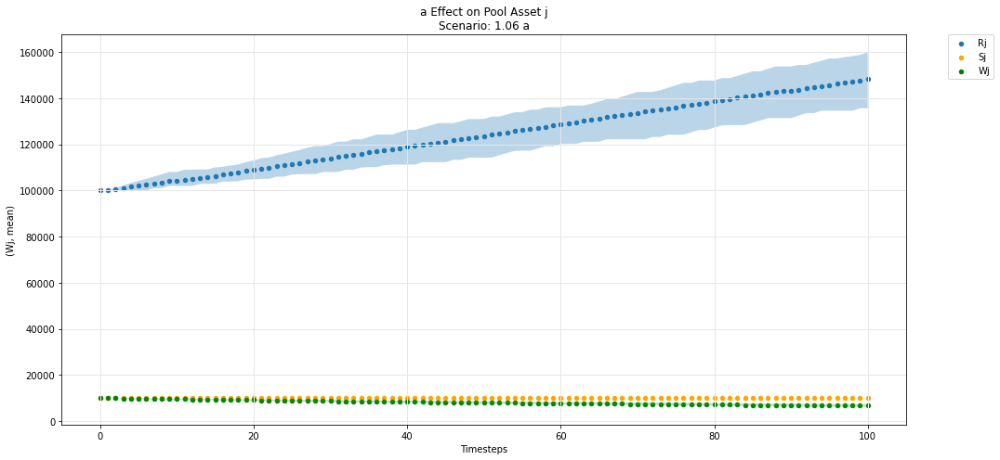

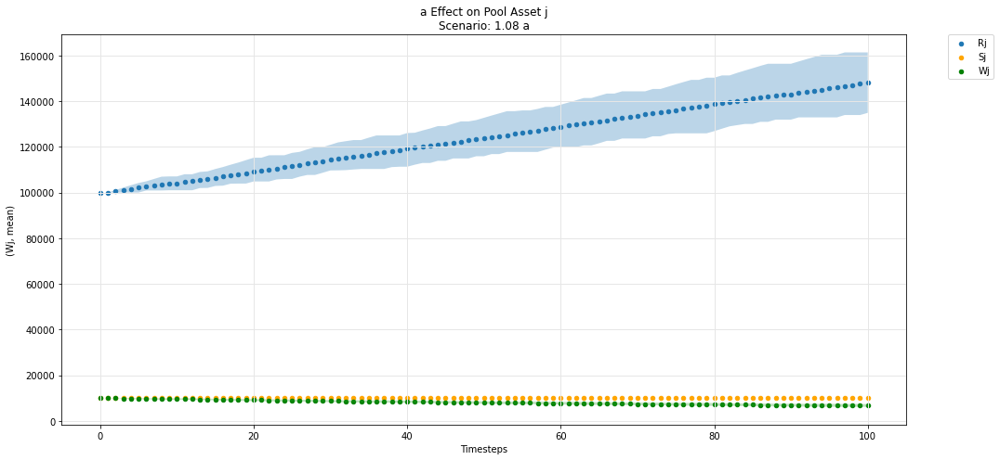

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

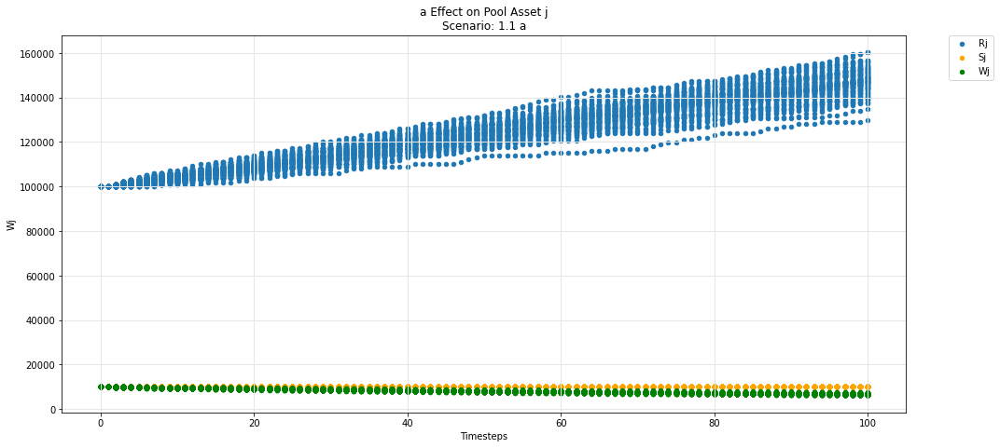

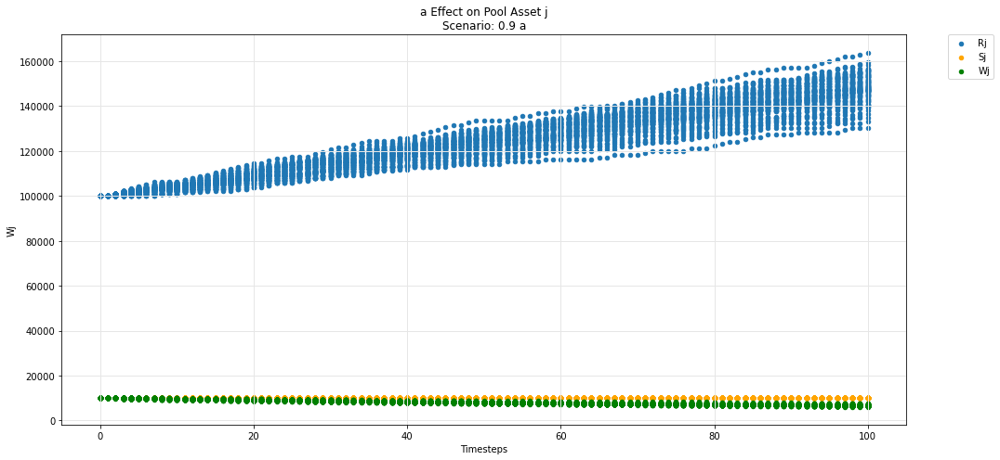

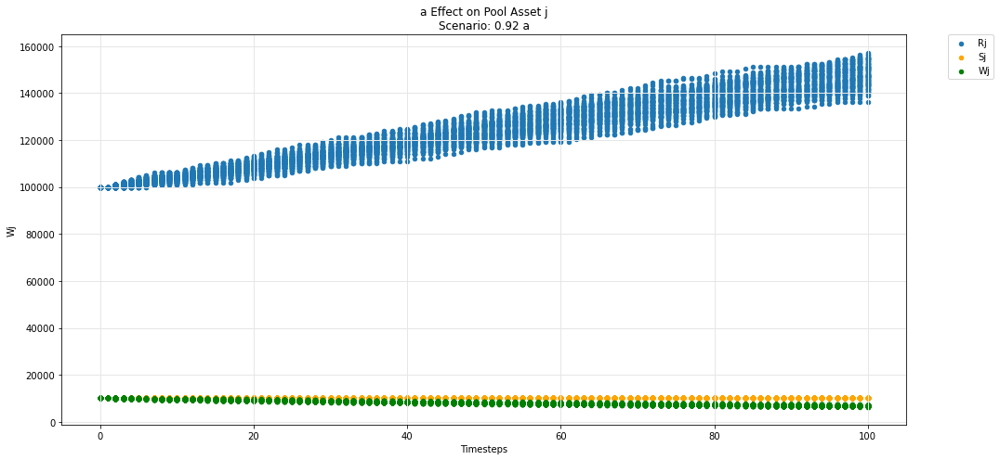

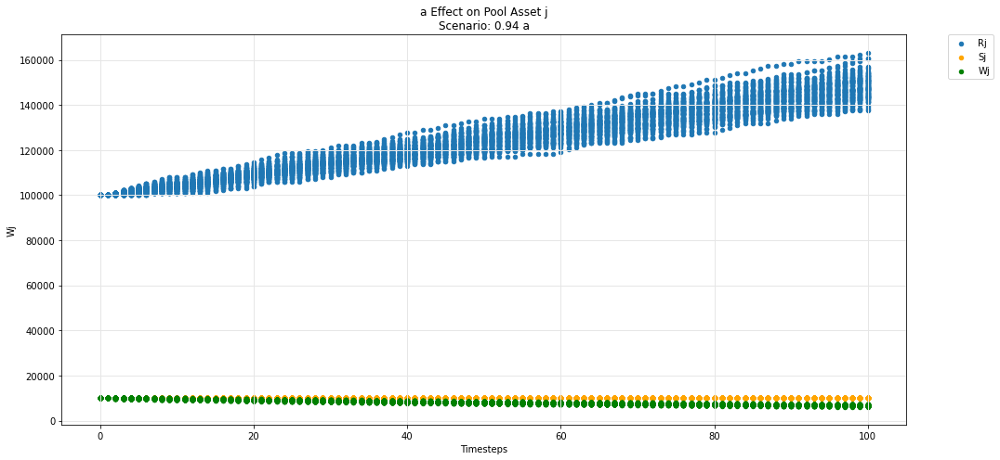

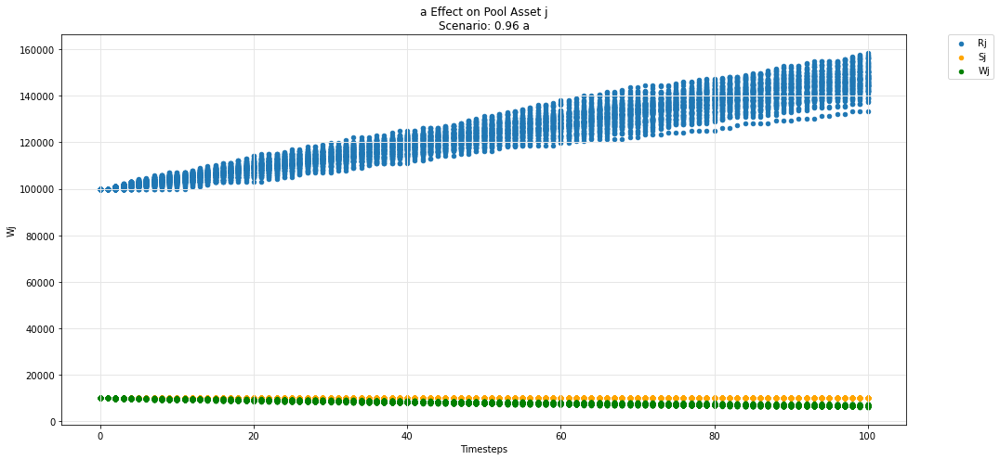

...

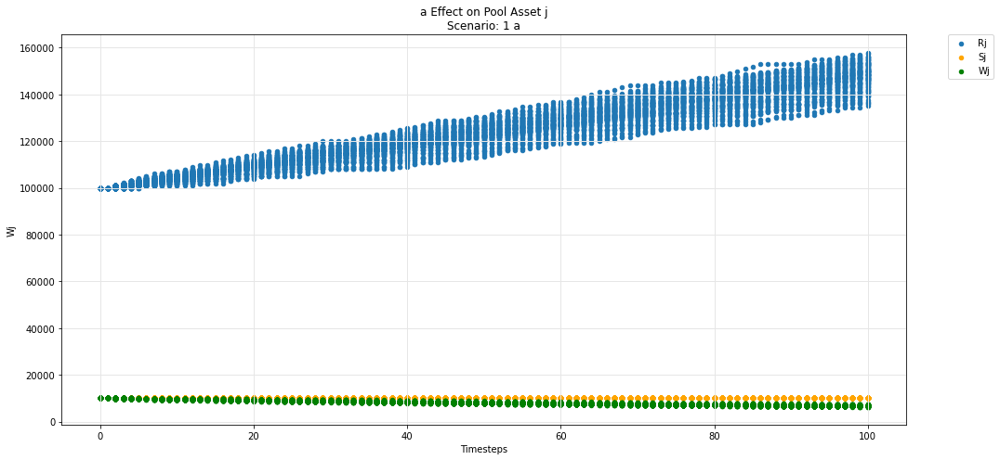

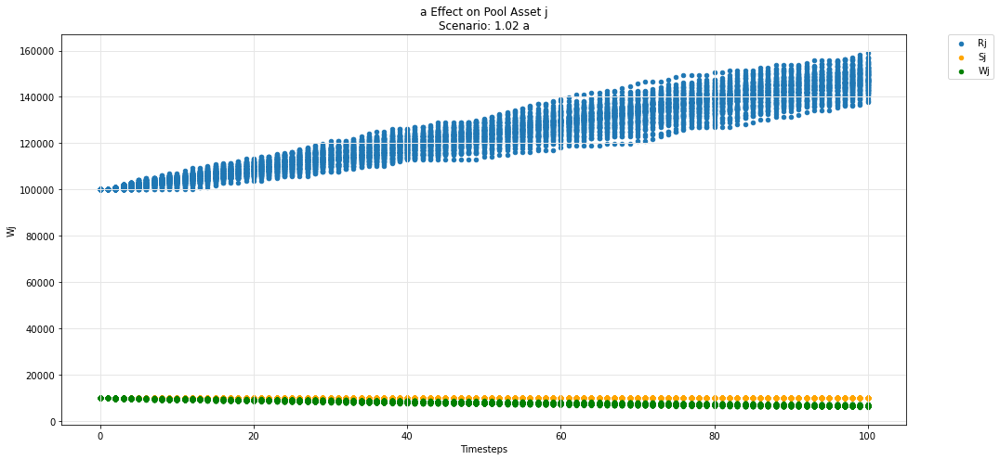

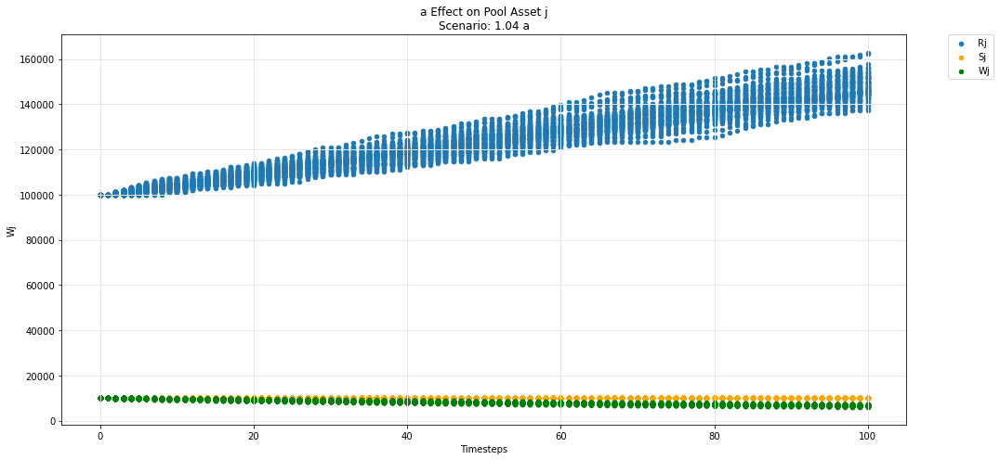

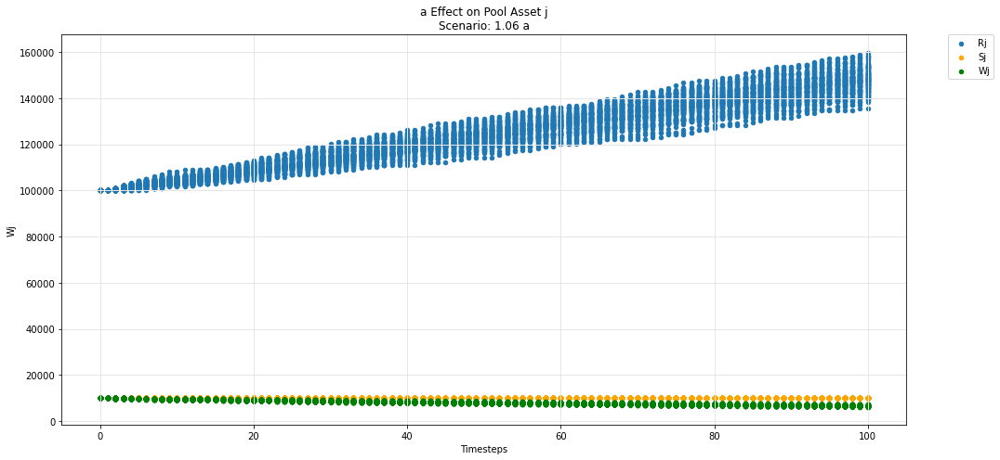

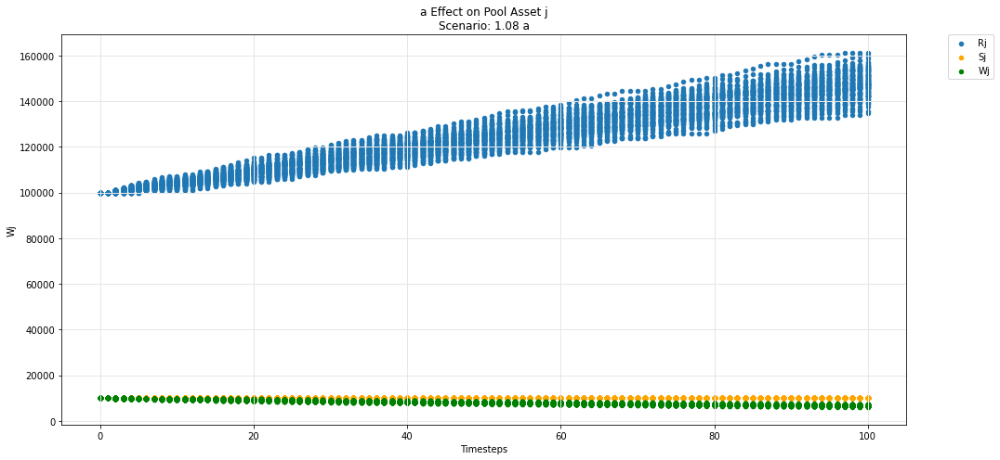

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

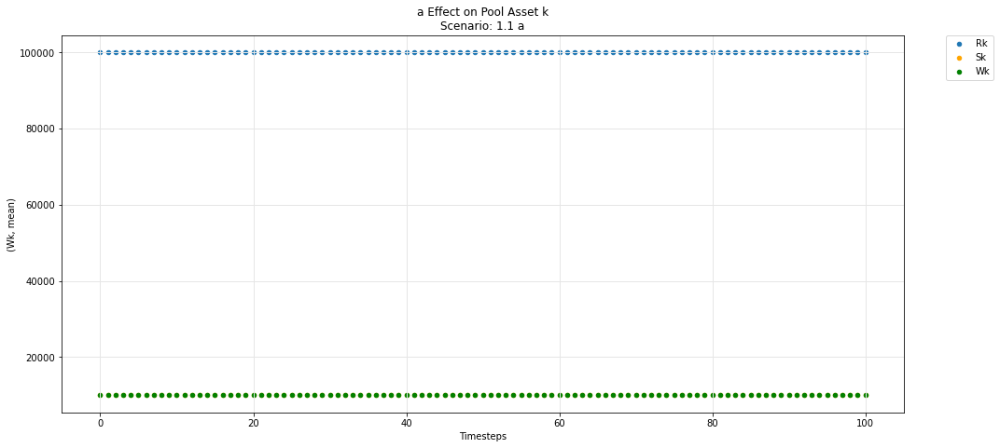

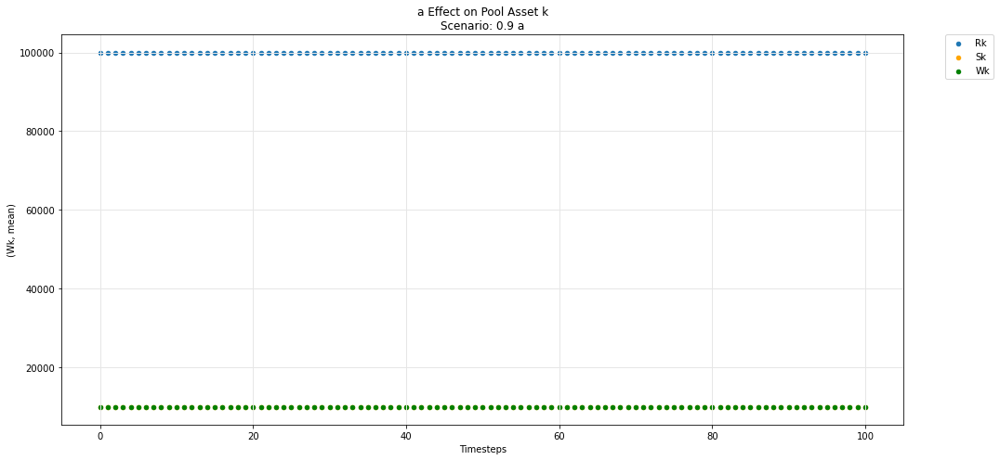

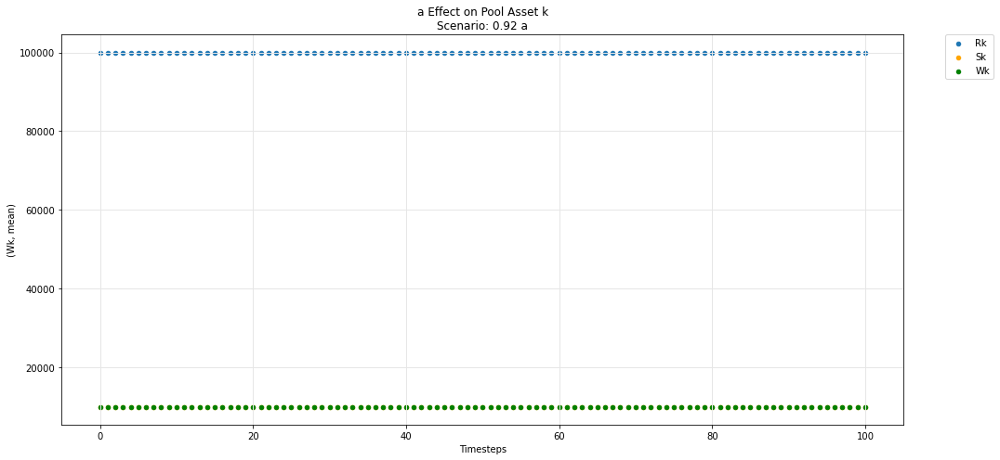

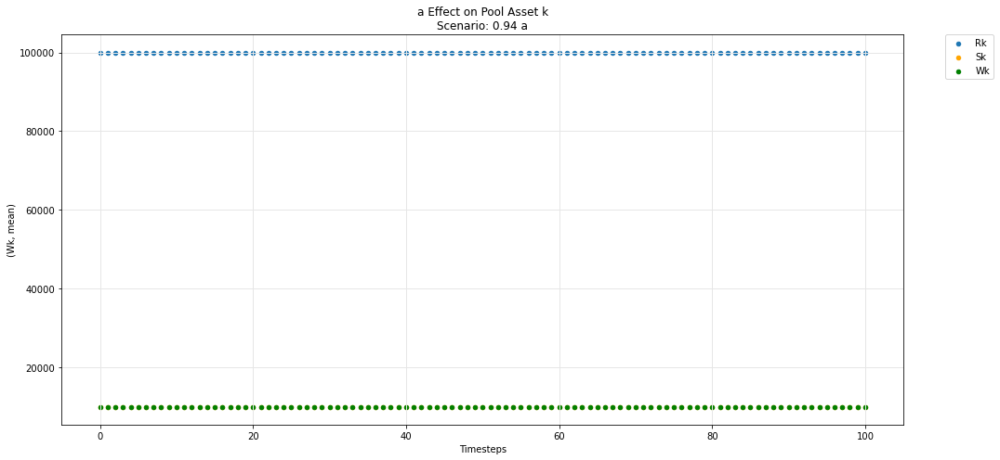

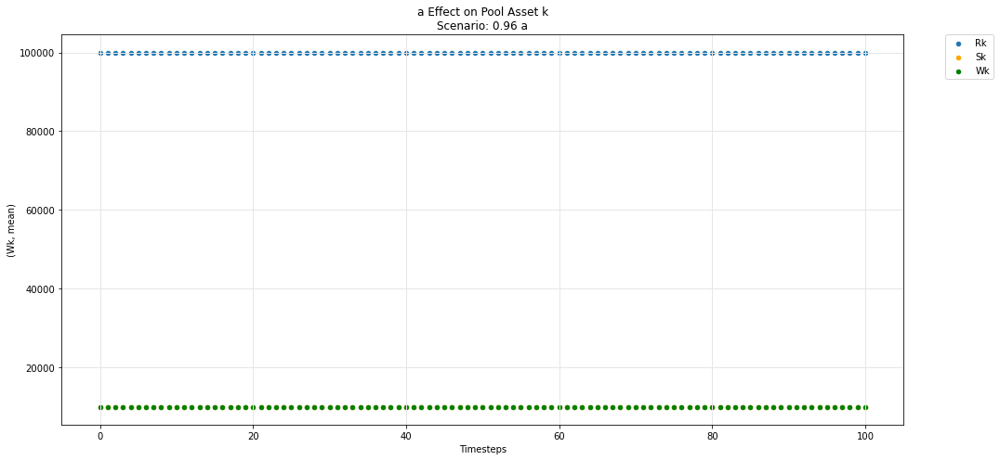

...

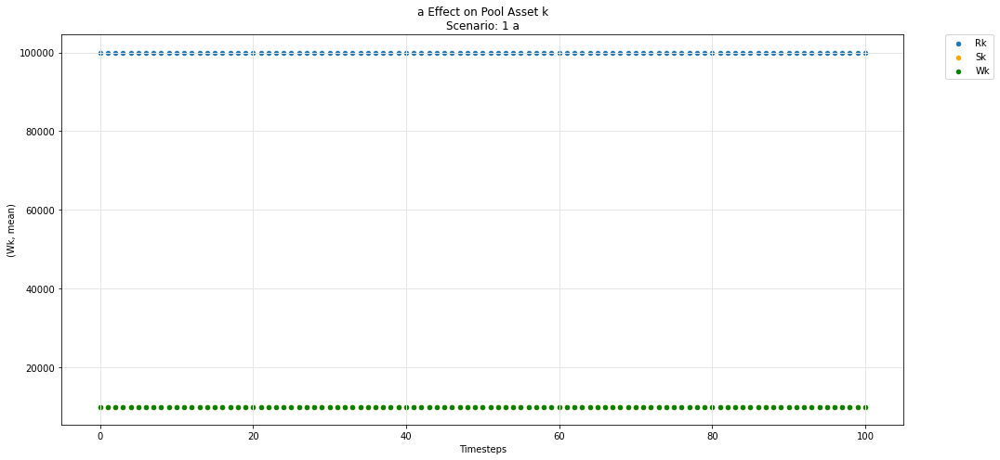

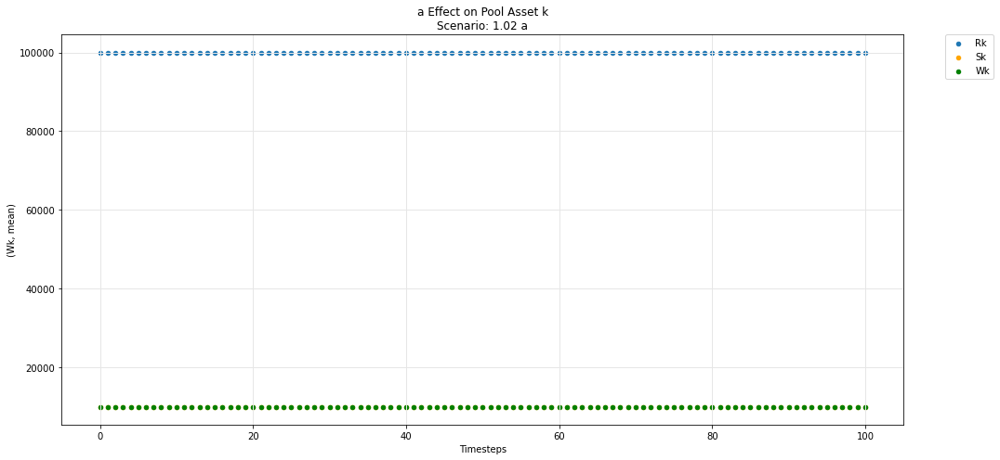

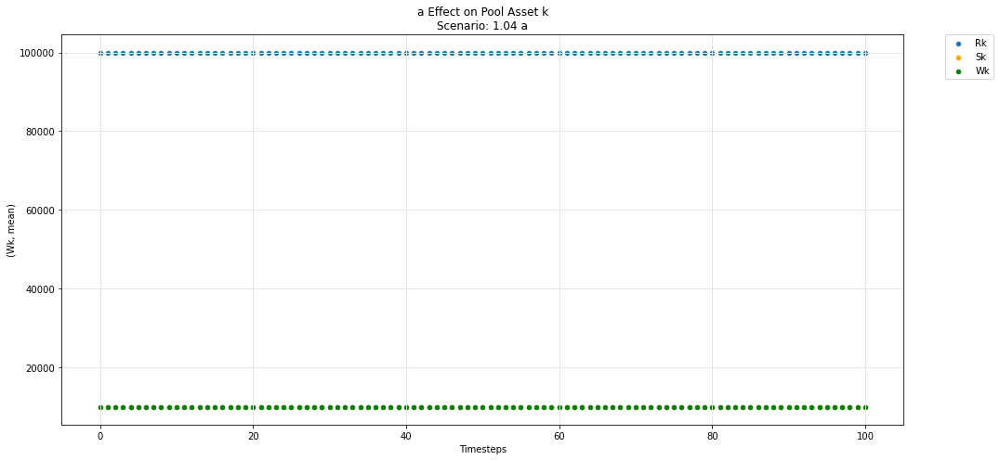

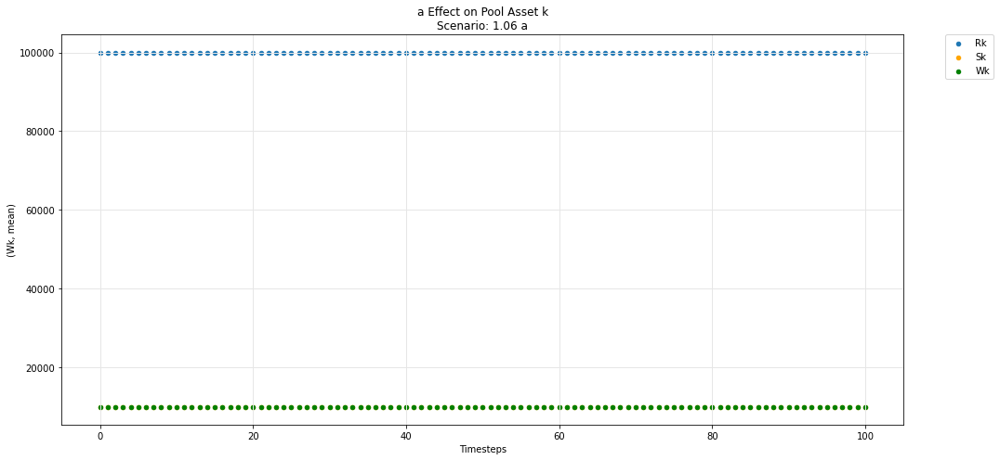

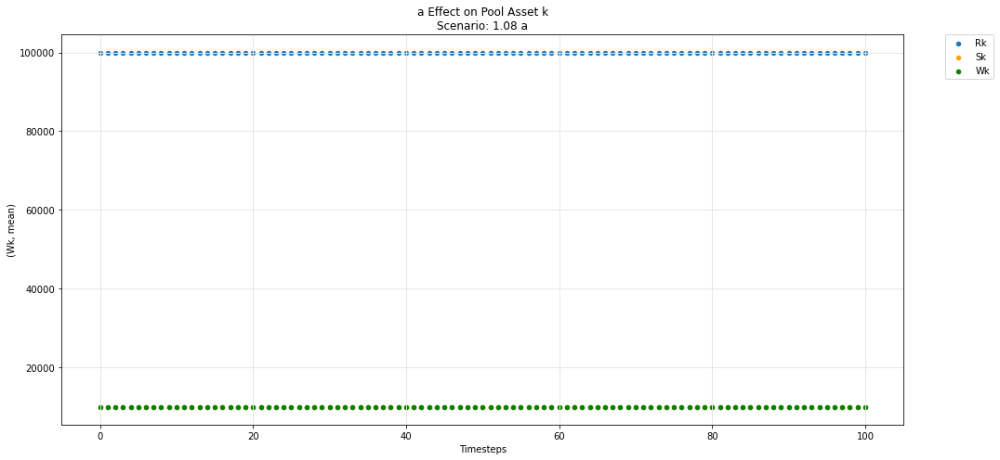

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

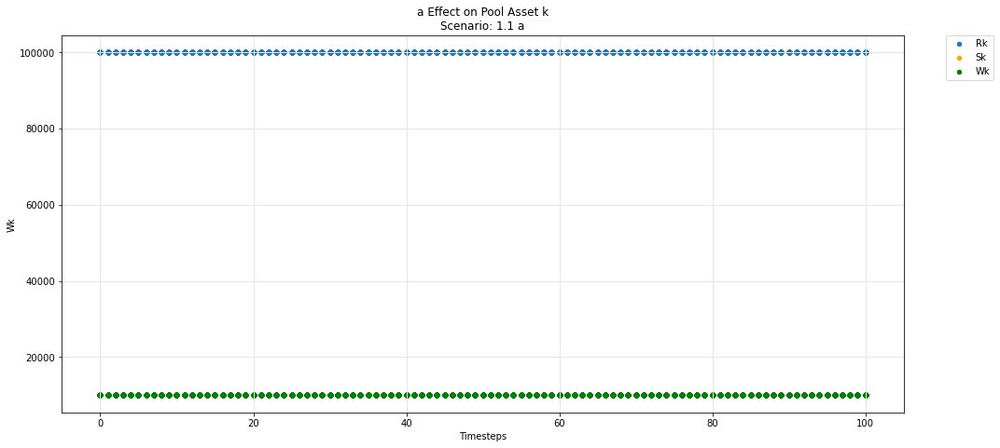

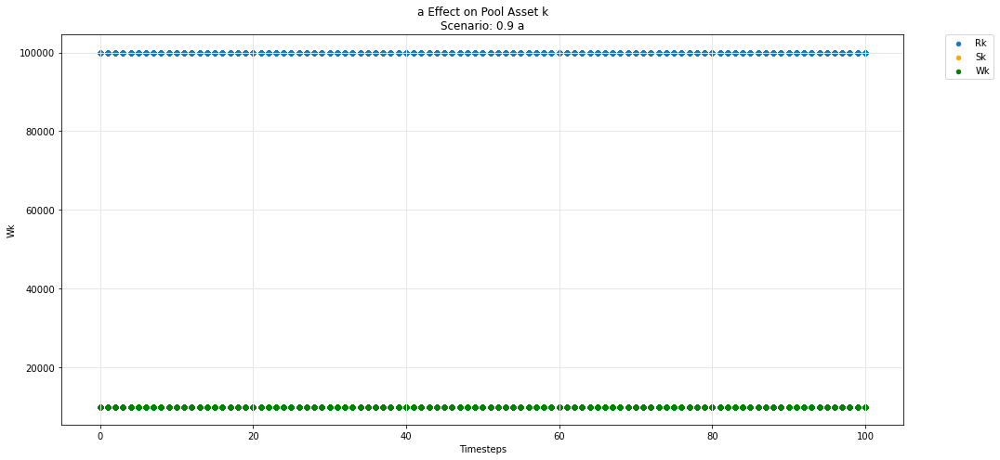

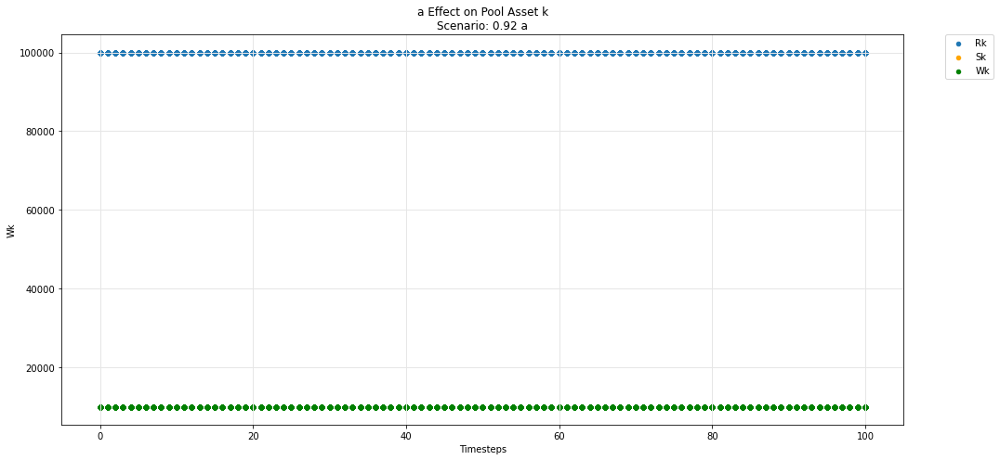

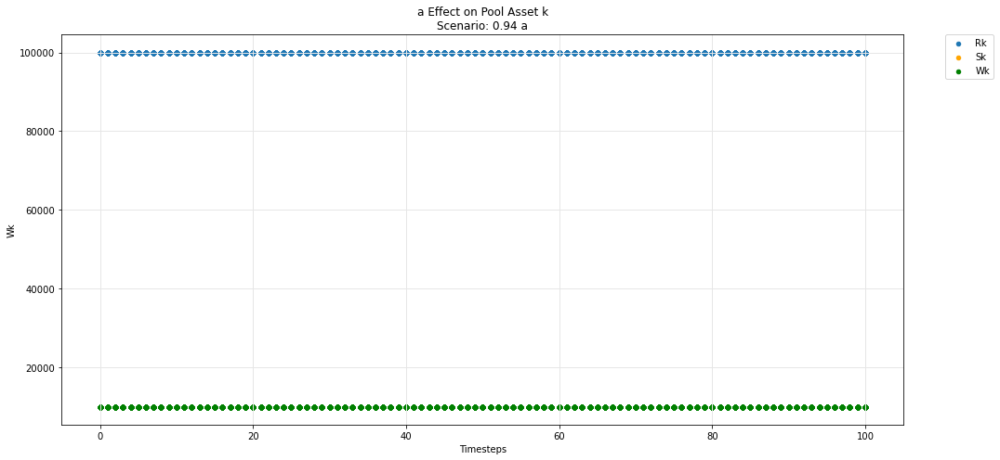

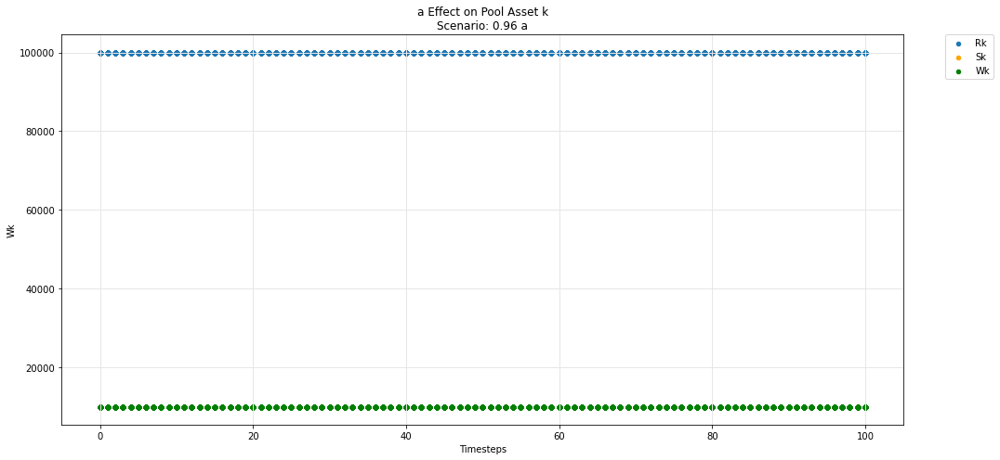

...

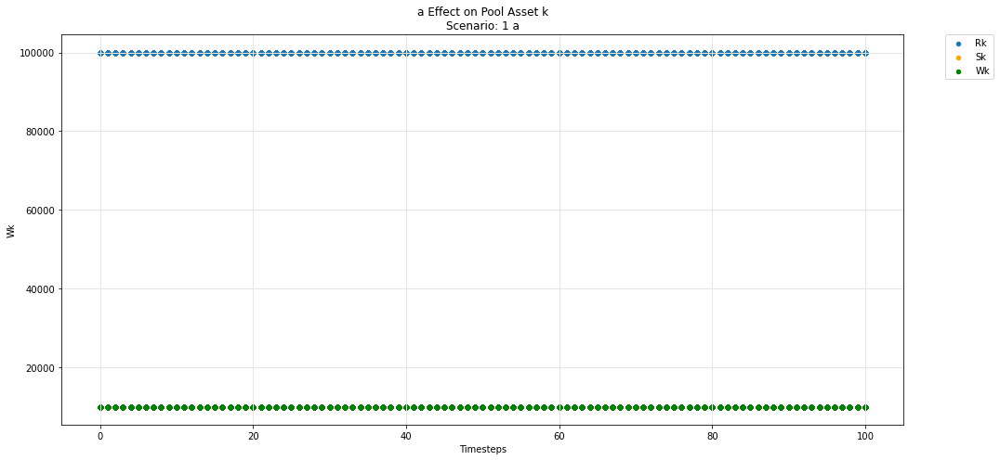

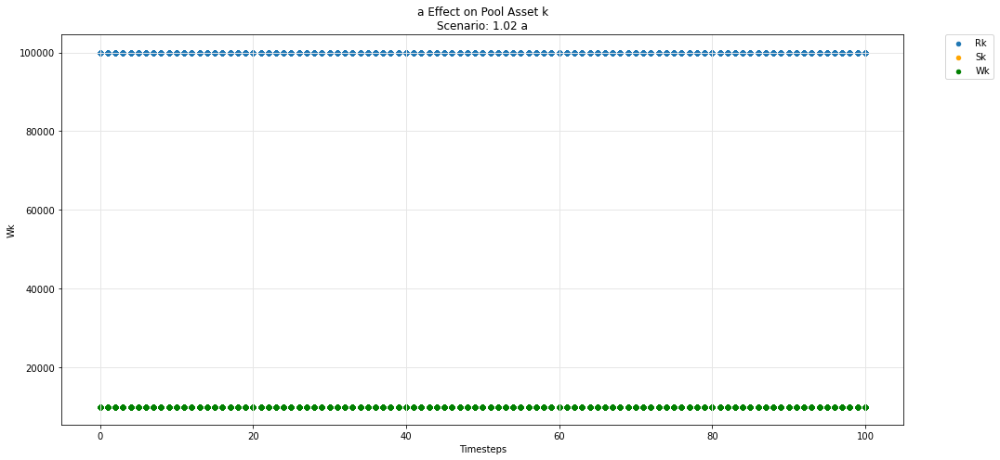

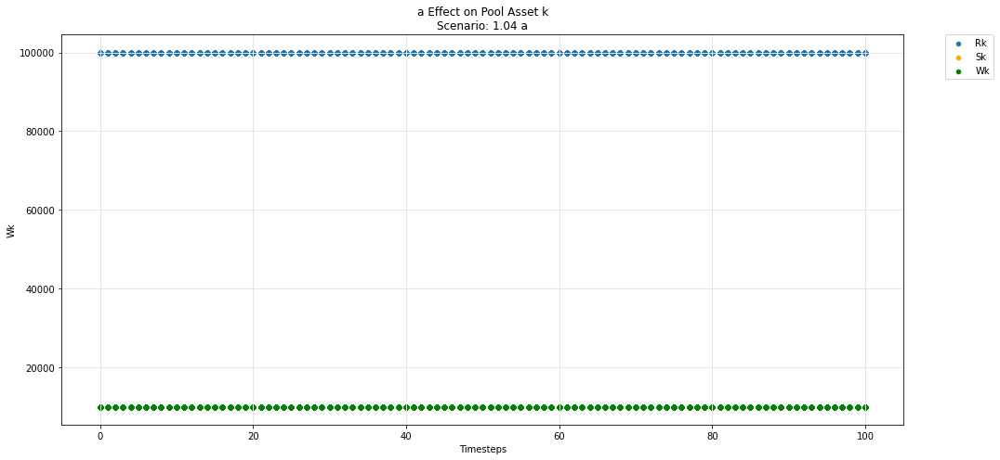

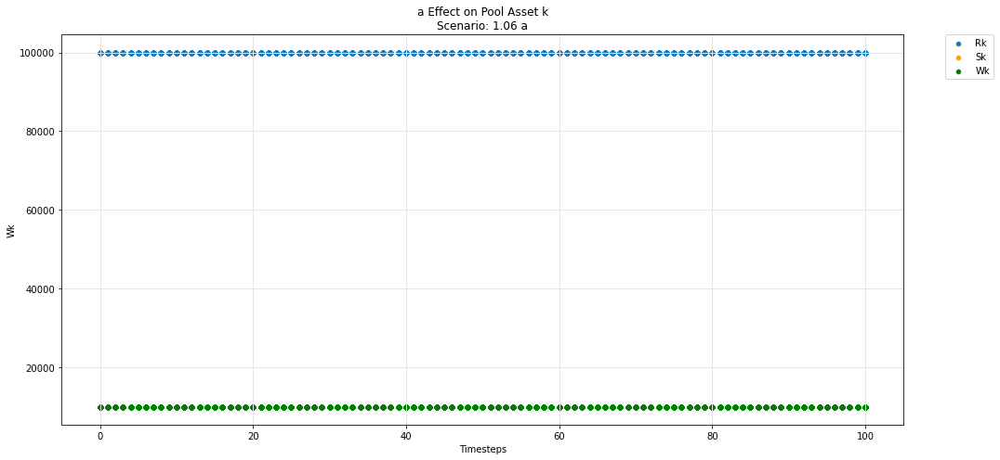

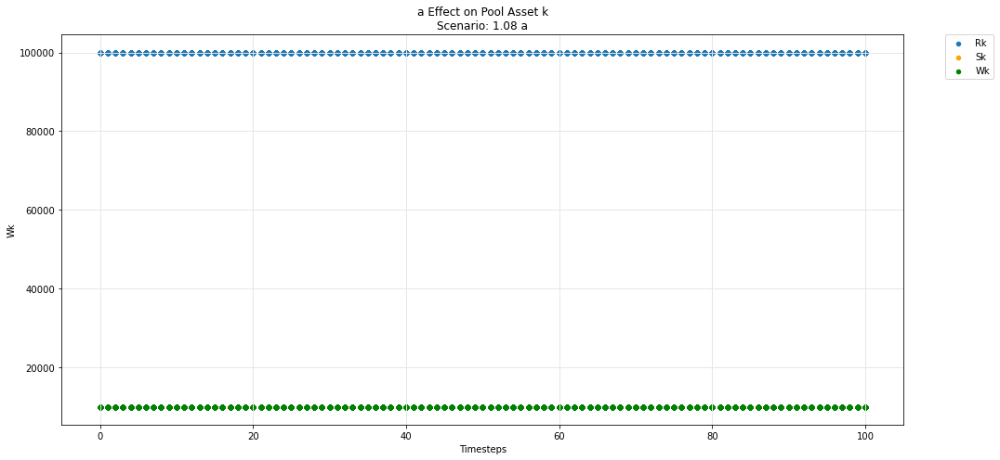

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

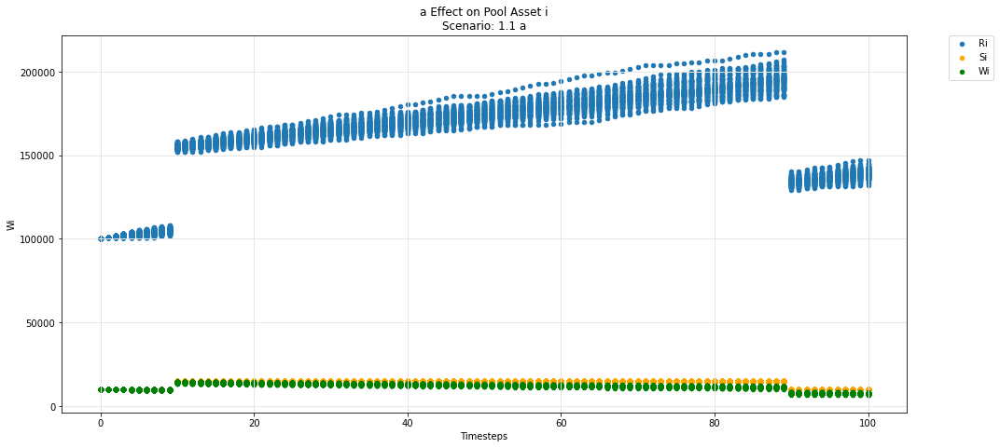

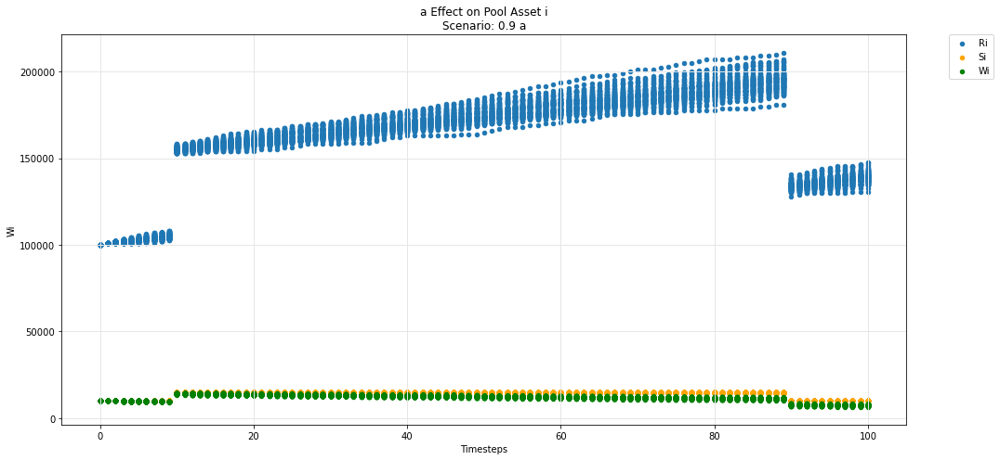

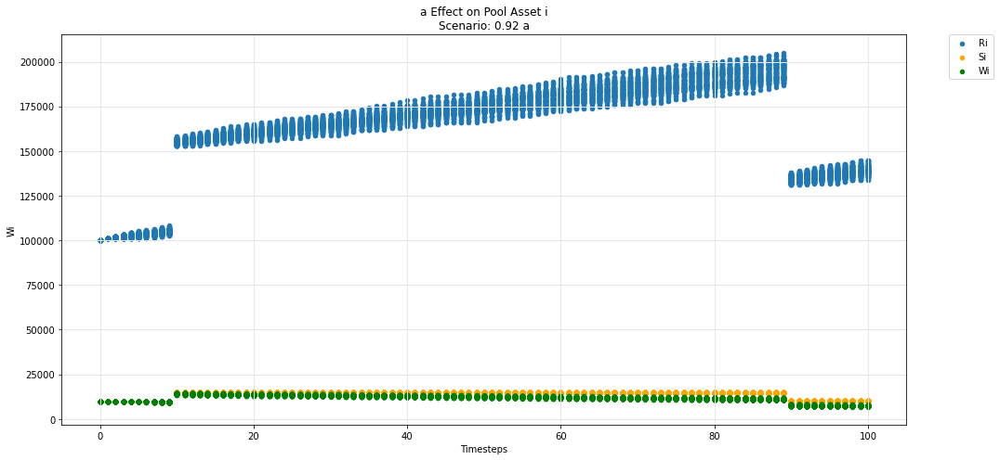

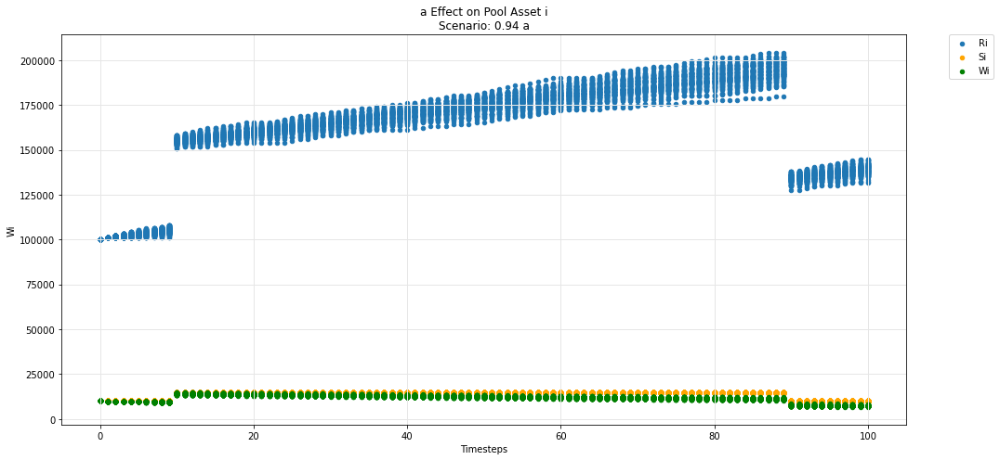

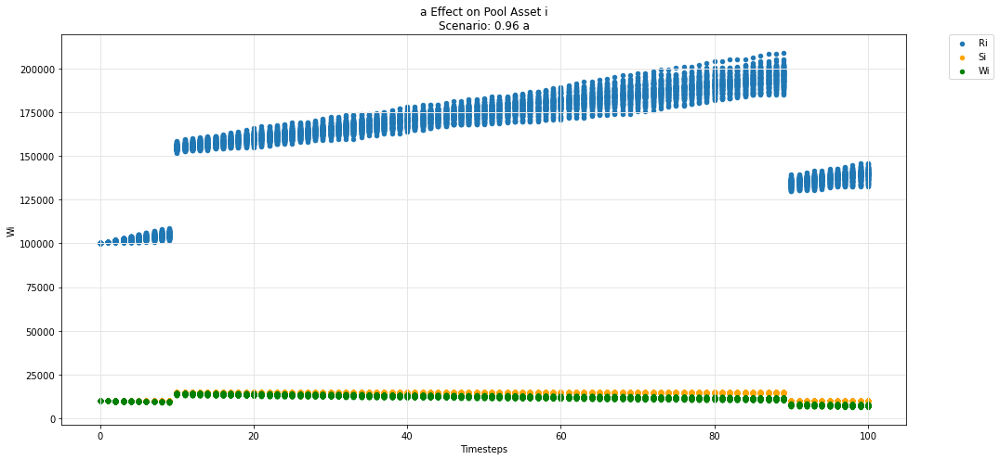

...

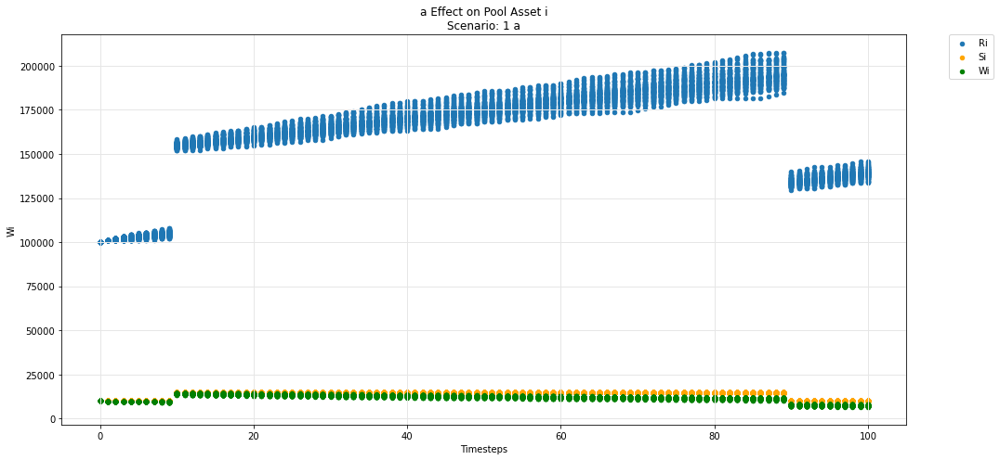

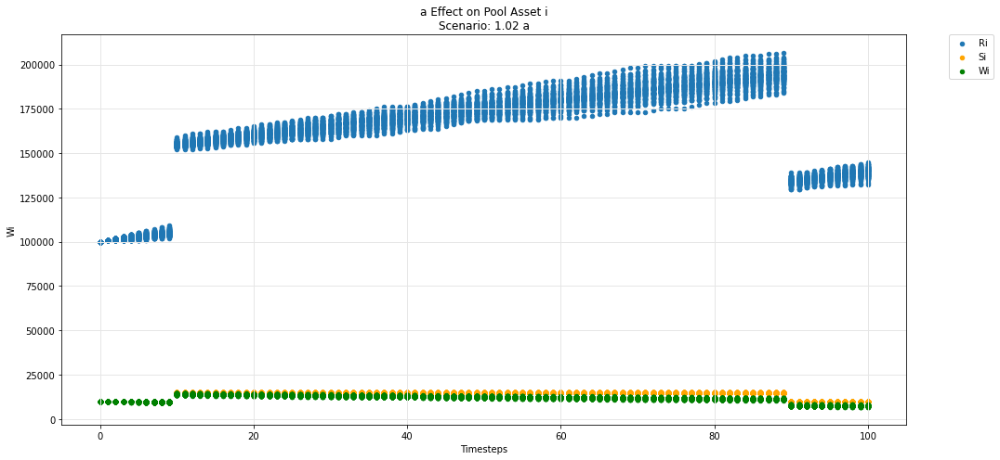

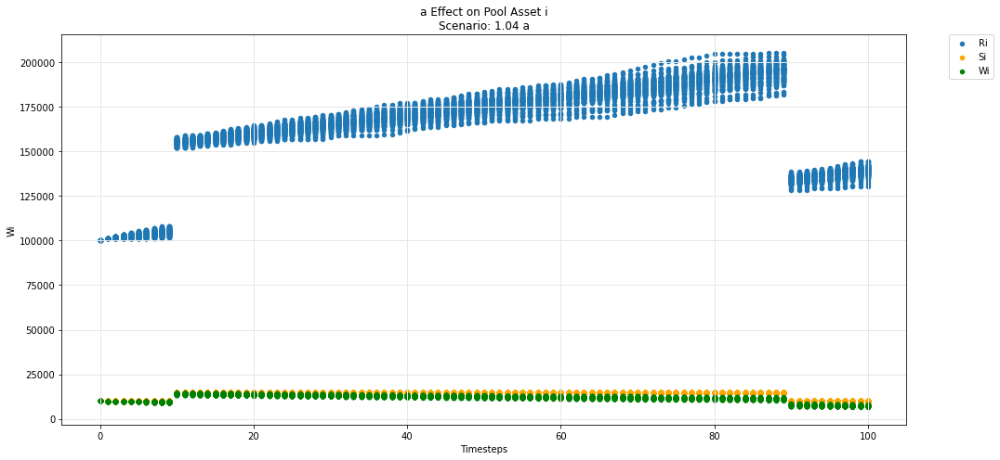

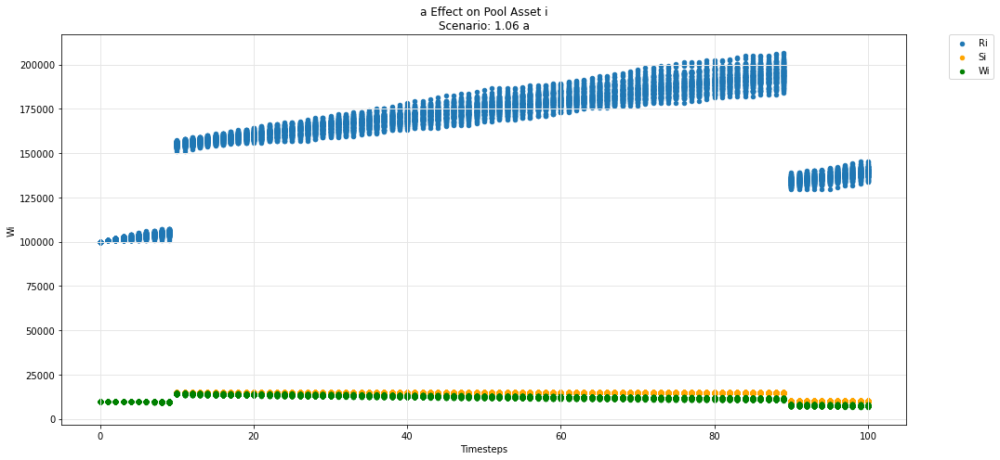

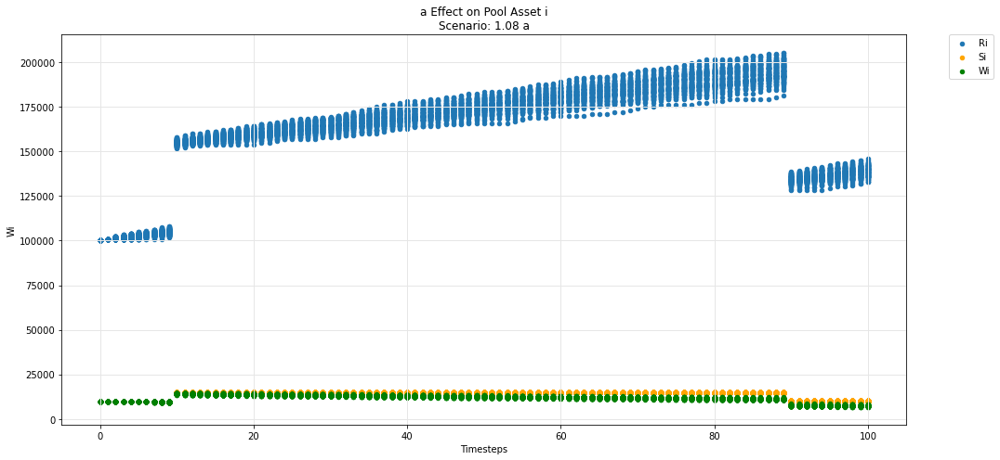

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

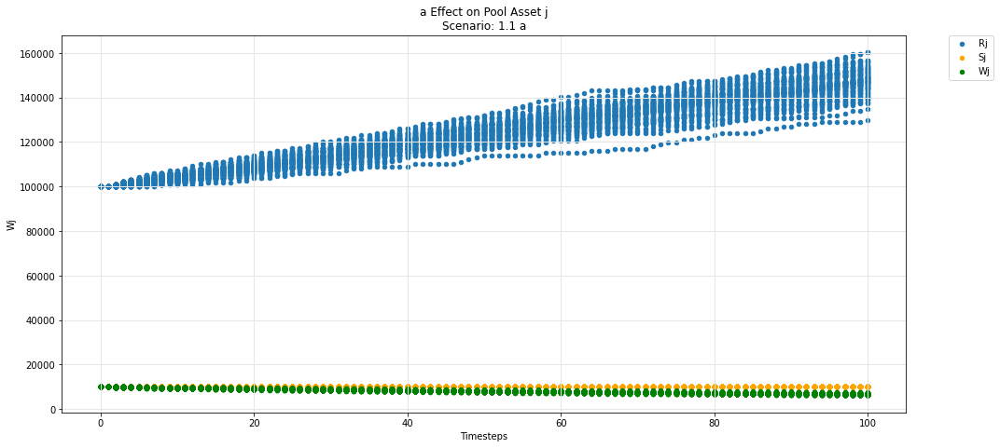

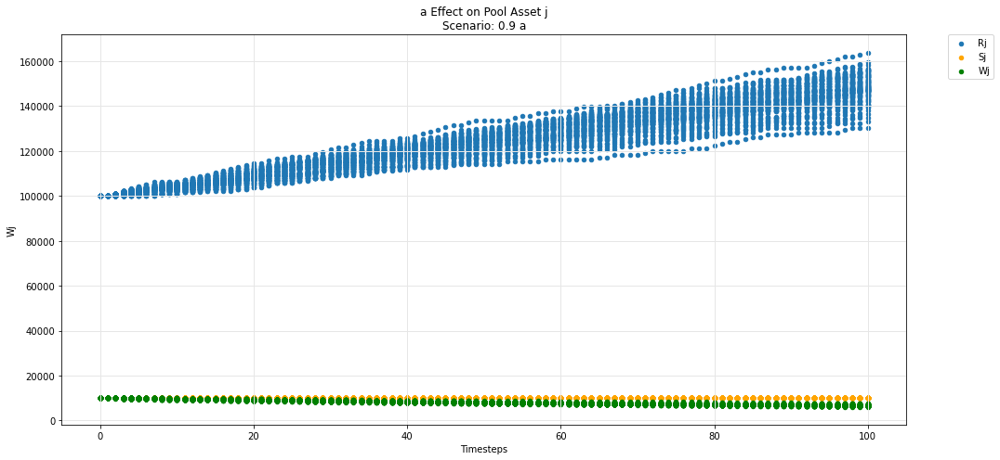

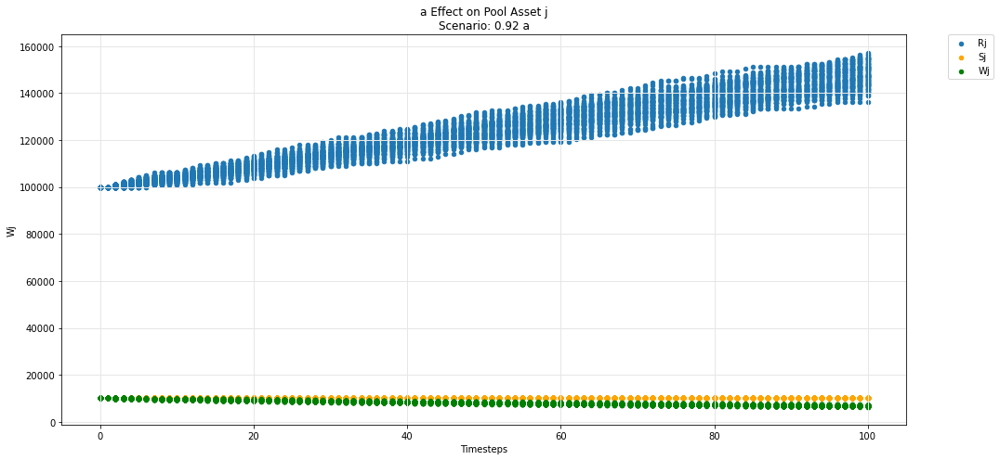

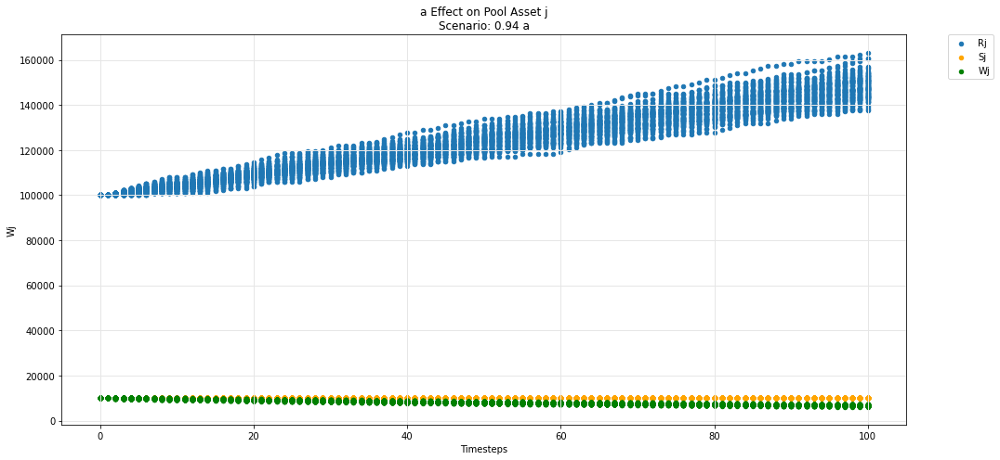

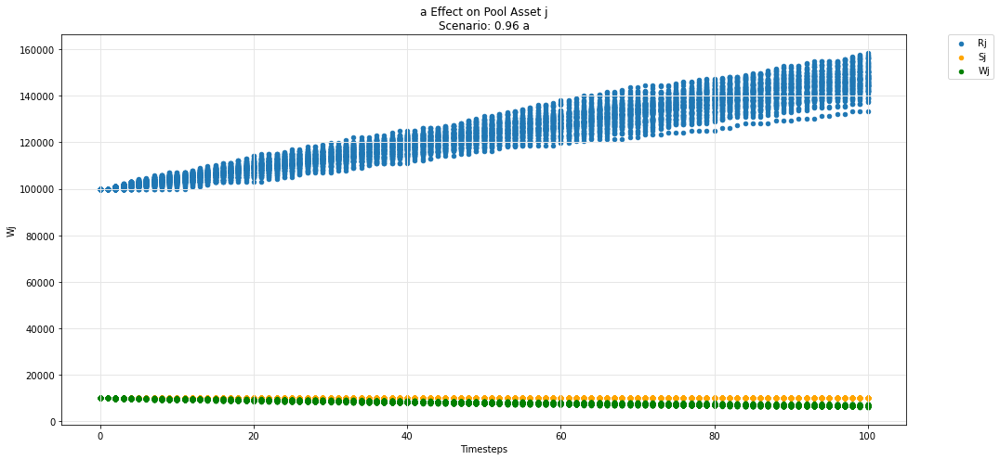

...

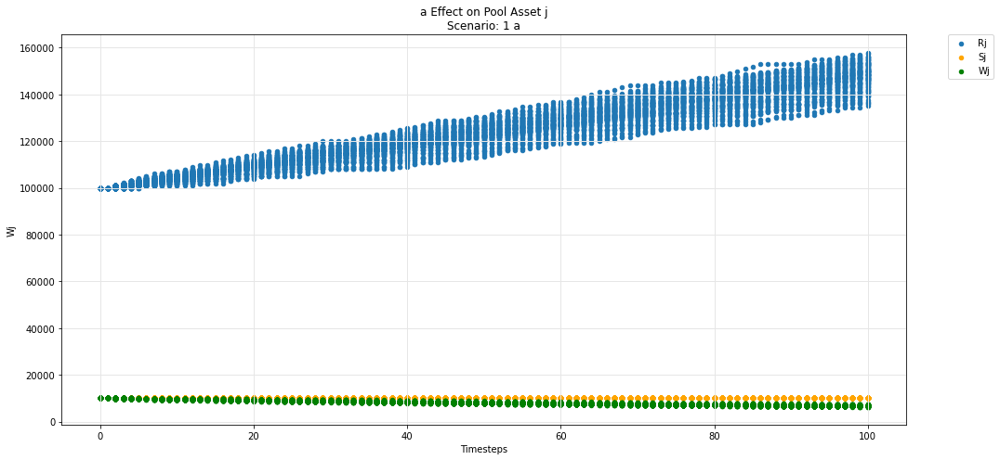

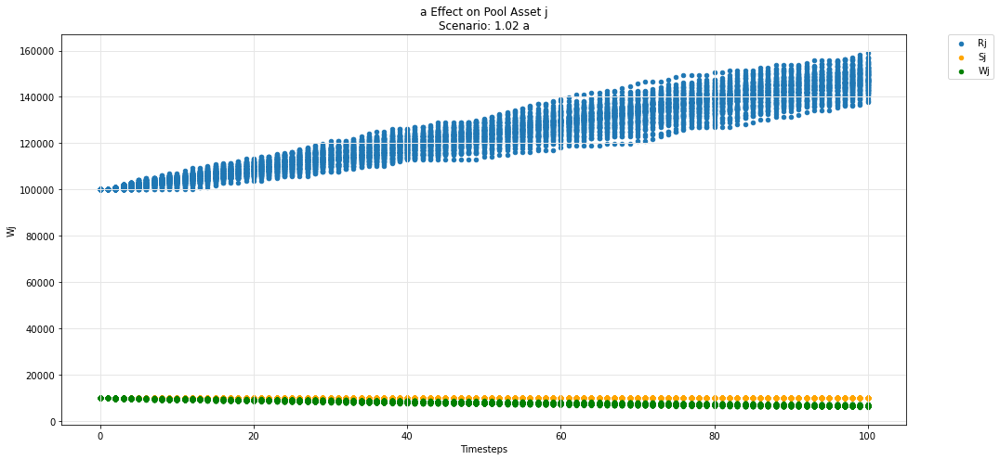

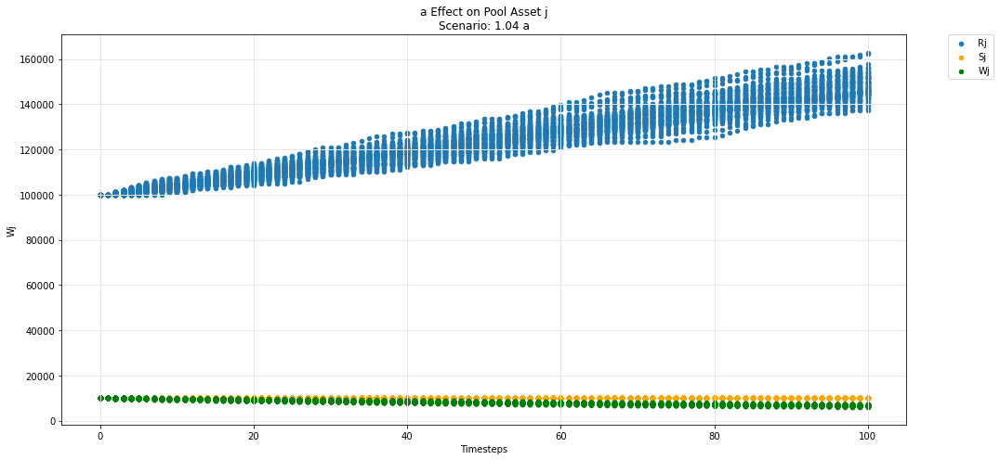

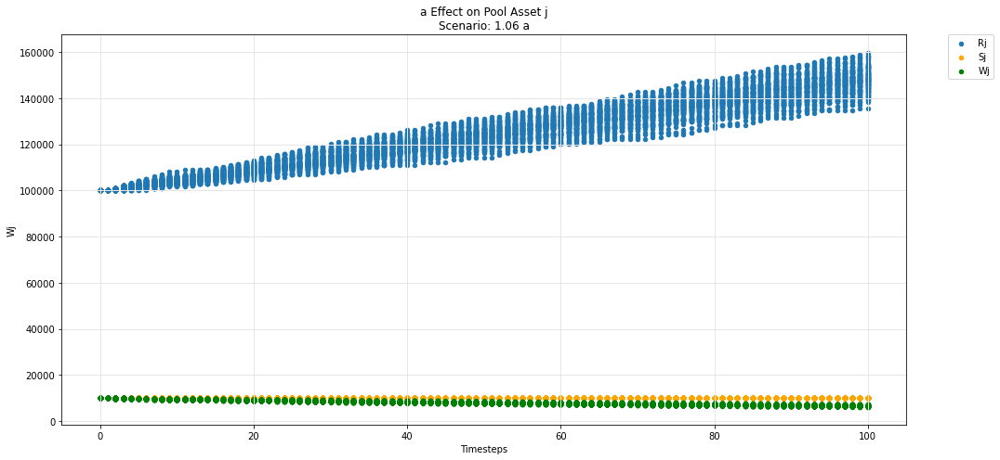

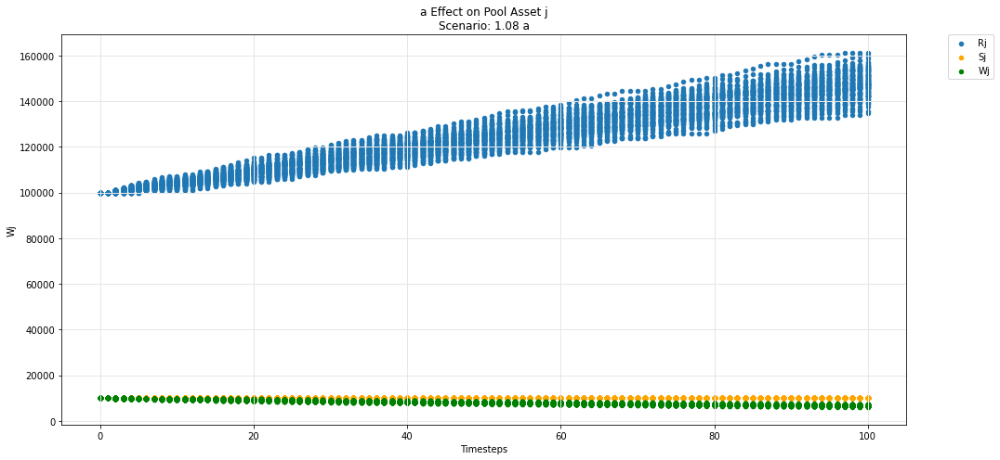

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

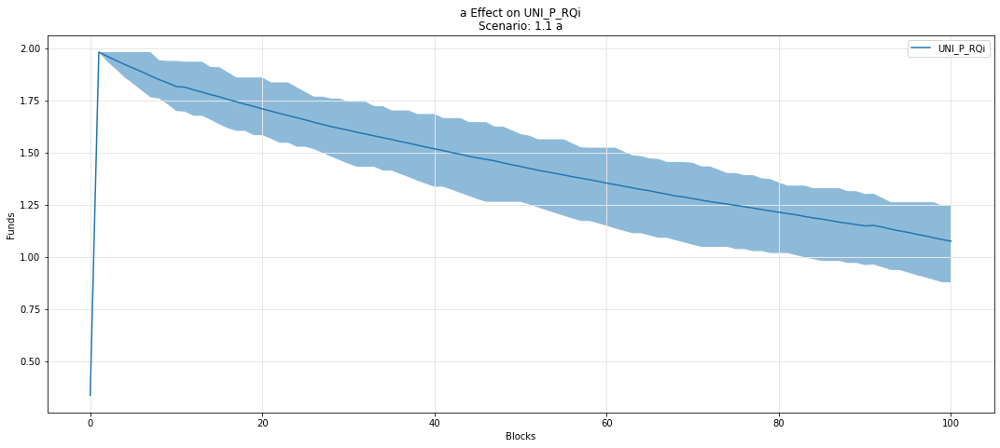

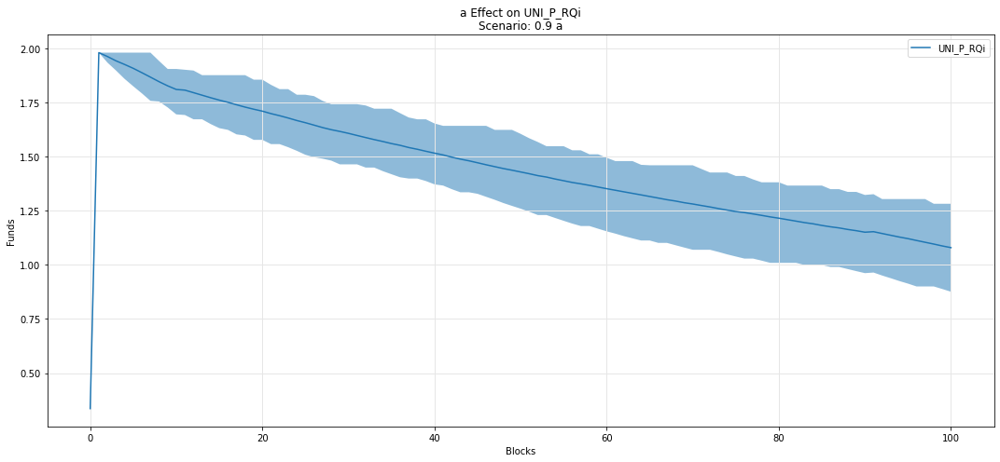

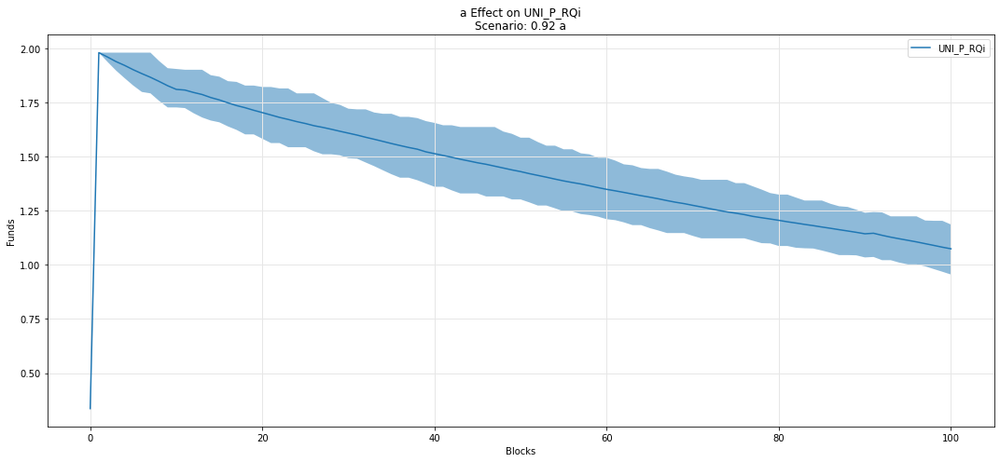

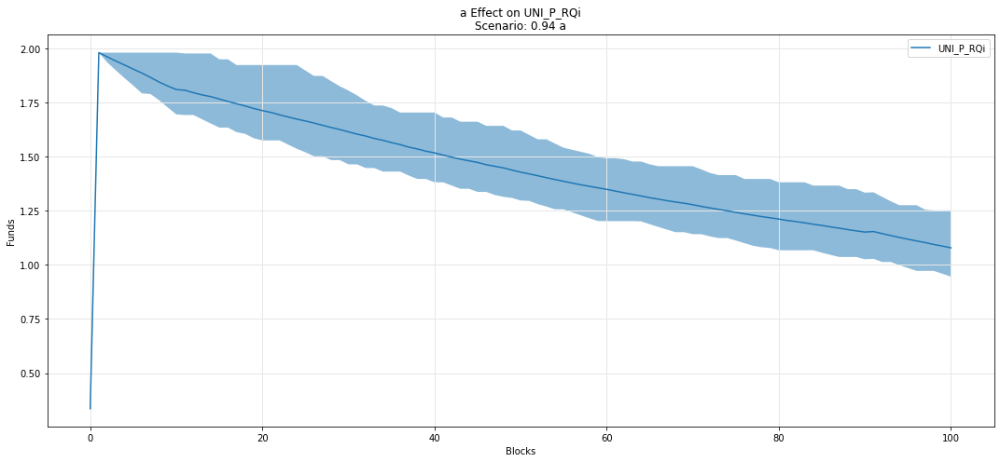

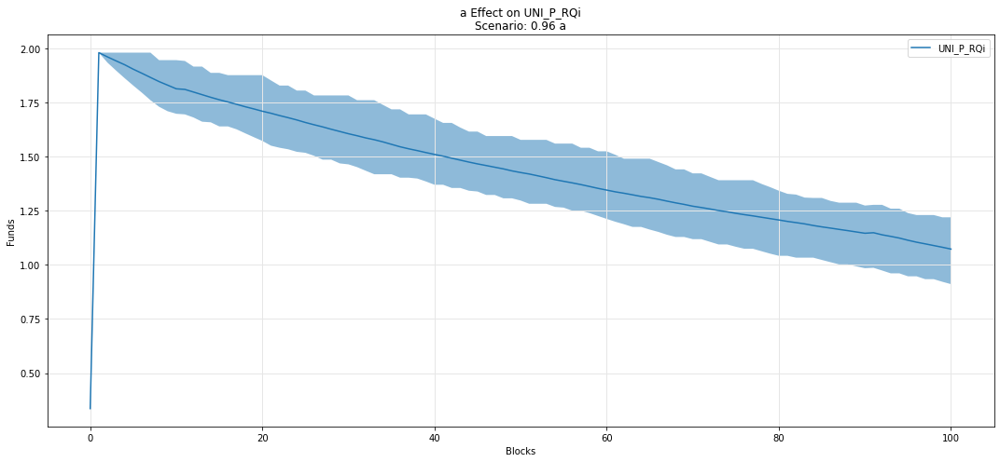

...

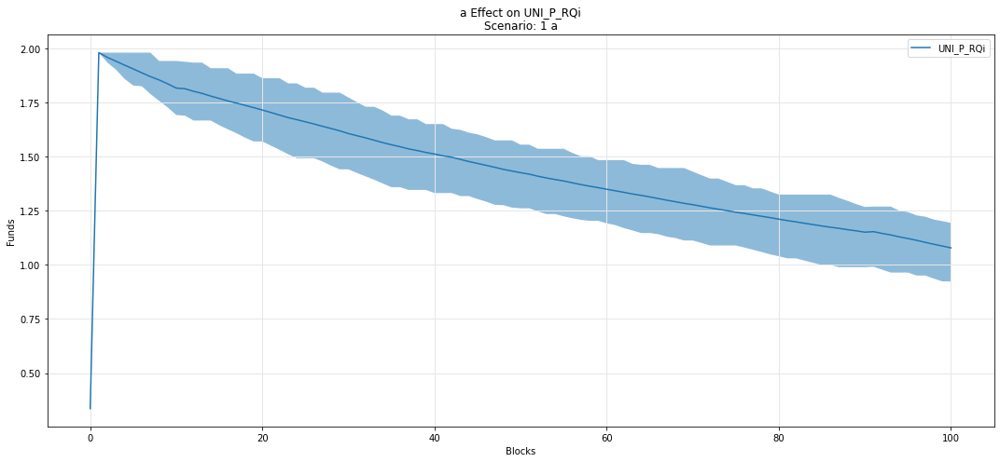

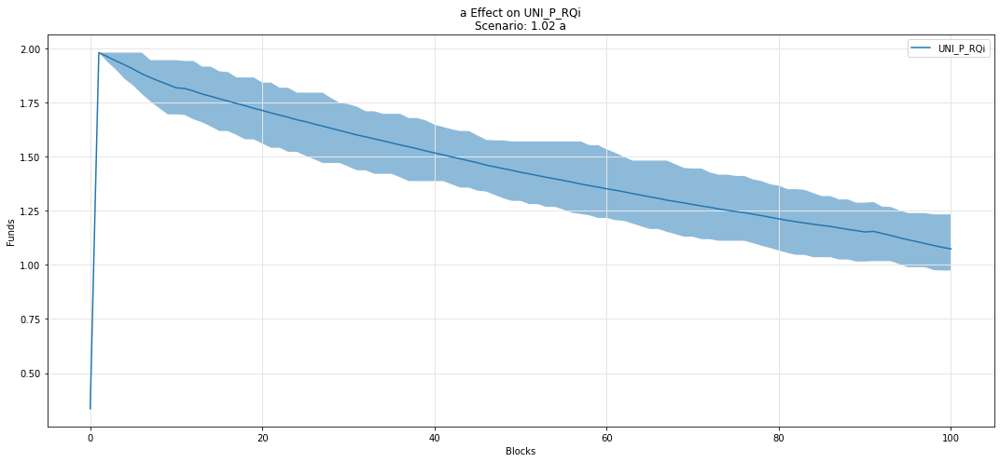

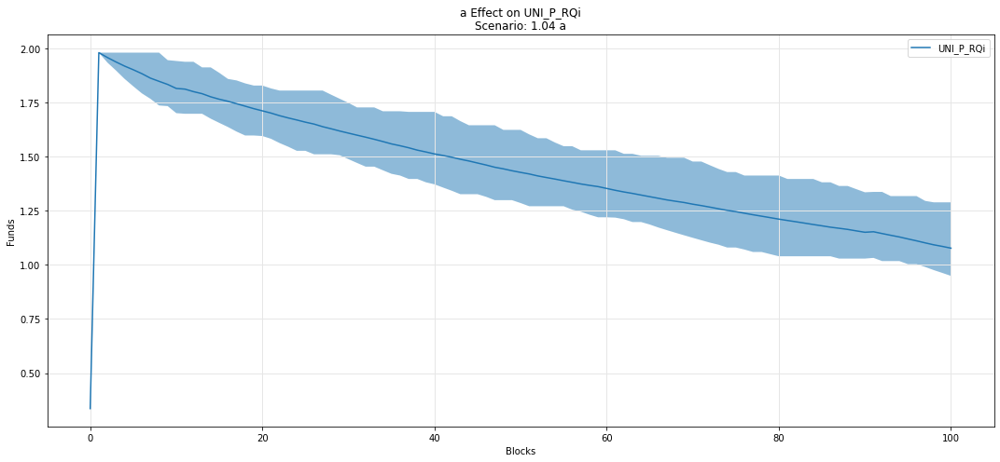

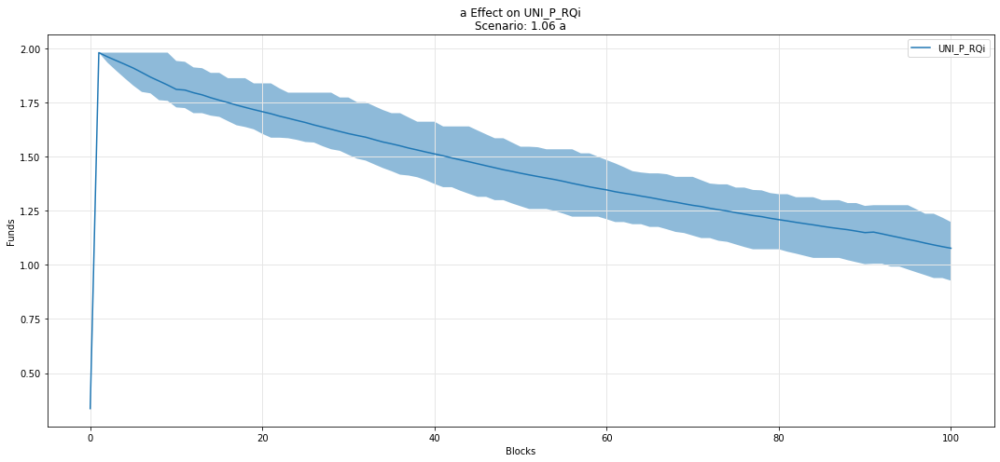

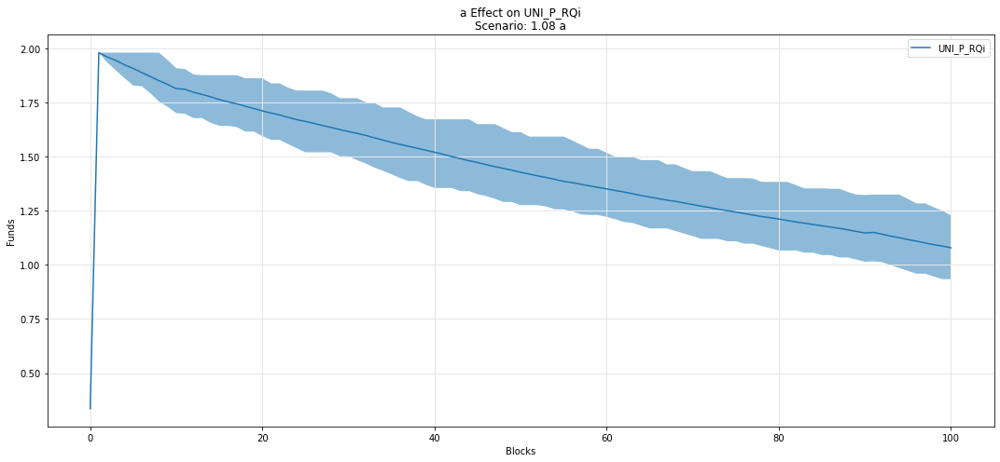

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

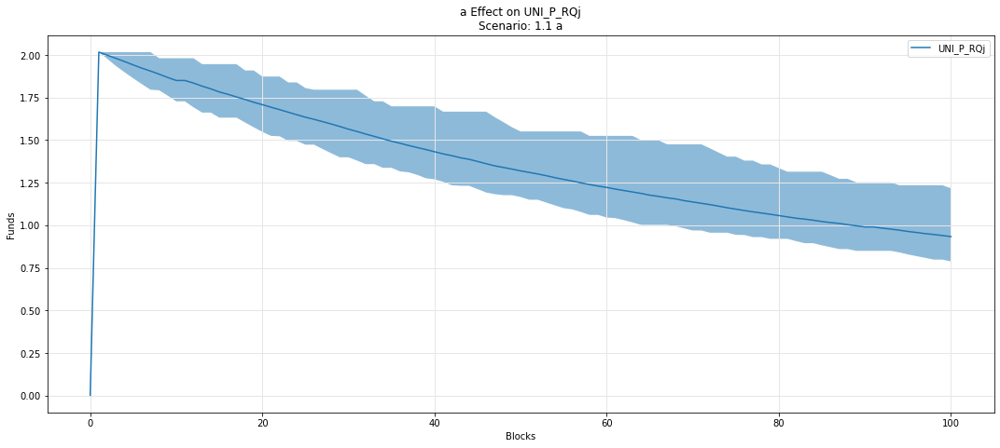

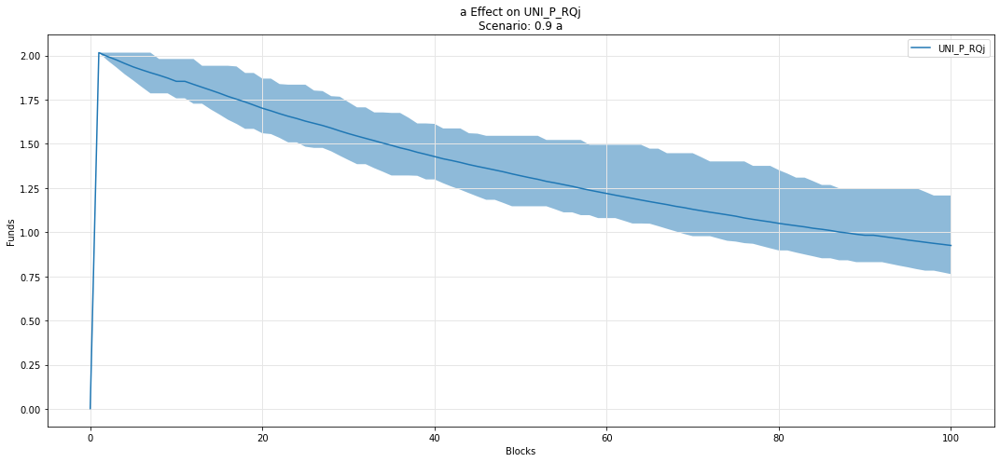

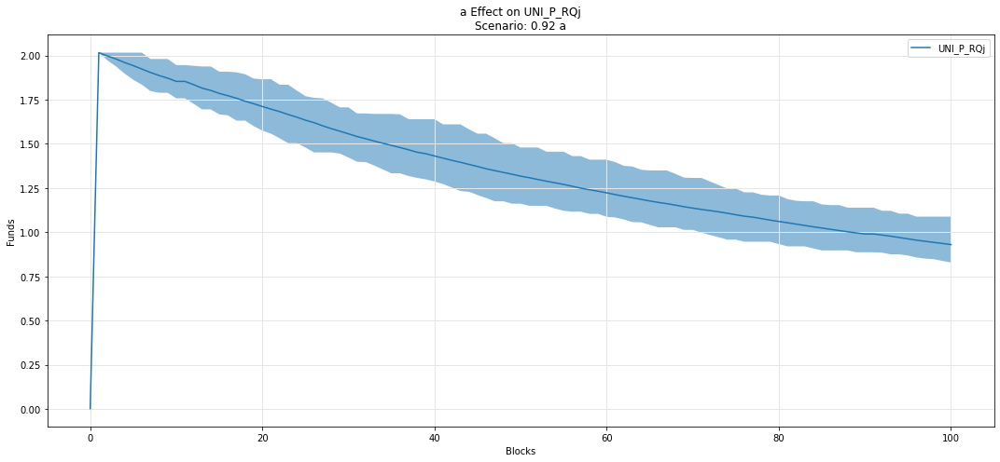

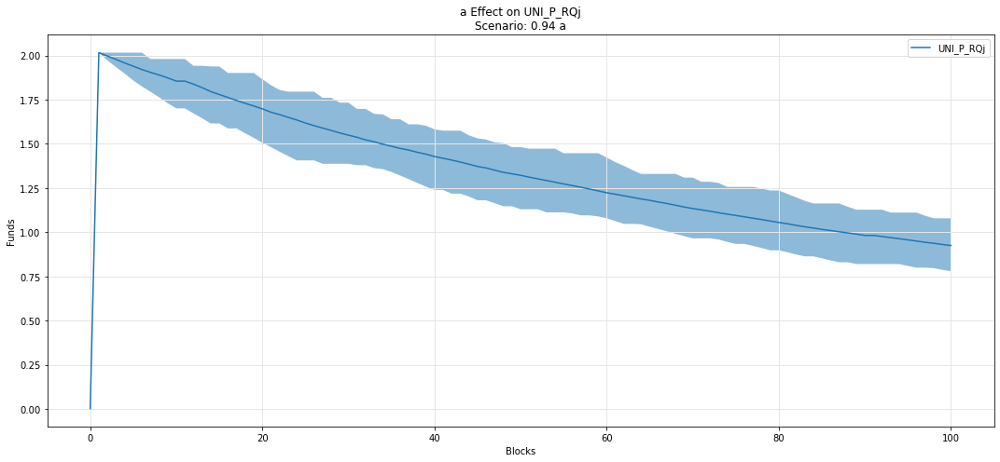

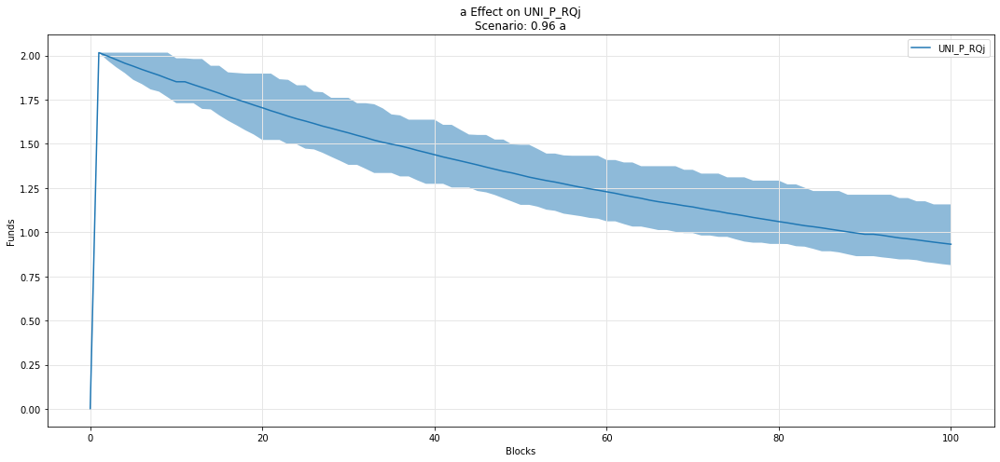

...

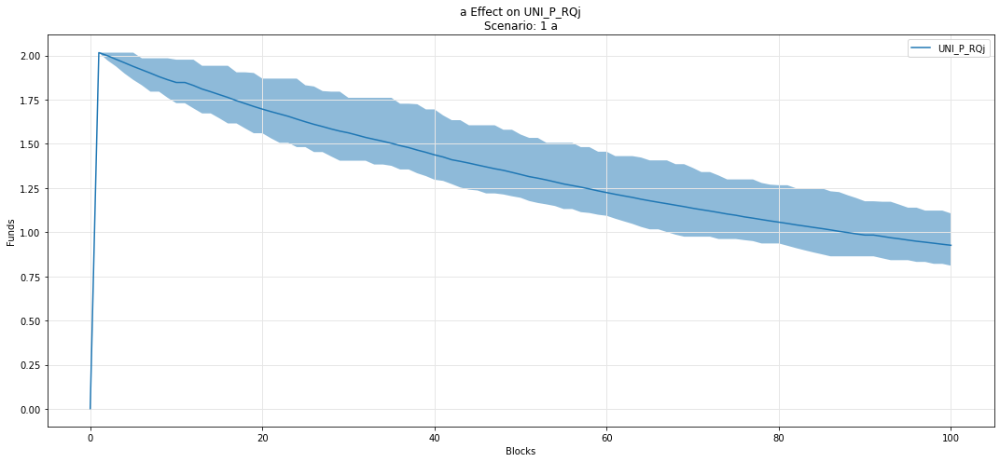

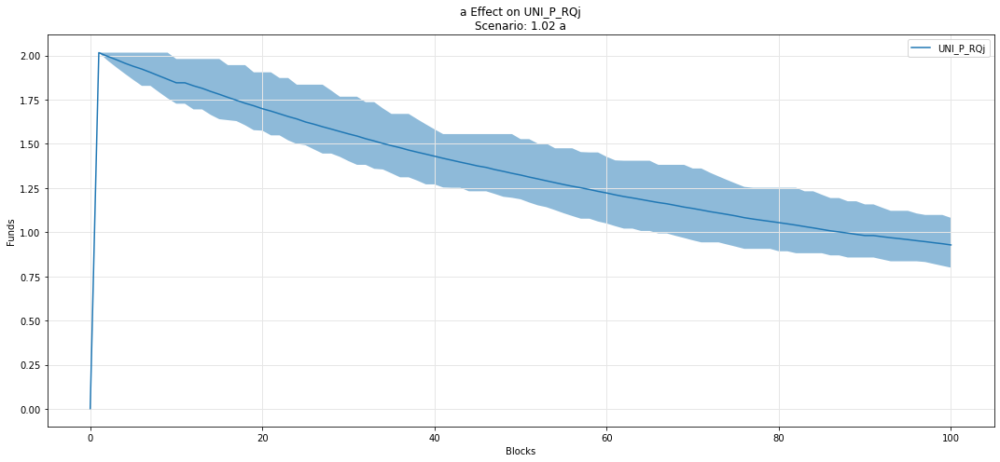

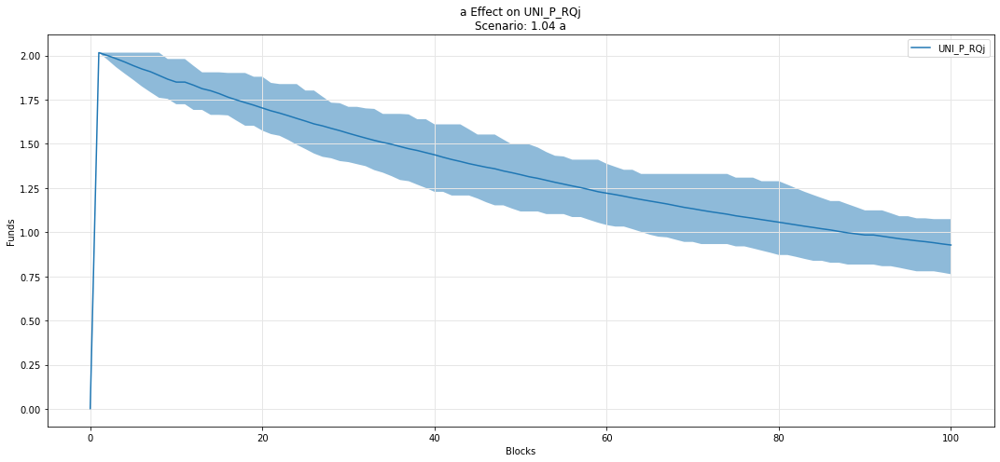

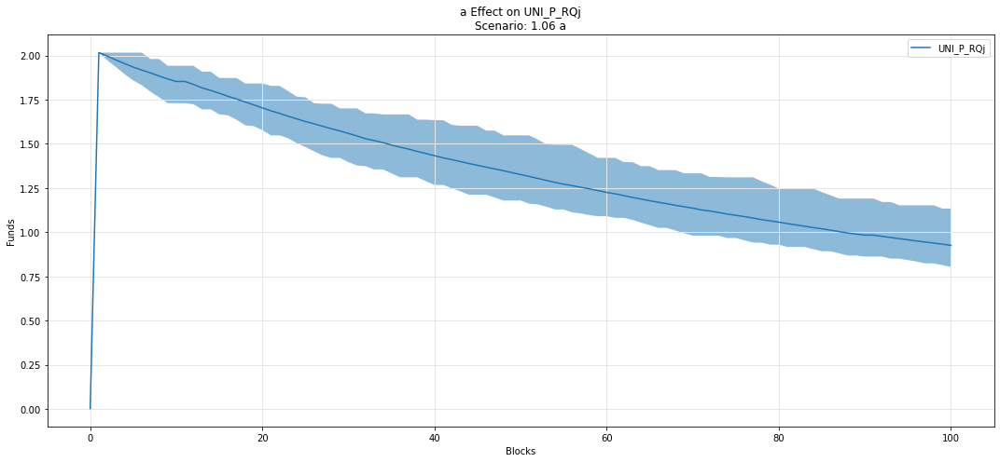

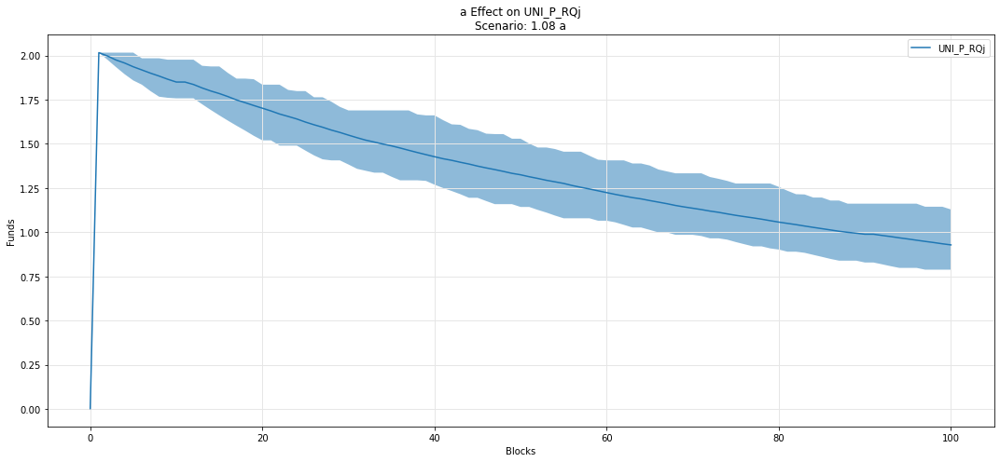

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

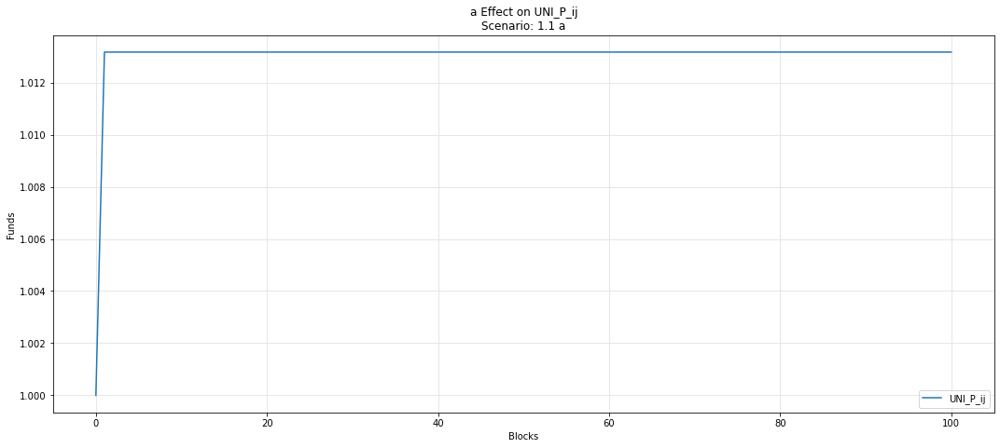

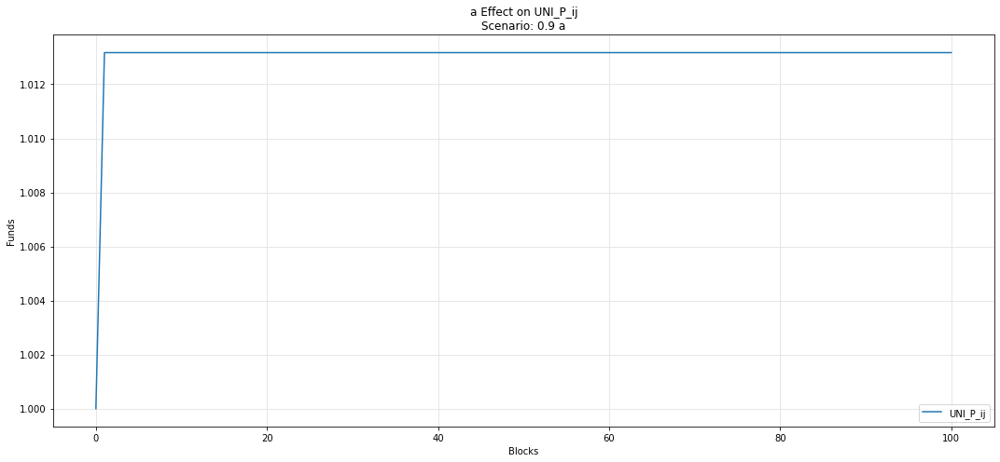

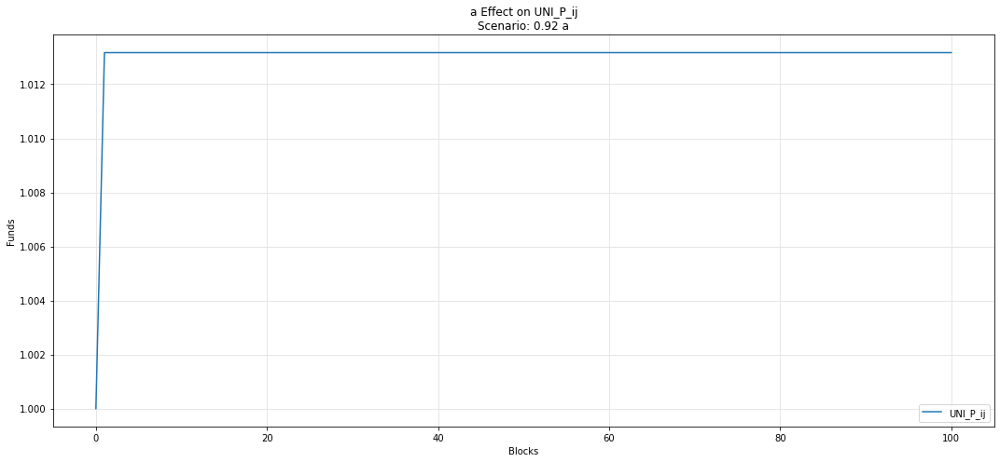

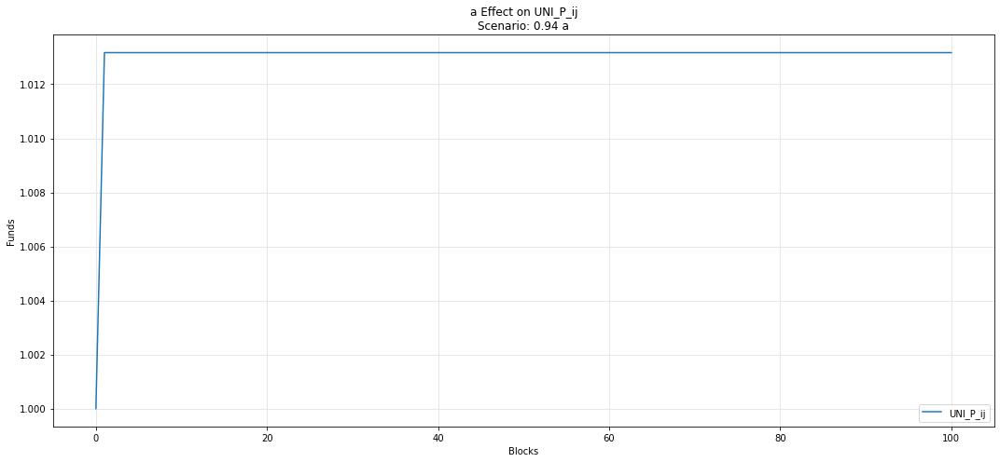

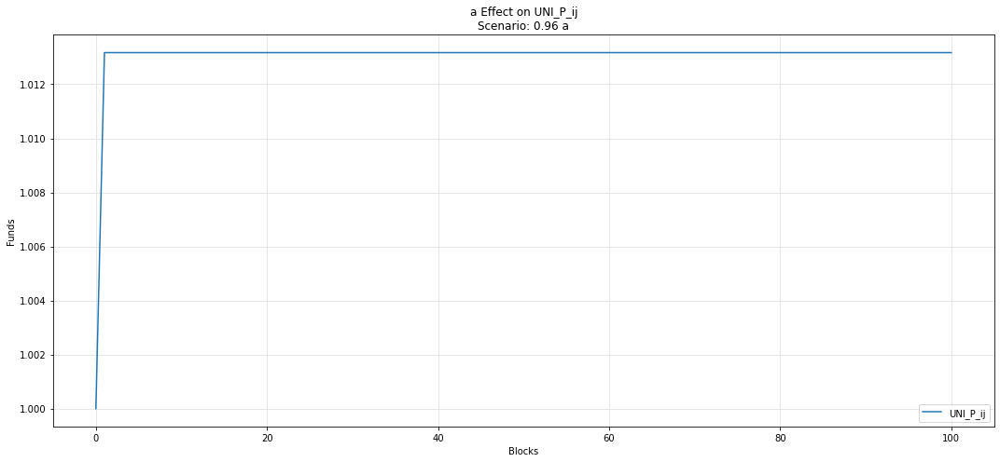

...

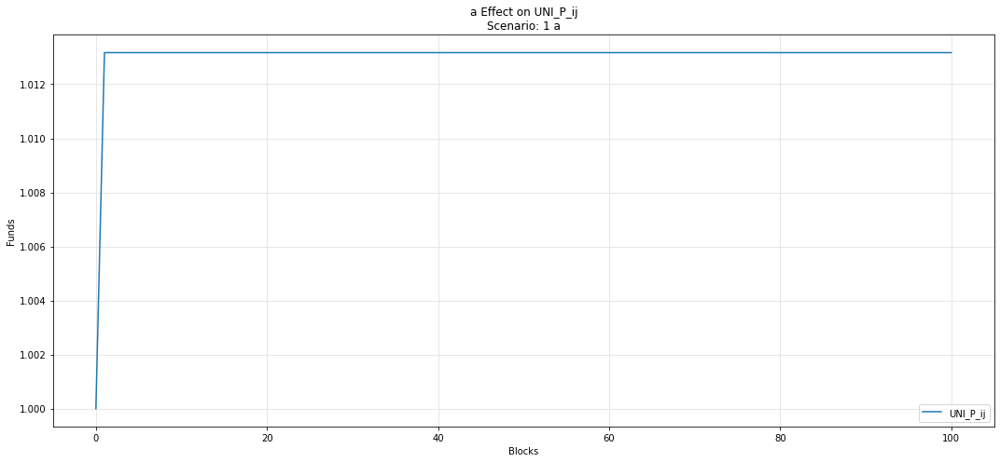

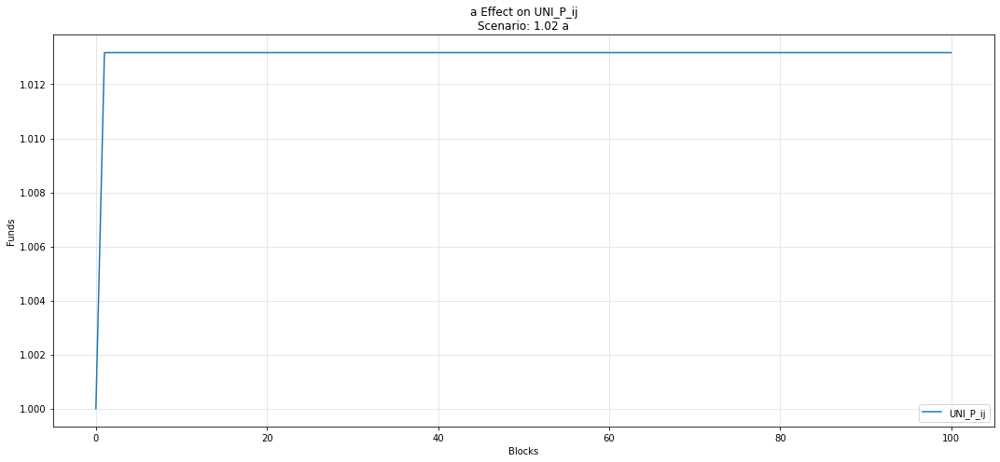

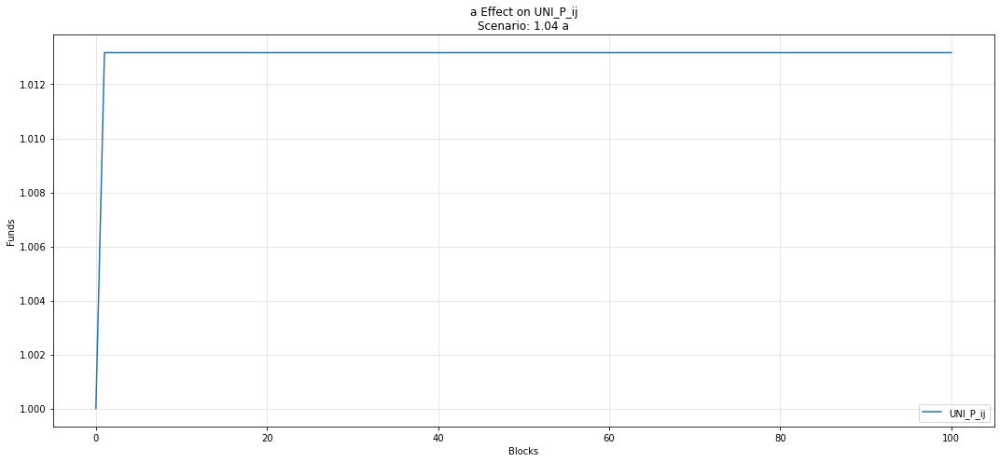

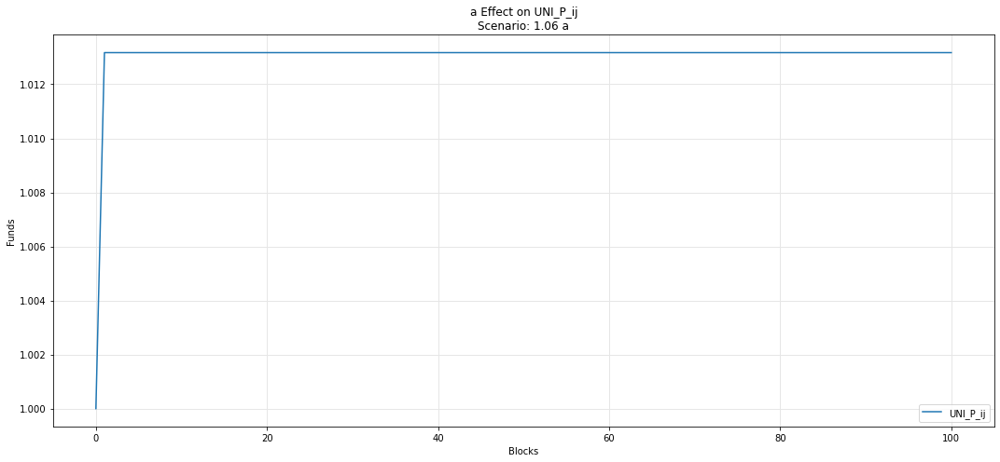

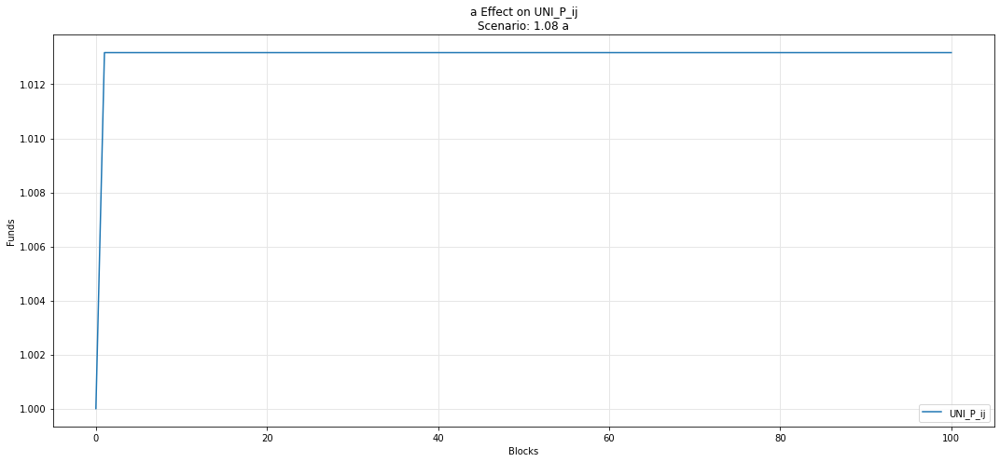

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

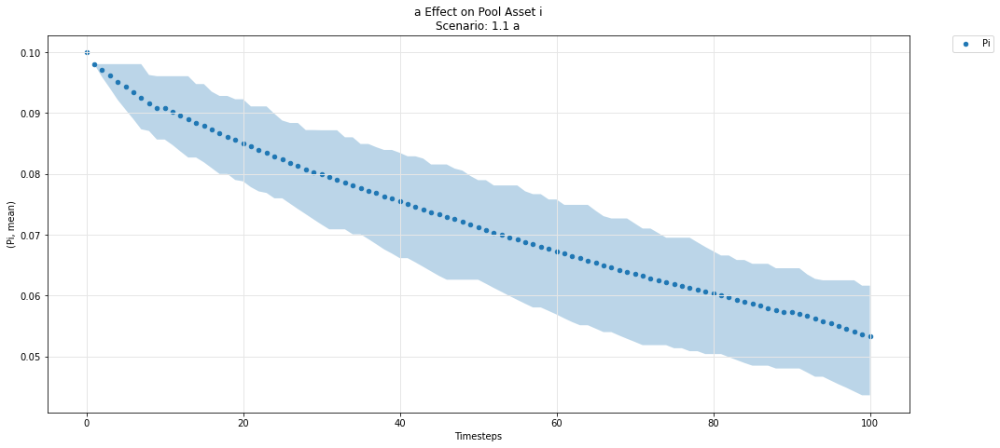

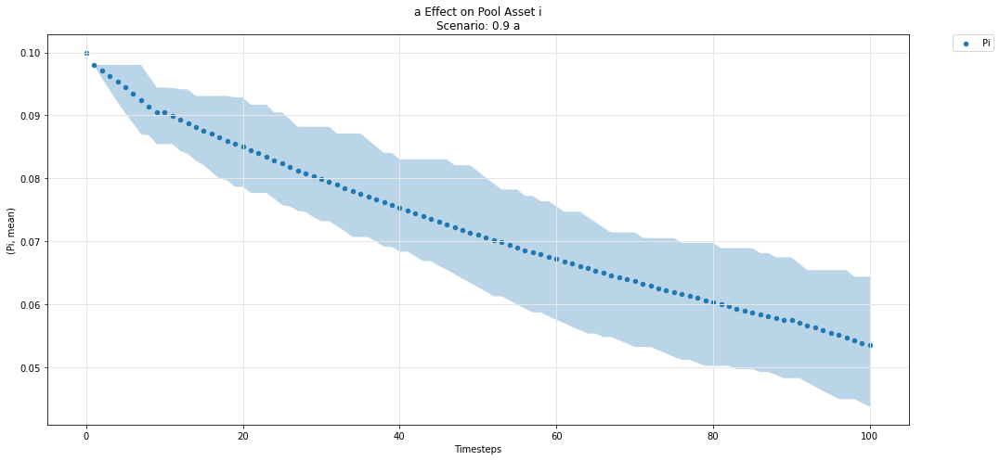

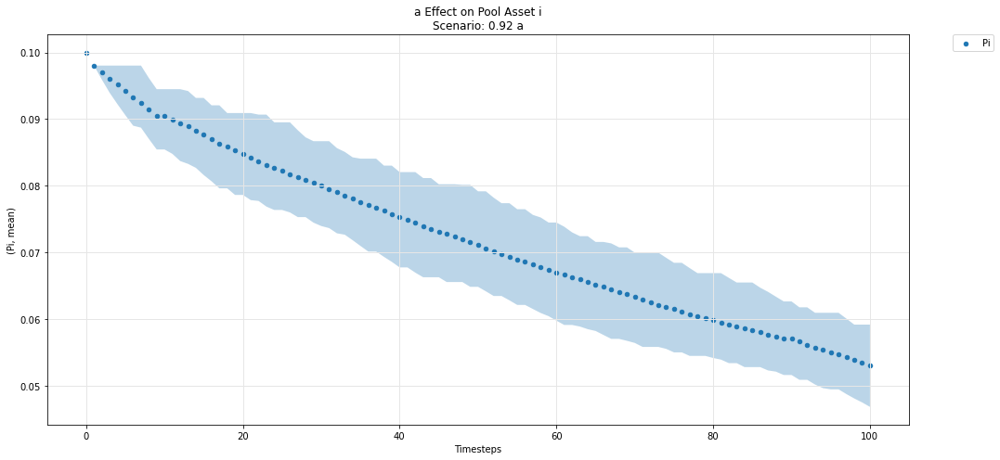

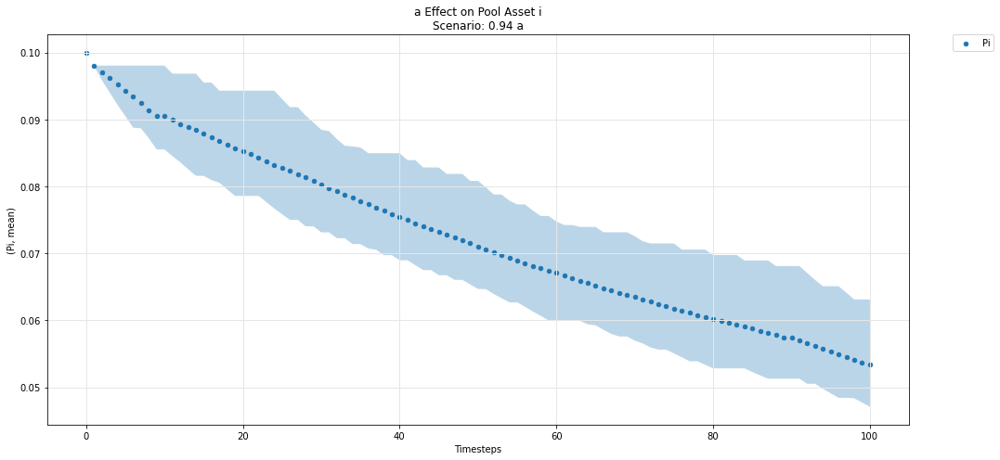

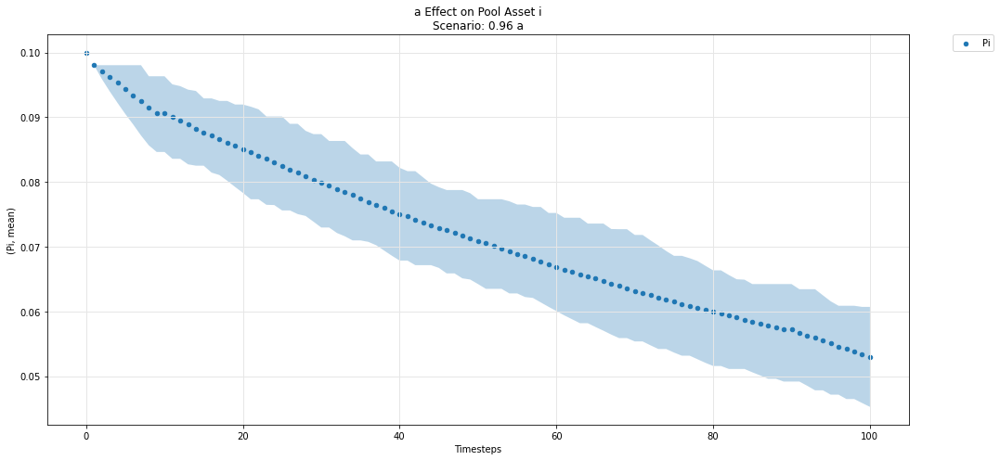

...

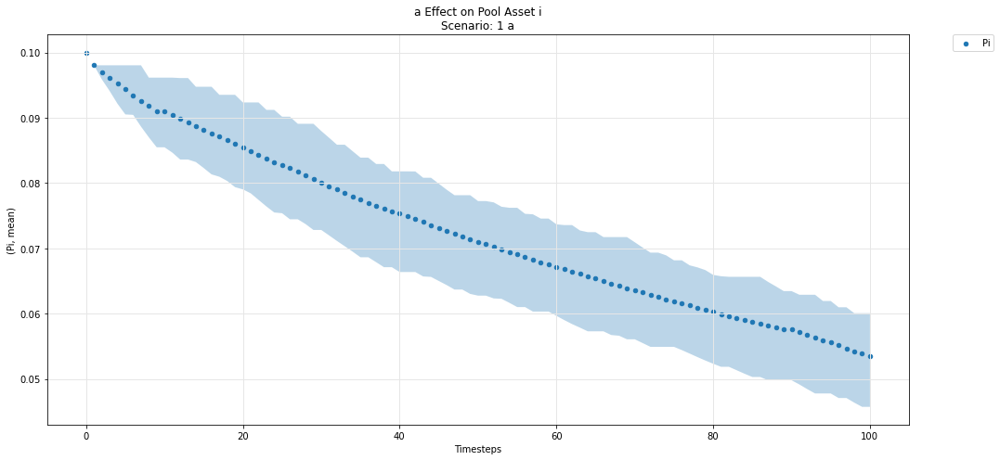

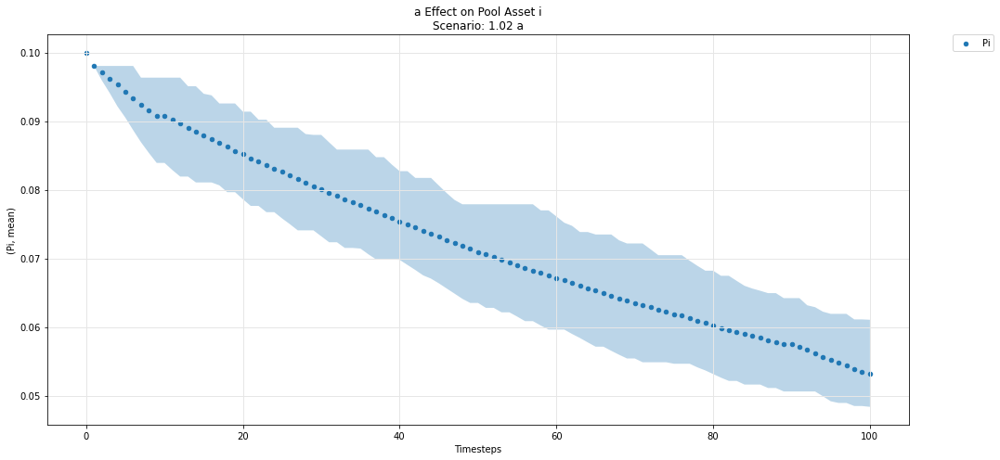

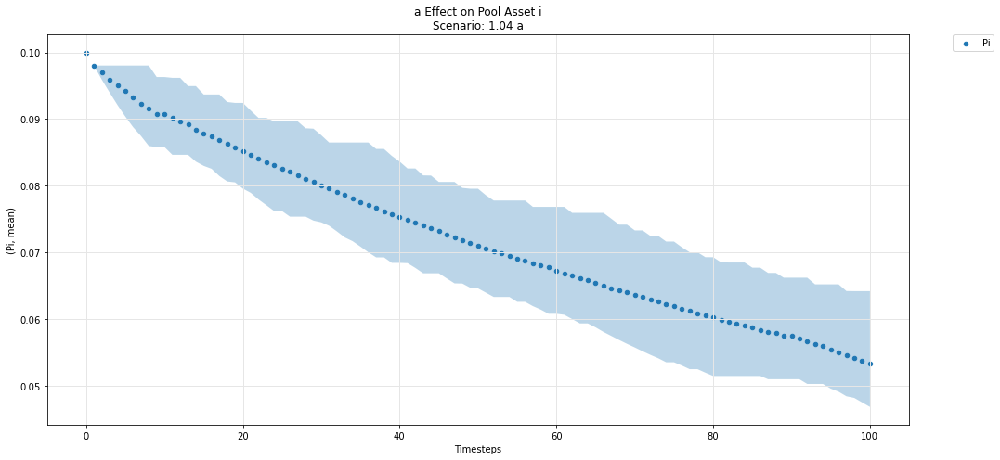

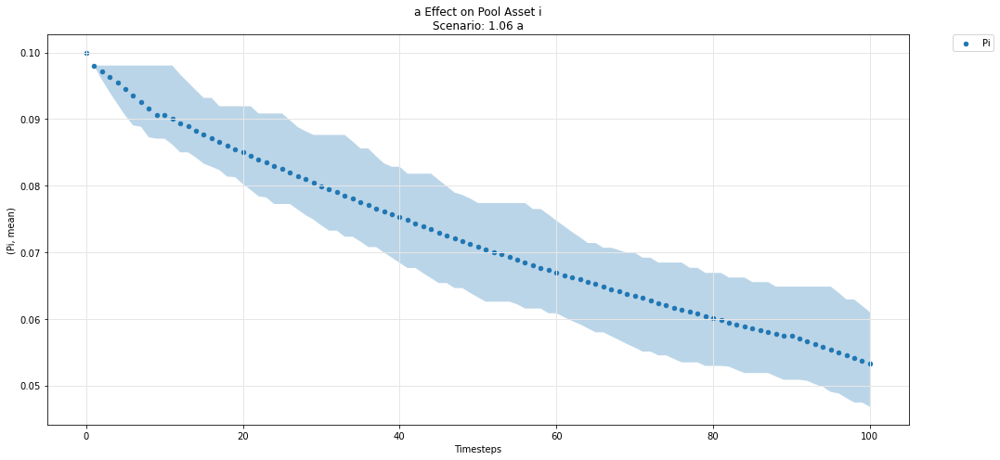

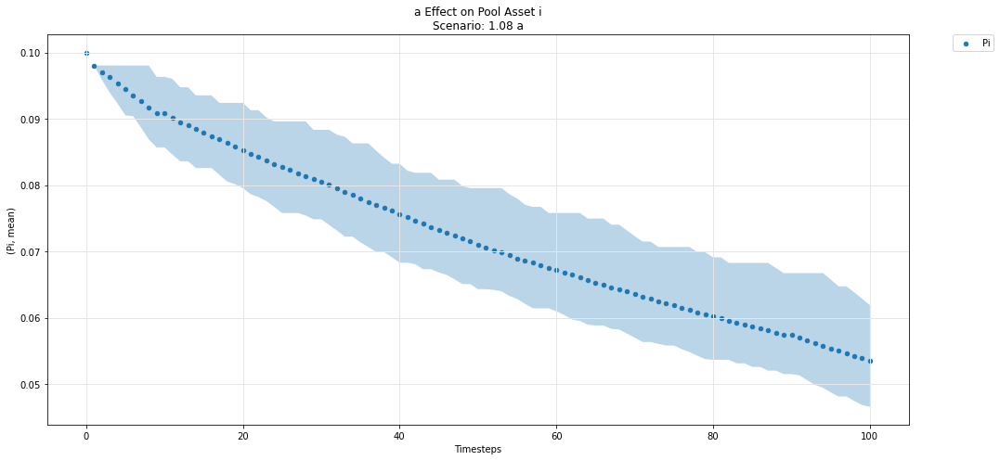

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

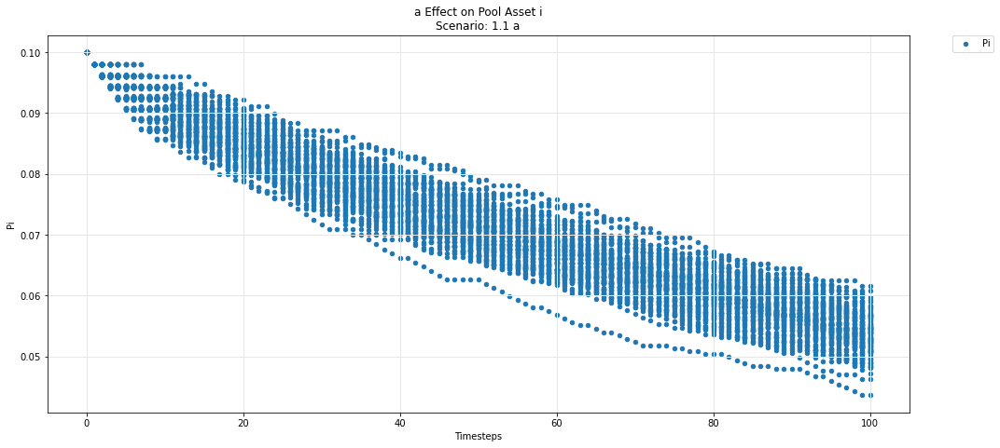

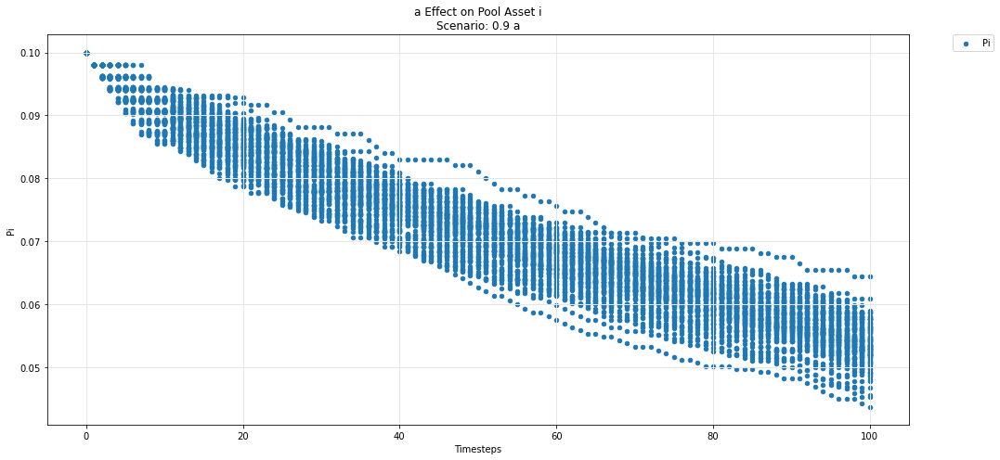

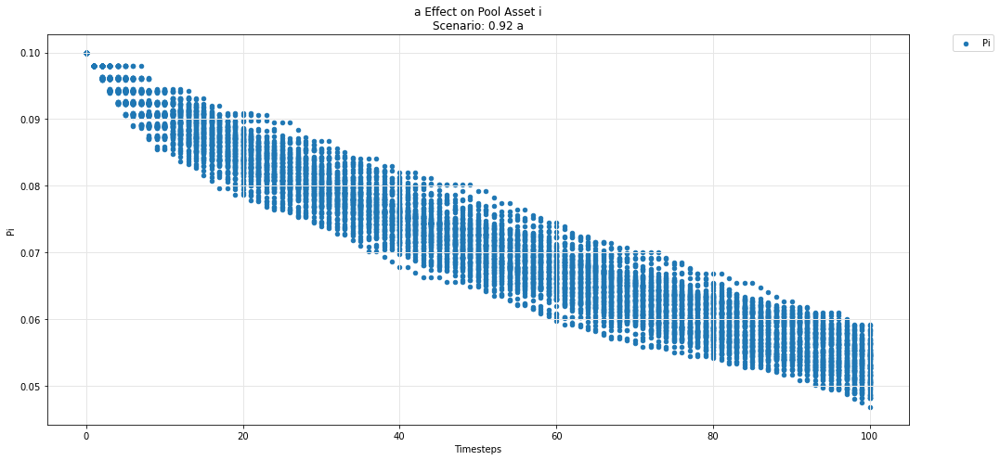

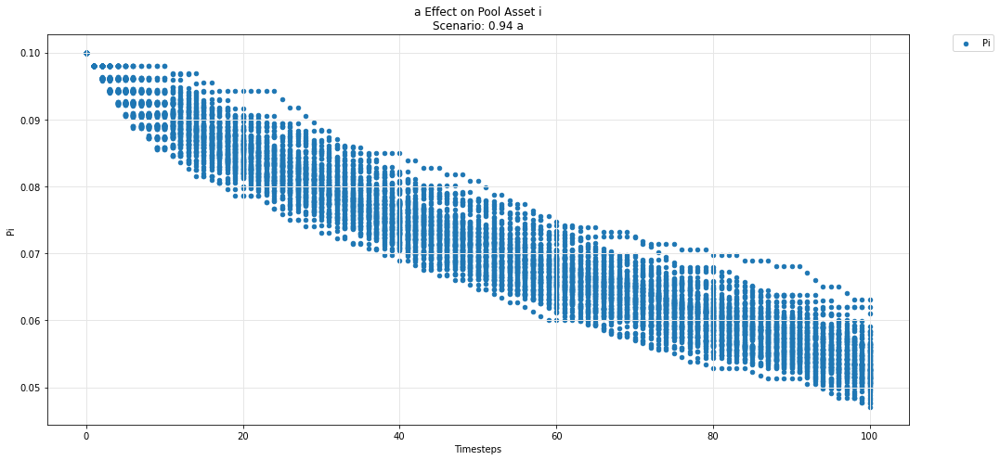

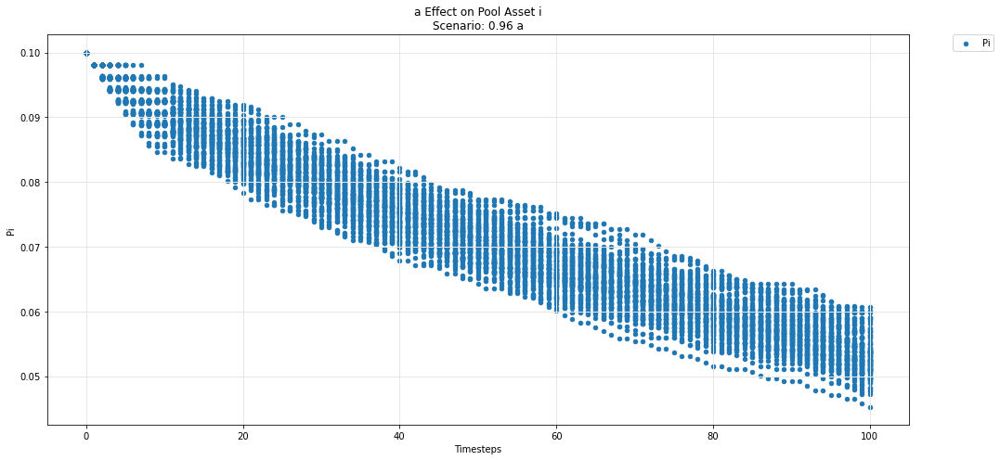

...

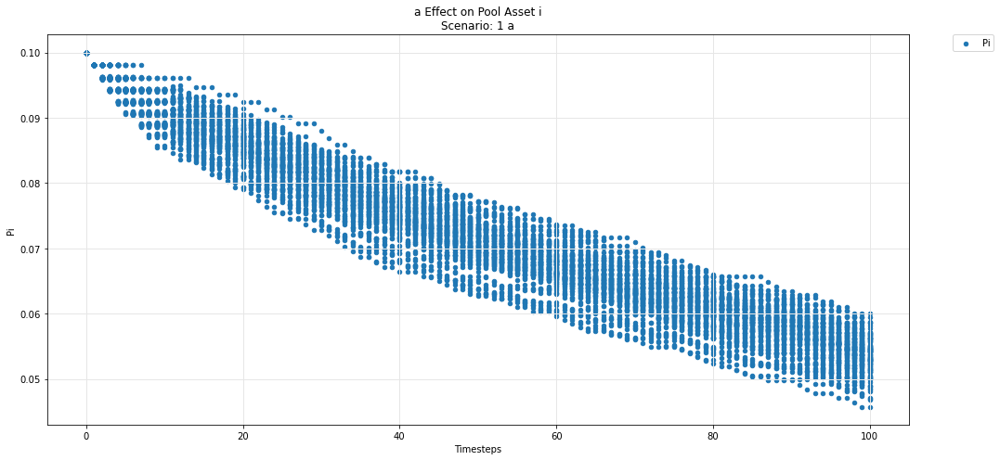

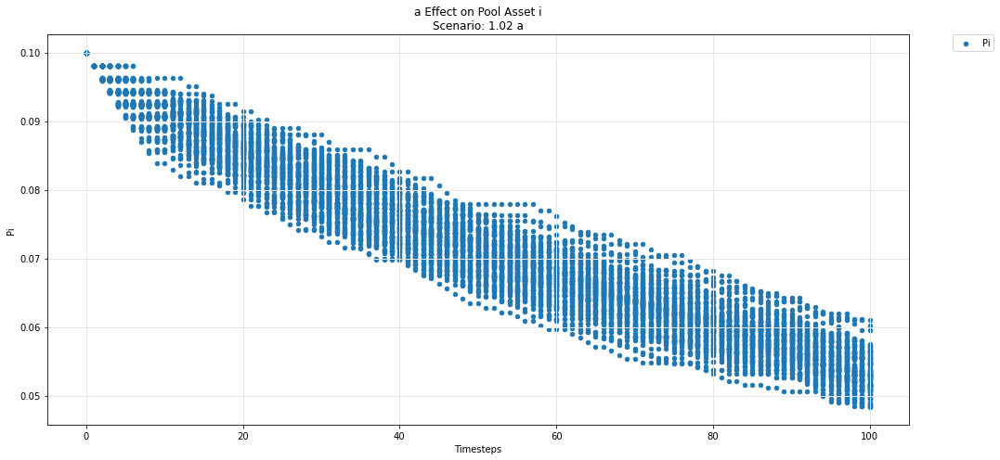

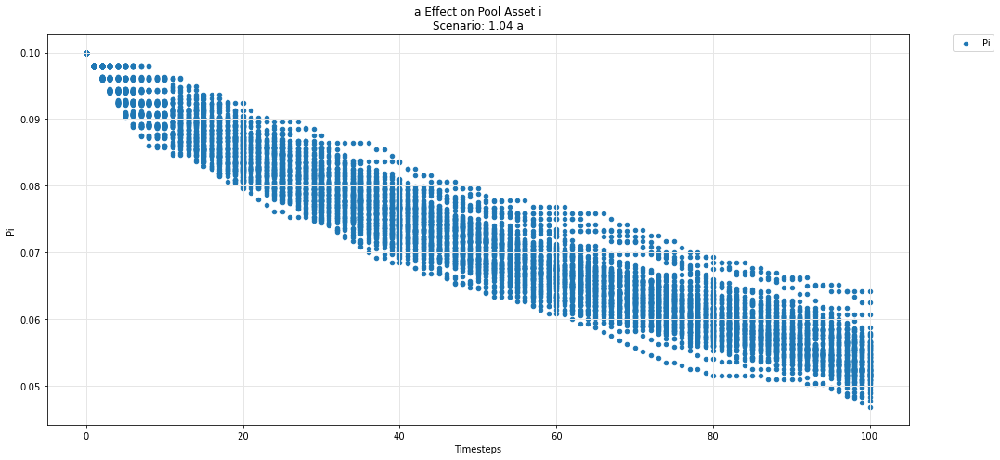

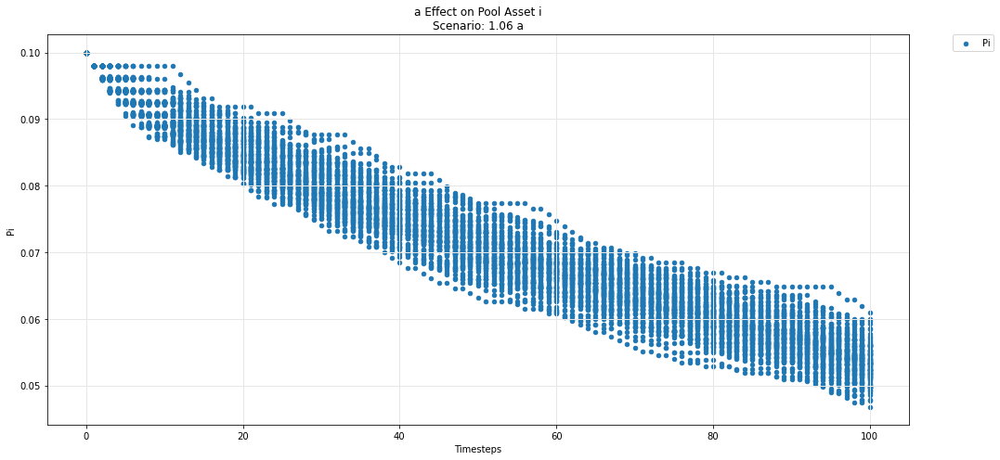

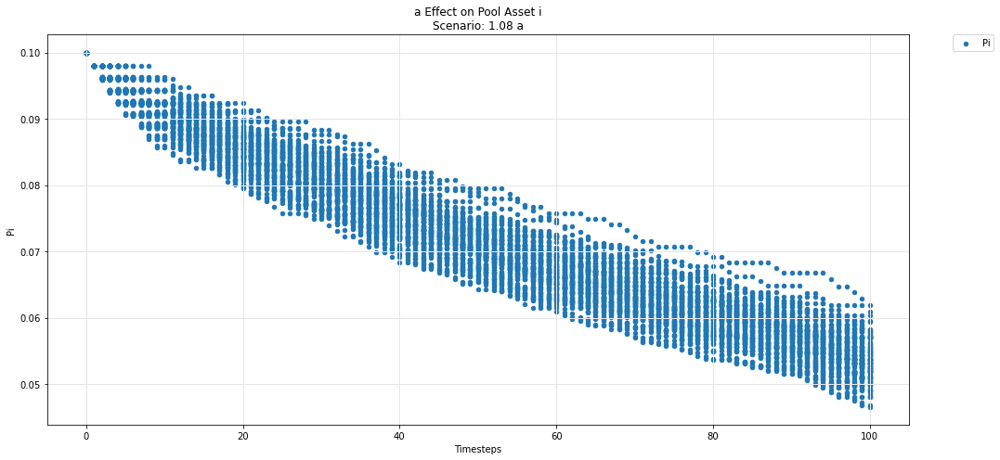

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

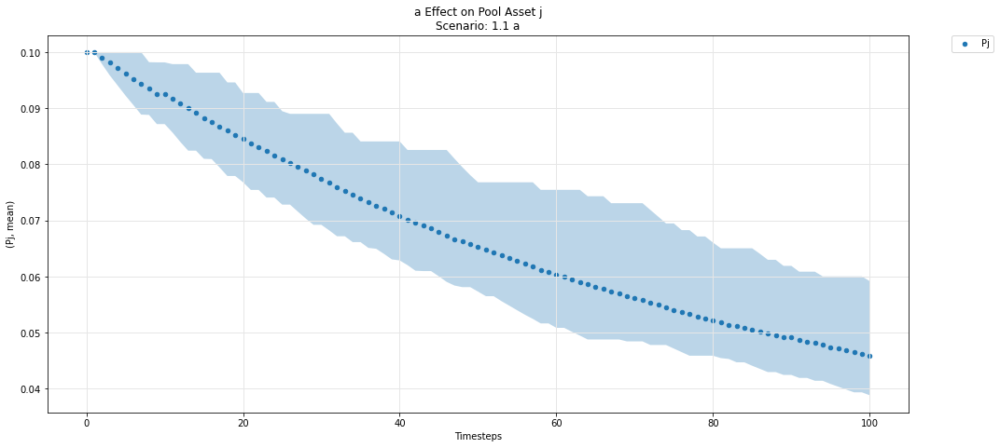

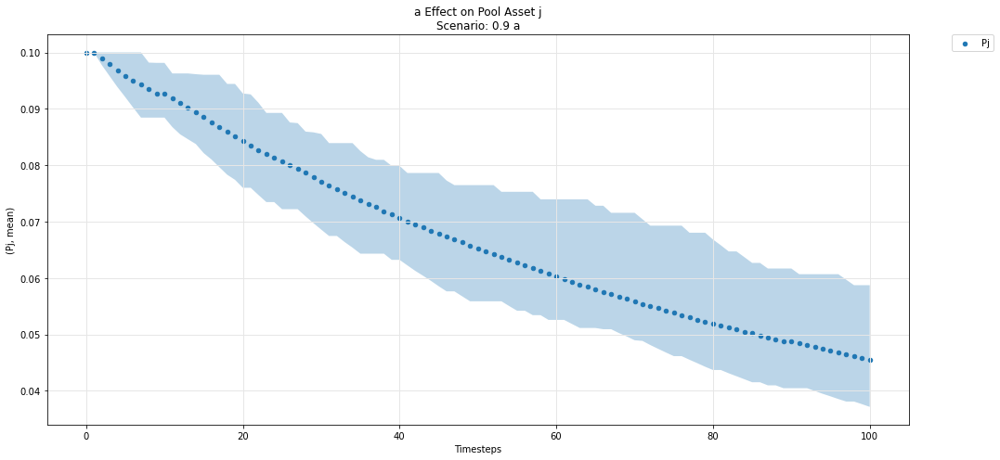

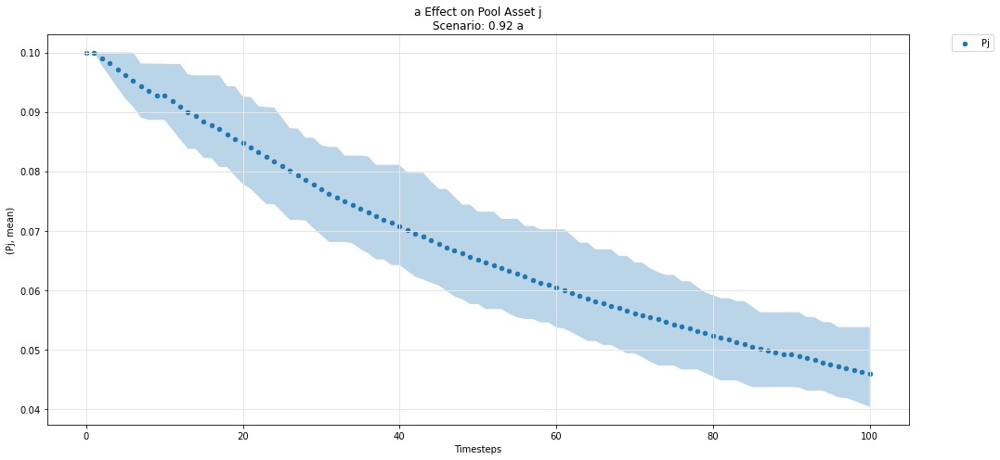

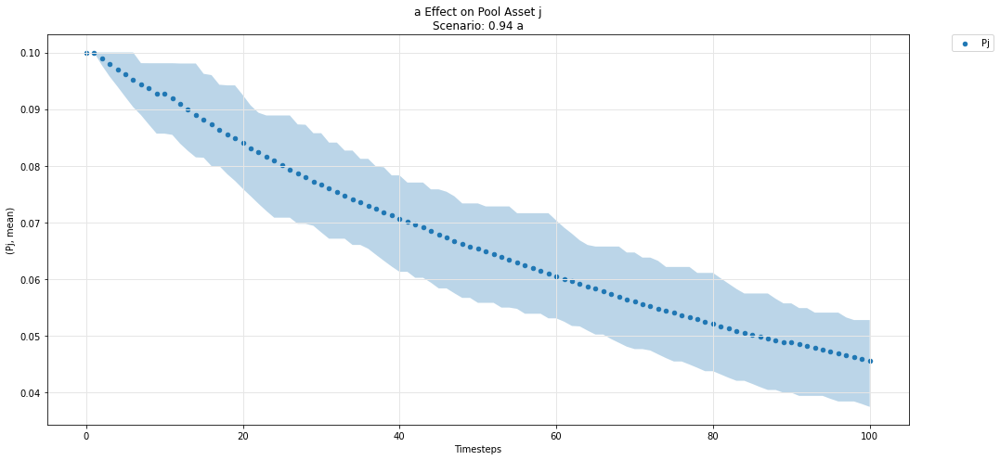

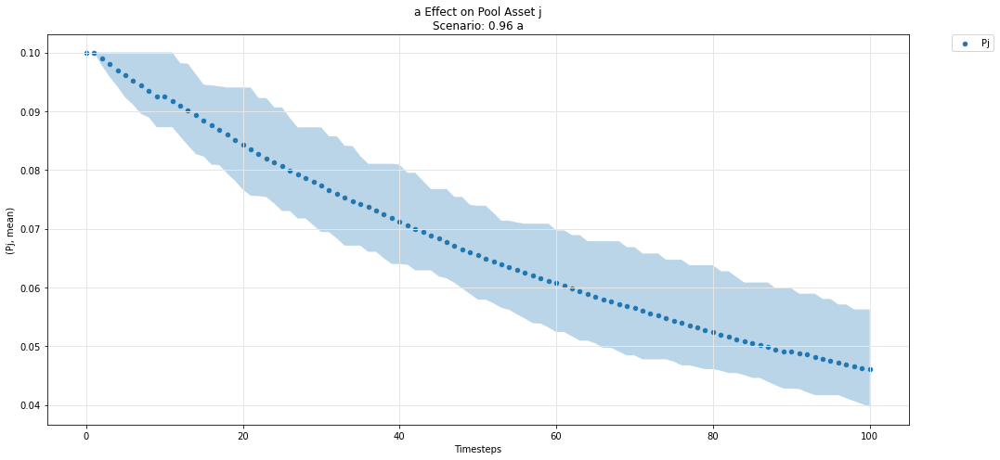

...

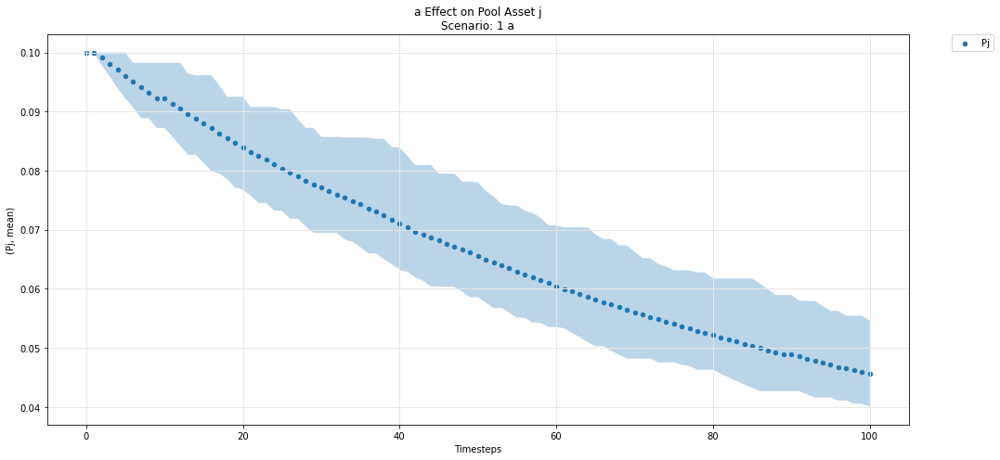

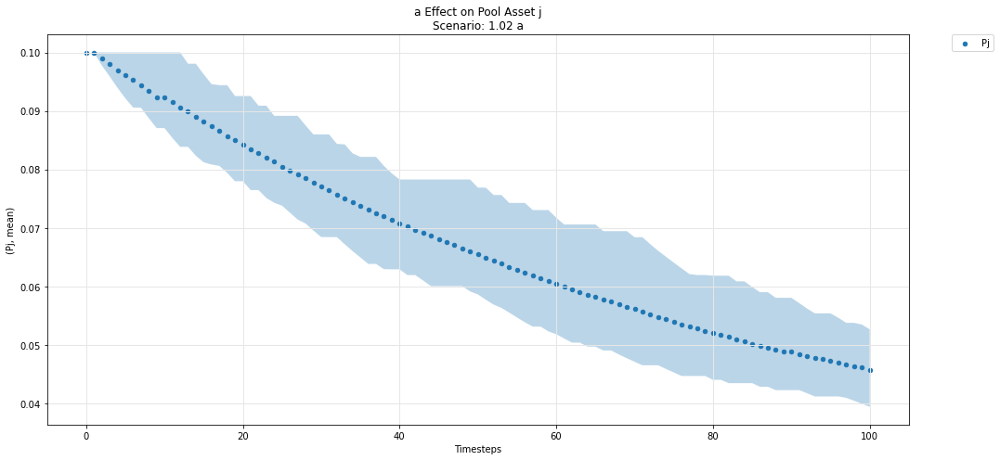

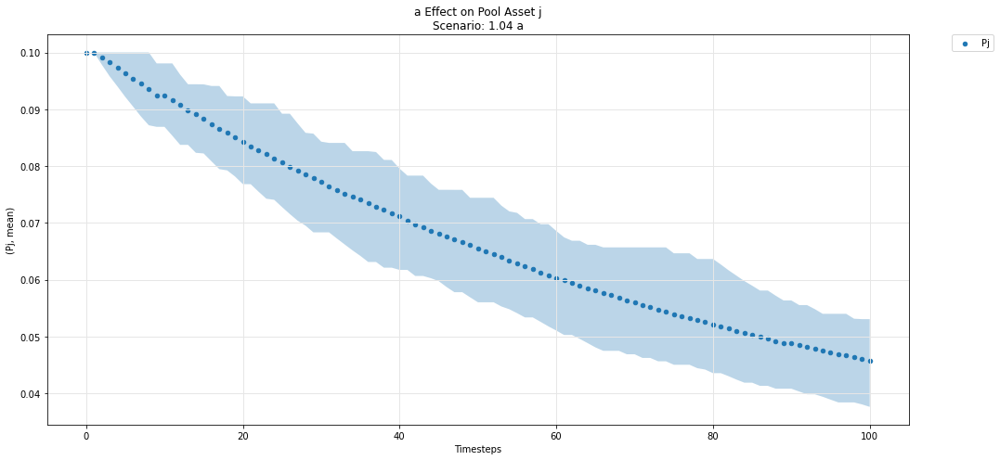

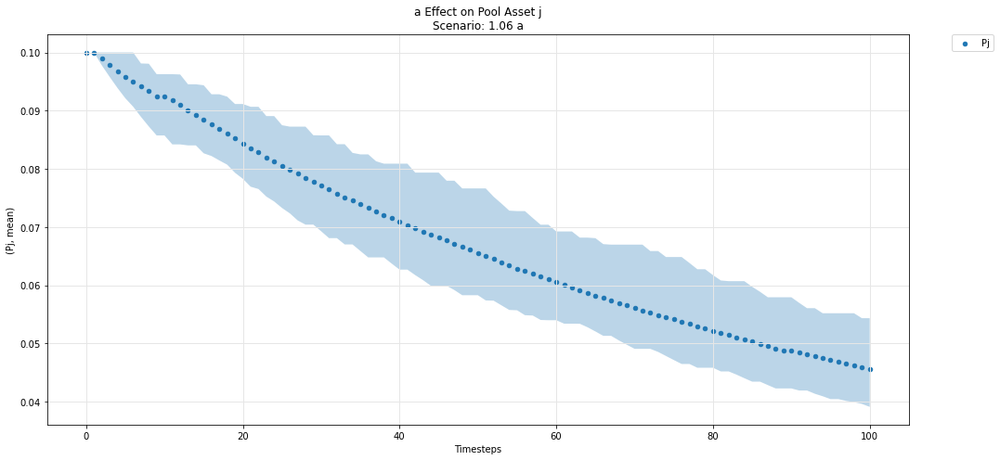

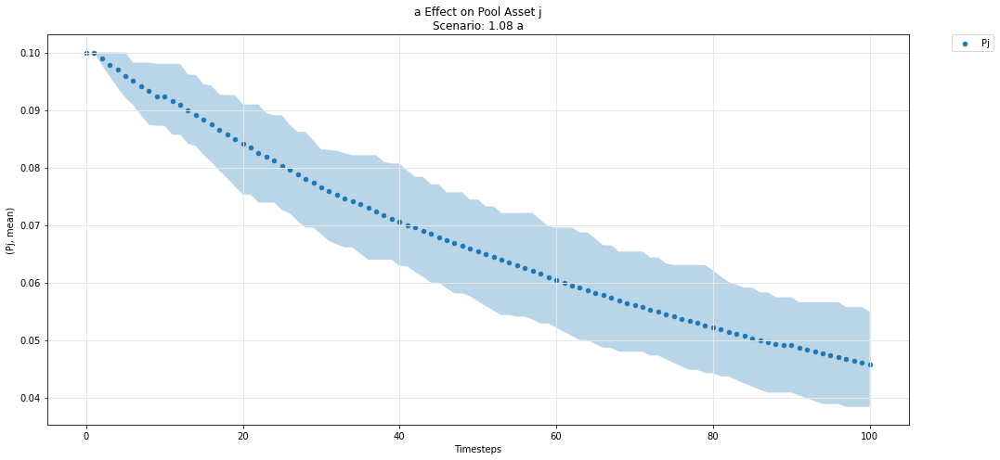

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

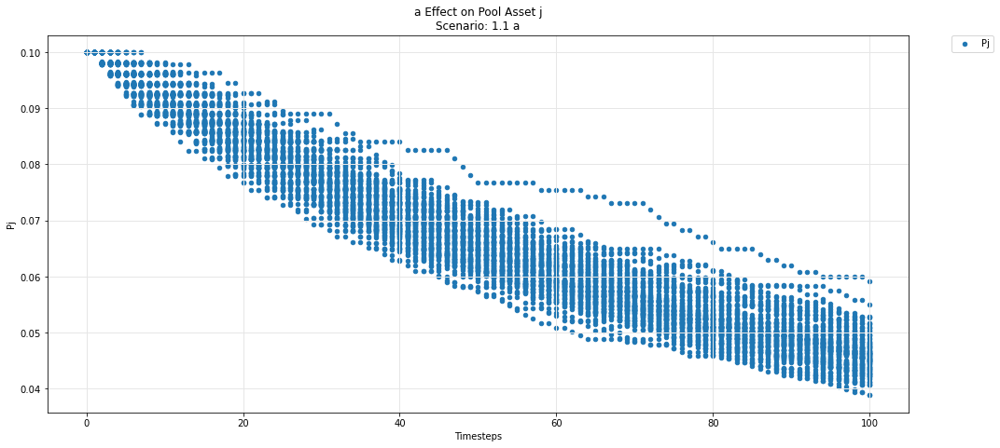

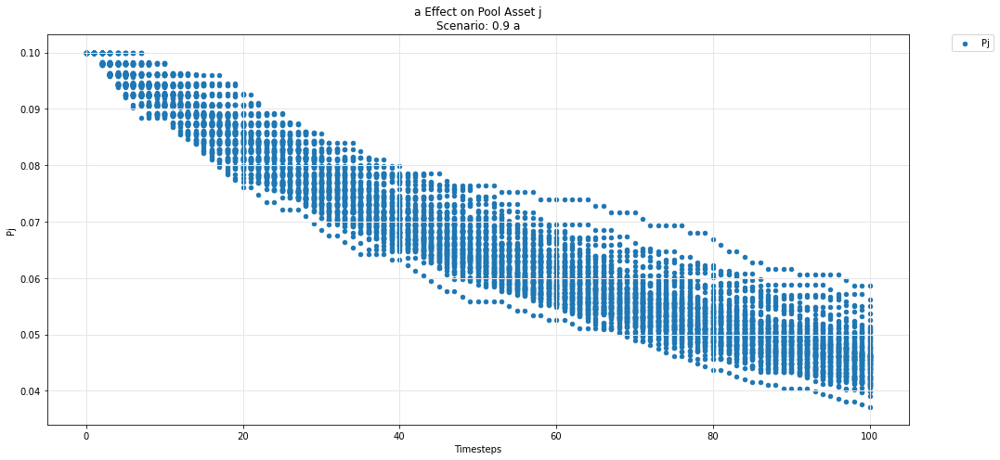

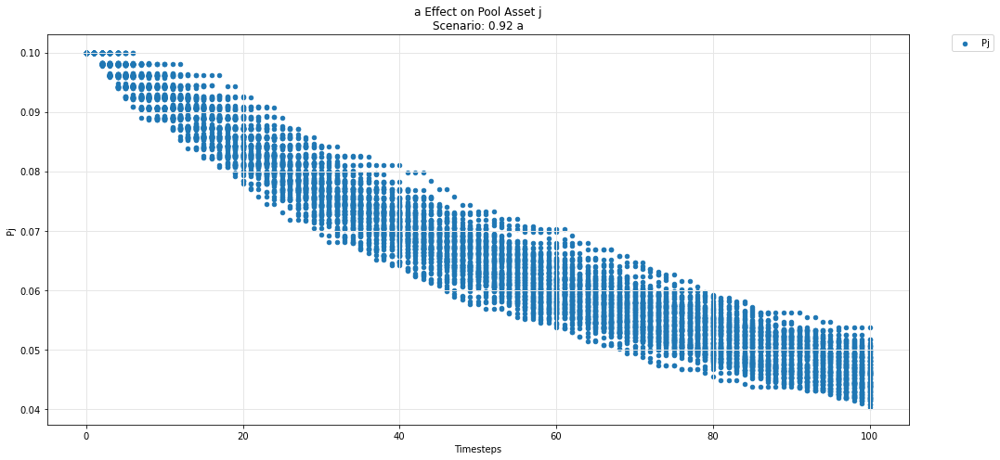

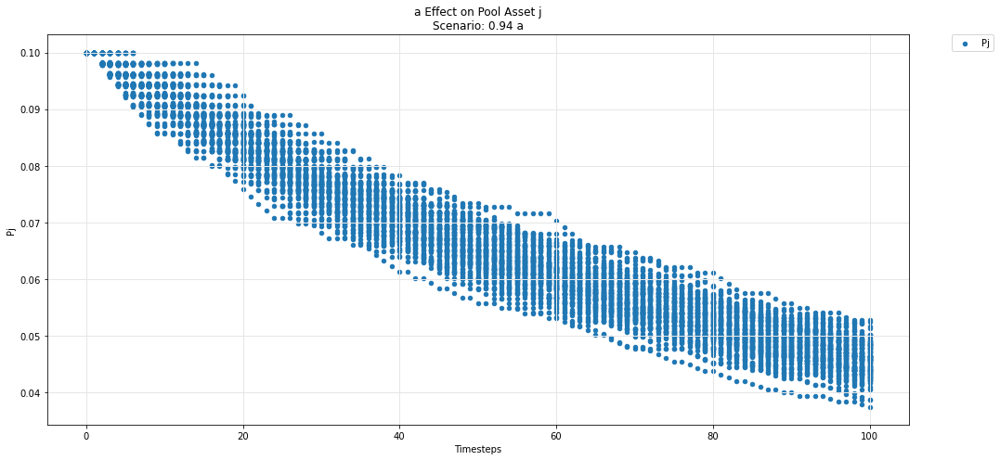

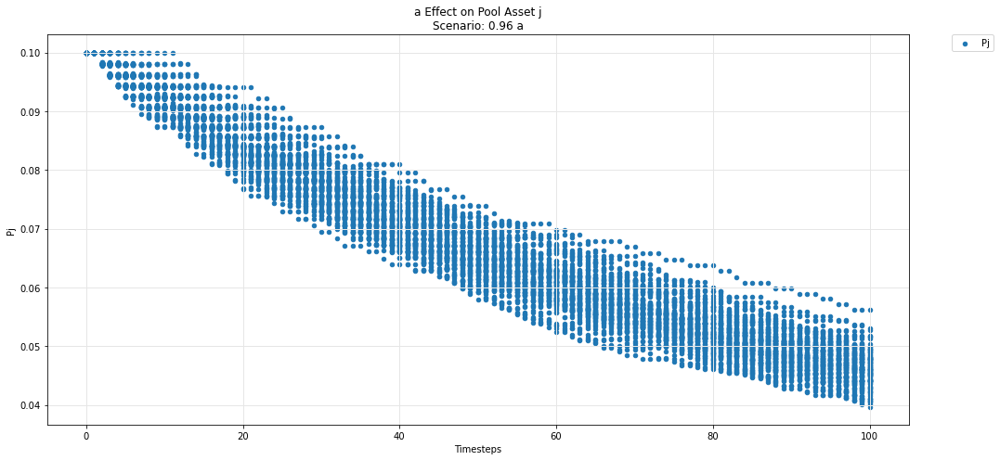

...

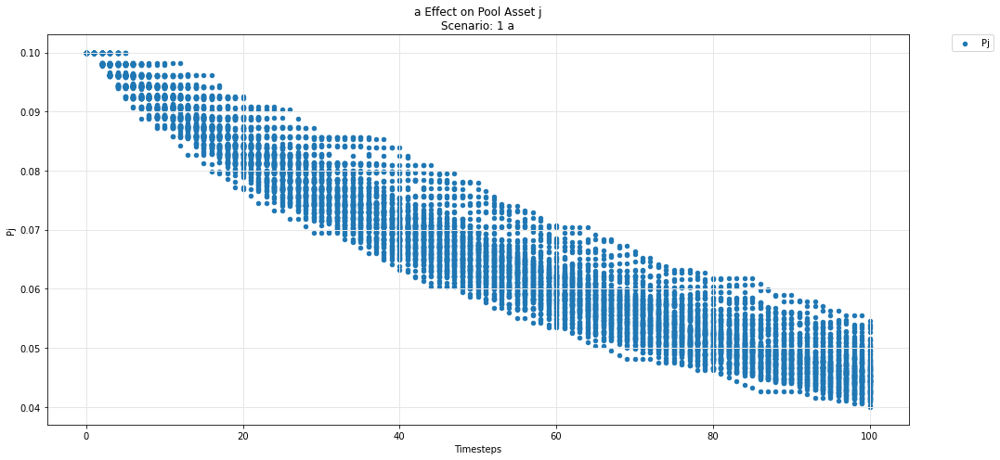

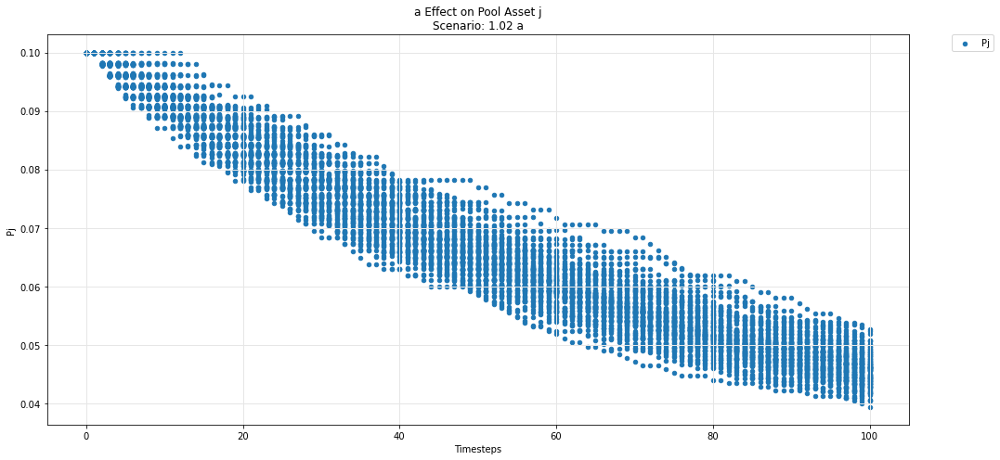

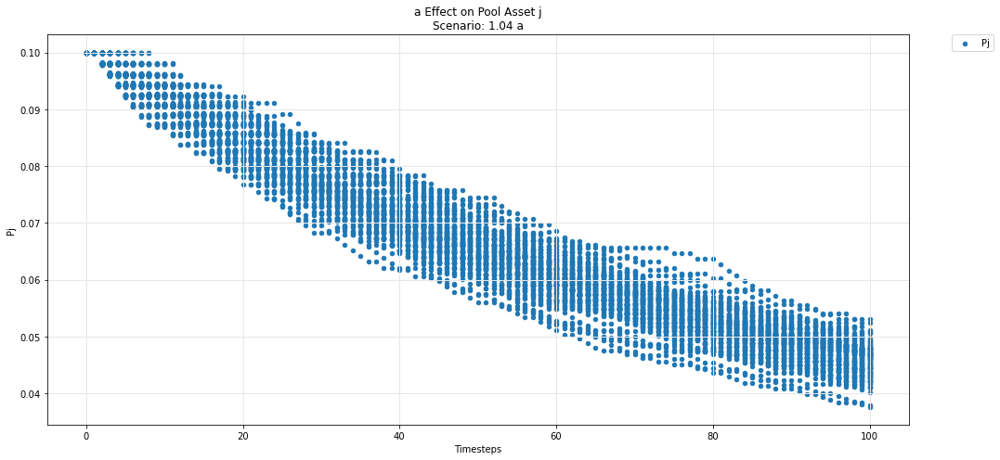

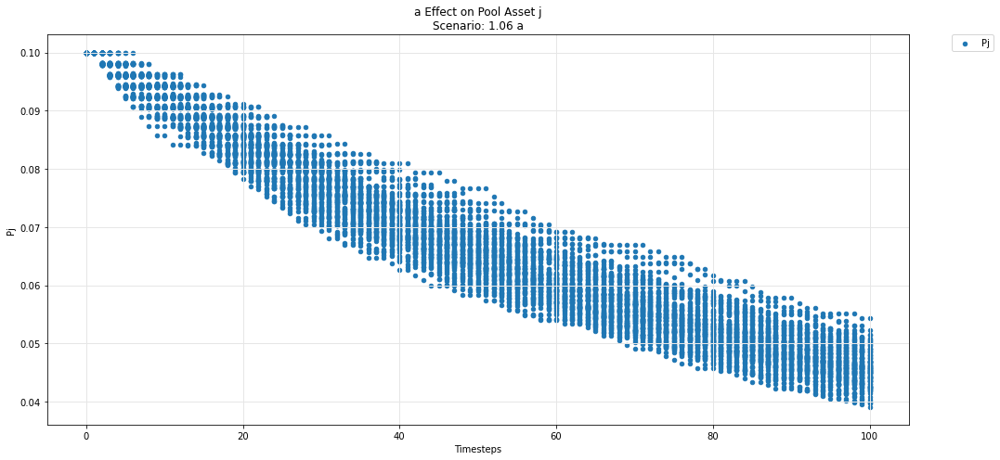

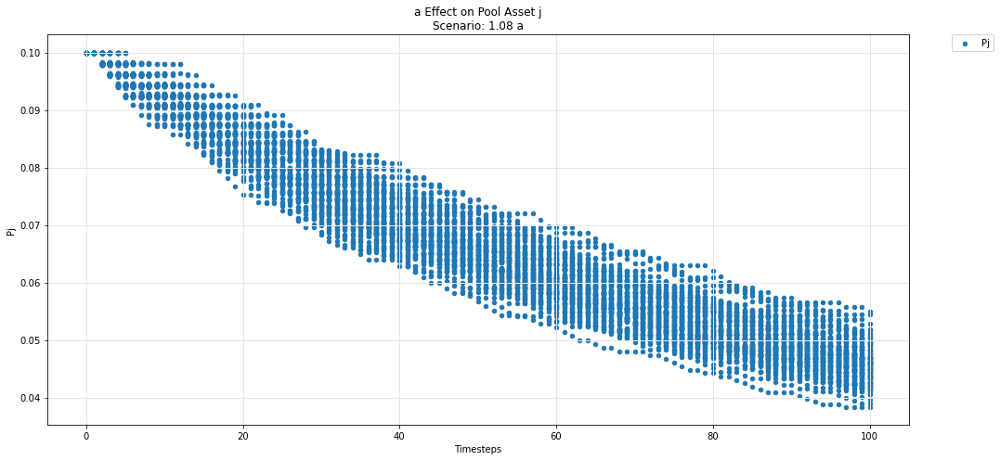

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

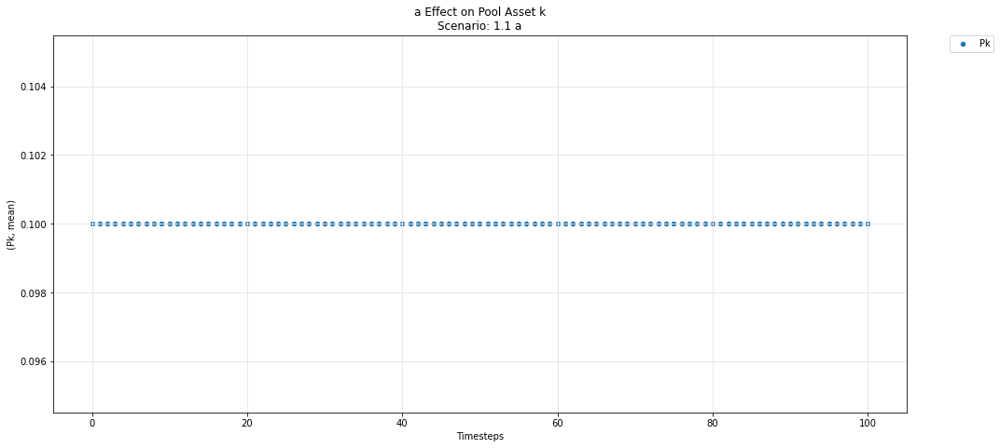

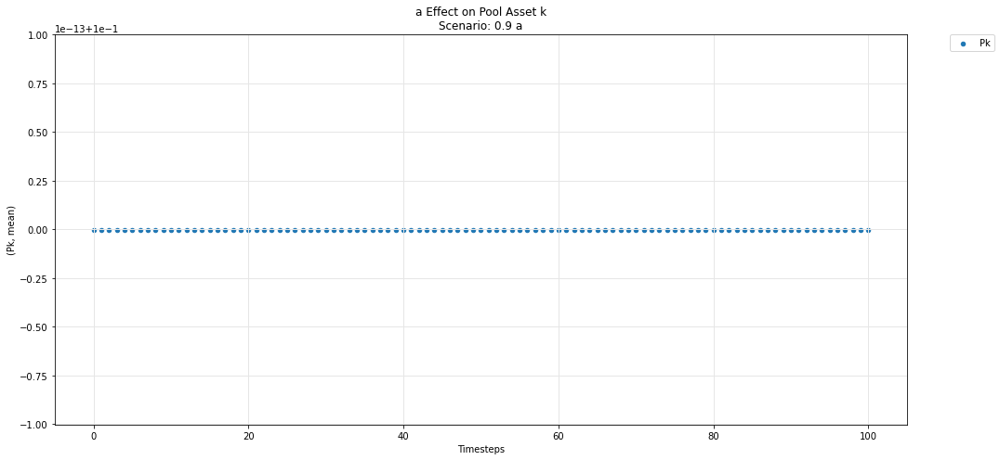

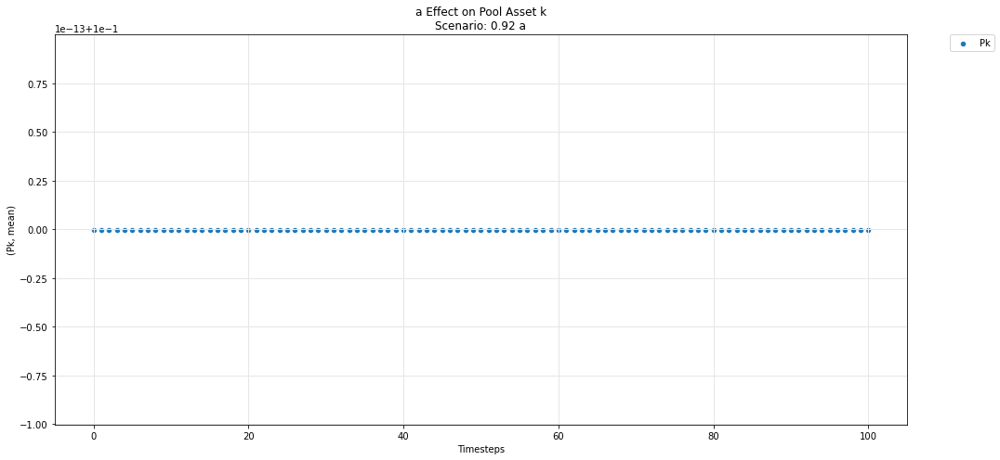

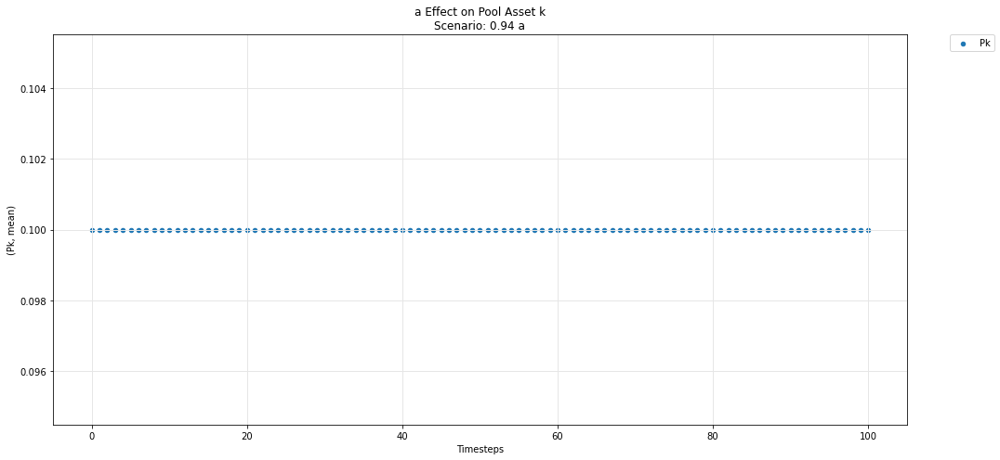

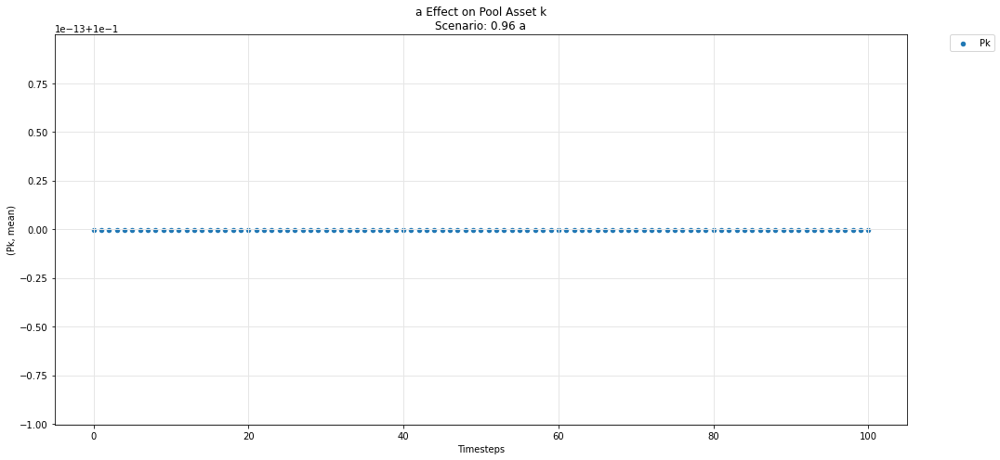

...

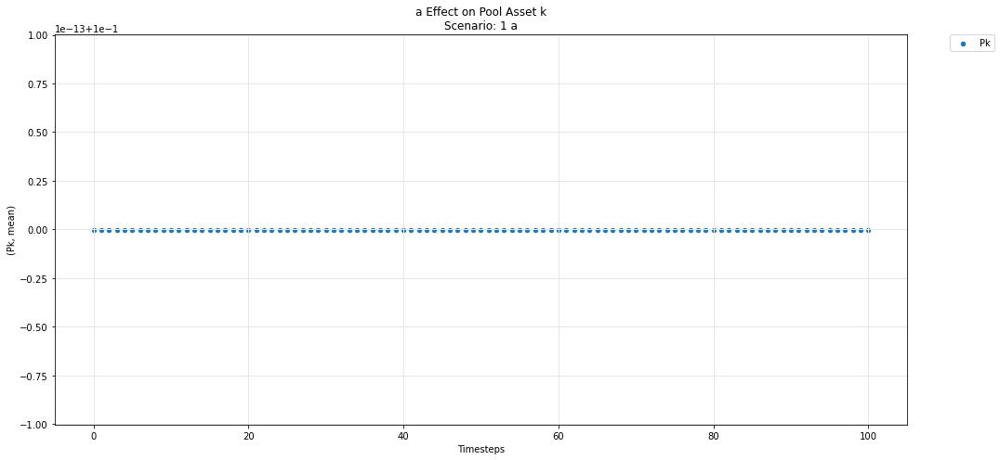

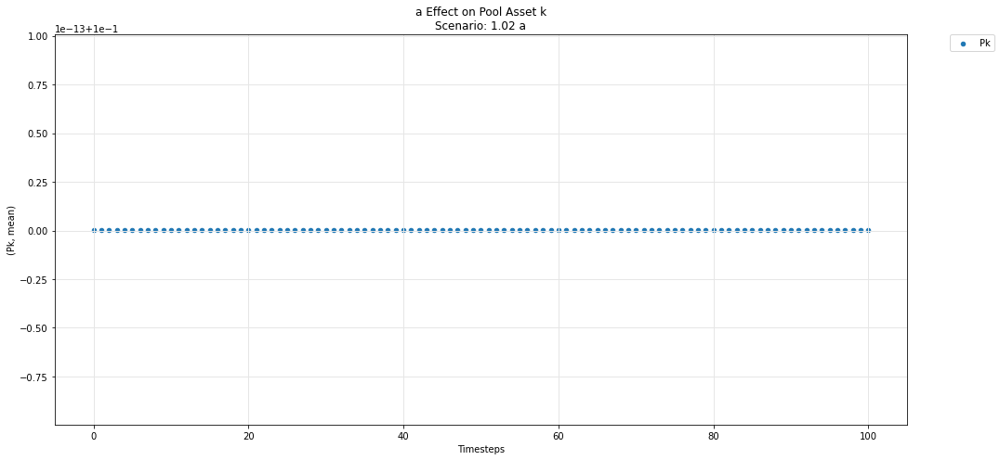

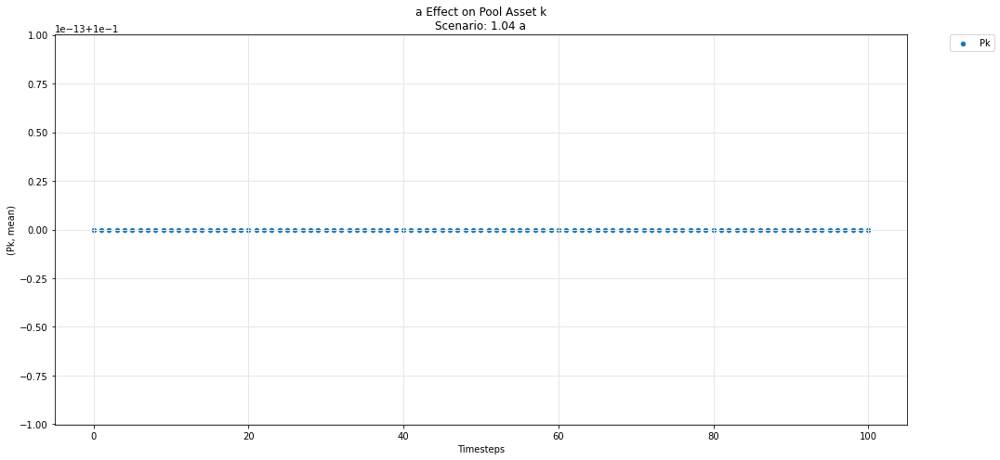

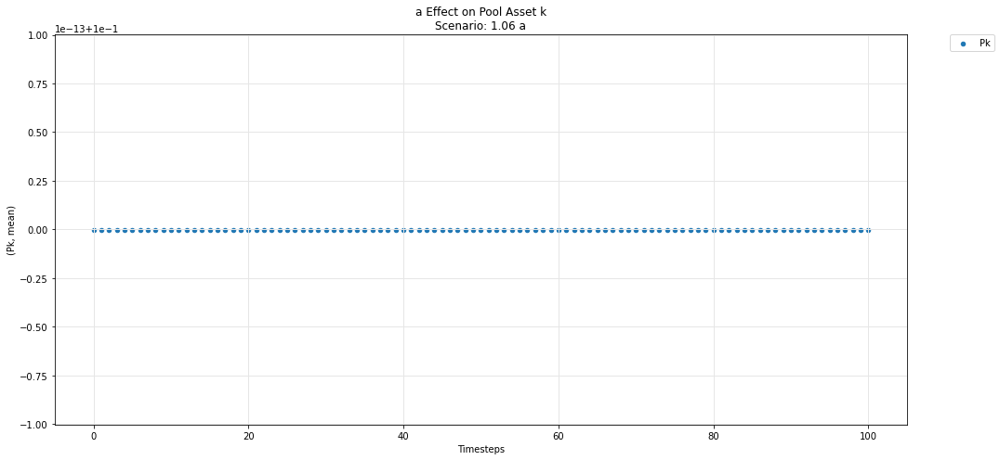

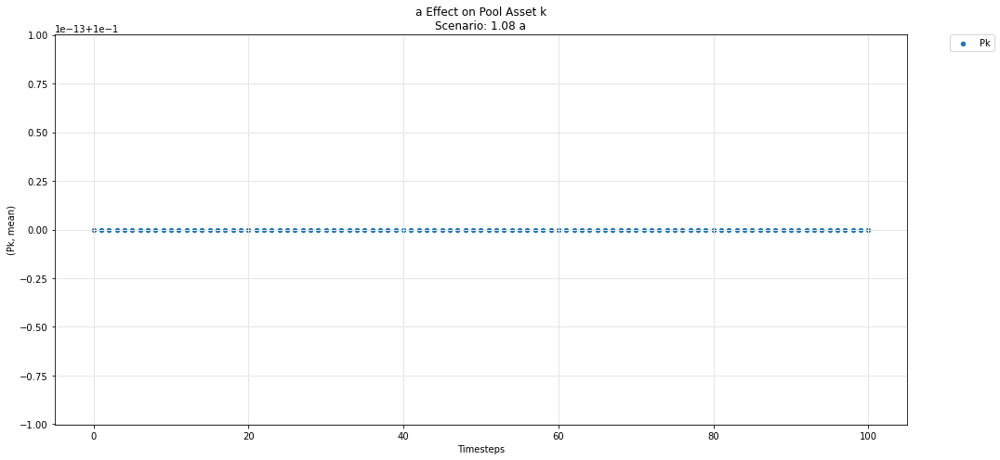

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

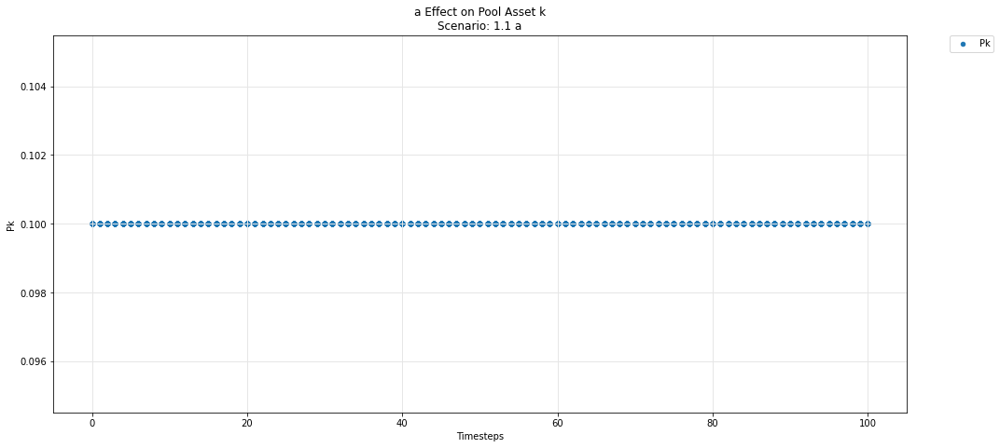

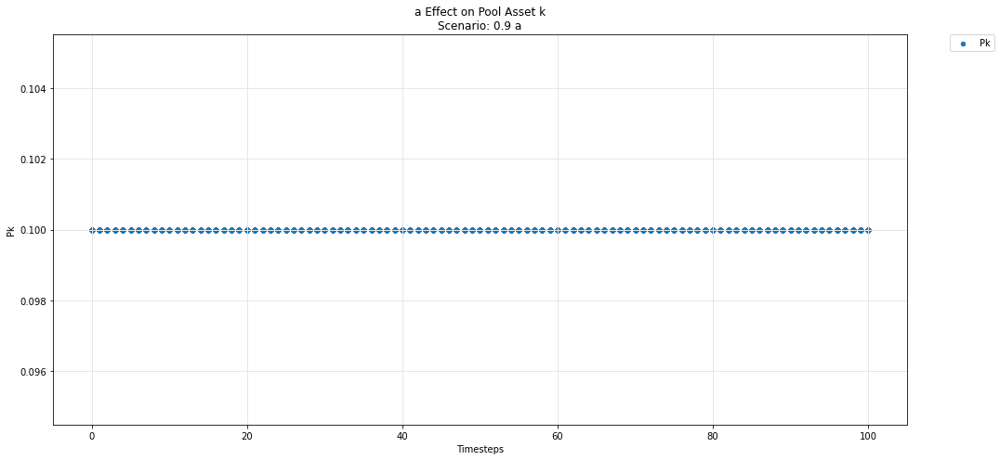

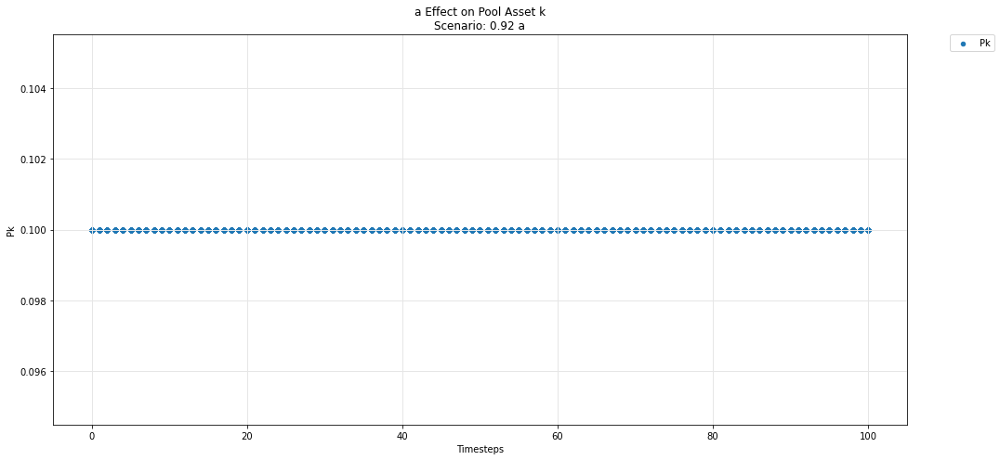

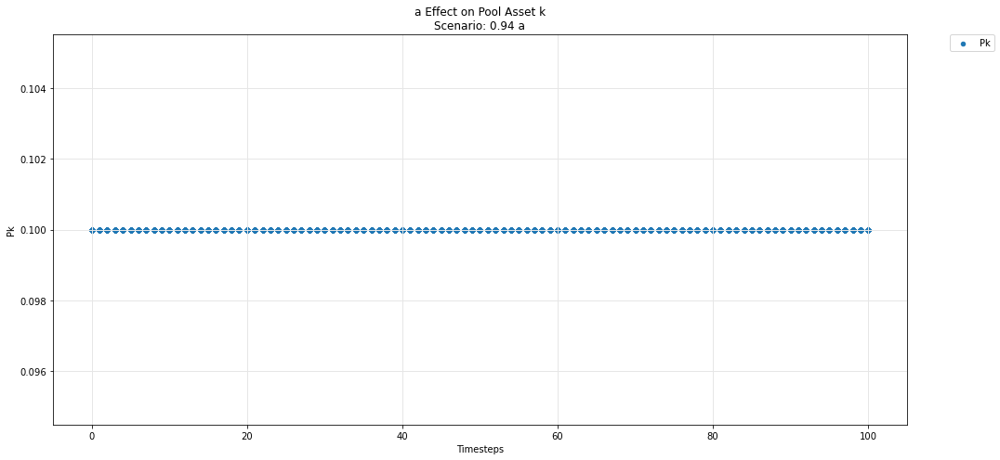

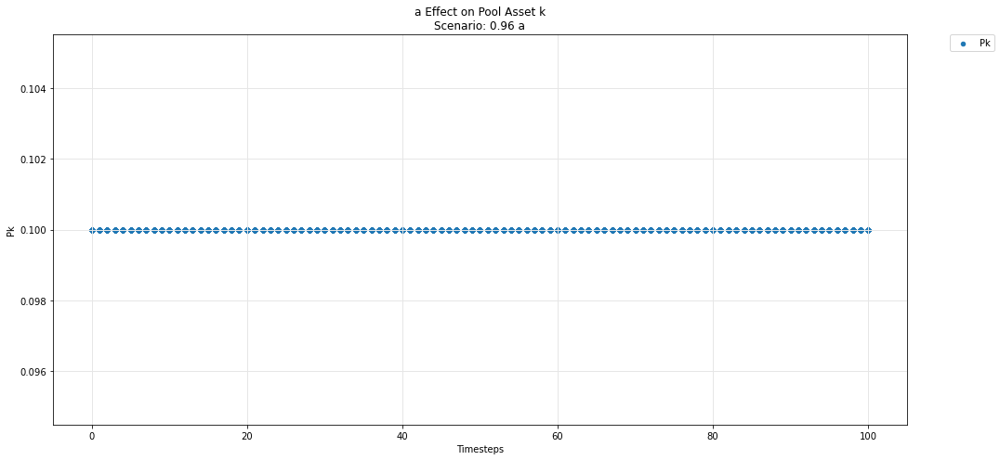

...

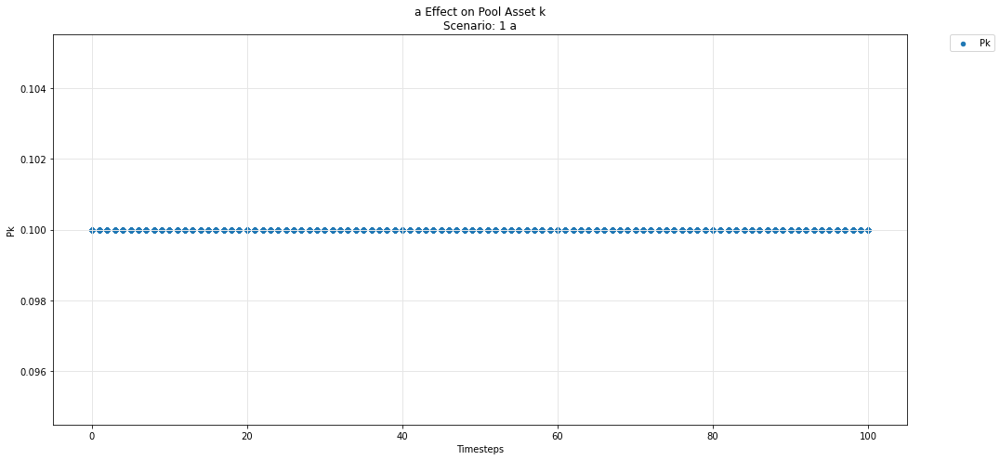

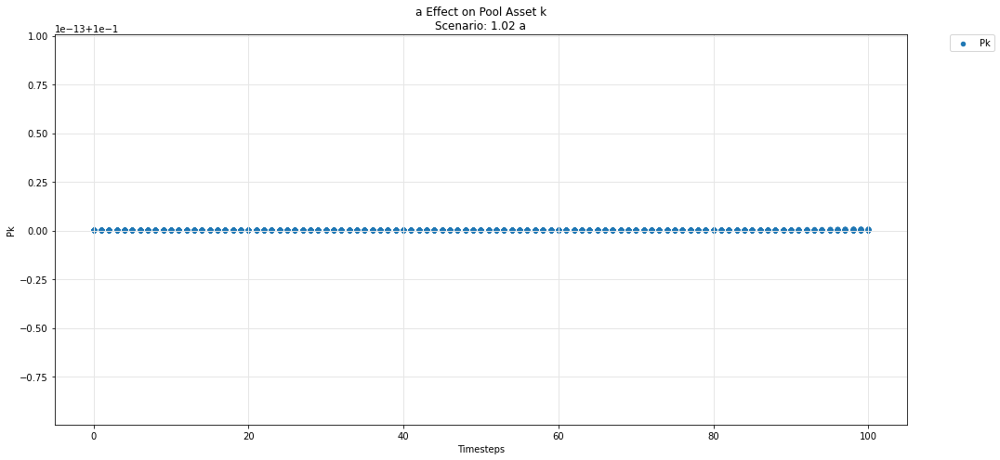

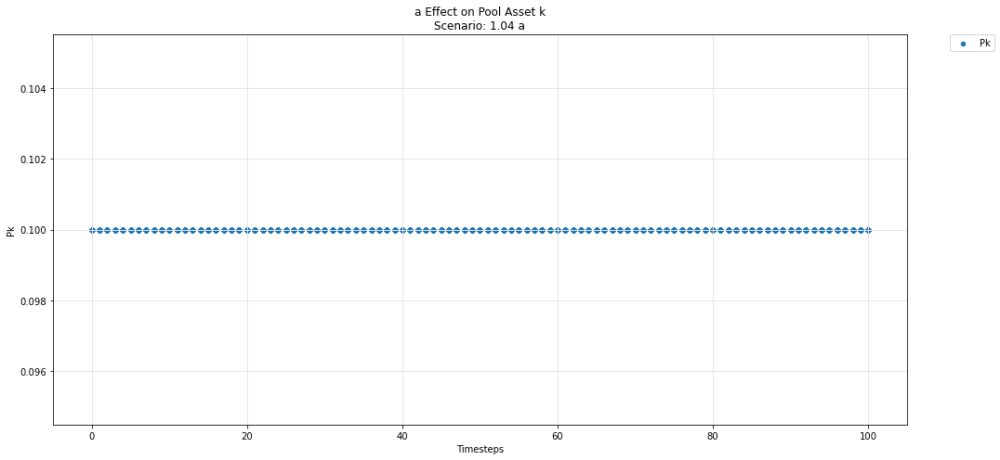

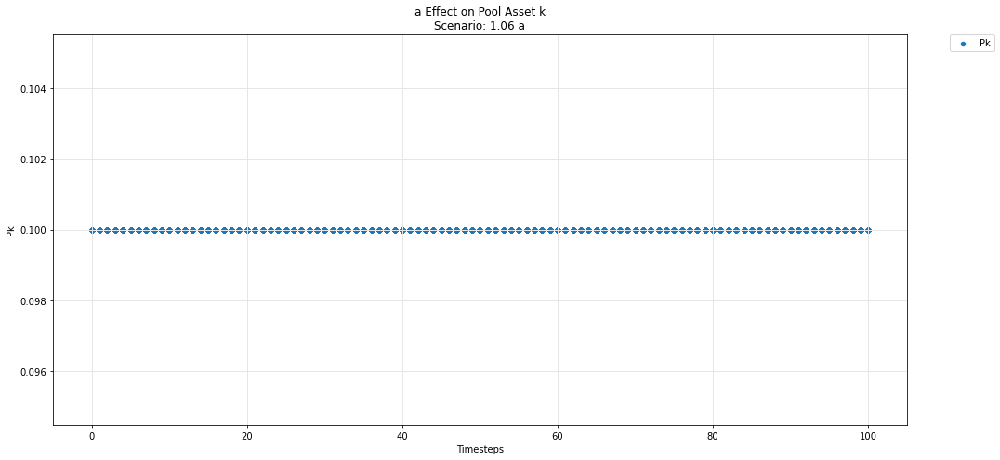

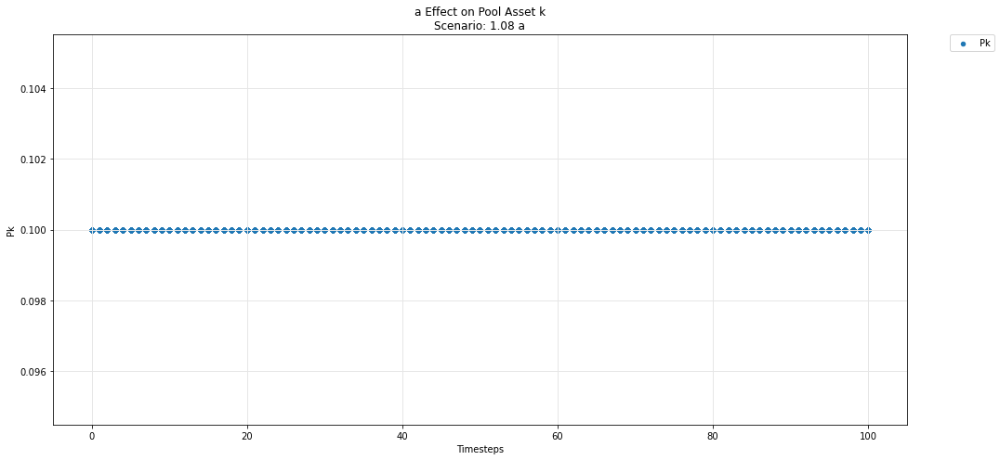

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')